In [2]:
import string
import numpy as np
import igraph
import pandas as pd
import csv
import random
import matplotlib.pyplot as plt
from scipy.spatial.distance import euclidean
from fastdtw import fastdtw
import distance #for lev, hamming , jaccard

#import sys
#np.set_printoptions(threshold=sys.maxsize)

pd.set_option('display.max_colwidth', -1)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)



In [66]:
order1 = ["A", "R", "N", "D", "C", "E", "Q", "G", "H", "I", "L", "K", "M", "F", "P", "S", "T", "W", "Y", "V"] #RANDOM SAMPLE ORDERING
order2 = ["A", "C", "D", "E", "F", "G", "H", "I", "K", "L", "M", "N", "P", "Q", "R", "S", "T", "V", "W", "Y"] #Alphabetical SAMPLE ORDERING, USE YOUR OWN
order3 = ["V", "Y", "T", "W", "P", "E", "C", "G", "R", "L", "I", "N", "M", "S", "H", "F", "K", "D", "Q", "A"] #RANDOM SAMPLE ORDERING

order1_groEL = ["a", "r", "n", "d", "c", "e", "q", "g", "h", "i", "l", "k", "m", "f", "p", "s", "t", "w", "y", "v","x"] #Random sample
order2_groEL = ["a", "c", "d", "e", "f", "g", "h", "i", "k", "l", "m", "n", "p", "q", "r", "s", "t", "v", "w", "x", "y"] #Alphabetical SAMPLE ORDERING
order3_groEL = ["v", "y", "t", "w", "p", "e", "c", "g","x", "r", "l", "i", "n", "m", "s", "h", "f", "k", "d", "q", "a"] #RANDOM SAMPLE ORDERING

In [67]:
vals1= {' ':0} #assign an incremement or decrement to each alphabet letter
id1=-((len(order1)+1)/2)
vals2= {' ':0} #assign an incremement or decrement to each alphabet letter
id2=-((len(order2)+1)/2)
vals3= {' ':0} #assign an incremement or decrement to each alphabet letter
id3=-((len(order3)+1)/2)

vals1_groEL= {' ':0} #assign an incremement or decrement to each alphabet letter
id1_groEL=-((len(order1_groEL)+1)/2)
vals2_groEL= {' ':0} #assign an incremement or decrement to each alphabet letter
id2_groEL=-((len(order2_groEL)+1)/2)
vals3_groEL= {' ':0} #assign an incremement or decrement to each alphabet letter
id3_groEL=-((len(order3_groEL)+1)/2)

vals1

{' ': 0}

In [68]:
# Order 1 Values
for i in order1:    
    if id1 == 0:
        print ("entered this loop")
        vals1[" "]=id1
        id1+=1
        print("exiting")
    vals1[i]=id1
    print (id1)
    id1+=1  
print (vals1)

    
# Order 2 Values
for i in order2:    
    if id2 == 0:
        print ("entered this loop")
        vals2[" "]=id2
        id2+=1
        print("exiting")
    vals2[i]=id2
    print (id2)
    id2+=1   
print (vals2)

# Order 3 Values
for i in order3:    
    if id3 == 0:
        print ("entered this loop")
        vals3[" "]=id3
        id3+=1
        print("exiting")
    vals3[i]=id3
    print (id3)
    id3+=1   
print (vals3)



-10.5
-9.5
-8.5
-7.5
-6.5
-5.5
-4.5
-3.5
-2.5
-1.5
-0.5
0.5
1.5
2.5
3.5
4.5
5.5
6.5
7.5
8.5
{' ': 0, 'A': -10.5, 'R': -9.5, 'N': -8.5, 'D': -7.5, 'C': -6.5, 'E': -5.5, 'Q': -4.5, 'G': -3.5, 'H': -2.5, 'I': -1.5, 'L': -0.5, 'K': 0.5, 'M': 1.5, 'F': 2.5, 'P': 3.5, 'S': 4.5, 'T': 5.5, 'W': 6.5, 'Y': 7.5, 'V': 8.5}
-10.5
-9.5
-8.5
-7.5
-6.5
-5.5
-4.5
-3.5
-2.5
-1.5
-0.5
0.5
1.5
2.5
3.5
4.5
5.5
6.5
7.5
8.5
{' ': 0, 'A': -10.5, 'C': -9.5, 'D': -8.5, 'E': -7.5, 'F': -6.5, 'G': -5.5, 'H': -4.5, 'I': -3.5, 'K': -2.5, 'L': -1.5, 'M': -0.5, 'N': 0.5, 'P': 1.5, 'Q': 2.5, 'R': 3.5, 'S': 4.5, 'T': 5.5, 'V': 6.5, 'W': 7.5, 'Y': 8.5}
-10.5
-9.5
-8.5
-7.5
-6.5
-5.5
-4.5
-3.5
-2.5
-1.5
-0.5
0.5
1.5
2.5
3.5
4.5
5.5
6.5
7.5
8.5
{' ': 0, 'V': -10.5, 'Y': -9.5, 'T': -8.5, 'W': -7.5, 'P': -6.5, 'E': -5.5, 'C': -4.5, 'G': -3.5, 'R': -2.5, 'L': -1.5, 'I': -0.5, 'N': 0.5, 'M': 1.5, 'S': 2.5, 'H': 3.5, 'F': 4.5, 'K': 5.5, 'D': 6.5, 'Q': 7.5, 'A': 8.5}


In [69]:
# Order 1 Values
for i in order1_groEL:    
    if id1_groEL == 0:
        print ("entered this loop")
        vals1_groEL[" "]=id1_groEL
        id1_groEL+=1
        print("exiting")
    vals1_groEL[i]=id1_groEL
    print (id1_groEL)
    id1_groEL+=1  
print (vals1_groEL)

    
# Order 2 Values
for i in order2_groEL:    
    if id2_groEL == 0:
        print ("entered this loop")
        vals2_groEL[" "]=id2_groEL
        id2_groEL+=1
        print("exiting")
    vals2_groEL[i]=id2_groEL
    print (id2_groEL)
    id2_groEL+=1   
print (vals2_groEL)

# Order 3 Values
for i in order3_groEL:    
    if id3_groEL == 0:
        print ("entered this loop")
        vals3_groEL[" "]=id3_groEL
        id3_groEL+=1
        print("exiting")
    vals3_groEL[i]=id3_groEL
    print (id3_groEL)
    id3_groEL+=1   
print (vals3_groEL)



-11.0
-10.0
-9.0
-8.0
-7.0
-6.0
-5.0
-4.0
-3.0
-2.0
-1.0
entered this loop
exiting
1.0
2.0
3.0
4.0
5.0
6.0
7.0
8.0
9.0
10.0
{' ': 0.0, 'a': -11.0, 'r': -10.0, 'n': -9.0, 'd': -8.0, 'c': -7.0, 'e': -6.0, 'q': -5.0, 'g': -4.0, 'h': -3.0, 'i': -2.0, 'l': -1.0, 'k': 1.0, 'm': 2.0, 'f': 3.0, 'p': 4.0, 's': 5.0, 't': 6.0, 'w': 7.0, 'y': 8.0, 'v': 9.0, 'x': 10.0}
-11.0
-10.0
-9.0
-8.0
-7.0
-6.0
-5.0
-4.0
-3.0
-2.0
-1.0
entered this loop
exiting
1.0
2.0
3.0
4.0
5.0
6.0
7.0
8.0
9.0
10.0
{' ': 0.0, 'a': -11.0, 'c': -10.0, 'd': -9.0, 'e': -8.0, 'f': -7.0, 'g': -6.0, 'h': -5.0, 'i': -4.0, 'k': -3.0, 'l': -2.0, 'm': -1.0, 'n': 1.0, 'p': 2.0, 'q': 3.0, 'r': 4.0, 's': 5.0, 't': 6.0, 'v': 7.0, 'w': 8.0, 'x': 9.0, 'y': 10.0}
-11.0
-10.0
-9.0
-8.0
-7.0
-6.0
-5.0
-4.0
-3.0
-2.0
-1.0
entered this loop
exiting
1.0
2.0
3.0
4.0
5.0
6.0
7.0
8.0
9.0
10.0
{' ': 0.0, 'v': -11.0, 'y': -10.0, 't': -9.0, 'w': -8.0, 'p': -7.0, 'e': -6.0, 'c': -5.0, 'g': -4.0, 'x': -3.0, 'r': -2.0, 'l': -1.0, 'i': 1.0, 'n': 2.0, 'm':

In [70]:

#Dump code to declare row

start=0

f = open('data1.csv')
csv_f = csv.reader(f)
with open("dump.txt",'w') as WF:
    for row in csv_f:
        #print (row[1])
        for x in row[1]:
            #print ('x=',x) #printing one letter one by one
            if x in vals1:
                    #print (vals[x]) # converting only the capital letters of the word to a number
                    #print (vals[x],"+",start,"=",start+vals[x]) #printing the added values
                    start+=vals1[x] #adding the converted numbers
            else:
                    #print (start)
                    #print ("entered else:",start ,"+", vals[" "],"=",start+vals[" "]) # handling encounter of other letters 
                    start+=vals1[" "]
            WF.write(str(start)+" ")

### DATA 1 - Converting to time series 1 

In [71]:
#DATA 1 Order 1 Time series 1

f = open('data1.csv')
csv_f = csv.reader(f)

a = []
with open('data1TS1order1.csv','w',newline='') as cf:  #newline='' lets us write without adding an extra line betweeen rows
    for row[1] in csv_f:
        print (row[1])
        for col in csv_f:
                print (col[1])
                d = []
                d.append(0)
                print (d[0])
                count=0
                for x in col[1]:
                    print (x) # letter
                    c = vals1[x]
                    print(c) #vals of letter x
                    a=c+d[count]
                    d.append(a)
                    count+=1
                    
                    #print(a)
                print (d)
                wr = csv.writer(cf,lineterminator='\r')
                wr.writerow(d)

['name', ' sequence', ' source']
DDSSSASGQQQESSVSSQSEASTSSQLG
0
D
-7.5
D
-7.5
S
4.5
S
4.5
S
4.5
A
-10.5
S
4.5
G
-3.5
Q
-4.5
Q
-4.5
Q
-4.5
E
-5.5
S
4.5
S
4.5
V
8.5
S
4.5
S
4.5
Q
-4.5
S
4.5
E
-5.5
A
-10.5
S
4.5
T
5.5
S
4.5
S
4.5
Q
-4.5
L
-0.5
G
-3.5
[0, -7.5, -15.0, -10.5, -6.0, -1.5, -12.0, -7.5, -11.0, -15.5, -20.0, -24.5, -30.0, -25.5, -21.0, -12.5, -8.0, -3.5, -8.0, -3.5, -9.0, -19.5, -15.0, -9.5, -5.0, -0.5, -5.0, -5.5, -9.0]
ADSSSAGGQQQESSVSSQSDQASTSSQLG
0
A
-10.5
D
-7.5
S
4.5
S
4.5
S
4.5
A
-10.5
G
-3.5
G
-3.5
Q
-4.5
Q
-4.5
Q
-4.5
E
-5.5
S
4.5
S
4.5
V
8.5
S
4.5
S
4.5
Q
-4.5
S
4.5
D
-7.5
Q
-4.5
A
-10.5
S
4.5
T
5.5
S
4.5
S
4.5
Q
-4.5
L
-0.5
G
-3.5
[0, -10.5, -18.0, -13.5, -9.0, -4.5, -15.0, -18.5, -22.0, -26.5, -31.0, -35.5, -41.0, -36.5, -32.0, -23.5, -19.0, -14.5, -19.0, -14.5, -22.0, -26.5, -37.0, -32.5, -27.0, -22.5, -18.0, -22.5, -23.0, -26.5]
ADSSSAGGQQQESSVSSQSGQASTSSQLG
0
A
-10.5
D
-7.5
S
4.5
S
4.5
S
4.5
A
-10.5
G
-3.5
G
-3.5
Q
-4.5
Q
-4.5
Q
-4.5
E
-5.5
S
4.5
S
4.5
V
8.5
S
4.

Q
-4.5
A
-10.5
S
4.5
T
5.5
S
4.5
S
4.5
Q
-4.5
S
4.5
G
-3.5
[0, -10.5, -18.0, -13.5, -9.0, -4.5, -15.0, -10.5, -14.0, -18.5, -23.0, -27.5, -33.0, -28.5, -24.0, -15.5, -11.0, -6.5, -11.0, -6.5, -10.0, -14.5, -25.0, -20.5, -15.0, -10.5, -6.0, -10.5, -6.0, -9.5]
TDSSSASGQQQESSVSSQSDQASTSSQLG
0
T
5.5
D
-7.5
S
4.5
S
4.5
S
4.5
A
-10.5
S
4.5
G
-3.5
Q
-4.5
Q
-4.5
Q
-4.5
E
-5.5
S
4.5
S
4.5
V
8.5
S
4.5
S
4.5
Q
-4.5
S
4.5
D
-7.5
Q
-4.5
A
-10.5
S
4.5
T
5.5
S
4.5
S
4.5
Q
-4.5
L
-0.5
G
-3.5
[0, 5.5, -2.0, 2.5, 7.0, 11.5, 1.0, 5.5, 2.0, -2.5, -7.0, -11.5, -17.0, -12.5, -8.0, 0.5, 5.0, 9.5, 5.0, 9.5, 2.0, -2.5, -13.0, -8.5, -3.0, 1.5, 6.0, 1.5, 1.0, -2.5]
SAGGQQQESSVSSQSDQASTSSQLG
0
S
4.5
A
-10.5
G
-3.5
G
-3.5
Q
-4.5
Q
-4.5
Q
-4.5
E
-5.5
S
4.5
S
4.5
V
8.5
S
4.5
S
4.5
Q
-4.5
S
4.5
D
-7.5
Q
-4.5
A
-10.5
S
4.5
T
5.5
S
4.5
S
4.5
Q
-4.5
L
-0.5
G
-3.5
[0, 4.5, -6.0, -9.5, -13.0, -17.5, -22.0, -26.5, -32.0, -27.5, -23.0, -14.5, -10.0, -5.5, -10.0, -5.5, -13.0, -17.5, -28.0, -23.5, -18.0, -13.5, -9.0, -13.5, -

S
4.5
S
4.5
V
8.5
L
-0.5
S
4.5
P
3.5
S
4.5
G
-3.5
Q
-4.5
A
-10.5
S
4.5
T
5.5
S
4.5
S
4.5
Q
-4.5
L
-0.5
S
4.5
[0, -10.5, -18.0, -13.5, -9.0, -4.5, -15.0, -10.5, -14.0, -18.5, -23.0, -27.5, -33.0, -28.5, -24.0, -15.5, -16.0, -11.5, -8.0, -3.5, -7.0, -11.5, -22.0, -17.5, -12.0, -7.5, -3.0, -7.5, -8.0, -3.5]
TDSSSASGQQQKSSVLSQSSQASTSSQLG
0
T
5.5
D
-7.5
S
4.5
S
4.5
S
4.5
A
-10.5
S
4.5
G
-3.5
Q
-4.5
Q
-4.5
Q
-4.5
K
0.5
S
4.5
S
4.5
V
8.5
L
-0.5
S
4.5
Q
-4.5
S
4.5
S
4.5
Q
-4.5
A
-10.5
S
4.5
T
5.5
S
4.5
S
4.5
Q
-4.5
L
-0.5
G
-3.5
[0, 5.5, -2.0, 2.5, 7.0, 11.5, 1.0, 5.5, 2.0, -2.5, -7.0, -11.5, -11.0, -6.5, -2.0, 6.5, 6.0, 10.5, 6.0, 10.5, 15.0, 10.5, 0.0, 4.5, 10.0, 14.5, 19.0, 14.5, 14.0, 10.5]
ADSSSAGNQQQESSVLPQSGQASTSSQLS
0
A
-10.5
D
-7.5
S
4.5
S
4.5
S
4.5
A
-10.5
G
-3.5
N
-8.5
Q
-4.5
Q
-4.5
Q
-4.5
E
-5.5
S
4.5
S
4.5
V
8.5
L
-0.5
P
3.5
Q
-4.5
S
4.5
G
-3.5
Q
-4.5
A
-10.5
S
4.5
T
5.5
S
4.5
S
4.5
Q
-4.5
L
-0.5
S
4.5
[0, -10.5, -18.0, -13.5, -9.0, -4.5, -15.0, -18.5, -27.0, -31.5, -36.0, -40.5, 

-7.5
S
4.5
S
4.5
S
4.5
A
-10.5
S
4.5
G
-3.5
Q
-4.5
Q
-4.5
Q
-4.5
E
-5.5
S
4.5
S
4.5
V
8.5
L
-0.5
P
3.5
Q
-4.5
S
4.5
D
-7.5
Q
-4.5
A
-10.5
S
4.5
T
5.5
S
4.5
S
4.5
Q
-4.5
L
-0.5
G
-3.5
[0, 5.5, -2.0, 2.5, 7.0, 11.5, 1.0, 5.5, 2.0, -2.5, -7.0, -11.5, -17.0, -12.5, -8.0, 0.5, 0.0, 3.5, -1.0, 3.5, -4.0, -8.5, -19.0, -14.5, -9.0, -4.5, 0.0, -4.5, -5.0, -8.5]
TDSSSASGQQQESSVLPQSGQASTSSQLG
0
T
5.5
D
-7.5
S
4.5
S
4.5
S
4.5
A
-10.5
S
4.5
G
-3.5
Q
-4.5
Q
-4.5
Q
-4.5
E
-5.5
S
4.5
S
4.5
V
8.5
L
-0.5
P
3.5
Q
-4.5
S
4.5
G
-3.5
Q
-4.5
A
-10.5
S
4.5
T
5.5
S
4.5
S
4.5
Q
-4.5
L
-0.5
G
-3.5
[0, 5.5, -2.0, 2.5, 7.0, 11.5, 1.0, 5.5, 2.0, -2.5, -7.0, -11.5, -17.0, -12.5, -8.0, 0.5, 0.0, 3.5, -1.0, 3.5, 0.0, -4.5, -15.0, -10.5, -5.0, -0.5, 4.0, -0.5, -1.0, -4.5]
TDSSSAGDQQQESGVSSQSGQASTSSQLG
0
T
5.5
D
-7.5
S
4.5
S
4.5
S
4.5
A
-10.5
G
-3.5
D
-7.5
Q
-4.5
Q
-4.5
Q
-4.5
E
-5.5
S
4.5
G
-3.5
V
8.5
S
4.5
S
4.5
Q
-4.5
S
4.5
G
-3.5
Q
-4.5
A
-10.5
S
4.5
T
5.5
S
4.5
S
4.5
Q
-4.5
L
-0.5
G
-3.5
[0, 5.5, -2.0, 2.5, 7.0, 11

-7.5
S
4.5
S
4.5
S
4.5
A
-10.5
S
4.5
G
-3.5
Q
-4.5
Q
-4.5
Q
-4.5
E
-5.5
S
4.5
S
4.5
V
8.5
L
-0.5
S
4.5
Q
-4.5
S
4.5
G
-3.5
Q
-4.5
A
-10.5
S
4.5
P
3.5
S
4.5
S
4.5
Q
-4.5
L
-0.5
G
-3.5
[0, 5.5, -2.0, 2.5, 7.0, 11.5, 1.0, 5.5, 2.0, -2.5, -7.0, -11.5, -17.0, -12.5, -8.0, 0.5, 0.0, 4.5, 0.0, 4.5, 1.0, -3.5, -14.0, -9.5, -6.0, -1.5, 3.0, -1.5, -2.0, -5.5]
AGRSSASGQQQESSVLSQSGQASTSSQLG
0
A
-10.5
G
-3.5
R
-9.5
S
4.5
S
4.5
A
-10.5
S
4.5
G
-3.5
Q
-4.5
Q
-4.5
Q
-4.5
E
-5.5
S
4.5
S
4.5
V
8.5
L
-0.5
S
4.5
Q
-4.5
S
4.5
G
-3.5
Q
-4.5
A
-10.5
S
4.5
T
5.5
S
4.5
S
4.5
Q
-4.5
L
-0.5
G
-3.5
[0, -10.5, -14.0, -23.5, -19.0, -14.5, -25.0, -20.5, -24.0, -28.5, -33.0, -37.5, -43.0, -38.5, -34.0, -25.5, -26.0, -21.5, -26.0, -21.5, -25.0, -29.5, -40.0, -35.5, -30.0, -25.5, -21.0, -25.5, -26.0, -29.5]
ADGSSAGDQQQESSVSSQSGASPSSQLG
0
A
-10.5
D
-7.5
G
-3.5
S
4.5
S
4.5
A
-10.5
G
-3.5
D
-7.5
Q
-4.5
Q
-4.5
Q
-4.5
E
-5.5
S
4.5
S
4.5
V
8.5
S
4.5
S
4.5
Q
-4.5
S
4.5
G
-3.5
A
-10.5
S
4.5
P
3.5
S
4.5
S
4.5
Q
-4.5
L
-0.5
G
-3

4.5
T
5.5
S
4.5
S
4.5
Q
-4.5
L
-0.5
G
-3.5
[0, 5.5, -2.0, 2.5, 7.0, 11.5, 1.0, 5.5, 2.0, -2.5, -7.0, -11.5, -17.0, -12.5, -16.0, -7.5, -8.0, -3.5, -8.0, -3.5, -7.0, -11.5, -22.0, -17.5, -12.0, -7.5, -3.0, -7.5, -8.0, -11.5]
AGSSSAGGQQQESSVSSQSDQATTSSQLG
0
A
-10.5
G
-3.5
S
4.5
S
4.5
S
4.5
A
-10.5
G
-3.5
G
-3.5
Q
-4.5
Q
-4.5
Q
-4.5
E
-5.5
S
4.5
S
4.5
V
8.5
S
4.5
S
4.5
Q
-4.5
S
4.5
D
-7.5
Q
-4.5
A
-10.5
T
5.5
T
5.5
S
4.5
S
4.5
Q
-4.5
L
-0.5
G
-3.5
[0, -10.5, -14.0, -9.5, -5.0, -0.5, -11.0, -14.5, -18.0, -22.5, -27.0, -31.5, -37.0, -32.5, -28.0, -19.5, -15.0, -10.5, -15.0, -10.5, -18.0, -22.5, -33.0, -27.5, -22.0, -17.5, -13.0, -17.5, -18.0, -21.5]
ADSSSAGGQQQESSVSSQSDQANTSSHLG
0
A
-10.5
D
-7.5
S
4.5
S
4.5
S
4.5
A
-10.5
G
-3.5
G
-3.5
Q
-4.5
Q
-4.5
Q
-4.5
E
-5.5
S
4.5
S
4.5
V
8.5
S
4.5
S
4.5
Q
-4.5
S
4.5
D
-7.5
Q
-4.5
A
-10.5
N
-8.5
T
5.5
S
4.5
S
4.5
H
-2.5
L
-0.5
G
-3.5
[0, -10.5, -18.0, -13.5, -9.0, -4.5, -15.0, -18.5, -22.0, -26.5, -31.0, -35.5, -41.0, -36.5, -32.0, -23.5, -19.0, -14.5, 

-0.5
L
-0.5
T
5.5
[0, -7.5, -15.0, -10.5, -6.0, -16.5, -12.0, -15.5, -19.0, -23.5, -28.0, -32.5, -28.0, -23.5, -15.0, -25.5, -21.0, -17.5, -13.0, -16.5, -24.0, -34.5, -45.0, -39.5, -35.0, -30.5, -27.0, -27.5, -28.0, -22.5]
ADSSSSGDQQQNSVASPSDDAATSSHLWT
0
A
-10.5
D
-7.5
S
4.5
S
4.5
S
4.5
S
4.5
G
-3.5
D
-7.5
Q
-4.5
Q
-4.5
Q
-4.5
N
-8.5
S
4.5
V
8.5
A
-10.5
S
4.5
P
3.5
S
4.5
D
-7.5
D
-7.5
A
-10.5
A
-10.5
T
5.5
S
4.5
S
4.5
H
-2.5
L
-0.5
W
6.5
T
5.5
[0, -10.5, -18.0, -13.5, -9.0, -4.5, 0.0, -3.5, -11.0, -15.5, -20.0, -24.5, -33.0, -28.5, -20.0, -30.5, -26.0, -22.5, -18.0, -25.5, -33.0, -43.5, -54.0, -48.5, -44.0, -39.5, -42.0, -42.5, -36.0, -30.5]
DDSSSTGDQQQSSVVSPSDDAARSSQLWT
0
D
-7.5
D
-7.5
S
4.5
S
4.5
S
4.5
T
5.5
G
-3.5
D
-7.5
Q
-4.5
Q
-4.5
Q
-4.5
S
4.5
S
4.5
V
8.5
V
8.5
S
4.5
P
3.5
S
4.5
D
-7.5
D
-7.5
A
-10.5
A
-10.5
R
-9.5
S
4.5
S
4.5
Q
-4.5
L
-0.5
W
6.5
T
5.5
[0, -7.5, -15.0, -10.5, -6.0, -1.5, 4.0, 0.5, -7.0, -11.5, -16.0, -20.5, -16.0, -11.5, -3.0, 5.5, 10.0, 13.5, 18.0, 10.5, 3.0, -

4.5
S
4.5
A
-10.5
G
-3.5
D
-7.5
R
-9.5
Q
-4.5
Q
-4.5
E
-5.5
S
4.5
G
-3.5
V
8.5
S
4.5
S
4.5
Q
-4.5
S
4.5
G
-3.5
Q
-4.5
A
-10.5
S
4.5
T
5.5
S
4.5
S
4.5
Q
-4.5
L
-0.5
G
-3.5
[0, -10.5, -18.0, -13.5, -9.0, -4.5, -15.0, -18.5, -26.0, -35.5, -40.0, -44.5, -50.0, -45.5, -49.0, -40.5, -36.0, -31.5, -36.0, -31.5, -35.0, -39.5, -50.0, -45.5, -40.0, -35.5, -31.0, -35.5, -36.0, -39.5]
TDSSSASGQKQESSVLSQSDQASTSSQLG
0
T
5.5
D
-7.5
S
4.5
S
4.5
S
4.5
A
-10.5
S
4.5
G
-3.5
Q
-4.5
K
0.5
Q
-4.5
E
-5.5
S
4.5
S
4.5
V
8.5
L
-0.5
S
4.5
Q
-4.5
S
4.5
D
-7.5
Q
-4.5
A
-10.5
S
4.5
T
5.5
S
4.5
S
4.5
Q
-4.5
L
-0.5
G
-3.5
[0, 5.5, -2.0, 2.5, 7.0, 11.5, 1.0, 5.5, 2.0, -2.5, -2.0, -6.5, -12.0, -7.5, -3.0, 5.5, 5.0, 9.5, 5.0, 9.5, 2.0, -2.5, -13.0, -8.5, -3.0, 1.5, 6.0, 1.5, 1.0, -2.5]
ADSSSASGQQQDSSVLSQGDQASTSSQLG
0
A
-10.5
D
-7.5
S
4.5
S
4.5
S
4.5
A
-10.5
S
4.5
G
-3.5
Q
-4.5
Q
-4.5
Q
-4.5
D
-7.5
S
4.5
S
4.5
V
8.5
L
-0.5
S
4.5
Q
-4.5
G
-3.5
D
-7.5
Q
-4.5
A
-10.5
S
4.5
T
5.5
S
4.5
S
4.5
Q
-4.5
L
-0.5
G
-3.5
[0, -10.5, -

In [72]:
##DATA 1 Order 1 Time series 1
# converting to array of list
length = 0
mlist1 = []
for line in open("data1TS1order1.csv"):
        reader_file = csv.reader(open("data1TS1order1.csv"))
        length_of_file = len(list(reader_file))
        x = line.split(',')
        y = []
        for i in range(len(x)):
            y.append(float(x[i]))
            #mlist.append(float(x[i]))
        mlist1.append(y)
        length = max(length, len(y))
        arr1_Order1_TS1 = np.array(mlist1)
        

In [73]:
##DATA 1 Order 1 Time series 1
#padding
pad_arr1_Order1_TS1 = []
for i in range(0,len(arr1_Order1_TS1)):
    abc = np.array(mlist1[i])
    a_padded = np.pad(abc,(0,length-len(mlist1[i])),'constant')
    #a_stack = np.stack(a_padded, axis=0)
    #arr_of_arr = np.append(arr_of_arr,a_padded,axis = 0) # contains a 1D array with all the values.
    #ar_splited = np.split(arr_of_arr,[length]*i)
    pad_arr1_Order1_TS1.append(a_padded)

    
print (pad_arr1_Order1_TS1) 


[array([  0. ,  -7.5, -15. , -10.5,  -6. ,  -1.5, -12. ,  -7.5, -11. ,
       -15.5, -20. , -24.5, -30. , -25.5, -21. , -12.5,  -8. ,  -3.5,
        -8. ,  -3.5,  -9. , -19.5, -15. ,  -9.5,  -5. ,  -0.5,  -5. ,
        -5.5,  -9. ,   0. ,   0. ,   0. ]), array([  0. , -10.5, -18. , -13.5,  -9. ,  -4.5, -15. , -18.5, -22. ,
       -26.5, -31. , -35.5, -41. , -36.5, -32. , -23.5, -19. , -14.5,
       -19. , -14.5, -22. , -26.5, -37. , -32.5, -27. , -22.5, -18. ,
       -22.5, -23. , -26.5,   0. ,   0. ]), array([  0. , -10.5, -18. , -13.5,  -9. ,  -4.5, -15. , -18.5, -22. ,
       -26.5, -31. , -35.5, -41. , -36.5, -32. , -23.5, -19. , -14.5,
       -19. , -14.5, -18. , -22.5, -33. , -28.5, -23. , -18.5, -14. ,
       -18.5, -19. , -22.5,   0. ,   0. ]), array([  0. , -10.5, -18. , -13.5,  -9. ,  -4.5, -15. , -10.5, -14. ,
       -18.5, -23. , -27.5, -33. , -28.5, -24. , -15.5, -11. ,  -6.5,
       -11. ,  -6.5, -12. , -22.5, -18. , -12.5,  -8. ,  -3.5,  -8. ,
        -8.5, -12. , -15.5,

In [74]:
pad_arr1_Order1_TS1

[array([  0. ,  -7.5, -15. , -10.5,  -6. ,  -1.5, -12. ,  -7.5, -11. ,
        -15.5, -20. , -24.5, -30. , -25.5, -21. , -12.5,  -8. ,  -3.5,
         -8. ,  -3.5,  -9. , -19.5, -15. ,  -9.5,  -5. ,  -0.5,  -5. ,
         -5.5,  -9. ,   0. ,   0. ,   0. ]),
 array([  0. , -10.5, -18. , -13.5,  -9. ,  -4.5, -15. , -18.5, -22. ,
        -26.5, -31. , -35.5, -41. , -36.5, -32. , -23.5, -19. , -14.5,
        -19. , -14.5, -22. , -26.5, -37. , -32.5, -27. , -22.5, -18. ,
        -22.5, -23. , -26.5,   0. ,   0. ]),
 array([  0. , -10.5, -18. , -13.5,  -9. ,  -4.5, -15. , -18.5, -22. ,
        -26.5, -31. , -35.5, -41. , -36.5, -32. , -23.5, -19. , -14.5,
        -19. , -14.5, -18. , -22.5, -33. , -28.5, -23. , -18.5, -14. ,
        -18.5, -19. , -22.5,   0. ,   0. ]),
 array([  0. , -10.5, -18. , -13.5,  -9. ,  -4.5, -15. , -10.5, -14. ,
        -18.5, -23. , -27.5, -33. , -28.5, -24. , -15.5, -11. ,  -6.5,
        -11. ,  -6.5, -12. , -22.5, -18. , -12.5,  -8. ,  -3.5,  -8. ,
         -8.5

In [75]:
#DATA 1 Order 2 Time series 1

f = open('data1.csv')
csv_f = csv.reader(f)

a = []
with open('data1TS1order2.csv','w',newline='') as cf:  #newline='' lets us write without adding an extra line betweeen rows
    for row[1] in csv_f:
        print (row[1])
        for col in csv_f:
                print (col[1])
                d = []
                d.append(0)
                print (d[0])
                count=0
                for x in col[1]:
                    print (x) # letter
                    c = vals2[x]
                    print(c) #vals of letter x
                    a=c+d[count]
                    d.append(a)
                    count+=1
                    
                    #print(a)
                print (d)
                wr = csv.writer(cf,lineterminator='\r')
                wr.writerow(d)

['name', ' sequence', ' source']
DDSSSASGQQQESSVSSQSEASTSSQLG
0
D
-8.5
D
-8.5
S
4.5
S
4.5
S
4.5
A
-10.5
S
4.5
G
-5.5
Q
2.5
Q
2.5
Q
2.5
E
-7.5
S
4.5
S
4.5
V
6.5
S
4.5
S
4.5
Q
2.5
S
4.5
E
-7.5
A
-10.5
S
4.5
T
5.5
S
4.5
S
4.5
Q
2.5
L
-1.5
G
-5.5
[0, -8.5, -17.0, -12.5, -8.0, -3.5, -14.0, -9.5, -15.0, -12.5, -10.0, -7.5, -15.0, -10.5, -6.0, 0.5, 5.0, 9.5, 12.0, 16.5, 9.0, -1.5, 3.0, 8.5, 13.0, 17.5, 20.0, 18.5, 13.0]
ADSSSAGGQQQESSVSSQSDQASTSSQLG
0
A
-10.5
D
-8.5
S
4.5
S
4.5
S
4.5
A
-10.5
G
-5.5
G
-5.5
Q
2.5
Q
2.5
Q
2.5
E
-7.5
S
4.5
S
4.5
V
6.5
S
4.5
S
4.5
Q
2.5
S
4.5
D
-8.5
Q
2.5
A
-10.5
S
4.5
T
5.5
S
4.5
S
4.5
Q
2.5
L
-1.5
G
-5.5
[0, -10.5, -19.0, -14.5, -10.0, -5.5, -16.0, -21.5, -27.0, -24.5, -22.0, -19.5, -27.0, -22.5, -18.0, -11.5, -7.0, -2.5, 0.0, 4.5, -4.0, -1.5, -12.0, -7.5, -2.0, 2.5, 7.0, 9.5, 8.0, 2.5]
ADSSSAGGQQQESSVSSQSGQASTSSQLG
0
A
-10.5
D
-8.5
S
4.5
S
4.5
S
4.5
A
-10.5
G
-5.5
G
-5.5
Q
2.5
Q
2.5
Q
2.5
E
-7.5
S
4.5
S
4.5
V
6.5
S
4.5
S
4.5
Q
2.5
S
4.5
G
-5.5
Q
2.5
A
-10.5
S
4

-8.5
D
-8.5
S
4.5
S
4.5
S
4.5
A
-10.5
S
4.5
G
-5.5
Q
2.5
Q
2.5
Q
2.5
E
-7.5
S
4.5
S
4.5
V
6.5
S
4.5
S
4.5
Q
2.5
S
4.5
D
-8.5
Q
2.5
A
-10.5
S
4.5
T
5.5
S
4.5
S
4.5
Q
2.5
L
-1.5
G
-5.5
[0, -8.5, -17.0, -12.5, -8.0, -3.5, -14.0, -9.5, -15.0, -12.5, -10.0, -7.5, -15.0, -10.5, -6.0, 0.5, 5.0, 9.5, 12.0, 16.5, 8.0, 10.5, 0.0, 4.5, 10.0, 14.5, 19.0, 21.5, 20.0, 14.5]
ADSSSAGGQQESSVSSQSDQASTSSQLG
0
A
-10.5
D
-8.5
S
4.5
S
4.5
S
4.5
A
-10.5
G
-5.5
G
-5.5
Q
2.5
Q
2.5
E
-7.5
S
4.5
S
4.5
V
6.5
S
4.5
S
4.5
Q
2.5
S
4.5
D
-8.5
Q
2.5
A
-10.5
S
4.5
T
5.5
S
4.5
S
4.5
Q
2.5
L
-1.5
G
-5.5
[0, -10.5, -19.0, -14.5, -10.0, -5.5, -16.0, -21.5, -27.0, -24.5, -22.0, -29.5, -25.0, -20.5, -14.0, -9.5, -5.0, -2.5, 2.0, -6.5, -4.0, -14.5, -10.0, -4.5, 0.0, 4.5, 7.0, 5.5, 0.0]
TDSSSASGQQQESSVSSQSGQASTSSQSR
0
T
5.5
D
-8.5
S
4.5
S
4.5
S
4.5
A
-10.5
S
4.5
G
-5.5
Q
2.5
Q
2.5
Q
2.5
E
-7.5
S
4.5
S
4.5
V
6.5
S
4.5
S
4.5
Q
2.5
S
4.5
G
-5.5
Q
2.5
A
-10.5
S
4.5
T
5.5
S
4.5
S
4.5
Q
2.5
S
4.5
R
3.5
[0, 5.5, -3.0, 1.5, 6.0, 10.5,

S
4.5
Q
2.5
A
-10.5
S
4.5
T
5.5
S
4.5
S
4.5
Q
2.5
L
-1.5
G
-5.5
[0, -10.5, -19.0, -14.5, -10.0, -5.5, -16.0, -11.5, -17.0, -14.5, -12.0, -9.5, -12.0, -7.5, -3.0, 3.5, 2.0, 6.5, 9.0, 13.5, 18.0, 20.5, 10.0, 14.5, 20.0, 24.5, 29.0, 31.5, 30.0, 24.5]
TDSSSAGGQQQESSVSSQSGQASTSSQLG
0
T
5.5
D
-8.5
S
4.5
S
4.5
S
4.5
A
-10.5
G
-5.5
G
-5.5
Q
2.5
Q
2.5
Q
2.5
E
-7.5
S
4.5
S
4.5
V
6.5
S
4.5
S
4.5
Q
2.5
S
4.5
G
-5.5
Q
2.5
A
-10.5
S
4.5
T
5.5
S
4.5
S
4.5
Q
2.5
L
-1.5
G
-5.5
[0, 5.5, -3.0, 1.5, 6.0, 10.5, 0.0, -5.5, -11.0, -8.5, -6.0, -3.5, -11.0, -6.5, -2.0, 4.5, 9.0, 13.5, 16.0, 20.5, 15.0, 17.5, 7.0, 11.5, 17.0, 21.5, 26.0, 28.5, 27.0, 21.5]
ADSSSAGDQQQESSVSSQSDQASTSSQLG
0
A
-10.5
D
-8.5
S
4.5
S
4.5
S
4.5
A
-10.5
G
-5.5
D
-8.5
Q
2.5
Q
2.5
Q
2.5
E
-7.5
S
4.5
S
4.5
V
6.5
S
4.5
S
4.5
Q
2.5
S
4.5
D
-8.5
Q
2.5
A
-10.5
S
4.5
T
5.5
S
4.5
S
4.5
Q
2.5
L
-1.5
G
-5.5
[0, -10.5, -19.0, -14.5, -10.0, -5.5, -16.0, -21.5, -30.0, -27.5, -25.0, -22.5, -30.0, -25.5, -21.0, -14.5, -10.0, -5.5, -3.0, 1.5, -7.0, -4.5,

4.5
Q
2.5
S
4.5
G
-5.5
[0, -10.5, -19.0, -14.5, -10.0, -5.5, -16.0, -11.5, -17.0, -14.5, -12.0, -9.5, -17.0, -12.5, -8.0, -1.5, -3.0, 1.5, 3.0, 7.5, 2.0, 4.5, -6.0, -1.5, 4.0, 8.5, 13.0, 15.5, 20.0, 14.5]
TDGSSASGQQQESSVLSPSGQASTSSQLGVG
0
T
5.5
D
-8.5
G
-5.5
S
4.5
S
4.5
A
-10.5
S
4.5
G
-5.5
Q
2.5
Q
2.5
Q
2.5
E
-7.5
S
4.5
S
4.5
V
6.5
L
-1.5
S
4.5
P
1.5
S
4.5
G
-5.5
Q
2.5
A
-10.5
S
4.5
T
5.5
S
4.5
S
4.5
Q
2.5
L
-1.5
G
-5.5
V
6.5
G
-5.5
[0, 5.5, -3.0, -8.5, -4.0, 0.5, -10.0, -5.5, -11.0, -8.5, -6.0, -3.5, -11.0, -6.5, -2.0, 4.5, 3.0, 7.5, 9.0, 13.5, 8.0, 10.5, 0.0, 4.5, 10.0, 14.5, 19.0, 21.5, 20.0, 14.5, 21.0, 15.5]
TDGSSAGDQQQGSGVSSQSGQASTSSQLG
0
T
5.5
D
-8.5
G
-5.5
S
4.5
S
4.5
A
-10.5
G
-5.5
D
-8.5
Q
2.5
Q
2.5
Q
2.5
G
-5.5
S
4.5
G
-5.5
V
6.5
S
4.5
S
4.5
Q
2.5
S
4.5
G
-5.5
Q
2.5
A
-10.5
S
4.5
T
5.5
S
4.5
S
4.5
Q
2.5
L
-1.5
G
-5.5
[0, 5.5, -3.0, -8.5, -4.0, 0.5, -10.0, -15.5, -24.0, -21.5, -19.0, -16.5, -22.0, -17.5, -23.0, -16.5, -12.0, -7.5, -5.0, -0.5, -6.0, -3.5, -14.0, -9.5, -4.0, 0

E
-7.5
S
4.5
S
4.5
V
6.5
L
-1.5
S
4.5
Q
2.5
S
4.5
D
-8.5
L
-1.5
S
4.5
S
4.5
T
5.5
W
7.5
S
4.5
Q
2.5
L
-1.5
G
-5.5
[0, -10.5, -19.0, -14.5, -10.0, -5.5, -16.0, -11.5, -17.0, -14.5, -12.0, -9.5, -17.0, -12.5, -8.0, -1.5, -3.0, 1.5, 4.0, 8.5, 0.0, -1.5, 3.0, 7.5, 13.0, 20.5, 25.0, 27.5, 26.0, 20.5]
TDSSSASGQQQESGVLSQSGQASTSSQSG
0
T
5.5
D
-8.5
S
4.5
S
4.5
S
4.5
A
-10.5
S
4.5
G
-5.5
Q
2.5
Q
2.5
Q
2.5
E
-7.5
S
4.5
G
-5.5
V
6.5
L
-1.5
S
4.5
Q
2.5
S
4.5
G
-5.5
Q
2.5
A
-10.5
S
4.5
T
5.5
S
4.5
S
4.5
Q
2.5
S
4.5
G
-5.5
[0, 5.5, -3.0, 1.5, 6.0, 10.5, 0.0, 4.5, -1.0, 1.5, 4.0, 6.5, -1.0, 3.5, -2.0, 4.5, 3.0, 7.5, 10.0, 14.5, 9.0, 11.5, 1.0, 5.5, 11.0, 15.5, 20.0, 22.5, 27.0, 21.5]
ADSSSAGNQQQESSVSSQSGASTSSQLG
0
A
-10.5
D
-8.5
S
4.5
S
4.5
S
4.5
A
-10.5
G
-5.5
N
0.5
Q
2.5
Q
2.5
Q
2.5
E
-7.5
S
4.5
S
4.5
V
6.5
S
4.5
S
4.5
Q
2.5
S
4.5
G
-5.5
A
-10.5
S
4.5
T
5.5
S
4.5
S
4.5
Q
2.5
L
-1.5
G
-5.5
[0, -10.5, -19.0, -14.5, -10.0, -5.5, -16.0, -21.5, -21.0, -18.5, -16.0, -13.5, -21.0, -16.5, -12.0, -5.5, -1.0,

Q
2.5
A
-10.5
S
4.5
T
5.5
S
4.5
S
4.5
Q
2.5
S
4.5
R
3.5
[0, 5.5, -3.0, 1.5, 6.0, 10.5, 0.0, 4.5, -1.0, 2.5, 5.0, 7.5, 0.0, 4.5, 9.0, 15.5, 14.0, 18.5, 21.0, 25.5, 17.0, 19.5, 9.0, 13.5, 19.0, 23.5, 28.0, 30.5, 35.0, 38.5]
TDSSSASGQQQESSVLSQSDQACTSSQLG
0
T
5.5
D
-8.5
S
4.5
S
4.5
S
4.5
A
-10.5
S
4.5
G
-5.5
Q
2.5
Q
2.5
Q
2.5
E
-7.5
S
4.5
S
4.5
V
6.5
L
-1.5
S
4.5
Q
2.5
S
4.5
D
-8.5
Q
2.5
A
-10.5
C
-9.5
T
5.5
S
4.5
S
4.5
Q
2.5
L
-1.5
G
-5.5
[0, 5.5, -3.0, 1.5, 6.0, 10.5, 0.0, 4.5, -1.0, 1.5, 4.0, 6.5, -1.0, 3.5, 8.0, 14.5, 13.0, 17.5, 20.0, 24.5, 16.0, 18.5, 8.0, -1.5, 4.0, 8.5, 13.0, 15.5, 14.0, 8.5]
TDSSSASGQQRESSVLSQSDQASTSSQLG
0
T
5.5
D
-8.5
S
4.5
S
4.5
S
4.5
A
-10.5
S
4.5
G
-5.5
Q
2.5
Q
2.5
R
3.5
E
-7.5
S
4.5
S
4.5
V
6.5
L
-1.5
S
4.5
Q
2.5
S
4.5
D
-8.5
Q
2.5
A
-10.5
S
4.5
T
5.5
S
4.5
S
4.5
Q
2.5
L
-1.5
G
-5.5
[0, 5.5, -3.0, 1.5, 6.0, 10.5, 0.0, 4.5, -1.0, 1.5, 4.0, 7.5, 0.0, 4.5, 9.0, 15.5, 14.0, 18.5, 21.0, 25.5, 17.0, 19.5, 9.0, 13.5, 19.0, 23.5, 28.0, 30.5, 29.0, 23.5]
TDSSSAGDHQQGS

S
4.5
S
4.5
S
4.5
A
-10.5
S
4.5
G
-5.5
Q
2.5
Q
2.5
Q
2.5
E
-7.5
S
4.5
G
-5.5
V
6.5
L
-1.5
S
4.5
Q
2.5
S
4.5
G
-5.5
Q
2.5
A
-10.5
S
4.5
T
5.5
S
4.5
S
4.5
Q
2.5
L
-1.5
R
3.5
[0, -10.5, -19.0, -14.5, -10.0, -5.5, -16.0, -11.5, -17.0, -14.5, -12.0, -9.5, -17.0, -12.5, -18.0, -11.5, -13.0, -8.5, -6.0, -1.5, -7.0, -4.5, -15.0, -10.5, -5.0, -0.5, 4.0, 6.5, 5.0, 8.5]
TDSSSASGQQQESGVLSQSGQASTSSQLR
0
T
5.5
D
-8.5
S
4.5
S
4.5
S
4.5
A
-10.5
S
4.5
G
-5.5
Q
2.5
Q
2.5
Q
2.5
E
-7.5
S
4.5
G
-5.5
V
6.5
L
-1.5
S
4.5
Q
2.5
S
4.5
G
-5.5
Q
2.5
A
-10.5
S
4.5
T
5.5
S
4.5
S
4.5
Q
2.5
L
-1.5
R
3.5
[0, 5.5, -3.0, 1.5, 6.0, 10.5, 0.0, 4.5, -1.0, 1.5, 4.0, 6.5, -1.0, 3.5, -2.0, 4.5, 3.0, 7.5, 10.0, 14.5, 9.0, 11.5, 1.0, 5.5, 11.0, 15.5, 20.0, 22.5, 21.0, 24.5]
TDSSSASGQQQESSVLPQSGHARTSSQSG
0
T
5.5
D
-8.5
S
4.5
S
4.5
S
4.5
A
-10.5
S
4.5
G
-5.5
Q
2.5
Q
2.5
Q
2.5
E
-7.5
S
4.5
S
4.5
V
6.5
L
-1.5
P
1.5
Q
2.5
S
4.5
G
-5.5
H
-4.5
A
-10.5
R
3.5
T
5.5
S
4.5
S
4.5
Q
2.5
S
4.5
G
-5.5
[0, 5.5, -3.0, 1.5, 6.0, 10.5, 0.0, 4.5, 

S
4.5
G
-5.5
V
6.5
S
4.5
S
4.5
Q
2.5
S
4.5
G
-5.5
Q
2.5
A
-10.5
S
4.5
T
5.5
S
4.5
S
4.5
Q
2.5
L
-1.5
G
-5.5
[0, -10.5, -19.0, -14.5, -10.0, -5.5, -16.0, -21.5, -30.0, -26.5, -24.0, -21.5, -29.0, -24.5, -30.0, -23.5, -19.0, -14.5, -12.0, -7.5, -13.0, -10.5, -21.0, -16.5, -11.0, -6.5, -2.0, 0.5, -1.0, -6.5]
TDSSSASGQKQESSVLSQSDQASTSSQLG
0
T
5.5
D
-8.5
S
4.5
S
4.5
S
4.5
A
-10.5
S
4.5
G
-5.5
Q
2.5
K
-2.5
Q
2.5
E
-7.5
S
4.5
S
4.5
V
6.5
L
-1.5
S
4.5
Q
2.5
S
4.5
D
-8.5
Q
2.5
A
-10.5
S
4.5
T
5.5
S
4.5
S
4.5
Q
2.5
L
-1.5
G
-5.5
[0, 5.5, -3.0, 1.5, 6.0, 10.5, 0.0, 4.5, -1.0, 1.5, -1.0, 1.5, -6.0, -1.5, 3.0, 9.5, 8.0, 12.5, 15.0, 19.5, 11.0, 13.5, 3.0, 7.5, 13.0, 17.5, 22.0, 24.5, 23.0, 17.5]
ADSSSASGQQQDSSVLSQGDQASTSSQLG
0
A
-10.5
D
-8.5
S
4.5
S
4.5
S
4.5
A
-10.5
S
4.5
G
-5.5
Q
2.5
Q
2.5
Q
2.5
D
-8.5
S
4.5
S
4.5
V
6.5
L
-1.5
S
4.5
Q
2.5
G
-5.5
D
-8.5
Q
2.5
A
-10.5
S
4.5
T
5.5
S
4.5
S
4.5
Q
2.5
L
-1.5
G
-5.5
[0, -10.5, -19.0, -14.5, -10.0, -5.5, -16.0, -11.5, -17.0, -14.5, -12.0, -9.5, -18.0, -13

5.5
D
-8.5
S
4.5
S
4.5
S
4.5
A
-10.5
S
4.5
G
-5.5
Q
2.5
Q
2.5
Q
2.5
E
-7.5
S
4.5
S
4.5
V
6.5
L
-1.5
S
4.5
P
1.5
S
4.5
G
-5.5
Q
2.5
A
-10.5
S
4.5
T
5.5
S
4.5
S
4.5
Q
2.5
S
4.5
G
-5.5
[0, 5.5, -3.0, 1.5, 6.0, 10.5, 0.0, 4.5, -1.0, 1.5, 4.0, 6.5, -1.0, 3.5, 8.0, 14.5, 13.0, 17.5, 19.0, 23.5, 18.0, 20.5, 10.0, 14.5, 20.0, 24.5, 29.0, 31.5, 36.0, 30.5]
TDSSSASGQQQESSASSQSDASTSSQLG
0
T
5.5
D
-8.5
S
4.5
S
4.5
S
4.5
A
-10.5
S
4.5
G
-5.5
Q
2.5
Q
2.5
Q
2.5
E
-7.5
S
4.5
S
4.5
A
-10.5
S
4.5
S
4.5
Q
2.5
S
4.5
D
-8.5
A
-10.5
S
4.5
T
5.5
S
4.5
S
4.5
Q
2.5
L
-1.5
G
-5.5
[0, 5.5, -3.0, 1.5, 6.0, 10.5, 0.0, 4.5, -1.0, 1.5, 4.0, 6.5, -1.0, 3.5, 8.0, -2.5, 2.0, 6.5, 9.0, 13.5, 5.0, -5.5, -1.0, 4.5, 9.0, 13.5, 16.0, 14.5, 9.0]


In [13]:
# converting to array of list
length = 0
mlist1 = []
for line in open("data1TS1order2.csv"):
        reader_file = csv.reader(open("data1TS1order2.csv"))
        length_of_file = len(list(reader_file))
        x = line.split(',')
        y = []
        for i in range(len(x)):
            y.append(float(x[i]))
            #mlist.append(float(x[i]))
        mlist1.append(y)
        length = max(length, len(y))
        arr1_Order2_TS1 = np.array(mlist1)

In [14]:
##DATA 1 Order 2 Time series 1
#padding
pad_arr1_Order2_TS1 = []
for i in range(0,len(arr1_Order2_TS1)):
    abc = np.array(mlist1[i])
    a_padded = np.pad(abc,(0,length-len(mlist1[i])),'constant')
    #a_stack = np.stack(a_padded, axis=0)
    #arr_of_arr = np.append(arr_of_arr,a_padded,axis = 0) # contains a 1D array with all the values.
    #ar_splited = np.split(arr_of_arr,[length]*i)
    pad_arr1_Order2_TS1.append(a_padded)

    
print (pad_arr1_Order2_TS1) 

[array([  0. ,  -8.5, -17. , -12.5,  -8. ,  -3.5, -14. ,  -9.5, -15. ,
       -12.5, -10. ,  -7.5, -15. , -10.5,  -6. ,   0.5,   5. ,   9.5,
        12. ,  16.5,   9. ,  -1.5,   3. ,   8.5,  13. ,  17.5,  20. ,
        18.5,  13. ,   0. ,   0. ,   0. ]), array([  0. , -10.5, -19. , -14.5, -10. ,  -5.5, -16. , -21.5, -27. ,
       -24.5, -22. , -19.5, -27. , -22.5, -18. , -11.5,  -7. ,  -2.5,
         0. ,   4.5,  -4. ,  -1.5, -12. ,  -7.5,  -2. ,   2.5,   7. ,
         9.5,   8. ,   2.5,   0. ,   0. ]), array([  0. , -10.5, -19. , -14.5, -10. ,  -5.5, -16. , -21.5, -27. ,
       -24.5, -22. , -19.5, -27. , -22.5, -18. , -11.5,  -7. ,  -2.5,
         0. ,   4.5,  -1. ,   1.5,  -9. ,  -4.5,   1. ,   5.5,  10. ,
        12.5,  11. ,   5.5,   0. ,   0. ]), array([  0. , -10.5, -19. , -14.5, -10. ,  -5.5, -16. , -11.5, -17. ,
       -14.5, -12. ,  -9.5, -17. , -12.5,  -8. ,  -1.5,   3. ,   7.5,
        10. ,  14.5,   7. ,  -3.5,   1. ,   6.5,  11. ,  15.5,  18. ,
        16.5,  11. ,   5.5,

In [15]:
pad_arr1_Order2_TS1

[array([  0. ,  -8.5, -17. , -12.5,  -8. ,  -3.5, -14. ,  -9.5, -15. ,
        -12.5, -10. ,  -7.5, -15. , -10.5,  -6. ,   0.5,   5. ,   9.5,
         12. ,  16.5,   9. ,  -1.5,   3. ,   8.5,  13. ,  17.5,  20. ,
         18.5,  13. ,   0. ,   0. ,   0. ]),
 array([  0. , -10.5, -19. , -14.5, -10. ,  -5.5, -16. , -21.5, -27. ,
        -24.5, -22. , -19.5, -27. , -22.5, -18. , -11.5,  -7. ,  -2.5,
          0. ,   4.5,  -4. ,  -1.5, -12. ,  -7.5,  -2. ,   2.5,   7. ,
          9.5,   8. ,   2.5,   0. ,   0. ]),
 array([  0. , -10.5, -19. , -14.5, -10. ,  -5.5, -16. , -21.5, -27. ,
        -24.5, -22. , -19.5, -27. , -22.5, -18. , -11.5,  -7. ,  -2.5,
          0. ,   4.5,  -1. ,   1.5,  -9. ,  -4.5,   1. ,   5.5,  10. ,
         12.5,  11. ,   5.5,   0. ,   0. ]),
 array([  0. , -10.5, -19. , -14.5, -10. ,  -5.5, -16. , -11.5, -17. ,
        -14.5, -12. ,  -9.5, -17. , -12.5,  -8. ,  -1.5,   3. ,   7.5,
         10. ,  14.5,   7. ,  -3.5,   1. ,   6.5,  11. ,  15.5,  18. ,
         16.5

In [16]:
#DATA 1 Order 3 Time series 1

f = open('data1.csv')
csv_f = csv.reader(f)

a = []
with open('data1TS1order3.csv','w',newline='') as cf:  #newline='' lets us write without adding an extra line betweeen rows
    for row[1] in csv_f:
        print (row[1])
        for col in csv_f:
                print (col[1])
                d = []
                d.append(0)
                print (d[0])
                count=0
                for x in col[1]:
                    print (x) # letter
                    c = vals3[x]
                    print(c) #vals of letter x
                    a=c+d[count]
                    d.append(a)
                    count+=1
                    
                    #print(a)
                print (d)
                wr = csv.writer(cf,lineterminator='\r')
                wr.writerow(d)

['name', ' sequence', ' source']
DDSSSASGQQQESSVSSQSEASTSSQLG
0
D
6.5
D
6.5
S
2.5
S
2.5
S
2.5
A
8.5
S
2.5
G
-3.5
Q
7.5
Q
7.5
Q
7.5
E
-5.5
S
2.5
S
2.5
V
-10.5
S
2.5
S
2.5
Q
7.5
S
2.5
E
-5.5
A
8.5
S
2.5
T
-8.5
S
2.5
S
2.5
Q
7.5
L
-1.5
G
-3.5
[0, 6.5, 13.0, 15.5, 18.0, 20.5, 29.0, 31.5, 28.0, 35.5, 43.0, 50.5, 45.0, 47.5, 50.0, 39.5, 42.0, 44.5, 52.0, 54.5, 49.0, 57.5, 60.0, 51.5, 54.0, 56.5, 64.0, 62.5, 59.0]
ADSSSAGGQQQESSVSSQSDQASTSSQLG
0
A
8.5
D
6.5
S
2.5
S
2.5
S
2.5
A
8.5
G
-3.5
G
-3.5
Q
7.5
Q
7.5
Q
7.5
E
-5.5
S
2.5
S
2.5
V
-10.5
S
2.5
S
2.5
Q
7.5
S
2.5
D
6.5
Q
7.5
A
8.5
S
2.5
T
-8.5
S
2.5
S
2.5
Q
7.5
L
-1.5
G
-3.5
[0, 8.5, 15.0, 17.5, 20.0, 22.5, 31.0, 27.5, 24.0, 31.5, 39.0, 46.5, 41.0, 43.5, 46.0, 35.5, 38.0, 40.5, 48.0, 50.5, 57.0, 64.5, 73.0, 75.5, 67.0, 69.5, 72.0, 79.5, 78.0, 74.5]
ADSSSAGGQQQESSVSSQSGQASTSSQLG
0
A
8.5
D
6.5
S
2.5
S
2.5
S
2.5
A
8.5
G
-3.5
G
-3.5
Q
7.5
Q
7.5
Q
7.5
E
-5.5
S
2.5
S
2.5
V
-10.5
S
2.5
S
2.5
Q
7.5
S
2.5
G
-3.5
Q
7.5
A
8.5
S
2.5
T
-8.5
S
2.5
S
2.5
Q
7

7.5
S
2.5
D
6.5
Q
7.5
A
8.5
S
2.5
T
-8.5
S
2.5
S
2.5
Q
7.5
L
-1.5
G
-3.5
[0, 8.5, 15.0, 17.5, 20.0, 22.5, 31.0, 27.5, 24.0, 31.5, 39.0, 33.5, 36.0, 38.5, 28.0, 30.5, 33.0, 40.5, 43.0, 49.5, 57.0, 65.5, 68.0, 59.5, 62.0, 64.5, 72.0, 70.5, 67.0]
TDSSSASGQQQESSVSSQSGQASTSSQSR
0
T
-8.5
D
6.5
S
2.5
S
2.5
S
2.5
A
8.5
S
2.5
G
-3.5
Q
7.5
Q
7.5
Q
7.5
E
-5.5
S
2.5
S
2.5
V
-10.5
S
2.5
S
2.5
Q
7.5
S
2.5
G
-3.5
Q
7.5
A
8.5
S
2.5
T
-8.5
S
2.5
S
2.5
Q
7.5
S
2.5
R
-2.5
[0, -8.5, -2.0, 0.5, 3.0, 5.5, 14.0, 16.5, 13.0, 20.5, 28.0, 35.5, 30.0, 32.5, 35.0, 24.5, 27.0, 29.5, 37.0, 39.5, 36.0, 43.5, 52.0, 54.5, 46.0, 48.5, 51.0, 58.5, 61.0, 58.5]
SGSSSASGQQQESSVLSQGGQASTSSQLG
0
S
2.5
G
-3.5
S
2.5
S
2.5
S
2.5
A
8.5
S
2.5
G
-3.5
Q
7.5
Q
7.5
Q
7.5
E
-5.5
S
2.5
S
2.5
V
-10.5
L
-1.5
S
2.5
Q
7.5
G
-3.5
G
-3.5
Q
7.5
A
8.5
S
2.5
T
-8.5
S
2.5
S
2.5
Q
7.5
L
-1.5
G
-3.5
[0, 2.5, -1.0, 1.5, 4.0, 6.5, 15.0, 17.5, 14.0, 21.5, 29.0, 36.5, 31.0, 33.5, 36.0, 25.5, 24.0, 26.5, 34.0, 30.5, 27.0, 34.5, 43.0, 45.5, 37.0, 39.5, 

2.5
A
8.5
G
-3.5
D
6.5
Q
7.5
Q
7.5
Q
7.5
E
-5.5
S
2.5
S
2.5
V
-10.5
S
2.5
S
2.5
Q
7.5
S
2.5
D
6.5
Q
7.5
A
8.5
S
2.5
T
-8.5
S
2.5
S
2.5
Q
7.5
L
-1.5
G
-3.5
[0, 8.5, 15.0, 17.5, 20.0, 22.5, 31.0, 27.5, 34.0, 41.5, 49.0, 56.5, 51.0, 53.5, 56.0, 45.5, 48.0, 50.5, 58.0, 60.5, 67.0, 74.5, 83.0, 85.5, 77.0, 79.5, 82.0, 89.5, 88.0, 84.5]
TDSSSASGQQQESSVLSQSDQASTSSQLG
0
T
-8.5
D
6.5
S
2.5
S
2.5
S
2.5
A
8.5
S
2.5
G
-3.5
Q
7.5
Q
7.5
Q
7.5
E
-5.5
S
2.5
S
2.5
V
-10.5
L
-1.5
S
2.5
Q
7.5
S
2.5
D
6.5
Q
7.5
A
8.5
S
2.5
T
-8.5
S
2.5
S
2.5
Q
7.5
L
-1.5
G
-3.5
[0, -8.5, -2.0, 0.5, 3.0, 5.5, 14.0, 16.5, 13.0, 20.5, 28.0, 35.5, 30.0, 32.5, 35.0, 24.5, 23.0, 25.5, 33.0, 35.5, 42.0, 49.5, 58.0, 60.5, 52.0, 54.5, 57.0, 64.5, 63.0, 59.5]
TDSSSASGQQQESSVLSQSDQASTSSQSG
0
T
-8.5
D
6.5
S
2.5
S
2.5
S
2.5
A
8.5
S
2.5
G
-3.5
Q
7.5
Q
7.5
Q
7.5
E
-5.5
S
2.5
S
2.5
V
-10.5
L
-1.5
S
2.5
Q
7.5
S
2.5
D
6.5
Q
7.5
A
8.5
S
2.5
T
-8.5
S
2.5
S
2.5
Q
7.5
S
2.5
G
-3.5
[0, -8.5, -2.0, 0.5, 3.0, 5.5, 14.0, 16.5, 13.0, 20.5, 28.0, 35.

0
A
8.5
D
6.5
S
2.5
S
2.5
S
2.5
A
8.5
G
-3.5
N
0.5
Q
7.5
Q
7.5
Q
7.5
E
-5.5
S
2.5
S
2.5
V
-10.5
L
-1.5
P
-6.5
Q
7.5
S
2.5
G
-3.5
Q
7.5
A
8.5
S
2.5
T
-8.5
S
2.5
S
2.5
Q
7.5
S
2.5
G
-3.5
[0, 8.5, 15.0, 17.5, 20.0, 22.5, 31.0, 27.5, 28.0, 35.5, 43.0, 50.5, 45.0, 47.5, 50.0, 39.5, 38.0, 31.5, 39.0, 41.5, 38.0, 45.5, 54.0, 56.5, 48.0, 50.5, 53.0, 60.5, 63.0, 59.5]
DDSSSASGQQQESSVLSQSDQASTSSQLG
0
D
6.5
D
6.5
S
2.5
S
2.5
S
2.5
A
8.5
S
2.5
G
-3.5
Q
7.5
Q
7.5
Q
7.5
E
-5.5
S
2.5
S
2.5
V
-10.5
L
-1.5
S
2.5
Q
7.5
S
2.5
D
6.5
Q
7.5
A
8.5
S
2.5
T
-8.5
S
2.5
S
2.5
Q
7.5
L
-1.5
G
-3.5
[0, 6.5, 13.0, 15.5, 18.0, 20.5, 29.0, 31.5, 28.0, 35.5, 43.0, 50.5, 45.0, 47.5, 50.0, 39.5, 38.0, 40.5, 48.0, 50.5, 57.0, 64.5, 73.0, 75.5, 67.0, 69.5, 72.0, 79.5, 78.0, 74.5]
LHSSSASGQQQESSVSFQTGQASTSSQLG
0
L
-1.5
H
3.5
S
2.5
S
2.5
S
2.5
A
8.5
S
2.5
G
-3.5
Q
7.5
Q
7.5
Q
7.5
E
-5.5
S
2.5
S
2.5
V
-10.5
S
2.5
F
4.5
Q
7.5
T
-8.5
G
-3.5
Q
7.5
A
8.5
S
2.5
T
-8.5
S
2.5
S
2.5
Q
7.5
L
-1.5
G
-3.5
[0, -1.5, 2.0, 4.5, 7.0, 9.5, 1

8.5
S
2.5
G
-3.5
Q
7.5
Q
7.5
Q
7.5
E
-5.5
S
2.5
G
-3.5
V
-10.5
L
-1.5
S
2.5
Q
7.5
S
2.5
T
-8.5
Q
7.5
A
8.5
S
2.5
T
-8.5
S
2.5
S
2.5
Q
7.5
L
-1.5
R
-2.5
[0, 8.5, 15.0, 17.5, 20.0, 22.5, 31.0, 33.5, 30.0, 37.5, 45.0, 52.5, 47.0, 49.5, 46.0, 35.5, 34.0, 36.5, 44.0, 46.5, 38.0, 45.5, 54.0, 56.5, 48.0, 50.5, 53.0, 60.5, 59.0, 56.5]
NDSSSASGQQQESSVLSPSGQASTSSQLGVG
0
N
0.5
D
6.5
S
2.5
S
2.5
S
2.5
A
8.5
S
2.5
G
-3.5
Q
7.5
Q
7.5
Q
7.5
E
-5.5
S
2.5
S
2.5
V
-10.5
L
-1.5
S
2.5
P
-6.5
S
2.5
G
-3.5
Q
7.5
A
8.5
S
2.5
T
-8.5
S
2.5
S
2.5
Q
7.5
L
-1.5
G
-3.5
V
-10.5
G
-3.5
[0, 0.5, 7.0, 9.5, 12.0, 14.5, 23.0, 25.5, 22.0, 29.5, 37.0, 44.5, 39.0, 41.5, 44.0, 33.5, 32.0, 34.5, 28.0, 30.5, 27.0, 34.5, 43.0, 45.5, 37.0, 39.5, 42.0, 49.5, 48.0, 44.5, 34.0, 30.5]
ADSSSASGQQQESGVLSQSGQASTSSQLGVG
0
A
8.5
D
6.5
S
2.5
S
2.5
S
2.5
A
8.5
S
2.5
G
-3.5
Q
7.5
Q
7.5
Q
7.5
E
-5.5
S
2.5
G
-3.5
V
-10.5
L
-1.5
S
2.5
Q
7.5
S
2.5
G
-3.5
Q
7.5
A
8.5
S
2.5
T
-8.5
S
2.5
S
2.5
Q
7.5
L
-1.5
G
-3.5
V
-10.5
G
-3.5
[0, 8.5, 15.0, 17.

2.5
A
8.5
S
2.5
G
-3.5
Q
7.5
H
3.5
Q
7.5
E
-5.5
S
2.5
S
2.5
V
-10.5
L
-1.5
S
2.5
Q
7.5
S
2.5
D
6.5
Q
7.5
A
8.5
S
2.5
T
-8.5
S
2.5
S
2.5
Q
7.5
S
2.5
G
-3.5
[0, -8.5, -2.0, 0.5, 3.0, 5.5, 14.0, 16.5, 13.0, 20.5, 24.0, 31.5, 26.0, 28.5, 31.0, 20.5, 19.0, 21.5, 29.0, 31.5, 38.0, 45.5, 54.0, 56.5, 48.0, 50.5, 53.0, 60.5, 63.0, 59.5]
TDSSSASGQQQESNVLSPCGRASTSSQLG
0
T
-8.5
D
6.5
S
2.5
S
2.5
S
2.5
A
8.5
S
2.5
G
-3.5
Q
7.5
Q
7.5
Q
7.5
E
-5.5
S
2.5
N
0.5
V
-10.5
L
-1.5
S
2.5
P
-6.5
C
-4.5
G
-3.5
R
-2.5
A
8.5
S
2.5
T
-8.5
S
2.5
S
2.5
Q
7.5
L
-1.5
G
-3.5
[0, -8.5, -2.0, 0.5, 3.0, 5.5, 14.0, 16.5, 13.0, 20.5, 28.0, 35.5, 30.0, 32.5, 33.0, 22.5, 21.0, 23.5, 17.0, 12.5, 9.0, 6.5, 15.0, 17.5, 9.0, 11.5, 14.0, 21.5, 20.0, 16.5]
ADSSSAGDQQKESNVSSQTGQASPSSHLR
0
A
8.5
D
6.5
S
2.5
S
2.5
S
2.5
A
8.5
G
-3.5
D
6.5
Q
7.5
Q
7.5
K
5.5
E
-5.5
S
2.5
N
0.5
V
-10.5
S
2.5
S
2.5
Q
7.5
T
-8.5
G
-3.5
Q
7.5
A
8.5
S
2.5
P
-6.5
S
2.5
S
2.5
H
3.5
L
-1.5
R
-2.5
[0, 8.5, 15.0, 17.5, 20.0, 22.5, 31.0, 27.5, 34.0, 41.5, 49.0, 5

2.5
A
8.5
S
2.5
G
-3.5
Q
7.5
Q
7.5
Q
7.5
E
-5.5
S
2.5
S
2.5
V
-10.5
L
-1.5
S
2.5
Q
7.5
S
2.5
D
6.5
Q
7.5
S
2.5
T
-8.5
S
2.5
S
2.5
Q
7.5
L
-1.5
G
-3.5
[0, 8.5, 3.0, 5.5, 8.0, 10.5, 19.0, 21.5, 18.0, 25.5, 33.0, 40.5, 35.0, 37.5, 40.0, 29.5, 28.0, 30.5, 38.0, 40.5, 47.0, 54.5, 57.0, 48.5, 51.0, 53.5, 61.0, 59.5, 56.0]
ADSSSASGQQQESSVPSQSEAATSSQLG
0
A
8.5
D
6.5
S
2.5
S
2.5
S
2.5
A
8.5
S
2.5
G
-3.5
Q
7.5
Q
7.5
Q
7.5
E
-5.5
S
2.5
S
2.5
V
-10.5
P
-6.5
S
2.5
Q
7.5
S
2.5
E
-5.5
A
8.5
A
8.5
T
-8.5
S
2.5
S
2.5
Q
7.5
L
-1.5
G
-3.5
[0, 8.5, 15.0, 17.5, 20.0, 22.5, 31.0, 33.5, 30.0, 37.5, 45.0, 52.5, 47.0, 49.5, 52.0, 41.5, 35.0, 37.5, 45.0, 47.5, 42.0, 50.5, 59.0, 50.5, 53.0, 55.5, 63.0, 61.5, 58.0]
ANGSSASGQQQESSVLSQSDEASTSSQLG
0
A
8.5
N
0.5
G
-3.5
S
2.5
S
2.5
A
8.5
S
2.5
G
-3.5
Q
7.5
Q
7.5
Q
7.5
E
-5.5
S
2.5
S
2.5
V
-10.5
L
-1.5
S
2.5
Q
7.5
S
2.5
D
6.5
E
-5.5
A
8.5
S
2.5
T
-8.5
S
2.5
S
2.5
Q
7.5
L
-1.5
G
-3.5
[0, 8.5, 9.0, 5.5, 8.0, 10.5, 19.0, 21.5, 18.0, 25.5, 33.0, 40.5, 35.0, 37.5, 40.0, 29.

2.5
[0, 8.5, 15.0, 11.5, 14.0, 16.5, 25.0, 27.5, 24.0, 18.5, 21.0, 23.5, 13.0, 15.5, 12.0, 19.5, 22.0, 16.5, 25.0, 27.5, 19.0, 21.5, 24.0]
ADGSSASGELSVGGQSEASTSS
0
A
8.5
D
6.5
G
-3.5
S
2.5
S
2.5
A
8.5
S
2.5
G
-3.5
E
-5.5
L
-1.5
S
2.5
V
-10.5
G
-3.5
G
-3.5
Q
7.5
S
2.5
E
-5.5
A
8.5
S
2.5
T
-8.5
S
2.5
S
2.5
[0, 8.5, 15.0, 11.5, 14.0, 16.5, 25.0, 27.5, 24.0, 18.5, 17.0, 19.5, 9.0, 5.5, 2.0, 9.5, 12.0, 6.5, 15.0, 17.5, 9.0, 11.5, 14.0]
TDSSSASGQQQESSVLSPSGQASTSSQLGVG
0
T
-8.5
D
6.5
S
2.5
S
2.5
S
2.5
A
8.5
S
2.5
G
-3.5
Q
7.5
Q
7.5
Q
7.5
E
-5.5
S
2.5
S
2.5
V
-10.5
L
-1.5
S
2.5
P
-6.5
S
2.5
G
-3.5
Q
7.5
A
8.5
S
2.5
T
-8.5
S
2.5
S
2.5
Q
7.5
L
-1.5
G
-3.5
V
-10.5
G
-3.5
[0, -8.5, -2.0, 0.5, 3.0, 5.5, 14.0, 16.5, 13.0, 20.5, 28.0, 35.5, 30.0, 32.5, 35.0, 24.5, 23.0, 25.5, 19.0, 21.5, 18.0, 25.5, 34.0, 36.5, 28.0, 30.5, 33.0, 40.5, 39.0, 35.5, 25.0, 21.5]
TDSSSASGQQQGSGVSSQSGQASTSSQLG
0
T
-8.5
D
6.5
S
2.5
S
2.5
S
2.5
A
8.5
S
2.5
G
-3.5
Q
7.5
Q
7.5
Q
7.5
G
-3.5
S
2.5
G
-3.5
V
-10.5
S
2.5
S
2.5
Q
7.

In [17]:
# converting to array of list
length = 0
mlist1 = []
for line in open("data1TS1order3.csv"):
        reader_file = csv.reader(open("data1TS1order3.csv"))
        length_of_file = len(list(reader_file))
        x = line.split(',')
        y = []
        for i in range(len(x)):
            y.append(float(x[i]))
            #mlist.append(float(x[i]))
        mlist1.append(y)
        length = max(length, len(y))
        arr1_Order3_TS1 = np.array(mlist1)

In [18]:
##DATA 1 Order 3 Time series 1
#padding
pad_arr1_Order3_TS1 = []
for i in range(0,len(arr1_Order3_TS1)):
    abc = np.array(mlist1[i])
    a_padded = np.pad(abc,(0,length-len(mlist1[i])),'constant')
    #a_stack = np.stack(a_padded, axis=0)
    #arr_of_arr = np.append(arr_of_arr,a_padded,axis = 0) # contains a 1D array with all the values.
    #ar_splited = np.split(arr_of_arr,[length]*i)
    pad_arr1_Order3_TS1.append(a_padded)

    
print (pad_arr1_Order3_TS1) 

[array([ 0. ,  6.5, 13. , 15.5, 18. , 20.5, 29. , 31.5, 28. , 35.5, 43. ,
       50.5, 45. , 47.5, 50. , 39.5, 42. , 44.5, 52. , 54.5, 49. , 57.5,
       60. , 51.5, 54. , 56.5, 64. , 62.5, 59. ,  0. ,  0. ,  0. ]), array([ 0. ,  8.5, 15. , 17.5, 20. , 22.5, 31. , 27.5, 24. , 31.5, 39. ,
       46.5, 41. , 43.5, 46. , 35.5, 38. , 40.5, 48. , 50.5, 57. , 64.5,
       73. , 75.5, 67. , 69.5, 72. , 79.5, 78. , 74.5,  0. ,  0. ]), array([ 0. ,  8.5, 15. , 17.5, 20. , 22.5, 31. , 27.5, 24. , 31.5, 39. ,
       46.5, 41. , 43.5, 46. , 35.5, 38. , 40.5, 48. , 50.5, 47. , 54.5,
       63. , 65.5, 57. , 59.5, 62. , 69.5, 68. , 64.5,  0. ,  0. ]), array([ 0. ,  8.5, 15. , 17.5, 20. , 22.5, 31. , 33.5, 30. , 37.5, 45. ,
       52.5, 47. , 49.5, 52. , 41.5, 44. , 46.5, 54. , 56.5, 51. , 59.5,
       62. , 53.5, 56. , 58.5, 66. , 64.5, 61. , 57.5,  0. ,  0. ]), array([ 0. ,  8.5, 15. , 17.5, 20. , 22.5, 31. , 33.5, 30. , 37.5, 45. ,
       52.5, 47. , 49.5, 52. , 41.5, 44. , 46.5, 54. , 56.5, 51. ,

In [19]:
pad_arr1_Order3_TS1

[array([ 0. ,  6.5, 13. , 15.5, 18. , 20.5, 29. , 31.5, 28. , 35.5, 43. ,
        50.5, 45. , 47.5, 50. , 39.5, 42. , 44.5, 52. , 54.5, 49. , 57.5,
        60. , 51.5, 54. , 56.5, 64. , 62.5, 59. ,  0. ,  0. ,  0. ]),
 array([ 0. ,  8.5, 15. , 17.5, 20. , 22.5, 31. , 27.5, 24. , 31.5, 39. ,
        46.5, 41. , 43.5, 46. , 35.5, 38. , 40.5, 48. , 50.5, 57. , 64.5,
        73. , 75.5, 67. , 69.5, 72. , 79.5, 78. , 74.5,  0. ,  0. ]),
 array([ 0. ,  8.5, 15. , 17.5, 20. , 22.5, 31. , 27.5, 24. , 31.5, 39. ,
        46.5, 41. , 43.5, 46. , 35.5, 38. , 40.5, 48. , 50.5, 47. , 54.5,
        63. , 65.5, 57. , 59.5, 62. , 69.5, 68. , 64.5,  0. ,  0. ]),
 array([ 0. ,  8.5, 15. , 17.5, 20. , 22.5, 31. , 33.5, 30. , 37.5, 45. ,
        52.5, 47. , 49.5, 52. , 41.5, 44. , 46.5, 54. , 56.5, 51. , 59.5,
        62. , 53.5, 56. , 58.5, 66. , 64.5, 61. , 57.5,  0. ,  0. ]),
 array([ 0. ,  8.5, 15. , 17.5, 20. , 22.5, 31. , 33.5, 30. , 37.5, 45. ,
        52.5, 47. , 49.5, 52. , 41.5, 44. , 46.5, 54. 

### DATA 1 - Converting to time series 2 (Experimental) (our conversion)


In [20]:
#DATA 1 Order 1 to TIme series 2

f = open('data1.csv')
csv_f = csv.reader(f)

a = []
with open('data1TS2Order1.csv','w',newline='') as cf:  #newline='' lets us write without adding an extra line betweeen rows
    for row[1] in csv_f:
        print (row[1])
        for col in csv_f:
                print (col[1])
                d = []
                
                for x in col[1]:
                    print (x)
                    c = vals1[x]
                    a =d.append(c)
                print (d)
                wr = csv.writer(cf,lineterminator='\r')
                wr.writerow(d)

['name', ' sequence', ' source']
DDSSSASGQQQESSVSSQSEASTSSQLG
D
D
S
S
S
A
S
G
Q
Q
Q
E
S
S
V
S
S
Q
S
E
A
S
T
S
S
Q
L
G
[-7.5, -7.5, 4.5, 4.5, 4.5, -10.5, 4.5, -3.5, -4.5, -4.5, -4.5, -5.5, 4.5, 4.5, 8.5, 4.5, 4.5, -4.5, 4.5, -5.5, -10.5, 4.5, 5.5, 4.5, 4.5, -4.5, -0.5, -3.5]
ADSSSAGGQQQESSVSSQSDQASTSSQLG
A
D
S
S
S
A
G
G
Q
Q
Q
E
S
S
V
S
S
Q
S
D
Q
A
S
T
S
S
Q
L
G
[-10.5, -7.5, 4.5, 4.5, 4.5, -10.5, -3.5, -3.5, -4.5, -4.5, -4.5, -5.5, 4.5, 4.5, 8.5, 4.5, 4.5, -4.5, 4.5, -7.5, -4.5, -10.5, 4.5, 5.5, 4.5, 4.5, -4.5, -0.5, -3.5]
ADSSSAGGQQQESSVSSQSGQASTSSQLG
A
D
S
S
S
A
G
G
Q
Q
Q
E
S
S
V
S
S
Q
S
G
Q
A
S
T
S
S
Q
L
G
[-10.5, -7.5, 4.5, 4.5, 4.5, -10.5, -3.5, -3.5, -4.5, -4.5, -4.5, -5.5, 4.5, 4.5, 8.5, 4.5, 4.5, -4.5, 4.5, -3.5, -4.5, -10.5, 4.5, 5.5, 4.5, 4.5, -4.5, -0.5, -3.5]
ADSSSASGQQQESSVSSQSEASTSSQLGG
A
D
S
S
S
A
S
G
Q
Q
Q
E
S
S
V
S
S
Q
S
E
A
S
T
S
S
Q
L
G
G
[-10.5, -7.5, 4.5, 4.5, 4.5, -10.5, 4.5, -3.5, -4.5, -4.5, -4.5, -5.5, 4.5, 4.5, 8.5, 4.5, 4.5, -4.5, 4.5, -5.5, -10.5, 4.5, 5.5, 4

V
L
S
Q
S
D
Q
A
S
T
S
S
Q
L
G
[-10.5, -7.5, 4.5, 4.5, 4.5, -10.5, 4.5, -3.5, -4.5, -4.5, -4.5, -5.5, 4.5, 4.5, 8.5, -0.5, 4.5, -4.5, 4.5, -7.5, -4.5, -10.5, 4.5, 5.5, 4.5, 4.5, -4.5, -0.5, -3.5]
ADSSSAGNQQQESSVSSQSDASTSSQLG
A
D
S
S
S
A
G
N
Q
Q
Q
E
S
S
V
S
S
Q
S
D
A
S
T
S
S
Q
L
G
[-10.5, -7.5, 4.5, 4.5, 4.5, -10.5, -3.5, -8.5, -4.5, -4.5, -4.5, -5.5, 4.5, 4.5, 8.5, 4.5, 4.5, -4.5, 4.5, -7.5, -10.5, 4.5, 5.5, 4.5, 4.5, -4.5, -0.5, -3.5]
ADSSSASGQQQESSVLSKSGQAGTSSQLG
A
D
S
S
S
A
S
G
Q
Q
Q
E
S
S
V
L
S
K
S
G
Q
A
G
T
S
S
Q
L
G
[-10.5, -7.5, 4.5, 4.5, 4.5, -10.5, 4.5, -3.5, -4.5, -4.5, -4.5, -5.5, 4.5, 4.5, 8.5, -0.5, 4.5, 0.5, 4.5, -3.5, -4.5, -10.5, -3.5, 5.5, 4.5, 4.5, -4.5, -0.5, -3.5]
ANSSSASGQQQESSVLSQSDQASTSSQLG
A
N
S
S
S
A
S
G
Q
Q
Q
E
S
S
V
L
S
Q
S
D
Q
A
S
T
S
S
Q
L
G
[-10.5, -8.5, 4.5, 4.5, 4.5, -10.5, 4.5, -3.5, -4.5, -4.5, -4.5, -5.5, 4.5, 4.5, 8.5, -0.5, 4.5, -4.5, 4.5, -7.5, -4.5, -10.5, 4.5, 5.5, 4.5, 4.5, -4.5, -0.5, -3.5]
TDSSSASGQQQESSVSSQSGQAGTSSQSG
T
D
S
S
S
A
S
G
Q
Q
Q
E
S

R
[-10.5, -7.5, 4.5, 4.5, 4.5, -10.5, 4.5, -3.5, -4.5, -4.5, -4.5, -5.5, 4.5, -3.5, 8.5, -0.5, 4.5, -4.5, 4.5, 5.5, -4.5, -10.5, 4.5, 5.5, 4.5, 4.5, -4.5, -0.5, -9.5]
NDSSSASGQQQESSVLSPSGQASTSSQLGVG
N
D
S
S
S
A
S
G
Q
Q
Q
E
S
S
V
L
S
P
S
G
Q
A
S
T
S
S
Q
L
G
V
G
[-8.5, -7.5, 4.5, 4.5, 4.5, -10.5, 4.5, -3.5, -4.5, -4.5, -4.5, -5.5, 4.5, 4.5, 8.5, -0.5, 4.5, 3.5, 4.5, -3.5, -4.5, -10.5, 4.5, 5.5, 4.5, 4.5, -4.5, -0.5, -3.5, 8.5, -3.5]
ADSSSASGQQQESGVLSQSGQASTSSQLGVG
A
D
S
S
S
A
S
G
Q
Q
Q
E
S
G
V
L
S
Q
S
G
Q
A
S
T
S
S
Q
L
G
V
G
[-10.5, -7.5, 4.5, 4.5, 4.5, -10.5, 4.5, -3.5, -4.5, -4.5, -4.5, -5.5, 4.5, -3.5, 8.5, -0.5, 4.5, -4.5, 4.5, -3.5, -4.5, -10.5, 4.5, 5.5, 4.5, 4.5, -4.5, -0.5, -3.5, 8.5, -3.5]
ADSSSTGGQQQESSVSSHSEASTSSQLGG
A
D
S
S
S
T
G
G
Q
Q
Q
E
S
S
V
S
S
H
S
E
A
S
T
S
S
Q
L
G
G
[-10.5, -7.5, 4.5, 4.5, 4.5, 5.5, -3.5, -3.5, -4.5, -4.5, -4.5, -5.5, 4.5, 4.5, 8.5, 4.5, 4.5, -2.5, 4.5, -5.5, -10.5, 4.5, 5.5, 4.5, 4.5, -4.5, -0.5, -3.5, -3.5]
ADSSSASGQQQESSVLSQSEASTSSHLGG
A
D
S
S
S
A
S

D
S
S
S
A
S
G
Q
Q
Q
E
S
S
V
L
P
Q
S
G
Q
D
S
T
S
S
Q
S
G
[-7.5, -7.5, 4.5, 4.5, 4.5, -10.5, 4.5, -3.5, -4.5, -4.5, -4.5, -5.5, 4.5, 4.5, 8.5, -0.5, 3.5, -4.5, 4.5, -3.5, -4.5, -7.5, 4.5, 5.5, 4.5, 4.5, -4.5, 4.5, -3.5]
GDSSSSSGQQQESSVLSQSSQASTSSQLG
G
D
S
S
S
S
S
G
Q
Q
Q
E
S
S
V
L
S
Q
S
S
Q
A
S
T
S
S
Q
L
G
[-3.5, -7.5, 4.5, 4.5, 4.5, 4.5, 4.5, -3.5, -4.5, -4.5, -4.5, -5.5, 4.5, 4.5, 8.5, -0.5, 4.5, -4.5, 4.5, 4.5, -4.5, -10.5, 4.5, 5.5, 4.5, 4.5, -4.5, -0.5, -3.5]
ADSSSAGNQQQESSVSSQSEASTSSQLG
A
D
S
S
S
A
G
N
Q
Q
Q
E
S
S
V
S
S
Q
S
E
A
S
T
S
S
Q
L
G
[-10.5, -7.5, 4.5, 4.5, 4.5, -10.5, -3.5, -8.5, -4.5, -4.5, -4.5, -5.5, 4.5, 4.5, 8.5, 4.5, 4.5, -4.5, 4.5, -5.5, -10.5, 4.5, 5.5, 4.5, 4.5, -4.5, -0.5, -3.5]
TDSSSAGNQQQESSVSSQSGAGTSSQLG
T
D
S
S
S
A
G
N
Q
Q
Q
E
S
S
V
S
S
Q
S
G
A
G
T
S
S
Q
L
G
[5.5, -7.5, 4.5, 4.5, 4.5, -10.5, -3.5, -8.5, -4.5, -4.5, -4.5, -5.5, 4.5, 4.5, 8.5, 4.5, 4.5, -4.5, 4.5, -3.5, -10.5, -3.5, 5.5, 4.5, 4.5, -4.5, -0.5, -3.5]
TDSSSAGDQQQESSVSSQSGASASSKLR
T
D
S
S
S
A
G
D
Q

S
S
Q
L
G
V
G
[5.5, -7.5, 4.5, 4.5, 4.5, -10.5, 4.5, -3.5, -4.5, -4.5, -4.5, -5.5, 4.5, 4.5, 8.5, -0.5, 4.5, 3.5, 4.5, -3.5, -4.5, -10.5, 4.5, 5.5, 4.5, 4.5, -4.5, -0.5, -3.5, 8.5, -3.5]
TDSSSASGQQQGSGVSSQSGQASTSSQLG
T
D
S
S
S
A
S
G
Q
Q
Q
G
S
G
V
S
S
Q
S
G
Q
A
S
T
S
S
Q
L
G
[5.5, -7.5, 4.5, 4.5, 4.5, -10.5, 4.5, -3.5, -4.5, -4.5, -4.5, -3.5, 4.5, -3.5, 8.5, 4.5, 4.5, -4.5, 4.5, -3.5, -4.5, -10.5, 4.5, 5.5, 4.5, 4.5, -4.5, -0.5, -3.5]
AGSSSAGGQQQESSVLSQSEASTSSQLGG
A
G
S
S
S
A
G
G
Q
Q
Q
E
S
S
V
L
S
Q
S
E
A
S
T
S
S
Q
L
G
G
[-10.5, -3.5, 4.5, 4.5, 4.5, -10.5, -3.5, -3.5, -4.5, -4.5, -4.5, -5.5, 4.5, 4.5, 8.5, -0.5, 4.5, -4.5, 4.5, -5.5, -10.5, 4.5, 5.5, 4.5, 4.5, -4.5, -0.5, -3.5, -3.5]
ADGSSAGDQQQESSVSSQSDASTSSQLG
A
D
G
S
S
A
G
D
Q
Q
Q
E
S
S
V
S
S
Q
S
D
A
S
T
S
S
Q
L
G
[-10.5, -7.5, -3.5, 4.5, 4.5, -10.5, -3.5, -7.5, -4.5, -4.5, -4.5, -5.5, 4.5, 4.5, 8.5, 4.5, 4.5, -4.5, 4.5, -7.5, -10.5, 4.5, 5.5, 4.5, 4.5, -4.5, -0.5, -3.5]
ADSSSASGELSRSGQSEASTSS
A
D
S
S
S
A
S
G
E
L
S
R
S
G
Q
S
E
A
S
T


In [21]:
# converting to array of list
length = 0
mlist1 = []
for line in open("data1TS2Order1.csv"):
        reader_file = csv.reader(open("data1TS2Order1.csv"))
        length_of_file = len(list(reader_file))
        x = line.split(',')
        y = []
        for i in range(len(x)):
            y.append(float(x[i]))
            #mlist.append(float(x[i]))
        mlist1.append(y)
        length = max(length, len(y))
        arr1_Order1_TS2 = np.array(mlist1)

In [22]:
##DATA 1 Order 1 Time series 2
#padding
pad_arr1_Order1_TS2 = []
for i in range(0,len(arr1_Order1_TS2)):
    abc = np.array(mlist1[i])
    a_padded = np.pad(abc,(0,length-len(mlist1[i])),'constant')
    #a_stack = np.stack(a_padded, axis=0)
    #arr_of_arr = np.append(arr_of_arr,a_padded,axis = 0) # contains a 1D array with all the values.
    #ar_splited = np.split(arr_of_arr,[length]*i)
    pad_arr1_Order1_TS2.append(a_padded)

    
print (pad_arr1_Order1_TS2) 

[array([ -7.5,  -7.5,   4.5,   4.5,   4.5, -10.5,   4.5,  -3.5,  -4.5,
        -4.5,  -4.5,  -5.5,   4.5,   4.5,   8.5,   4.5,   4.5,  -4.5,
         4.5,  -5.5, -10.5,   4.5,   5.5,   4.5,   4.5,  -4.5,  -0.5,
        -3.5,   0. ,   0. ,   0. ]), array([-10.5,  -7.5,   4.5,   4.5,   4.5, -10.5,  -3.5,  -3.5,  -4.5,
        -4.5,  -4.5,  -5.5,   4.5,   4.5,   8.5,   4.5,   4.5,  -4.5,
         4.5,  -7.5,  -4.5, -10.5,   4.5,   5.5,   4.5,   4.5,  -4.5,
        -0.5,  -3.5,   0. ,   0. ]), array([-10.5,  -7.5,   4.5,   4.5,   4.5, -10.5,  -3.5,  -3.5,  -4.5,
        -4.5,  -4.5,  -5.5,   4.5,   4.5,   8.5,   4.5,   4.5,  -4.5,
         4.5,  -3.5,  -4.5, -10.5,   4.5,   5.5,   4.5,   4.5,  -4.5,
        -0.5,  -3.5,   0. ,   0. ]), array([-10.5,  -7.5,   4.5,   4.5,   4.5, -10.5,   4.5,  -3.5,  -4.5,
        -4.5,  -4.5,  -5.5,   4.5,   4.5,   8.5,   4.5,   4.5,  -4.5,
         4.5,  -5.5, -10.5,   4.5,   5.5,   4.5,   4.5,  -4.5,  -0.5,
        -3.5,  -3.5,   0. ,   0. ]), array([-10.

In [23]:
pad_arr1_Order1_TS2

[array([ -7.5,  -7.5,   4.5,   4.5,   4.5, -10.5,   4.5,  -3.5,  -4.5,
         -4.5,  -4.5,  -5.5,   4.5,   4.5,   8.5,   4.5,   4.5,  -4.5,
          4.5,  -5.5, -10.5,   4.5,   5.5,   4.5,   4.5,  -4.5,  -0.5,
         -3.5,   0. ,   0. ,   0. ]),
 array([-10.5,  -7.5,   4.5,   4.5,   4.5, -10.5,  -3.5,  -3.5,  -4.5,
         -4.5,  -4.5,  -5.5,   4.5,   4.5,   8.5,   4.5,   4.5,  -4.5,
          4.5,  -7.5,  -4.5, -10.5,   4.5,   5.5,   4.5,   4.5,  -4.5,
         -0.5,  -3.5,   0. ,   0. ]),
 array([-10.5,  -7.5,   4.5,   4.5,   4.5, -10.5,  -3.5,  -3.5,  -4.5,
         -4.5,  -4.5,  -5.5,   4.5,   4.5,   8.5,   4.5,   4.5,  -4.5,
          4.5,  -3.5,  -4.5, -10.5,   4.5,   5.5,   4.5,   4.5,  -4.5,
         -0.5,  -3.5,   0. ,   0. ]),
 array([-10.5,  -7.5,   4.5,   4.5,   4.5, -10.5,   4.5,  -3.5,  -4.5,
         -4.5,  -4.5,  -5.5,   4.5,   4.5,   8.5,   4.5,   4.5,  -4.5,
          4.5,  -5.5, -10.5,   4.5,   5.5,   4.5,   4.5,  -4.5,  -0.5,
         -3.5,  -3.5,   0. ,   0. 

In [24]:
#DATA 1 Order 2 to Time series 2

f = open('data1.csv')
csv_f = csv.reader(f)

a = []
with open('data1TS2Order2.csv','w',newline='') as cf:  #newline='' lets us write without adding an extra line betweeen rows
    for row[1] in csv_f:
        print (row[1])
        for col in csv_f:
                print (col[1])
                d = []
                
                for x in col[1]:
                    print (x)
                    c = vals2[x]
                    a = d.append(c)
                print (d)
                wr = csv.writer(cf,lineterminator='\r')
                wr.writerow(d)

['name', ' sequence', ' source']
DDSSSASGQQQESSVSSQSEASTSSQLG
D
D
S
S
S
A
S
G
Q
Q
Q
E
S
S
V
S
S
Q
S
E
A
S
T
S
S
Q
L
G
[-8.5, -8.5, 4.5, 4.5, 4.5, -10.5, 4.5, -5.5, 2.5, 2.5, 2.5, -7.5, 4.5, 4.5, 6.5, 4.5, 4.5, 2.5, 4.5, -7.5, -10.5, 4.5, 5.5, 4.5, 4.5, 2.5, -1.5, -5.5]
ADSSSAGGQQQESSVSSQSDQASTSSQLG
A
D
S
S
S
A
G
G
Q
Q
Q
E
S
S
V
S
S
Q
S
D
Q
A
S
T
S
S
Q
L
G
[-10.5, -8.5, 4.5, 4.5, 4.5, -10.5, -5.5, -5.5, 2.5, 2.5, 2.5, -7.5, 4.5, 4.5, 6.5, 4.5, 4.5, 2.5, 4.5, -8.5, 2.5, -10.5, 4.5, 5.5, 4.5, 4.5, 2.5, -1.5, -5.5]
ADSSSAGGQQQESSVSSQSGQASTSSQLG
A
D
S
S
S
A
G
G
Q
Q
Q
E
S
S
V
S
S
Q
S
G
Q
A
S
T
S
S
Q
L
G
[-10.5, -8.5, 4.5, 4.5, 4.5, -10.5, -5.5, -5.5, 2.5, 2.5, 2.5, -7.5, 4.5, 4.5, 6.5, 4.5, 4.5, 2.5, 4.5, -5.5, 2.5, -10.5, 4.5, 5.5, 4.5, 4.5, 2.5, -1.5, -5.5]
ADSSSASGQQQESSVSSQSEASTSSQLGG
A
D
S
S
S
A
S
G
Q
Q
Q
E
S
S
V
S
S
Q
S
E
A
S
T
S
S
Q
L
G
G
[-10.5, -8.5, 4.5, 4.5, 4.5, -10.5, 4.5, -5.5, 2.5, 2.5, 2.5, -7.5, 4.5, 4.5, 6.5, 4.5, 4.5, 2.5, 4.5, -7.5, -10.5, 4.5, 5.5, 4.5, 4.5, 2.5, -1.5, -

A
S
G
Q
Q
Q
E
S
S
V
L
S
P
S
G
Q
A
S
T
S
S
Q
L
G
[-10.5, -8.5, 4.5, 4.5, 4.5, -10.5, 4.5, -5.5, 2.5, 2.5, 2.5, -7.5, 4.5, 4.5, 6.5, -1.5, 4.5, 1.5, 4.5, -5.5, 2.5, -10.5, 4.5, 5.5, 4.5, 4.5, 2.5, -1.5, -5.5]
ADSSSASGQQQESSVLSPSGQASTSSQLGVG
A
D
S
S
S
A
S
G
Q
Q
Q
E
S
S
V
L
S
P
S
G
Q
A
S
T
S
S
Q
L
G
V
G
[-10.5, -8.5, 4.5, 4.5, 4.5, -10.5, 4.5, -5.5, 2.5, 2.5, 2.5, -7.5, 4.5, 4.5, 6.5, -1.5, 4.5, 1.5, 4.5, -5.5, 2.5, -10.5, 4.5, 5.5, 4.5, 4.5, 2.5, -1.5, -5.5, 6.5, -5.5]
AGSSSASGQQQESSVLSQSDQASTSSQLG
A
G
S
S
S
A
S
G
Q
Q
Q
E
S
S
V
L
S
Q
S
D
Q
A
S
T
S
S
Q
L
G
[-10.5, -5.5, 4.5, 4.5, 4.5, -10.5, 4.5, -5.5, 2.5, 2.5, 2.5, -7.5, 4.5, 4.5, 6.5, -1.5, 4.5, 2.5, 4.5, -8.5, 2.5, -10.5, 4.5, 5.5, 4.5, 4.5, 2.5, -1.5, -5.5]
TDSSSASGQQQESSVLSQSGASTSSQLG
T
D
S
S
S
A
S
G
Q
Q
Q
E
S
S
V
L
S
Q
S
G
A
S
T
S
S
Q
L
G
[5.5, -8.5, 4.5, 4.5, 4.5, -10.5, 4.5, -5.5, 2.5, 2.5, 2.5, -7.5, 4.5, 4.5, 6.5, -1.5, 4.5, 2.5, 4.5, -5.5, -10.5, 4.5, 5.5, 4.5, 4.5, 2.5, -1.5, -5.5]
ADSSSASGQQQESGVLSQSGQASTSSQLG
A
D
S
S
S
A
S
G

S
Q
S
D
A
S
T
S
S
Q
L
G
[5.5, -8.5, 4.5, 4.5, 4.5, -10.5, 4.5, -5.5, 2.5, 2.5, 2.5, 6.5, 4.5, 4.5, 6.5, 4.5, 4.5, 2.5, 4.5, -8.5, -10.5, 4.5, 5.5, 4.5, 4.5, 2.5, -1.5, -5.5]
TDSSSASGQQQESSVLPPSGQASTSSQLG
T
D
S
S
S
A
S
G
Q
Q
Q
E
S
S
V
L
P
P
S
G
Q
A
S
T
S
S
Q
L
G
[5.5, -8.5, 4.5, 4.5, 4.5, -10.5, 4.5, -5.5, 2.5, 2.5, 2.5, -7.5, 4.5, 4.5, 6.5, -1.5, 1.5, 1.5, 4.5, -5.5, 2.5, -10.5, 4.5, 5.5, 4.5, 4.5, 2.5, -1.5, -5.5]
ADSSSAGDQQQESSVSSQSGQASTSSQLG
A
D
S
S
S
A
G
D
Q
Q
Q
E
S
S
V
S
S
Q
S
G
Q
A
S
T
S
S
Q
L
G
[-10.5, -8.5, 4.5, 4.5, 4.5, -10.5, -5.5, -8.5, 2.5, 2.5, 2.5, -7.5, 4.5, 4.5, 6.5, 4.5, 4.5, 2.5, 4.5, -5.5, 2.5, -10.5, 4.5, 5.5, 4.5, 4.5, 2.5, -1.5, -5.5]
ADSSSAGNQQQESSVLPQSGQASTSSQSG
A
D
S
S
S
A
G
N
Q
Q
Q
E
S
S
V
L
P
Q
S
G
Q
A
S
T
S
S
Q
S
G
[-10.5, -8.5, 4.5, 4.5, 4.5, -10.5, -5.5, 0.5, 2.5, 2.5, 2.5, -7.5, 4.5, 4.5, 6.5, -1.5, 1.5, 2.5, 4.5, -5.5, 2.5, -10.5, 4.5, 5.5, 4.5, 4.5, 2.5, 4.5, -5.5]
DDSSSASGQQQESSVLSQSDQASTSSQLG
D
D
S
S
S
A
S
G
Q
Q
Q
E
S
S
V
L
S
Q
S
D
Q
A
S
T
S
S
Q
L
G


L
G
[5.5, -8.5, 4.5, 4.5, 4.5, -10.5, -5.5, -8.5, -4.5, 2.5, 2.5, -5.5, 4.5, -5.5, 6.5, 4.5, 4.5, 2.5, 4.5, -5.5, -7.5, -10.5, 4.5, 5.5, 4.5, 4.5, 2.5, -1.5, -5.5]
TDSSSAGDHQQGSGVSSQSGQASTSSQLG
T
D
S
S
S
A
G
D
H
Q
Q
G
S
G
V
S
S
Q
S
G
Q
A
S
T
S
S
Q
L
G
[5.5, -8.5, 4.5, 4.5, 4.5, -10.5, -5.5, -8.5, -4.5, 2.5, 2.5, -5.5, 4.5, -5.5, 6.5, 4.5, 4.5, 2.5, 4.5, -5.5, 2.5, -10.5, 4.5, 5.5, 4.5, 4.5, 2.5, -1.5, -5.5]
TDSSSASGQQQESTVSSQSDASTSSQLG
T
D
S
S
S
A
S
G
Q
Q
Q
E
S
T
V
S
S
Q
S
D
A
S
T
S
S
Q
L
G
[5.5, -8.5, 4.5, 4.5, 4.5, -10.5, 4.5, -5.5, 2.5, 2.5, 2.5, -7.5, 4.5, 5.5, 6.5, 4.5, 4.5, 2.5, 4.5, -8.5, -10.5, 4.5, 5.5, 4.5, 4.5, 2.5, -1.5, -5.5]
AGSSSAGGQQQESSVSSQSDAATSSYLLG
A
G
S
S
S
A
G
G
Q
Q
Q
E
S
S
V
S
S
Q
S
D
A
A
T
S
S
Y
L
L
G
[-10.5, -5.5, 4.5, 4.5, 4.5, -10.5, -5.5, -5.5, 2.5, 2.5, 2.5, -7.5, 4.5, 4.5, 6.5, 4.5, 4.5, 2.5, 4.5, -8.5, -10.5, -10.5, 5.5, 4.5, 4.5, 8.5, -1.5, -1.5, -5.5]
ADSSSASGQQQESSVSSQSDPATSSPLLG
A
D
S
S
S
A
S
G
Q
Q
Q
E
S
S
V
S
S
Q
S
D
P
A
T
S
S
P
L
L
G
[-10.5, -8.5, 4

P
Q
S
G
Q
A
S
T
S
S
Q
L
G
[5.5, -8.5, 4.5, 4.5, 4.5, -10.5, 4.5, -5.5, 2.5, 2.5, 2.5, -7.5, 4.5, -5.5, 6.5, -1.5, 1.5, 2.5, 4.5, -5.5, 2.5, -10.5, 4.5, 5.5, 4.5, 4.5, 2.5, -1.5, -5.5]
TDSSSASGQQQESSVLPQGDQASTSSQLG
T
D
S
S
S
A
S
G
Q
Q
Q
E
S
S
V
L
P
Q
G
D
Q
A
S
T
S
S
Q
L
G
[5.5, -8.5, 4.5, 4.5, 4.5, -10.5, 4.5, -5.5, 2.5, 2.5, 2.5, -7.5, 4.5, 4.5, 6.5, -1.5, 1.5, 2.5, -5.5, -8.5, 2.5, -10.5, 4.5, 5.5, 4.5, 4.5, 2.5, -1.5, -5.5]
TDSSSASGQQQESSVLSQGDQASTSSQLG
T
D
S
S
S
A
S
G
Q
Q
Q
E
S
S
V
L
S
Q
G
D
Q
A
S
T
S
S
Q
L
G
[5.5, -8.5, 4.5, 4.5, 4.5, -10.5, 4.5, -5.5, 2.5, 2.5, 2.5, -7.5, 4.5, 4.5, 6.5, -1.5, 4.5, 2.5, -5.5, -8.5, 2.5, -10.5, 4.5, 5.5, 4.5, 4.5, 2.5, -1.5, -5.5]
AGSSSASGQQQDSSVLSQGDQASTSSQLG
A
G
S
S
S
A
S
G
Q
Q
Q
D
S
S
V
L
S
Q
G
D
Q
A
S
T
S
S
Q
L
G
[-10.5, -5.5, 4.5, 4.5, 4.5, -10.5, 4.5, -5.5, 2.5, 2.5, 2.5, -8.5, 4.5, 4.5, 6.5, -1.5, 4.5, 2.5, -5.5, -8.5, 2.5, -10.5, 4.5, 5.5, 4.5, 4.5, 2.5, -1.5, -5.5]
ADSSSAGDQQQESGVSSQSGQASTSSQLG
A
D
S
S
S
A
G
D
Q
Q
Q
E
S
G
V
S
S
Q
S
G
Q
A
S


In [25]:
# converting to array of list
length = 0
mlist1 = []
for line in open("data1TS2Order2.csv"):
        reader_file = csv.reader(open("data1TS2Order2.csv"))
        length_of_file = len(list(reader_file))
        x = line.split(',')
        y = []
        for i in range(len(x)):
            y.append(float(x[i]))
            #mlist.append(float(x[i]))
        mlist1.append(y)
        length = max(length, len(y))
        arr1_Order2_TS2 = np.array(mlist1)

In [26]:
##DATA 1 Order 2 Time series 2
#padding
pad_arr1_Order2_TS2 = []
for i in range(0,len(arr1_Order2_TS2)):
    abc = np.array(mlist1[i])
    a_padded = np.pad(abc,(0,length-len(mlist1[i])),'constant')
    #a_stack = np.stack(a_padded, axis=0)
    #arr_of_arr = np.append(arr_of_arr,a_padded,axis = 0) # contains a 1D array with all the values.
    #ar_splited = np.split(arr_of_arr,[length]*i)
    pad_arr1_Order2_TS2.append(a_padded)

    
print (pad_arr1_Order2_TS2) 

[array([ -8.5,  -8.5,   4.5,   4.5,   4.5, -10.5,   4.5,  -5.5,   2.5,
         2.5,   2.5,  -7.5,   4.5,   4.5,   6.5,   4.5,   4.5,   2.5,
         4.5,  -7.5, -10.5,   4.5,   5.5,   4.5,   4.5,   2.5,  -1.5,
        -5.5,   0. ,   0. ,   0. ]), array([-10.5,  -8.5,   4.5,   4.5,   4.5, -10.5,  -5.5,  -5.5,   2.5,
         2.5,   2.5,  -7.5,   4.5,   4.5,   6.5,   4.5,   4.5,   2.5,
         4.5,  -8.5,   2.5, -10.5,   4.5,   5.5,   4.5,   4.5,   2.5,
        -1.5,  -5.5,   0. ,   0. ]), array([-10.5,  -8.5,   4.5,   4.5,   4.5, -10.5,  -5.5,  -5.5,   2.5,
         2.5,   2.5,  -7.5,   4.5,   4.5,   6.5,   4.5,   4.5,   2.5,
         4.5,  -5.5,   2.5, -10.5,   4.5,   5.5,   4.5,   4.5,   2.5,
        -1.5,  -5.5,   0. ,   0. ]), array([-10.5,  -8.5,   4.5,   4.5,   4.5, -10.5,   4.5,  -5.5,   2.5,
         2.5,   2.5,  -7.5,   4.5,   4.5,   6.5,   4.5,   4.5,   2.5,
         4.5,  -7.5, -10.5,   4.5,   5.5,   4.5,   4.5,   2.5,  -1.5,
        -5.5,  -5.5,   0. ,   0. ]), array([-10.

In [27]:
pad_arr1_Order2_TS2

[array([ -8.5,  -8.5,   4.5,   4.5,   4.5, -10.5,   4.5,  -5.5,   2.5,
          2.5,   2.5,  -7.5,   4.5,   4.5,   6.5,   4.5,   4.5,   2.5,
          4.5,  -7.5, -10.5,   4.5,   5.5,   4.5,   4.5,   2.5,  -1.5,
         -5.5,   0. ,   0. ,   0. ]),
 array([-10.5,  -8.5,   4.5,   4.5,   4.5, -10.5,  -5.5,  -5.5,   2.5,
          2.5,   2.5,  -7.5,   4.5,   4.5,   6.5,   4.5,   4.5,   2.5,
          4.5,  -8.5,   2.5, -10.5,   4.5,   5.5,   4.5,   4.5,   2.5,
         -1.5,  -5.5,   0. ,   0. ]),
 array([-10.5,  -8.5,   4.5,   4.5,   4.5, -10.5,  -5.5,  -5.5,   2.5,
          2.5,   2.5,  -7.5,   4.5,   4.5,   6.5,   4.5,   4.5,   2.5,
          4.5,  -5.5,   2.5, -10.5,   4.5,   5.5,   4.5,   4.5,   2.5,
         -1.5,  -5.5,   0. ,   0. ]),
 array([-10.5,  -8.5,   4.5,   4.5,   4.5, -10.5,   4.5,  -5.5,   2.5,
          2.5,   2.5,  -7.5,   4.5,   4.5,   6.5,   4.5,   4.5,   2.5,
          4.5,  -7.5, -10.5,   4.5,   5.5,   4.5,   4.5,   2.5,  -1.5,
         -5.5,  -5.5,   0. ,   0. 

In [28]:
#DATA 1 Order 3 to Time series 2

f = open('data1.csv')
csv_f = csv.reader(f)

a = []
with open('data1TS2Order3.csv','w',newline='') as cf:  #newline='' lets us write without adding an extra line betweeen rows
    for row[1] in csv_f:
        print (row[1])
        for col in csv_f:
                print (col[1])
                d = []
                
                for x in col[1]:
                    print (x)
                    c = vals3[x]
                    a = d.append(c)
                print (d)
                wr = csv.writer(cf,lineterminator='\r')
                wr.writerow(d)

['name', ' sequence', ' source']
DDSSSASGQQQESSVSSQSEASTSSQLG
D
D
S
S
S
A
S
G
Q
Q
Q
E
S
S
V
S
S
Q
S
E
A
S
T
S
S
Q
L
G
[6.5, 6.5, 2.5, 2.5, 2.5, 8.5, 2.5, -3.5, 7.5, 7.5, 7.5, -5.5, 2.5, 2.5, -10.5, 2.5, 2.5, 7.5, 2.5, -5.5, 8.5, 2.5, -8.5, 2.5, 2.5, 7.5, -1.5, -3.5]
ADSSSAGGQQQESSVSSQSDQASTSSQLG
A
D
S
S
S
A
G
G
Q
Q
Q
E
S
S
V
S
S
Q
S
D
Q
A
S
T
S
S
Q
L
G
[8.5, 6.5, 2.5, 2.5, 2.5, 8.5, -3.5, -3.5, 7.5, 7.5, 7.5, -5.5, 2.5, 2.5, -10.5, 2.5, 2.5, 7.5, 2.5, 6.5, 7.5, 8.5, 2.5, -8.5, 2.5, 2.5, 7.5, -1.5, -3.5]
ADSSSAGGQQQESSVSSQSGQASTSSQLG
A
D
S
S
S
A
G
G
Q
Q
Q
E
S
S
V
S
S
Q
S
G
Q
A
S
T
S
S
Q
L
G
[8.5, 6.5, 2.5, 2.5, 2.5, 8.5, -3.5, -3.5, 7.5, 7.5, 7.5, -5.5, 2.5, 2.5, -10.5, 2.5, 2.5, 7.5, 2.5, -3.5, 7.5, 8.5, 2.5, -8.5, 2.5, 2.5, 7.5, -1.5, -3.5]
ADSSSASGQQQESSVSSQSEASTSSQLGG
A
D
S
S
S
A
S
G
Q
Q
Q
E
S
S
V
S
S
Q
S
E
A
S
T
S
S
Q
L
G
G
[8.5, 6.5, 2.5, 2.5, 2.5, 8.5, 2.5, -3.5, 7.5, 7.5, 7.5, -5.5, 2.5, 2.5, -10.5, 2.5, 2.5, 7.5, 2.5, -5.5, 8.5, 2.5, -8.5, 2.5, 2.5, 7.5, -1.5, -3.5, -3.5]
ADSSS

[8.5, 6.5, 2.5, 2.5, 2.5, 8.5, -3.5, -3.5, 7.5, 7.5, -5.5, 2.5, 2.5, -10.5, 2.5, 2.5, 7.5, 2.5, 6.5, 7.5, 8.5, 2.5, -8.5, 2.5, 2.5, 7.5, -1.5, -3.5]
TDSSSASGQQQESSVSSQSGQASTSSQSR
T
D
S
S
S
A
S
G
Q
Q
Q
E
S
S
V
S
S
Q
S
G
Q
A
S
T
S
S
Q
S
R
[-8.5, 6.5, 2.5, 2.5, 2.5, 8.5, 2.5, -3.5, 7.5, 7.5, 7.5, -5.5, 2.5, 2.5, -10.5, 2.5, 2.5, 7.5, 2.5, -3.5, 7.5, 8.5, 2.5, -8.5, 2.5, 2.5, 7.5, 2.5, -2.5]
SGSSSASGQQQESSVLSQGGQASTSSQLG
S
G
S
S
S
A
S
G
Q
Q
Q
E
S
S
V
L
S
Q
G
G
Q
A
S
T
S
S
Q
L
G
[2.5, -3.5, 2.5, 2.5, 2.5, 8.5, 2.5, -3.5, 7.5, 7.5, 7.5, -5.5, 2.5, 2.5, -10.5, -1.5, 2.5, 7.5, -3.5, -3.5, 7.5, 8.5, 2.5, -8.5, 2.5, 2.5, 7.5, -1.5, -3.5]
TDSSSASGQQQESSVSPQSGQASTSSQLG
T
D
S
S
S
A
S
G
Q
Q
Q
E
S
S
V
S
P
Q
S
G
Q
A
S
T
S
S
Q
L
G
[-8.5, 6.5, 2.5, 2.5, 2.5, 8.5, 2.5, -3.5, 7.5, 7.5, 7.5, -5.5, 2.5, 2.5, -10.5, 2.5, -6.5, 7.5, 2.5, -3.5, 7.5, 8.5, 2.5, -8.5, 2.5, 2.5, 7.5, -1.5, -3.5]
ADSSSASGQQQESSVLSQSGQASTSSQLG
A
D
S
S
S
A
S
G
Q
Q
Q
E
S
S
V
L
S
Q
S
G
Q
A
S
T
S
S
Q
L
G
[8.5, 6.5, 2.5, 2.5, 2.5, 8.5, 2

S
S
V
L
S
Q
S
S
Q
A
S
T
S
S
Q
L
G
[-8.5, 6.5, 2.5, 2.5, 2.5, 8.5, 2.5, -3.5, 7.5, 7.5, 7.5, -5.5, 2.5, 2.5, -10.5, -1.5, 2.5, 7.5, 2.5, 2.5, 7.5, 8.5, 2.5, -8.5, 2.5, 2.5, 7.5, -1.5, -3.5]
ADSSSASGQQQESSVLSPSGQASTSSQSG
A
D
S
S
S
A
S
G
Q
Q
Q
E
S
S
V
L
S
P
S
G
Q
A
S
T
S
S
Q
S
G
[8.5, 6.5, 2.5, 2.5, 2.5, 8.5, 2.5, -3.5, 7.5, 7.5, 7.5, -5.5, 2.5, 2.5, -10.5, -1.5, 2.5, -6.5, 2.5, -3.5, 7.5, 8.5, 2.5, -8.5, 2.5, 2.5, 7.5, 2.5, -3.5]
TDGSSASGQQQESSVLSPSGQASTSSQLGVG
T
D
G
S
S
A
S
G
Q
Q
Q
E
S
S
V
L
S
P
S
G
Q
A
S
T
S
S
Q
L
G
V
G
[-8.5, 6.5, -3.5, 2.5, 2.5, 8.5, 2.5, -3.5, 7.5, 7.5, 7.5, -5.5, 2.5, 2.5, -10.5, -1.5, 2.5, -6.5, 2.5, -3.5, 7.5, 8.5, 2.5, -8.5, 2.5, 2.5, 7.5, -1.5, -3.5, -10.5, -3.5]
TDGSSAGDQQQGSGVSSQSGQASTSSQLG
T
D
G
S
S
A
G
D
Q
Q
Q
G
S
G
V
S
S
Q
S
G
Q
A
S
T
S
S
Q
L
G
[-8.5, 6.5, -3.5, 2.5, 2.5, 8.5, -3.5, 6.5, 7.5, 7.5, 7.5, -3.5, 2.5, -3.5, -10.5, 2.5, 2.5, 7.5, 2.5, -3.5, 7.5, 8.5, 2.5, -8.5, 2.5, 2.5, 7.5, -1.5, -3.5]
TDSSSAGDRQQGSGVSSQSGQASTSSQLG
T
D
S
S
S
A
G
D
R
Q
Q
G
S
G


D
S
S
W
P
S
G
N
R
Q
E
S
P
V
L
S
H
S
Y
T
T
T
S
S
Q
L
R
G
[8.5, 6.5, 2.5, 2.5, -7.5, -6.5, 2.5, -3.5, 0.5, -2.5, 7.5, -5.5, 2.5, -6.5, -10.5, -1.5, 2.5, 3.5, 2.5, -9.5, -8.5, -8.5, -8.5, 2.5, 2.5, 7.5, -1.5, -2.5, -3.5]
TDSSSASGQQQESGVLSQSGQASTSSQLG
T
D
S
S
S
A
S
G
Q
Q
Q
E
S
G
V
L
S
Q
S
G
Q
A
S
T
S
S
Q
L
G
[-8.5, 6.5, 2.5, 2.5, 2.5, 8.5, 2.5, -3.5, 7.5, 7.5, 7.5, -5.5, 2.5, -3.5, -10.5, -1.5, 2.5, 7.5, 2.5, -3.5, 7.5, 8.5, 2.5, -8.5, 2.5, 2.5, 7.5, -1.5, -3.5]
AGSSSAGGQQQESSVSSQSDQATTSSQLG
A
G
S
S
S
A
G
G
Q
Q
Q
E
S
S
V
S
S
Q
S
D
Q
A
T
T
S
S
Q
L
G
[8.5, -3.5, 2.5, 2.5, 2.5, 8.5, -3.5, -3.5, 7.5, 7.5, 7.5, -5.5, 2.5, 2.5, -10.5, 2.5, 2.5, 7.5, 2.5, 6.5, 7.5, 8.5, -8.5, -8.5, 2.5, 2.5, 7.5, -1.5, -3.5]
ADSSSAGGQQQESSVSSQSDQANTSSHLG
A
D
S
S
S
A
G
G
Q
Q
Q
E
S
S
V
S
S
Q
S
D
Q
A
N
T
S
S
H
L
G
[8.5, 6.5, 2.5, 2.5, 2.5, 8.5, -3.5, -3.5, 7.5, 7.5, 7.5, -5.5, 2.5, 2.5, -10.5, 2.5, 2.5, 7.5, 2.5, 6.5, 7.5, 8.5, 0.5, -8.5, 2.5, 2.5, 3.5, -1.5, -3.5]
ADSSSASGQQQGSSVLSQSGQASTSSQLG
A
D
S
S
S
A
S
G
Q
Q
Q

S
V
L
S
Q
S
D
Q
S
T
S
S
Q
L
G
[8.5, -5.5, 2.5, 2.5, 2.5, 8.5, 2.5, -3.5, 7.5, 7.5, 7.5, -5.5, 2.5, 2.5, -10.5, -1.5, 2.5, 7.5, 2.5, 6.5, 7.5, 2.5, -8.5, 2.5, 2.5, 7.5, -1.5, -3.5]
ADSSSASGQQQESSVPSQSEAATSSQLG
A
D
S
S
S
A
S
G
Q
Q
Q
E
S
S
V
P
S
Q
S
E
A
A
T
S
S
Q
L
G
[8.5, 6.5, 2.5, 2.5, 2.5, 8.5, 2.5, -3.5, 7.5, 7.5, 7.5, -5.5, 2.5, 2.5, -10.5, -6.5, 2.5, 7.5, 2.5, -5.5, 8.5, 8.5, -8.5, 2.5, 2.5, 7.5, -1.5, -3.5]
ANGSSASGQQQESSVLSQSDEASTSSQLG
A
N
G
S
S
A
S
G
Q
Q
Q
E
S
S
V
L
S
Q
S
D
E
A
S
T
S
S
Q
L
G
[8.5, 0.5, -3.5, 2.5, 2.5, 8.5, 2.5, -3.5, 7.5, 7.5, 7.5, -5.5, 2.5, 2.5, -10.5, -1.5, 2.5, 7.5, 2.5, 6.5, -5.5, 8.5, 2.5, -8.5, 2.5, 2.5, 7.5, -1.5, -3.5]
ADSSSASGQQQESSVLSQSDEASTSSQLG
A
D
S
S
S
A
S
G
Q
Q
Q
E
S
S
V
L
S
Q
S
D
E
A
S
T
S
S
Q
L
G
[8.5, 6.5, 2.5, 2.5, 2.5, 8.5, 2.5, -3.5, 7.5, 7.5, 7.5, -5.5, 2.5, 2.5, -10.5, -1.5, 2.5, 7.5, 2.5, 6.5, -5.5, 8.5, 2.5, -8.5, 2.5, 2.5, 7.5, -1.5, -3.5]
TDSSPEGQQQESSVFSQSAQASTSSQSG
T
D
S
S
P
E
G
Q
Q
Q
E
S
S
V
F
S
Q
S
A
Q
A
S
T
S
S
Q
S
G
[-8.5, 6.5, 2

In [29]:
# converting to array of list
length = 0
mlist1 = []
for line in open("data1TS2Order3.csv"):
        reader_file = csv.reader(open("data1TS2Order3.csv"))
        length_of_file = len(list(reader_file))
        x = line.split(',')
        y = []
        for i in range(len(x)):
            y.append(float(x[i]))
            #mlist.append(float(x[i]))
        mlist1.append(y)
        length = max(length, len(y))
        arr1_Order3_TS2 = np.array(mlist1)

In [30]:
##DATA 1 Order 3 Time series 2
#padding
pad_arr1_Order3_TS2 = []
for i in range(0,len(arr1_Order3_TS2)):
    abc = np.array(mlist1[i])
    a_padded = np.pad(abc,(0,length-len(mlist1[i])),'constant')
    #a_stack = np.stack(a_padded, axis=0)
    #arr_of_arr = np.append(arr_of_arr,a_padded,axis = 0) # contains a 1D array with all the values.
    #ar_splited = np.split(arr_of_arr,[length]*i)
    pad_arr1_Order3_TS2.append(a_padded)

    
print (pad_arr1_Order3_TS2) 

[array([  6.5,   6.5,   2.5,   2.5,   2.5,   8.5,   2.5,  -3.5,   7.5,
         7.5,   7.5,  -5.5,   2.5,   2.5, -10.5,   2.5,   2.5,   7.5,
         2.5,  -5.5,   8.5,   2.5,  -8.5,   2.5,   2.5,   7.5,  -1.5,
        -3.5,   0. ,   0. ,   0. ]), array([  8.5,   6.5,   2.5,   2.5,   2.5,   8.5,  -3.5,  -3.5,   7.5,
         7.5,   7.5,  -5.5,   2.5,   2.5, -10.5,   2.5,   2.5,   7.5,
         2.5,   6.5,   7.5,   8.5,   2.5,  -8.5,   2.5,   2.5,   7.5,
        -1.5,  -3.5,   0. ,   0. ]), array([  8.5,   6.5,   2.5,   2.5,   2.5,   8.5,  -3.5,  -3.5,   7.5,
         7.5,   7.5,  -5.5,   2.5,   2.5, -10.5,   2.5,   2.5,   7.5,
         2.5,  -3.5,   7.5,   8.5,   2.5,  -8.5,   2.5,   2.5,   7.5,
        -1.5,  -3.5,   0. ,   0. ]), array([  8.5,   6.5,   2.5,   2.5,   2.5,   8.5,   2.5,  -3.5,   7.5,
         7.5,   7.5,  -5.5,   2.5,   2.5, -10.5,   2.5,   2.5,   7.5,
         2.5,  -5.5,   8.5,   2.5,  -8.5,   2.5,   2.5,   7.5,  -1.5,
        -3.5,  -3.5,   0. ,   0. ]), array([  8.

In [31]:
pad_arr1_Order3_TS2

[array([  6.5,   6.5,   2.5,   2.5,   2.5,   8.5,   2.5,  -3.5,   7.5,
          7.5,   7.5,  -5.5,   2.5,   2.5, -10.5,   2.5,   2.5,   7.5,
          2.5,  -5.5,   8.5,   2.5,  -8.5,   2.5,   2.5,   7.5,  -1.5,
         -3.5,   0. ,   0. ,   0. ]),
 array([  8.5,   6.5,   2.5,   2.5,   2.5,   8.5,  -3.5,  -3.5,   7.5,
          7.5,   7.5,  -5.5,   2.5,   2.5, -10.5,   2.5,   2.5,   7.5,
          2.5,   6.5,   7.5,   8.5,   2.5,  -8.5,   2.5,   2.5,   7.5,
         -1.5,  -3.5,   0. ,   0. ]),
 array([  8.5,   6.5,   2.5,   2.5,   2.5,   8.5,  -3.5,  -3.5,   7.5,
          7.5,   7.5,  -5.5,   2.5,   2.5, -10.5,   2.5,   2.5,   7.5,
          2.5,  -3.5,   7.5,   8.5,   2.5,  -8.5,   2.5,   2.5,   7.5,
         -1.5,  -3.5,   0. ,   0. ]),
 array([  8.5,   6.5,   2.5,   2.5,   2.5,   8.5,   2.5,  -3.5,   7.5,
          7.5,   7.5,  -5.5,   2.5,   2.5, -10.5,   2.5,   2.5,   7.5,
          2.5,  -5.5,   8.5,   2.5,  -8.5,   2.5,   2.5,   7.5,  -1.5,
         -3.5,  -3.5,   0. ,   0. 

### DATA 2 - Converting to time series 1 

In [32]:
# DATA 2 order 1 Time series 1

f = open('data2.csv')
csv_f = csv.reader(f)
a = []
with open('data2TS1Order1.csv','w',newline='') as cf:  #newline='' lets us write without adding an extra line betweeen rows
    for row[1] in csv_f:
        print (row[1])
        for col in csv_f:
                print (col[1])
                d = []
                d.append(0)
                print (d[0])
                count=0
                for x in col[1]:
                    print (x) # letter
                    c = vals1[x]
                    print(c) #vals of letter x
                    a=c+d[count]
                    d.append(a)
                    count+=1
                    
                    #print(a)
                print (d)
                wr = csv.writer(cf,lineterminator='\r')
                wr.writerow(d)                        


['ID', 'Sequence']
WKQENGMWYFYNTDGSMATG
0
W
6.5
K
0.5
Q
-4.5
E
-5.5
N
-8.5
G
-3.5
M
1.5
W
6.5
Y
7.5
F
2.5
Y
7.5
N
-8.5
T
5.5
D
-7.5
G
-3.5
S
4.5
M
1.5
A
-10.5
T
5.5
G
-3.5
[0, 6.5, 7.0, 2.5, -3.0, -11.5, -15.0, -13.5, -7.0, 0.5, 3.0, 10.5, 2.0, 7.5, 0.0, -3.5, 1.0, 2.5, -8.0, -2.5, -6.0]
WLQNNGSWYYLNANGSMATG
0
W
6.5
L
-0.5
Q
-4.5
N
-8.5
N
-8.5
G
-3.5
S
4.5
W
6.5
Y
7.5
Y
7.5
L
-0.5
N
-8.5
A
-10.5
N
-8.5
G
-3.5
S
4.5
M
1.5
A
-10.5
T
5.5
G
-3.5
[0, 6.5, 6.0, 1.5, -7.0, -15.5, -19.0, -14.5, -8.0, -0.5, 7.0, 6.5, -2.0, -12.5, -21.0, -24.5, -20.0, -18.5, -29.0, -23.5, -27.0]
WVKDGDTWYYLEASGAMKASQ
0
W
6.5
V
8.5
K
0.5
D
-7.5
G
-3.5
D
-7.5
T
5.5
W
6.5
Y
7.5
Y
7.5
L
-0.5
E
-5.5
A
-10.5
S
4.5
G
-3.5
A
-10.5
M
1.5
K
0.5
A
-10.5
S
4.5
Q
-4.5
[0, 6.5, 15.0, 15.5, 8.0, 4.5, -3.0, 2.5, 9.0, 16.5, 24.0, 23.5, 18.0, 7.5, 12.0, 8.5, -2.0, -0.5, 0.0, -10.5, -6.0, -10.5]
WFKVSDKWYYVNSNGAMATG
0
W
6.5
F
2.5
K
0.5
V
8.5
S
4.5
D
-7.5
K
0.5
W
6.5
Y
7.5
Y
7.5
V
8.5
N
-8.5
S
4.5
N
-8.5
G
-3.5
A
-10.5
M
1.5
A
-10.

In [33]:
# Data 2 order 1 TS 1 
# coverting to array of list

length2 = 0
mlist2 = []
for line in open("data2TS1Order1.csv"):
        reader_file2 = csv.reader(open("data2TS1Order1.csv"))
        length_of_file2 = len(list(reader_file2))
        x2 = line.split(',')
        y2 = []
        for i in range(len(x2)):
            y2.append(float(x2[i]))
            #mlist.append(float(x[i]))
        mlist2.append(y2)
        length2 = max(length2, len(y2))
        arr2_Order1_TS1 = np.array(mlist2)
        #print (len(mlist2))


In [34]:
#padding

pad_arr2_Order1_TS1 = []
for i in range(0,len(arr2_Order1_TS1)):
    abc2 = np.array(mlist2[i])
    a_padded2 = np.pad(abc2,(0,length2-len(mlist2[i])),'constant')
    #a_stack = np.stack(a_padded, axis=0)
    #arr_of_arr = np.append(arr_of_arr,a_padded,axis = 0) # contains a 1D array with all the values.
    #ar_splited = np.split(arr_of_arr,[length]*i)
    pad_arr2_Order1_TS1.append(a_padded2)

    

In [35]:
pad_arr2_Order1_TS1

[array([  0. ,   6.5,   7. ,   2.5,  -3. , -11.5, -15. , -13.5,  -7. ,
          0.5,   3. ,  10.5,   2. ,   7.5,   0. ,  -3.5,   1. ,   2.5,
         -8. ,  -2.5,  -6. ,   0. ]),
 array([  0. ,   6.5,   6. ,   1.5,  -7. , -15.5, -19. , -14.5,  -8. ,
         -0.5,   7. ,   6.5,  -2. , -12.5, -21. , -24.5, -20. , -18.5,
        -29. , -23.5, -27. ,   0. ]),
 array([  0. ,   6.5,  15. ,  15.5,   8. ,   4.5,  -3. ,   2.5,   9. ,
         16.5,  24. ,  23.5,  18. ,   7.5,  12. ,   8.5,  -2. ,  -0.5,
          0. , -10.5,  -6. , -10.5]),
 array([ 0. ,  6.5,  9. ,  9.5, 18. , 22.5, 15. , 15.5, 22. , 29.5, 37. ,
        45.5, 37. , 41.5, 33. , 29.5, 19. , 20.5, 10. , 15.5, 12. ,  0. ]),
 array([  0. ,   6.5,   6. ,   1.5,   9. ,   0.5,  -3. ,   1.5,   8. ,
         15.5,  23. ,  22.5,  14. ,  18.5,  10. ,   6.5,  -4. ,  -2.5,
        -13. ,  -7.5, -11. ,   0. ]),
 array([  0. ,   6.5,  -4. ,  -3.5,   5. ,  -3.5,  -7. ,  -2.5,   4. ,
         11.5,  19. ,  18.5,  10. ,  -0.5,  -9. , -12.5,  -

In [36]:
# DATA 2 order 2 Time series 1

f = open('data2.csv')
csv_f = csv.reader(f)
a = []
with open('data2TS1Order2.csv','w',newline='') as cf:  #newline='' lets us write without adding an extra line betweeen rows
    for row[1] in csv_f:
        print (row[1])
        for col in csv_f:
                print (col[1])
                d = []
                d.append(0)
                print (d[0])
                count=0
                for x in col[1]:
                    print (x) # letter
                    c = vals2[x]
                    print(c) #vals of letter x
                    a=c+d[count]
                    d.append(a)
                    count+=1
                    
                    #print(a)
                print (d)
                wr = csv.writer(cf,lineterminator='\r')
                wr.writerow(d)    

['ID', 'Sequence']
WKQENGMWYFYNTDGSMATG
0
W
7.5
K
-2.5
Q
2.5
E
-7.5
N
0.5
G
-5.5
M
-0.5
W
7.5
Y
8.5
F
-6.5
Y
8.5
N
0.5
T
5.5
D
-8.5
G
-5.5
S
4.5
M
-0.5
A
-10.5
T
5.5
G
-5.5
[0, 7.5, 5.0, 7.5, 0.0, 0.5, -5.0, -5.5, 2.0, 10.5, 4.0, 12.5, 13.0, 18.5, 10.0, 4.5, 9.0, 8.5, -2.0, 3.5, -2.0]
WLQNNGSWYYLNANGSMATG
0
W
7.5
L
-1.5
Q
2.5
N
0.5
N
0.5
G
-5.5
S
4.5
W
7.5
Y
8.5
Y
8.5
L
-1.5
N
0.5
A
-10.5
N
0.5
G
-5.5
S
4.5
M
-0.5
A
-10.5
T
5.5
G
-5.5
[0, 7.5, 6.0, 8.5, 9.0, 9.5, 4.0, 8.5, 16.0, 24.5, 33.0, 31.5, 32.0, 21.5, 22.0, 16.5, 21.0, 20.5, 10.0, 15.5, 10.0]
WVKDGDTWYYLEASGAMKASQ
0
W
7.5
V
6.5
K
-2.5
D
-8.5
G
-5.5
D
-8.5
T
5.5
W
7.5
Y
8.5
Y
8.5
L
-1.5
E
-7.5
A
-10.5
S
4.5
G
-5.5
A
-10.5
M
-0.5
K
-2.5
A
-10.5
S
4.5
Q
2.5
[0, 7.5, 14.0, 11.5, 3.0, -2.5, -11.0, -5.5, 2.0, 10.5, 19.0, 17.5, 10.0, -0.5, 4.0, -1.5, -12.0, -12.5, -15.0, -25.5, -21.0, -18.5]
WFKVSDKWYYVNSNGAMATG
0
W
7.5
F
-6.5
K
-2.5
V
6.5
S
4.5
D
-8.5
K
-2.5
W
7.5
Y
8.5
Y
8.5
V
6.5
N
0.5
S
4.5
N
0.5
G
-5.5
A
-10.5
M
-0.5
A
-10.5
T
5.5

In [37]:
# Data 2 order 2 TS 1 
# coverting to array of list

length2 = 0
mlist2 = []
for line in open("data2TS1Order2.csv"):
        reader_file2 = csv.reader(open("data2TS1Order2.csv"))
        length_of_file2 = len(list(reader_file2))
        x2 = line.split(',')
        y2 = []
        for i in range(len(x2)):
            y2.append(float(x2[i]))
            #mlist.append(float(x[i]))
        mlist2.append(y2)
        length2 = max(length2, len(y2))
        arr2_Order2_TS1 = np.array(mlist2)
        #print (len(mlist2))


In [38]:
#padding

pad_arr2_Order2_TS1 = []
for i in range(0,len(arr2_Order2_TS1)):
    abc2 = np.array(mlist2[i])
    a_padded2 = np.pad(abc2,(0,length2-len(mlist2[i])),'constant')
    #a_stack = np.stack(a_padded, axis=0)
    #arr_of_arr = np.append(arr_of_arr,a_padded,axis = 0) # contains a 1D array with all the values.
    #ar_splited = np.split(arr_of_arr,[length]*i)
    pad_arr2_Order2_TS1.append(a_padded2)

    

In [39]:
pad_arr2_Order2_TS1

[array([ 0. ,  7.5,  5. ,  7.5,  0. ,  0.5, -5. , -5.5,  2. , 10.5,  4. ,
        12.5, 13. , 18.5, 10. ,  4.5,  9. ,  8.5, -2. ,  3.5, -2. ,  0. ]),
 array([ 0. ,  7.5,  6. ,  8.5,  9. ,  9.5,  4. ,  8.5, 16. , 24.5, 33. ,
        31.5, 32. , 21.5, 22. , 16.5, 21. , 20.5, 10. , 15.5, 10. ,  0. ]),
 array([  0. ,   7.5,  14. ,  11.5,   3. ,  -2.5, -11. ,  -5.5,   2. ,
         10.5,  19. ,  17.5,  10. ,  -0.5,   4. ,  -1.5, -12. , -12.5,
        -15. , -25.5, -21. , -18.5]),
 array([ 0. ,  7.5,  1. , -1.5,  5. ,  9.5,  1. , -1.5,  6. , 14.5, 23. ,
        29.5, 30. , 34.5, 35. , 29.5, 19. , 18.5,  8. , 13.5,  8. ,  0. ]),
 array([ 0. ,  7.5,  6. ,  8.5, 17. , 17.5, 12. , 16.5, 24. , 32.5, 41. ,
        39.5, 40. , 44.5, 45. , 39.5, 29. , 28.5, 18. , 23.5, 18. ,  0. ]),
 array([ 0. ,  7.5, -3. , -5.5,  1. ,  1.5, -4. ,  0.5,  8. , 16.5, 25. ,
        23.5, 24. , 13.5, 14. ,  8.5, 13. , 12.5,  2. ,  7.5,  2. ,  0. ]),
 array([ 0. ,  7.5,  1. , -1.5,  5. ,  9.5,  1. , -1.5,  6. , 14.5, 23

In [40]:
# DATA 2 order 3 Time series 1

f = open('data2.csv')
csv_f = csv.reader(f)
a = []
with open('data2TS1Order3.csv','w',newline='') as cf:  #newline='' lets us write without adding an extra line betweeen rows
    for row[1] in csv_f:
        print (row[1])
        for col in csv_f:
                print (col[1])
                d = []
                d.append(0)
                print (d[0])
                count=0
                for x in col[1]:
                    print (x) # letter
                    c = vals3[x]
                    print(c) #vals of letter x
                    a=c+d[count]
                    d.append(a)
                    count+=1
                    
                    #print(a)
                print (d)
                wr = csv.writer(cf,lineterminator='\r')
                wr.writerow(d)    

['ID', 'Sequence']
WKQENGMWYFYNTDGSMATG
0
W
-7.5
K
5.5
Q
7.5
E
-5.5
N
0.5
G
-3.5
M
1.5
W
-7.5
Y
-9.5
F
4.5
Y
-9.5
N
0.5
T
-8.5
D
6.5
G
-3.5
S
2.5
M
1.5
A
8.5
T
-8.5
G
-3.5
[0, -7.5, -2.0, 5.5, 0.0, 0.5, -3.0, -1.5, -9.0, -18.5, -14.0, -23.5, -23.0, -31.5, -25.0, -28.5, -26.0, -24.5, -16.0, -24.5, -28.0]
WLQNNGSWYYLNANGSMATG
0
W
-7.5
L
-1.5
Q
7.5
N
0.5
N
0.5
G
-3.5
S
2.5
W
-7.5
Y
-9.5
Y
-9.5
L
-1.5
N
0.5
A
8.5
N
0.5
G
-3.5
S
2.5
M
1.5
A
8.5
T
-8.5
G
-3.5
[0, -7.5, -9.0, -1.5, -1.0, -0.5, -4.0, -1.5, -9.0, -18.5, -28.0, -29.5, -29.0, -20.5, -20.0, -23.5, -21.0, -19.5, -11.0, -19.5, -23.0]
WVKDGDTWYYLEASGAMKASQ
0
W
-7.5
V
-10.5
K
5.5
D
6.5
G
-3.5
D
6.5
T
-8.5
W
-7.5
Y
-9.5
Y
-9.5
L
-1.5
E
-5.5
A
8.5
S
2.5
G
-3.5
A
8.5
M
1.5
K
5.5
A
8.5
S
2.5
Q
7.5
[0, -7.5, -18.0, -12.5, -6.0, -9.5, -3.0, -11.5, -19.0, -28.5, -38.0, -39.5, -45.0, -36.5, -34.0, -37.5, -29.0, -27.5, -22.0, -13.5, -11.0, -3.5]
WFKVSDKWYYVNSNGAMATG
0
W
-7.5
F
4.5
K
5.5
V
-10.5
S
2.5
D
6.5
K
5.5
W
-7.5
Y
-9.5
Y
-9.5
V
-10.5
N


In [41]:
# Data 2 order 3 TS 1 
# coverting to array of list

length2 = 0
mlist2 = []
for line in open("data2TS1Order3.csv"):
        reader_file2 = csv.reader(open("data2TS1Order3.csv"))
        length_of_file2 = len(list(reader_file2))
        x2 = line.split(',')
        y2 = []
        for i in range(len(x2)):
            y2.append(float(x2[i]))
            #mlist.append(float(x[i]))
        mlist2.append(y2)
        length2 = max(length2, len(y2))
        arr2_Order3_TS1 = np.array(mlist2)
        #print (len(mlist2))


In [42]:
#padding

pad_arr2_Order3_TS1 = []
for i in range(0,len(arr2_Order3_TS1)):
    abc2 = np.array(mlist2[i])
    a_padded2 = np.pad(abc2,(0,length2-len(mlist2[i])),'constant')
    #a_stack = np.stack(a_padded, axis=0)
    #arr_of_arr = np.append(arr_of_arr,a_padded,axis = 0) # contains a 1D array with all the values.
    #ar_splited = np.split(arr_of_arr,[length]*i)
    pad_arr2_Order3_TS1.append(a_padded2)

    

In [43]:
pad_arr2_Order3_TS1

[array([  0. ,  -7.5,  -2. ,   5.5,   0. ,   0.5,  -3. ,  -1.5,  -9. ,
        -18.5, -14. , -23.5, -23. , -31.5, -25. , -28.5, -26. , -24.5,
        -16. , -24.5, -28. ,   0. ]),
 array([  0. ,  -7.5,  -9. ,  -1.5,  -1. ,  -0.5,  -4. ,  -1.5,  -9. ,
        -18.5, -28. , -29.5, -29. , -20.5, -20. , -23.5, -21. , -19.5,
        -11. , -19.5, -23. ,   0. ]),
 array([  0. ,  -7.5, -18. , -12.5,  -6. ,  -9.5,  -3. , -11.5, -19. ,
        -28.5, -38. , -39.5, -45. , -36.5, -34. , -37.5, -29. , -27.5,
        -22. , -13.5, -11. ,  -3.5]),
 array([  0. ,  -7.5,  -3. ,   2.5,  -8. ,  -5.5,   1. ,   6.5,  -1. ,
        -10.5, -20. , -30.5, -30. , -27.5, -27. , -30.5, -22. , -20.5,
        -12. , -20.5, -24. ,   0. ]),
 array([  0. ,  -7.5,  -9. ,  -1.5, -11. , -10.5, -14. , -11.5, -19. ,
        -28.5, -38. , -39.5, -39. , -36.5, -36. , -39.5, -31. , -29.5,
        -21. , -29.5, -33. ,   0. ]),
 array([  0. ,  -7.5,   1. ,   6.5,  -4. ,  -3.5,  -7. ,  -4.5, -12. ,
        -21.5, -31. , -32.5, 

### DATA 2 - Converting to time series 2 (Experimental) (our conversion)


In [44]:
# DATA 2 order 1 time series 2

f = open('data2.csv')
csv_f = csv.reader(f)
a = []
with open('data2TS2Order1.csv','w',newline='') as cf:  #newline='' lets us write without adding an extra line betweeen rows
    for row[1] in csv_f:
        print (row[1])
        for col in csv_f:
                print (col[1])
                d = []
                
                for x in col[1]:
                    print (x)
                    c = vals1[x]
                    a =d.append(c)
                print (d)
                wr = csv.writer(cf)
                wr.writerow(d)                          


['ID', 'Sequence']
WKQENGMWYFYNTDGSMATG
W
K
Q
E
N
G
M
W
Y
F
Y
N
T
D
G
S
M
A
T
G
[6.5, 0.5, -4.5, -5.5, -8.5, -3.5, 1.5, 6.5, 7.5, 2.5, 7.5, -8.5, 5.5, -7.5, -3.5, 4.5, 1.5, -10.5, 5.5, -3.5]
WLQNNGSWYYLNANGSMATG
W
L
Q
N
N
G
S
W
Y
Y
L
N
A
N
G
S
M
A
T
G
[6.5, -0.5, -4.5, -8.5, -8.5, -3.5, 4.5, 6.5, 7.5, 7.5, -0.5, -8.5, -10.5, -8.5, -3.5, 4.5, 1.5, -10.5, 5.5, -3.5]
WVKDGDTWYYLEASGAMKASQ
W
V
K
D
G
D
T
W
Y
Y
L
E
A
S
G
A
M
K
A
S
Q
[6.5, 8.5, 0.5, -7.5, -3.5, -7.5, 5.5, 6.5, 7.5, 7.5, -0.5, -5.5, -10.5, 4.5, -3.5, -10.5, 1.5, 0.5, -10.5, 4.5, -4.5]
WFKVSDKWYYVNSNGAMATG
W
F
K
V
S
D
K
W
Y
Y
V
N
S
N
G
A
M
A
T
G
[6.5, 2.5, 0.5, 8.5, 4.5, -7.5, 0.5, 6.5, 7.5, 7.5, 8.5, -8.5, 4.5, -8.5, -3.5, -10.5, 1.5, -10.5, 5.5, -3.5]
WLQYNGSWYYLNSNGAMATG
W
L
Q
Y
N
G
S
W
Y
Y
L
N
S
N
G
A
M
A
T
G
[6.5, -0.5, -4.5, 7.5, -8.5, -3.5, 4.5, 6.5, 7.5, 7.5, -0.5, -8.5, 4.5, -8.5, -3.5, -10.5, 1.5, -10.5, 5.5, -3.5]
WAKVNGSWYYLNANGSMATG
W
A
K
V
N
G
S
W
Y
Y
L
N
A
N
G
S
M
A
T
G
[6.5, -10.5, 0.5, 8.5, -8.5, -3.5, 4.5, 6.5

In [45]:
length2 = 0
mlist2 = []
for line in open("data2TS2Order1.csv"):
        reader_file2 = csv.reader(open("data2TS2Order1.csv"))
        length_of_file2 = len(list(reader_file2))
        x2 = line.split(',')
        y2 = []
        for i in range(len(x2)):
            y2.append(float(x2[i]))
            #mlist.append(float(x[i]))
        mlist2.append(y2)
        length2 = max(length2, len(y2))
        arr2_Order1_TS2 = np.array(mlist2)
        #print (len(mlist2))


In [46]:
#padding

pad_arr2_Order1_TS2 = []
for i in range(0,len(arr2_Order1_TS2)):
    abc2 = np.array(mlist2[i])
    a_padded2 = np.pad(abc2,(0,length2-len(mlist2[i])),'constant')
    #a_stack = np.stack(a_padded, axis=0)
    #arr_of_arr = np.append(arr_of_arr,a_padded,axis = 0) # contains a 1D array with all the values.
    #ar_splited = np.split(arr_of_arr,[length]*i)
    pad_arr2_Order1_TS2.append(a_padded2)

    

In [47]:
pad_arr2_Order1_TS2

[array([  6.5,   0.5,  -4.5,  -5.5,  -8.5,  -3.5,   1.5,   6.5,   7.5,
          2.5,   7.5,  -8.5,   5.5,  -7.5,  -3.5,   4.5,   1.5, -10.5,
          5.5,  -3.5,   0. ]),
 array([  6.5,  -0.5,  -4.5,  -8.5,  -8.5,  -3.5,   4.5,   6.5,   7.5,
          7.5,  -0.5,  -8.5, -10.5,  -8.5,  -3.5,   4.5,   1.5, -10.5,
          5.5,  -3.5,   0. ]),
 array([  6.5,   8.5,   0.5,  -7.5,  -3.5,  -7.5,   5.5,   6.5,   7.5,
          7.5,  -0.5,  -5.5, -10.5,   4.5,  -3.5, -10.5,   1.5,   0.5,
        -10.5,   4.5,  -4.5]),
 array([  6.5,   2.5,   0.5,   8.5,   4.5,  -7.5,   0.5,   6.5,   7.5,
          7.5,   8.5,  -8.5,   4.5,  -8.5,  -3.5, -10.5,   1.5, -10.5,
          5.5,  -3.5,   0. ]),
 array([  6.5,  -0.5,  -4.5,   7.5,  -8.5,  -3.5,   4.5,   6.5,   7.5,
          7.5,  -0.5,  -8.5,   4.5,  -8.5,  -3.5, -10.5,   1.5, -10.5,
          5.5,  -3.5,   0. ]),
 array([  6.5, -10.5,   0.5,   8.5,  -8.5,  -3.5,   4.5,   6.5,   7.5,
          7.5,  -0.5,  -8.5, -10.5,  -8.5,  -3.5,   4.5,   1.5, 

In [48]:
# DATA 2 order 2 time series 2

f = open('data2.csv')
csv_f = csv.reader(f)
a = []
with open('data2TS2Order2.csv','w',newline='') as cf:  #newline='' lets us write without adding an extra line betweeen rows
    for row[1] in csv_f:
        print (row[1])
        for col in csv_f:
                print (col[1])
                d = []
                
                for x in col[1]:
                    print (x)
                    c = vals2[x]
                    a =d.append(c)
                print (d)
                wr = csv.writer(cf)
                wr.writerow(d)                          


['ID', 'Sequence']
WKQENGMWYFYNTDGSMATG
W
K
Q
E
N
G
M
W
Y
F
Y
N
T
D
G
S
M
A
T
G
[7.5, -2.5, 2.5, -7.5, 0.5, -5.5, -0.5, 7.5, 8.5, -6.5, 8.5, 0.5, 5.5, -8.5, -5.5, 4.5, -0.5, -10.5, 5.5, -5.5]
WLQNNGSWYYLNANGSMATG
W
L
Q
N
N
G
S
W
Y
Y
L
N
A
N
G
S
M
A
T
G
[7.5, -1.5, 2.5, 0.5, 0.5, -5.5, 4.5, 7.5, 8.5, 8.5, -1.5, 0.5, -10.5, 0.5, -5.5, 4.5, -0.5, -10.5, 5.5, -5.5]
WVKDGDTWYYLEASGAMKASQ
W
V
K
D
G
D
T
W
Y
Y
L
E
A
S
G
A
M
K
A
S
Q
[7.5, 6.5, -2.5, -8.5, -5.5, -8.5, 5.5, 7.5, 8.5, 8.5, -1.5, -7.5, -10.5, 4.5, -5.5, -10.5, -0.5, -2.5, -10.5, 4.5, 2.5]
WFKVSDKWYYVNSNGAMATG
W
F
K
V
S
D
K
W
Y
Y
V
N
S
N
G
A
M
A
T
G
[7.5, -6.5, -2.5, 6.5, 4.5, -8.5, -2.5, 7.5, 8.5, 8.5, 6.5, 0.5, 4.5, 0.5, -5.5, -10.5, -0.5, -10.5, 5.5, -5.5]
WLQYNGSWYYLNSNGAMATG
W
L
Q
Y
N
G
S
W
Y
Y
L
N
S
N
G
A
M
A
T
G
[7.5, -1.5, 2.5, 8.5, 0.5, -5.5, 4.5, 7.5, 8.5, 8.5, -1.5, 0.5, 4.5, 0.5, -5.5, -10.5, -0.5, -10.5, 5.5, -5.5]
WAKVNGSWYYLNANGSMATG
W
A
K
V
N
G
S
W
Y
Y
L
N
A
N
G
S
M
A
T
G
[7.5, -10.5, -2.5, 6.5, 0.5, -5.5, 4.5, 7.5, 

In [49]:
length2 = 0
mlist2 = []
for line in open("data2TS2Order2.csv"):
        reader_file2 = csv.reader(open("data2TS2Order2.csv"))
        length_of_file2 = len(list(reader_file2))
        x2 = line.split(',')
        y2 = []
        for i in range(len(x2)):
            y2.append(float(x2[i]))
            #mlist.append(float(x[i]))
        mlist2.append(y2)
        length2 = max(length2, len(y2))
        arr2_Order2_TS2 = np.array(mlist2)
        #print (len(mlist2))


In [50]:
#padding

pad_arr2_Order2_TS2 = []
for i in range(0,len(arr2_Order2_TS2)):
    abc2 = np.array(mlist2[i])
    a_padded2 = np.pad(abc2,(0,length2-len(mlist2[i])),'constant')
    #a_stack = np.stack(a_padded, axis=0)
    #arr_of_arr = np.append(arr_of_arr,a_padded,axis = 0) # contains a 1D array with all the values.
    #ar_splited = np.split(arr_of_arr,[length]*i)
    pad_arr2_Order2_TS2.append(a_padded2)

    

In [51]:
pad_arr2_Order2_TS2

[array([  7.5,  -2.5,   2.5,  -7.5,   0.5,  -5.5,  -0.5,   7.5,   8.5,
         -6.5,   8.5,   0.5,   5.5,  -8.5,  -5.5,   4.5,  -0.5, -10.5,
          5.5,  -5.5,   0. ]),
 array([  7.5,  -1.5,   2.5,   0.5,   0.5,  -5.5,   4.5,   7.5,   8.5,
          8.5,  -1.5,   0.5, -10.5,   0.5,  -5.5,   4.5,  -0.5, -10.5,
          5.5,  -5.5,   0. ]),
 array([  7.5,   6.5,  -2.5,  -8.5,  -5.5,  -8.5,   5.5,   7.5,   8.5,
          8.5,  -1.5,  -7.5, -10.5,   4.5,  -5.5, -10.5,  -0.5,  -2.5,
        -10.5,   4.5,   2.5]),
 array([  7.5,  -6.5,  -2.5,   6.5,   4.5,  -8.5,  -2.5,   7.5,   8.5,
          8.5,   6.5,   0.5,   4.5,   0.5,  -5.5, -10.5,  -0.5, -10.5,
          5.5,  -5.5,   0. ]),
 array([  7.5,  -1.5,   2.5,   8.5,   0.5,  -5.5,   4.5,   7.5,   8.5,
          8.5,  -1.5,   0.5,   4.5,   0.5,  -5.5, -10.5,  -0.5, -10.5,
          5.5,  -5.5,   0. ]),
 array([  7.5, -10.5,  -2.5,   6.5,   0.5,  -5.5,   4.5,   7.5,   8.5,
          8.5,  -1.5,   0.5, -10.5,   0.5,  -5.5,   4.5,  -0.5, 

In [52]:
# DATA 2 order 3 time series 2

f = open('data2.csv')
csv_f = csv.reader(f)
a = []
with open('data2TS2Order3.csv','w',newline='') as cf:  #newline='' lets us write without adding an extra line betweeen rows
    for row[1] in csv_f:
        print (row[1])
        for col in csv_f:
                print (col[1])
                d = []
                
                for x in col[1]:
                    print (x)
                    c = vals3[x]
                    a =d.append(c)
                print (d)
                wr = csv.writer(cf)
                wr.writerow(d)                          


['ID', 'Sequence']
WKQENGMWYFYNTDGSMATG
W
K
Q
E
N
G
M
W
Y
F
Y
N
T
D
G
S
M
A
T
G
[-7.5, 5.5, 7.5, -5.5, 0.5, -3.5, 1.5, -7.5, -9.5, 4.5, -9.5, 0.5, -8.5, 6.5, -3.5, 2.5, 1.5, 8.5, -8.5, -3.5]
WLQNNGSWYYLNANGSMATG
W
L
Q
N
N
G
S
W
Y
Y
L
N
A
N
G
S
M
A
T
G
[-7.5, -1.5, 7.5, 0.5, 0.5, -3.5, 2.5, -7.5, -9.5, -9.5, -1.5, 0.5, 8.5, 0.5, -3.5, 2.5, 1.5, 8.5, -8.5, -3.5]
WVKDGDTWYYLEASGAMKASQ
W
V
K
D
G
D
T
W
Y
Y
L
E
A
S
G
A
M
K
A
S
Q
[-7.5, -10.5, 5.5, 6.5, -3.5, 6.5, -8.5, -7.5, -9.5, -9.5, -1.5, -5.5, 8.5, 2.5, -3.5, 8.5, 1.5, 5.5, 8.5, 2.5, 7.5]
WFKVSDKWYYVNSNGAMATG
W
F
K
V
S
D
K
W
Y
Y
V
N
S
N
G
A
M
A
T
G
[-7.5, 4.5, 5.5, -10.5, 2.5, 6.5, 5.5, -7.5, -9.5, -9.5, -10.5, 0.5, 2.5, 0.5, -3.5, 8.5, 1.5, 8.5, -8.5, -3.5]
WLQYNGSWYYLNSNGAMATG
W
L
Q
Y
N
G
S
W
Y
Y
L
N
S
N
G
A
M
A
T
G
[-7.5, -1.5, 7.5, -9.5, 0.5, -3.5, 2.5, -7.5, -9.5, -9.5, -1.5, 0.5, 2.5, 0.5, -3.5, 8.5, 1.5, 8.5, -8.5, -3.5]
WAKVNGSWYYLNANGSMATG
W
A
K
V
N
G
S
W
Y
Y
L
N
A
N
G
S
M
A
T
G
[-7.5, 8.5, 5.5, -10.5, 0.5, -3.5, 2.5, -7.5, -9.

In [53]:
length2 = 0
mlist2 = []
for line in open("data2TS2Order2.csv"):
        reader_file2 = csv.reader(open("data2TS2Order2.csv"))
        length_of_file2 = len(list(reader_file2))
        x2 = line.split(',')
        y2 = []
        for i in range(len(x2)):
            y2.append(float(x2[i]))
            #mlist.append(float(x[i]))
        mlist2.append(y2)
        length2 = max(length2, len(y2))
        arr2_Order3_TS2 = np.array(mlist2)
        #print (len(mlist2))

In [54]:
#padding

pad_arr2_Order3_TS2 = []
for i in range(0,len(arr2_Order3_TS2)):
    abc2 = np.array(mlist2[i])
    a_padded2 = np.pad(abc2,(0,length2-len(mlist2[i])),'constant')
    #a_stack = np.stack(a_padded, axis=0)
    #arr_of_arr = np.append(arr_of_arr,a_padded,axis = 0) # contains a 1D array with all the values.
    #ar_splited = np.split(arr_of_arr,[length]*i)
    pad_arr2_Order3_TS2.append(a_padded2)


In [55]:
pad_arr2_Order3_TS2

[array([  7.5,  -2.5,   2.5,  -7.5,   0.5,  -5.5,  -0.5,   7.5,   8.5,
         -6.5,   8.5,   0.5,   5.5,  -8.5,  -5.5,   4.5,  -0.5, -10.5,
          5.5,  -5.5,   0. ]),
 array([  7.5,  -1.5,   2.5,   0.5,   0.5,  -5.5,   4.5,   7.5,   8.5,
          8.5,  -1.5,   0.5, -10.5,   0.5,  -5.5,   4.5,  -0.5, -10.5,
          5.5,  -5.5,   0. ]),
 array([  7.5,   6.5,  -2.5,  -8.5,  -5.5,  -8.5,   5.5,   7.5,   8.5,
          8.5,  -1.5,  -7.5, -10.5,   4.5,  -5.5, -10.5,  -0.5,  -2.5,
        -10.5,   4.5,   2.5]),
 array([  7.5,  -6.5,  -2.5,   6.5,   4.5,  -8.5,  -2.5,   7.5,   8.5,
          8.5,   6.5,   0.5,   4.5,   0.5,  -5.5, -10.5,  -0.5, -10.5,
          5.5,  -5.5,   0. ]),
 array([  7.5,  -1.5,   2.5,   8.5,   0.5,  -5.5,   4.5,   7.5,   8.5,
          8.5,  -1.5,   0.5,   4.5,   0.5,  -5.5, -10.5,  -0.5, -10.5,
          5.5,  -5.5,   0. ]),
 array([  7.5, -10.5,  -2.5,   6.5,   0.5,  -5.5,   4.5,   7.5,   8.5,
          8.5,  -1.5,   0.5, -10.5,   0.5,  -5.5,   4.5,  -0.5, 

# Data 3

In [56]:
from Bio import SeqIO
records_groEL = list(SeqIO.parse("groEL.fasta", "fasta"))
#print(len(records_groEL[0].seq)) # first seq
#print(records_groEL[-2].seq)  # last record
#print(records_groEL[0].seq)

## Data 3 Time Series 1

In [57]:
#Data 3 Order 1 TS 1 
with open('data3TS1Order1.csv','w',newline='') as cf:  
    for i in range(0,100):
        print(records_groEL[i].seq)
        d=[]
        d.append(0)
        count= 0
        for x in records_groEL[i].seq:
            print(x)
            c= vals1_groEL[x]
            a=c+d[count]
            d.append(a)
            count+=1
        print (d)
        wr = csv.writer(cf,lineterminator='\r')
        wr.writerow(d)

maakevkfgdsarkkmlvgvnvladavkatlgpkgrnvvldksfgaptitkdgvsvakeielkdkfenmgaqlvkdvaskandeagdgtttatvlaqaivneglkavaagmnpmdlkrgidkatiaivaelkslakpcsdskaiaqvgtisansdesigniiaeamnkvgkegvitveegsglenelsvvegmqfdrgylspyfinkpdtmvaeldnpllllvdkkisnirellpvleavaksgrpllivaedvegealatlvvnnmrgivkvaavkapgfndrrkamlqviailtgatvisekvglslesatlehlgkpkalvlnkenttimhgagaqadieaavaqirkqieetssdydreklqerlaklaggvavikvgaatevemkekkarveaalhatraaveegvvpgggvalvralqaieglkgdnedqnvgiallrraveaplrqivanagdepsvvvdkvkqgsgnfgfnaasgvygdmiemgildpakvtrsalqaassigglmitteamvadivedkaapampdmggmggmggmm
m
a
a
k
e
v
k
f
g
d
s
a
r
k
k
m
l
v
g
v
n
v
l
a
d
a
v
k
a
t
l
g
p
k
g
r
n
v
v
l
d
k
s
f
g
a
p
t
i
t
k
d
g
v
s
v
a
k
e
i
e
l
k
d
k
f
e
n
m
g
a
q
l
v
k
d
v
a
s
k
a
n
d
e
a
g
d
g
t
t
t
a
t
v
l
a
q
a
i
v
n
e
g
l
k
a
v
a
a
g
m
n
p
m
d
l
k
r
g
i
d
k
a
t
i
a
i
v
a
e
l
k
s
l
a
k
p
c
s
d
s
k
a
i
a
q
v
g
t
i
s
a
n
s
d
e
s
i
g
n
i
i
a
e
a
m
n
k
v
g
k
e
g
v
i
t
v
e
e
g
s
g
l
e
n
e
l
s
v
v
e
g
m
q
f
d
r
g
y
l
s
p
y
f
i
n
k
p
d
t
m
v
a
e
l
d
n
p
l
l
l
l
v
d
k
k
i

m
r
q
i
i
s
n
a
g
f
e
g
s
i
y
i
h
q
i
k
t
e
k
k
g
l
g
f
d
a
s
s
f
k
w
v
n
m
i
e
s
g
i
i
d
p
a
k
v
t
r
s
a
l
q
n
a
a
s
i
a
g
l
l
l
t
t
e
c
a
i
t
d
i
k
e
e
k
n
t
s
g
g
g
g
y
p
m
d
p
g
m
g
m
m
[0, 2.0, -9.0, -8.0, -16.0, -18.0, -10.0, -7.0, -16.0, -22.0, -30.0, -41.0, -51.0, -50.0, -45.0, -46.0, -47.0, -42.0, -46.0, -37.0, -43.0, -42.0, -43.0, -38.0, -47.0, -58.0, -49.0, -48.0, -39.0, -33.0, -34.0, -38.0, -34.0, -33.0, -37.0, -47.0, -56.0, -47.0, -48.0, -50.0, -58.0, -57.0, -56.0, -53.0, -57.0, -52.0, -48.0, -42.0, -33.0, -27.0, -26.0, -34.0, -38.0, -29.0, -24.0, -15.0, -26.0, -36.0, -42.0, -44.0, -50.0, -51.0, -57.0, -66.0, -62.0, -59.0, -65.0, -74.0, -72.0, -76.0, -87.0, -92.0, -93.0, -94.0, -93.0, -99.0, -90.0, -101.0, -103.0, -102.0, -96.0, -105.0, -113.0, -104.0, -115.0, -119.0, -127.0, -131.0, -125.0, -119.0, -113.0, -124.0, -118.0, -109.0, -110.0, -121.0, -113.0, -124.0, -126.0, -137.0, -147.0, -153.0, -157.0, -158.0, -157.0, -166.0, -157.0, -152.0, -147.0, -151.0, -153.0, -162.0, 

a
g
l
l
l
t
t
d
a
a
v
a
e
l
p
k
e
d
a
p
m
p
g
g
m
p
g
g
m
g
g
m
g
m
g
m
g
m
d
m
[0, 2.0, -9.0, -20.0, -19.0, -27.0, -18.0, -9.0, -6.0, -10.0, -18.0, -13.0, -24.0, -34.0, -45.0, -44.0, -42.0, -33.0, -39.0, -43.0, -34.0, -43.0, -45.0, -46.0, -57.0, -66.0, -77.0, -68.0, -67.0, -58.0, -52.0, -53.0, -57.0, -53.0, -52.0, -56.0, -66.0, -75.0, -66.0, -57.0, -58.0, -64.0, -74.0, -69.0, -66.0, -70.0, -74.0, -70.0, -64.0, -55.0, -49.0, -48.0, -56.0, -60.0, -51.0, -46.0, -37.0, -48.0, -47.0, -53.0, -55.0, -61.0, -62.0, -61.0, -69.0, -68.0, -69.0, -74.0, -83.0, -81.0, -85.0, -96.0, -101.0, -99.0, -90.0, -89.0, -95.0, -86.0, -97.0, -92.0, -91.0, -85.0, -80.0, -88.0, -97.0, -108.0, -112.0, -120.0, -124.0, -118.0, -112.0, -106.0, -117.0, -111.0, -102.0, -103.0, -114.0, -119.0, -114.0, -116.0, -107.0, -117.0, -123.0, -127.0, -125.0, -124.0, -116.0, -107.0, -118.0, -113.0, -117.0, -115.0, -124.0, -120.0, -118.0, -126.0, -127.0, -126.0, -136.0, -140.0, -142.0, -150.0, -149.0, -160.0, -151.0, -162.0, -173

v
a
a
k
d
v
e
t
k
d
q
i
a
a
t
a
t
i
s
a
a
d
p
e
v
g
e
k
i
a
e
a
l
d
k
v
g
q
d
g
v
v
t
v
e
d
n
n
r
f
g
l
d
l
d
f
t
e
g
m
r
f
d
k
g
y
i
a
p
y
f
v
t
n
a
d
d
q
t
a
v
l
e
d
p
y
i
l
l
t
s
g
k
v
s
s
q
q
d
i
v
h
v
a
e
l
v
m
k
t
g
k
p
l
l
i
i
a
e
d
v
d
g
e
a
l
p
i
p
d
s
e
q
h
s
w
y
l
q
v
l
r
c
q
g
s
g
l
r
r
p
p
q
g
m
l
q
d
m
a
i
l
t
g
a
q
v
v
s
d
e
l
g
l
k
l
e
s
v
d
t
s
v
l
g
h
a
k
k
v
i
v
s
k
d
e
t
t
i
f
q
g
a
g
s
k
e
d
i
d
a
r
v
a
q
i
r
a
e
i
e
n
t
d
s
d
y
d
r
e
k
l
q
e
r
l
a
k
l
a
g
g
v
a
v
i
k
v
g
a
a
t
e
v
e
a
k
e
r
k
h
r
i
e
d
a
v
r
n
a
k
a
a
i
e
e
g
l
l
p
g
g
g
v
a
l
v
q
a
a
a
k
a
e
k
a
e
a
v
t
s
l
t
g
e
e
a
t
g
a
a
i
v
f
r
a
i
e
a
p
i
k
q
i
a
e
n
a
g
v
s
g
d
v
v
i
n
k
v
r
s
l
p
d
g
e
g
f
n
a
a
t
d
t
y
e
d
l
l
a
a
g
v
t
d
p
v
k
v
t
r
s
a
l
q
n
a
a
s
i
a
g
l
f
l
t
t
e
a
v
v
a
n
k
p
e
p
k
a
a
a
p
a
a
g
a
d
m
g
y
[0, 2.0, -9.0, -8.0, -10.0, -12.0, -7.0, 1.0, -7.0, -13.0, -19.0, -30.0, -40.0, -45.0, -49.0, -47.0, -48.0, -54.0, -58.0, -59.0, -67.0, -66.0, -67.0, -78.0, -87.0, -81.0, -72.0, -7

l
l
t
t
e
v
s
v
v
t
k
e
e
n
k
n
q
q
m
p
n
m
y
[0, 2.0, 7.0, 8.0, 6.0, 4.0, 5.0, 8.0, -1.0, -7.0, -13.0, -24.0, -34.0, -35.0, -46.0, -47.0, -52.0, -51.0, -55.0, -46.0, -54.0, -56.0, -57.0, -68.0, -76.0, -87.0, -78.0, -77.0, -79.0, -73.0, -74.0, -78.0, -74.0, -84.0, -88.0, -98.0, -107.0, -98.0, -89.0, -90.0, -98.0, -108.0, -112.0, -104.0, -108.0, -103.0, -99.0, -100.0, -102.0, -96.0, -105.0, -113.0, -117.0, -108.0, -102.0, -104.0, -115.0, -114.0, -120.0, -122.0, -128.0, -129.0, -135.0, -143.0, -135.0, -129.0, -135.0, -144.0, -145.0, -149.0, -160.0, -165.0, -166.0, -164.0, -163.0, -169.0, -160.0, -171.0, -173.0, -172.0, -183.0, -192.0, -200.0, -191.0, -202.0, -206.0, -214.0, -218.0, -212.0, -206.0, -200.0, -211.0, -205.0, -196.0, -197.0, -208.0, -213.0, -208.0, -209.0, -211.0, -210.0, -216.0, -220.0, -215.0, -214.0, -212.0, -214.0, -219.0, -230.0, -234.0, -245.0, -254.0, -250.0, -241.0, -238.0, -240.0, -250.0, -260.0, -264.0, -266.0, -272.0, -271.0, -282.0, -277.0, -276.0, -277.0, -288.0,

l
s
g
g
v
a
v
i
k
i
g
a
a
t
e
t
e
l
k
e
r
k
l
r
i
e
d
a
l
n
s
t
r
a
a
v
e
e
g
i
v
p
g
g
g
t
a
l
v
q
v
i
t
e
v
e
k
l
e
a
t
g
d
e
q
t
g
i
n
i
i
k
k
a
l
e
a
p
v
r
q
i
a
e
n
a
g
l
e
s
s
v
i
v
a
k
l
k
e
v
e
i
g
f
g
f
n
a
a
t
e
e
w
v
d
m
i
k
a
g
i
v
d
p
t
k
v
t
r
s
a
l
q
n
a
a
s
v
s
s
l
f
l
s
t
e
a
v
v
a
d
i
s
k
e
e
n
n
t
p
q
m
l
m
m
[0, 2.0, 11.0, 12.0, 6.0, 5.0, 6.0, 9.0, 14.0, 8.0, 0.0, -11.0, -21.0, -26.0, -21.0, -19.0, -18.0, -28.0, -32.0, -23.0, -31.0, -30.0, -31.0, -42.0, -51.0, -62.0, -53.0, -52.0, -54.0, -48.0, -49.0, -53.0, -49.0, -48.0, -52.0, -62.0, -71.0, -62.0, -53.0, -54.0, -62.0, -72.0, -71.0, -68.0, -72.0, -67.0, -63.0, -64.0, -66.0, -60.0, -69.0, -77.0, -81.0, -72.0, -67.0, -69.0, -80.0, -79.0, -85.0, -87.0, -93.0, -94.0, -100.0, -108.0, -104.0, -96.0, -102.0, -111.0, -109.0, -113.0, -124.0, -123.0, -124.0, -115.0, -126.0, -132.0, -123.0, -134.0, -143.0, -142.0, -136.0, -145.0, -151.0, -153.0, -164.0, -168.0, -176.0, -180.0, -174.0, -168.0, -162.0, -173.0, -167.0, -169.0, -

n
a
v
q
e
i
l
p
v
l
e
e
v
v
a
a
a
k
p
l
l
i
i
a
d
d
v
e
q
e
a
i
a
t
l
v
v
n
k
l
r
g
t
f
n
v
v
a
v
k
a
p
g
f
g
e
r
r
k
a
i
l
e
d
i
s
i
l
t
g
a
t
l
i
t
e
d
l
g
l
d
l
k
d
a
n
i
t
m
l
g
n
s
s
k
v
n
v
t
k
e
r
t
i
i
v
d
g
k
g
n
k
e
d
i
e
s
r
k
s
q
i
k
s
l
y
a
e
s
t
s
e
f
d
r
e
k
l
q
e
r
l
a
k
l
s
g
g
v
a
v
i
k
v
g
a
a
t
e
t
e
l
k
e
k
k
l
r
i
e
d
a
l
n
s
t
r
a
a
v
e
e
g
i
v
a
g
g
g
t
a
l
v
q
v
i
s
e
v
e
k
l
v
a
t
g
d
e
q
t
g
i
n
i
i
k
k
a
l
e
a
p
v
r
q
i
a
e
n
a
g
l
e
s
s
v
i
v
e
k
l
k
s
e
e
i
g
i
g
f
n
a
a
t
e
e
w
v
d
m
i
k
a
g
i
v
d
p
t
k
v
t
r
s
a
l
q
n
a
a
s
v
s
s
l
f
l
s
t
e
a
v
v
a
d
i
t
e
e
s
p
m
q
p
q
m
p
m
m
[0, 2.0, 11.0, 12.0, 6.0, 5.0, 6.0, 9.0, 14.0, 8.0, 0.0, -11.0, -21.0, -26.0, -21.0, -19.0, -18.0, -28.0, -32.0, -23.0, -31.0, -30.0, -31.0, -42.0, -51.0, -62.0, -53.0, -52.0, -43.0, -37.0, -38.0, -42.0, -38.0, -37.0, -41.0, -51.0, -60.0, -51.0, -42.0, -43.0, -51.0, -61.0, -60.0, -57.0, -61.0, -56.0, -52.0, -53.0, -55.0, -49.0, -58.0, -66.0, -70.0, -61.0, -56.0, -58.0, -69.0, -68

n
e
i
a
g
d
g
t
t
t
a
t
i
l
a
q
a
m
i
t
e
g
l
k
n
v
t
s
g
a
n
p
i
g
i
r
k
g
m
e
r
a
v
k
v
a
v
e
r
l
r
e
i
s
v
t
v
d
s
k
d
k
i
a
q
v
g
a
i
s
a
a
d
e
e
i
g
k
f
i
s
e
a
m
d
k
v
g
n
d
g
v
i
t
i
e
e
s
q
a
l
d
t
t
l
e
v
v
e
g
m
q
f
d
r
g
y
l
s
p
y
m
v
s
d
t
e
k
m
i
a
d
l
d
n
p
y
v
l
v
t
d
k
k
i
s
a
v
q
e
i
l
p
v
l
e
e
v
v
a
a
a
k
p
l
l
i
i
a
d
d
v
e
q
e
a
v
a
t
l
v
v
n
k
l
r
g
t
f
n
v
v
a
v
k
a
p
g
f
g
e
r
r
k
a
i
l
e
d
i
a
i
l
t
g
g
t
l
i
t
d
d
l
g
l
e
l
k
d
a
n
i
t
m
l
g
k
a
a
k
v
n
v
t
k
d
n
t
v
i
v
g
g
k
g
d
k
e
k
i
e
s
r
a
q
q
i
k
a
l
y
v
e
s
s
s
e
f
d
r
e
k
l
q
e
r
l
a
k
l
s
g
g
v
a
v
i
k
v
g
a
a
t
e
t
e
l
k
e
r
k
l
r
i
e
d
a
l
n
s
t
r
a
a
v
e
e
g
i
v
p
g
g
g
t
a
l
v
q
v
i
s
e
v
e
k
l
e
a
t
g
d
e
q
t
g
i
n
i
i
k
k
a
l
e
a
p
v
r
q
i
a
e
n
a
g
l
e
s
s
v
i
v
a
k
l
k
e
v
e
v
g
y
g
f
n
a
a
t
e
e
w
v
d
m
i
k
a
g
i
v
d
p
t
k
v
t
r
s
a
l
q
n
a
a
s
v
s
s
l
f
l
s
t
e
a
v
v
a
d
v
s
k
d
e
p
i
q
p
q
m
p
m
m
[0, 2.0, 11.0, 12.0, 6.0, 5.0, 6.0, 9.0, 14.0, 8.0, 0.0, -11.0, -21.0, -26.0, -21.0, -19.0, 

a
a
s
v
a
g
l
l
i
t
t
e
a
m
v
a
e
r
p
e
k
k
a
[0, -1.0, -2.0, -12.0, -16.0, -7.0, -15.0, -17.0, -18.0, -29.0, -37.0, -48.0, -39.0, -38.0, -29.0, -23.0, -24.0, -28.0, -24.0, -23.0, -27.0, -37.0, -46.0, -37.0, -28.0, -29.0, -37.0, -36.0, -31.0, -28.0, -32.0, -43.0, -39.0, -49.0, -51.0, -45.0, -44.0, -52.0, -56.0, -47.0, -42.0, -33.0, -44.0, -43.0, -49.0, -51.0, -57.0, -58.0, -69.0, -77.0, -76.0, -73.0, -79.0, -88.0, -86.0, -90.0, -101.0, -106.0, -104.0, -105.0, -115.0, -121.0, -112.0, -123.0, -118.0, -117.0, -111.0, -120.0, -128.0, -119.0, -130.0, -134.0, -142.0, -146.0, -140.0, -134.0, -128.0, -139.0, -133.0, -124.0, -125.0, -136.0, -141.0, -152.0, -154.0, -145.0, -155.0, -161.0, -165.0, -166.0, -165.0, -176.0, -167.0, -178.0, -189.0, -193.0, -191.0, -200.0, -196.0, -194.0, -202.0, -203.0, -202.0, -212.0, -216.0, -207.0, -215.0, -214.0, -225.0, -216.0, -211.0, -202.0, -193.0, -195.0, -201.0, -207.0, -208.0, -207.0, -206.0, -215.0, -226.0, -225.0, -224.0, -215.0, -209.0, -203.0, -199.0, 

v
e
e
g
i
v
p
g
g
g
t
a
l
a
r
a
s
a
n
l
s
h
l
h
y
h
n
d
d
q
r
v
g
g
d
i
i
r
k
a
l
q
a
p
l
r
q
i
a
h
n
a
g
e
d
g
a
v
i
a
n
k
v
l
e
s
t
d
y
a
f
g
f
d
a
q
a
g
e
y
k
n
l
v
d
a
g
i
i
d
p
t
k
v
v
r
t
a
l
q
d
a
a
s
v
a
g
l
l
i
t
t
e
a
m
v
a
e
r
p
e
k
k
a
[0, 2.0, 1.0, -9.0, -13.0, -4.0, -12.0, -14.0, -15.0, -26.0, -34.0, -45.0, -36.0, -35.0, -26.0, -20.0, -21.0, -25.0, -21.0, -20.0, -24.0, -34.0, -43.0, -34.0, -25.0, -26.0, -34.0, -33.0, -28.0, -25.0, -29.0, -40.0, -36.0, -46.0, -48.0, -42.0, -41.0, -49.0, -53.0, -44.0, -39.0, -30.0, -41.0, -40.0, -46.0, -48.0, -54.0, -55.0, -66.0, -74.0, -73.0, -70.0, -76.0, -85.0, -83.0, -87.0, -98.0, -103.0, -101.0, -102.0, -112.0, -118.0, -109.0, -120.0, -115.0, -114.0, -108.0, -117.0, -125.0, -127.0, -138.0, -142.0, -150.0, -154.0, -148.0, -142.0, -136.0, -147.0, -141.0, -132.0, -133.0, -144.0, -149.0, -160.0, -162.0, -153.0, -163.0, -169.0, -173.0, -176.0, -175.0, -186.0, -177.0, -188.0, -199.0, -203.0, -201.0, -210.0, -206.0, -204.0, -212.0, -213.0, -2

r
i
d
k
e
n
t
t
i
v
d
g
a
g
k
t
d
e
i
k
g
r
c
k
q
i
r
a
q
i
e
e
t
t
s
d
y
d
r
e
k
l
q
e
r
l
a
k
l
a
g
g
v
a
v
i
r
v
g
g
s
t
e
i
e
v
k
e
r
k
d
r
v
d
d
a
l
h
a
t
r
a
a
v
e
e
g
i
v
p
g
g
g
t
a
l
a
r
a
s
a
k
l
a
h
l
h
y
h
n
d
d
q
r
v
g
g
d
i
i
r
k
a
l
q
a
p
l
r
q
i
a
h
n
a
g
e
d
g
a
v
i
a
n
k
v
l
e
s
e
d
y
a
f
g
f
d
a
q
a
g
e
y
k
n
l
v
d
a
g
i
i
d
p
t
k
v
v
r
t
a
l
q
d
a
a
s
v
a
g
l
l
i
t
t
e
a
m
v
a
e
r
p
e
k
k
a
[0, 2.0, 1.0, -9.0, -13.0, -4.0, -12.0, -14.0, -15.0, -26.0, -34.0, -45.0, -36.0, -35.0, -26.0, -20.0, -21.0, -25.0, -21.0, -20.0, -24.0, -34.0, -43.0, -34.0, -25.0, -26.0, -34.0, -33.0, -28.0, -25.0, -29.0, -40.0, -36.0, -46.0, -48.0, -42.0, -41.0, -49.0, -53.0, -44.0, -39.0, -30.0, -41.0, -40.0, -46.0, -48.0, -54.0, -55.0, -66.0, -74.0, -73.0, -70.0, -76.0, -85.0, -83.0, -87.0, -98.0, -103.0, -101.0, -102.0, -112.0, -118.0, -109.0, -120.0, -115.0, -114.0, -108.0, -117.0, -125.0, -127.0, -138.0, -142.0, -150.0, -154.0, -148.0, -142.0, -136.0, -147.0, -141.0, -132.0, -133.0, -144

s
v
v
q
s
g
r
p
l
l
i
i
a
e
d
v
d
g
e
a
l
a
t
l
v
v
n
k
l
r
g
g
l
k
i
a
a
v
k
a
p
g
f
g
d
r
r
k
a
m
l
e
d
i
a
i
l
t
g
g
q
v
i
s
e
d
l
g
i
k
l
e
t
v
t
l
p
m
l
g
t
a
k
k
v
r
i
d
k
e
n
t
t
i
v
d
g
a
g
a
g
d
d
i
k
g
r
c
k
q
i
r
a
q
i
e
e
t
t
s
d
y
d
r
e
k
l
q
e
r
l
a
k
l
a
g
g
v
a
v
i
r
v
g
g
s
t
e
i
e
v
k
e
r
k
d
r
v
d
d
a
l
h
a
t
r
a
a
v
e
e
g
i
v
p
g
g
g
t
a
l
a
r
a
s
a
t
l
g
h
l
h
f
h
n
d
d
q
r
v
g
a
d
i
i
r
k
a
l
q
a
p
l
r
q
i
a
h
n
a
g
e
d
g
a
v
i
a
n
k
v
l
e
s
t
e
y
a
f
g
f
d
a
q
a
g
e
y
k
n
l
v
d
a
g
i
i
d
p
t
k
v
v
r
t
a
l
q
d
a
a
s
v
a
g
l
l
i
t
t
e
a
m
v
a
e
r
p
e
k
k
a
[0, 2.0, 1.0, -9.0, -13.0, -4.0, -12.0, -14.0, -15.0, -26.0, -34.0, -45.0, -36.0, -35.0, -26.0, -20.0, -21.0, -25.0, -21.0, -20.0, -24.0, -34.0, -43.0, -34.0, -25.0, -26.0, -34.0, -33.0, -28.0, -25.0, -29.0, -40.0, -36.0, -46.0, -48.0, -42.0, -41.0, -49.0, -53.0, -44.0, -39.0, -30.0, -41.0, -40.0, -46.0, -48.0, -54.0, -55.0, -66.0, -74.0, -73.0, -70.0, -76.0, -85.0, -83.0, -87.0, -98.0, -103.0, -101.0, -102.0, -1

g
v
i
t
v
e
e
a
k
h
f
q
t
e
l
d
v
v
e
g
m
q
f
d
r
g
y
i
s
p
y
f
v
t
n
t
e
k
m
t
a
d
l
e
n
p
y
i
l
i
h
e
k
k
l
s
s
l
q
p
i
l
p
l
l
e
a
v
v
q
s
g
r
p
l
l
i
i
a
e
d
v
d
g
e
a
l
a
t
l
v
v
n
k
l
r
g
g
l
k
i
a
a
v
k
a
p
g
f
g
d
r
r
k
a
m
l
e
d
i
a
i
l
t
g
g
q
v
i
s
e
d
l
g
i
k
l
e
t
v
t
l
p
m
l
g
t
a
k
k
v
r
i
d
k
e
n
t
t
i
v
d
g
a
g
k
s
d
e
i
k
g
r
c
k
q
i
r
a
q
i
e
e
t
t
s
d
y
d
r
e
k
l
q
e
r
l
a
k
l
a
g
g
v
a
v
i
r
v
g
g
s
t
e
v
e
v
k
e
r
k
d
r
v
d
d
a
l
h
a
t
r
a
a
v
e
e
g
i
v
p
g
g
g
t
a
l
a
r
a
s
a
n
l
a
h
l
h
y
h
n
e
d
q
r
v
g
g
d
i
i
r
k
a
l
q
a
p
l
r
q
i
a
h
n
a
g
e
d
g
a
v
i
a
n
k
v
l
e
s
k
e
y
a
f
g
f
d
a
q
a
g
e
y
k
n
l
v
d
a
g
i
i
d
p
t
k
v
v
r
t
a
l
q
d
a
a
s
v
a
g
l
l
i
t
t
e
a
m
v
a
e
r
[0, 2.0, 1.0, -9.0, -13.0, -4.0, -12.0, -14.0, -15.0, -26.0, -34.0, -45.0, -36.0, -35.0, -26.0, -20.0, -21.0, -25.0, -21.0, -20.0, -24.0, -34.0, -43.0, -34.0, -25.0, -26.0, -34.0, -33.0, -28.0, -25.0, -29.0, -40.0, -36.0, -46.0, -48.0, -42.0, -41.0, -49.0, -53.0, -44.0, -39.0, -30.0, -41.0, -4

e
g
h
k
a
v
a
a
g
m
n
p
m
d
l
k
r
g
i
d
k
a
v
a
a
v
v
e
e
l
k
k
n
t
k
k
i
t
t
p
a
e
t
a
q
v
g
t
i
s
a
n
g
e
a
e
i
g
e
m
i
s
e
a
m
q
k
v
g
s
e
g
v
i
t
v
e
e
a
k
h
f
q
t
e
l
d
v
v
e
g
m
q
f
d
r
g
y
i
s
p
y
f
v
t
n
t
e
k
m
t
a
d
l
e
n
p
y
i
l
i
h
e
k
k
l
s
s
l
q
p
m
l
p
l
l
e
s
v
v
q
s
g
r
p
l
l
i
i
a
e
d
v
d
g
e
a
l
a
t
l
v
v
n
k
l
r
g
g
l
k
i
a
a
v
k
a
p
g
f
g
d
r
r
k
a
m
l
e
d
i
a
i
l
t
g
g
q
v
i
s
e
d
l
g
i
k
l
e
t
v
t
l
p
m
l
g
t
a
k
k
v
r
i
d
k
e
n
t
t
i
v
d
g
a
g
a
g
d
d
i
k
g
r
c
k
q
i
r
a
q
i
e
e
t
t
s
d
y
d
r
e
k
l
q
e
r
l
a
k
l
a
g
g
v
a
v
i
r
v
g
g
s
t
e
i
e
v
k
e
r
k
d
r
v
d
d
a
l
h
a
t
r
a
a
v
e
e
g
i
v
p
g
g
g
t
a
l
a
r
a
s
a
t
l
g
h
l
h
f
h
n
d
d
q
r
v
g
a
d
i
i
r
k
a
l
q
a
p
l
r
q
i
a
h
n
a
g
e
d
g
a
v
i
a
n
k
v
l
e
s
t
e
y
a
f
g
f
d
a
q
a
g
e
y
k
n
l
v
d
a
g
i
i
d
p
t
k
v
v
r
t
a
l
q
d
a
a
s
v
a
g
l
l
i
t
t
e
a
m
v
a
e
r
p
e
k
k
a
a
[0, 2.0, 1.0, -9.0, -13.0, -4.0, -12.0, -14.0, -15.0, -26.0, -34.0, -45.0, -36.0, -35.0, -26.0, -20.0, -21.0, -25.0, -21.0, -20.0, -24.0, -3

k
v
t
l
g
p
k
g
r
n
v
v
l
d
k
s
f
g
a
p
r
i
t
k
d
g
v
s
v
a
k
e
i
e
l
a
d
k
f
e
n
m
g
a
q
m
l
r
e
v
a
s
k
t
n
d
i
a
g
d
g
t
t
t
a
t
v
l
a
q
a
i
v
r
e
g
h
k
a
v
a
a
g
m
n
p
m
d
l
k
r
g
i
d
k
a
v
t
a
v
v
e
e
l
k
k
n
t
k
k
i
t
t
p
a
e
t
a
q
v
g
t
i
s
a
n
g
e
a
e
i
g
q
m
i
s
e
a
m
q
k
v
g
s
e
g
v
i
t
v
e
e
a
k
h
f
q
t
e
l
d
v
v
e
g
m
q
f
d
r
g
y
i
s
p
y
f
v
t
n
t
e
k
m
t
a
d
l
e
n
p
y
i
l
i
h
e
k
k
l
s
s
l
q
p
i
l
p
l
l
e
s
v
v
q
s
g
r
p
l
l
i
i
a
e
d
v
d
g
e
a
l
a
t
l
v
v
n
k
l
r
g
g
l
k
i
a
a
v
k
a
p
g
f
g
d
r
r
k
a
m
l
e
d
i
a
i
l
t
g
g
q
v
i
s
e
d
l
g
i
k
l
e
t
v
t
l
p
m
l
g
t
a
k
k
v
r
i
d
k
e
n
t
t
i
v
d
g
a
g
k
s
e
e
i
k
g
r
c
k
q
i
r
a
q
i
e
e
t
s
s
d
y
d
r
e
k
l
q
e
r
l
a
k
l
a
g
g
v
a
v
i
r
v
g
g
s
t
e
v
e
v
k
e
r
k
d
r
v
d
d
a
l
h
a
t
r
a
a
v
e
e
g
i
v
p
g
g
g
t
a
l
a
r
a
s
a
n
l
s
h
l
h
y
h
n
d
d
q
r
v
g
g
d
i
i
r
k
a
l
q
a
p
l
r
q
i
a
h
n
a
g
e
d
g
a
v
i
a
n
k
v
l
e
s
n
e
y
a
f
g
f
d
a
q
a
g
e
y
k
n
l
v
d
a
g
i
i
d
p
t
k
v
v
r
t
a
l
q
d
a
a
s
v
a
g
l
l
i
t
t
e
a
m
v
a
e
r
p
e


a
g
l
t
g
q
n
e
d
q
n
v
g
i
k
v
a
l
r
a
m
e
a
p
l
r
q
i
v
s
n
a
g
e
e
p
s
v
v
a
n
n
v
k
a
g
d
g
n
y
g
y
n
a
a
t
e
e
y
g
n
m
i
d
f
g
i
l
d
p
t
k
v
t
r
s
a
l
q
y
a
a
s
v
a
g
l
m
i
t
t
e
c
m
v
t
d
l
p
k
g
d
a
p
d
l
g
a
a
g
g
m
g
g
m
g
g
m
g
g
m
m
[0, 2.0, -9.0, -20.0, -19.0, -27.0, -18.0, -17.0, -14.0, -18.0, -27.0, -35.0, -46.0, -56.0, -47.0, -46.0, -44.0, -45.0, -55.0, -59.0, -50.0, -59.0, -50.0, -51.0, -62.0, -70.0, -81.0, -72.0, -71.0, -62.0, -56.0, -57.0, -61.0, -57.0, -56.0, -60.0, -70.0, -79.0, -70.0, -61.0, -62.0, -70.0, -69.0, -64.0, -61.0, -65.0, -76.0, -72.0, -66.0, -68.0, -62.0, -61.0, -69.0, -73.0, -64.0, -59.0, -50.0, -61.0, -71.0, -77.0, -79.0, -85.0, -86.0, -92.0, -100.0, -99.0, -96.0, -102.0, -111.0, -109.0, -113.0, -124.0, -129.0, -127.0, -118.0, -117.0, -123.0, -114.0, -125.0, -120.0, -119.0, -130.0, -139.0, -147.0, -158.0, -169.0, -173.0, -181.0, -185.0, -179.0, -173.0, -167.0, -178.0, -172.0, -163.0, -164.0, -175.0, -180.0, -191.0, -193.0, -184.0, -193.0, -199.0, -203

r
e
m
l
p
v
l
e
a
v
a
k
a
g
r
p
l
l
i
v
a
e
d
v
e
g
e
a
l
a
t
l
v
v
n
n
m
r
g
i
v
k
v
a
a
v
k
a
p
g
f
g
d
r
r
k
a
m
l
q
d
i
a
v
l
t
g
g
t
v
i
s
e
e
i
g
l
s
l
e
s
t
t
l
e
h
l
g
n
a
k
r
v
i
l
s
k
e
n
t
t
v
i
d
g
a
g
v
e
t
d
i
q
a
r
v
l
q
i
r
q
q
v
a
d
t
s
s
d
y
d
r
e
k
l
q
e
r
l
a
k
l
s
g
g
v
a
v
i
k
v
g
a
g
s
e
v
e
m
k
e
k
k
a
r
v
e
d
a
l
h
a
t
r
a
a
v
e
e
g
v
v
p
g
g
g
v
a
l
v
r
a
l
q
a
i
s
e
l
k
g
d
n
d
d
q
n
v
g
i
q
l
l
r
r
a
v
e
a
p
l
r
q
i
v
a
n
s
g
d
e
p
s
v
v
v
d
k
v
k
q
g
s
g
n
y
g
y
n
a
a
t
g
e
y
g
d
m
i
e
m
g
i
l
d
p
a
k
v
t
r
s
a
l
q
a
a
s
s
i
a
s
l
m
i
t
t
e
a
m
i
a
e
i
k
e
d
a
p
a
g
g
g
m
p
d
m
g
g
m
g
g
m
g
g
m
m
[0, 2.0, -9.0, -20.0, -19.0, -25.0, -16.0, -15.0, -12.0, -16.0, -24.0, -19.0, -30.0, -40.0, -39.0, -38.0, -36.0, -37.0, -48.0, -52.0, -43.0, -52.0, -43.0, -44.0, -55.0, -63.0, -74.0, -65.0, -64.0, -75.0, -69.0, -70.0, -74.0, -70.0, -69.0, -73.0, -83.0, -92.0, -83.0, -85.0, -87.0, -93.0, -92.0, -87.0, -84.0, -88.0, -99.0, -95.0, -89.0, -91.0, -85.0, -84.0, -92.0, -

k
g
r
n
v
v
l
d
k
s
f
g
a
p
v
i
t
k
d
g
v
s
v
a
r
e
i
e
l
e
d
k
f
e
n
m
g
a
q
m
v
k
e
v
a
s
k
a
n
d
a
a
g
d
g
t
t
t
a
t
v
l
a
q
a
i
v
i
e
g
l
k
a
v
a
a
g
m
n
p
m
d
l
k
r
g
i
d
k
a
v
v
s
a
v
e
e
l
k
k
l
s
v
p
c
s
d
s
t
a
i
a
q
v
g
t
i
s
a
n
s
d
e
t
v
g
k
l
i
a
e
a
m
d
k
v
g
k
e
g
v
i
t
v
e
e
g
t
g
l
e
d
e
l
a
v
v
e
g
m
q
f
d
r
g
y
l
s
p
y
f
i
n
k
p
e
s
g
s
v
e
l
e
n
p
y
i
l
l
v
d
k
k
i
s
n
i
r
e
l
l
p
v
l
e
g
v
a
k
a
s
k
p
l
v
i
i
a
e
d
v
e
g
e
a
l
a
t
l
v
v
n
n
m
r
g
i
v
k
v
a
s
v
k
a
p
g
f
g
d
r
r
k
a
m
l
q
d
i
a
t
l
t
n
g
t
v
i
s
e
e
i
g
l
e
l
e
k
a
t
l
e
d
l
g
q
a
k
r
v
v
i
n
k
d
t
t
t
i
i
d
g
v
g
e
e
g
a
i
a
a
r
v
t
q
i
r
q
q
i
e
e
s
t
s
d
y
d
r
e
k
l
q
e
r
v
a
k
l
a
g
g
v
a
v
i
k
v
g
a
a
t
e
v
e
m
k
e
k
r
a
r
v
d
d
a
l
h
a
t
r
a
a
v
e
e
g
v
v
a
g
g
g
v
a
l
v
r
v
a
s
a
i
s
g
l
t
g
e
n
e
d
q
n
v
g
i
r
v
a
m
r
a
m
e
a
p
m
r
q
i
v
d
n
s
g
e
e
p
s
v
v
v
n
n
v
k
a
g
e
n
n
y
g
y
n
a
t
t
e
q
y
g
d
m
i
e
m
g
i
l
d
p
t
k
v
t
r
s
a
l
q
f
a
a
s
i
a
g
l
m
i
t
t
e
a
m
v
t
d
l
p
k
d
d
k
a
d
l
g


e
k
k
l
r
i
e
d
a
l
n
s
t
r
a
a
v
e
e
g
i
v
a
g
g
g
t
a
l
v
q
v
i
s
e
v
e
k
l
v
a
t
g
d
e
q
t
g
i
n
i
i
k
k
a
l
e
a
p
v
r
q
i
a
e
n
a
g
l
e
s
s
v
i
v
e
k
l
k
s
e
e
i
g
v
g
f
n
a
a
t
e
e
w
v
d
m
i
k
a
g
i
v
d
p
t
k
v
t
r
s
a
l
q
n
a
a
s
v
s
s
l
f
l
s
t
e
a
v
v
a
d
i
t
e
e
v
p
m
q
p
q
m
p
m
m
[0, 2.0, 11.0, 12.0, 6.0, 5.0, 6.0, 9.0, 14.0, 8.0, 0.0, -11.0, -21.0, -26.0, -21.0, -19.0, -18.0, -28.0, -32.0, -23.0, -31.0, -30.0, -31.0, -42.0, -51.0, -62.0, -53.0, -52.0, -43.0, -37.0, -38.0, -42.0, -38.0, -37.0, -41.0, -51.0, -60.0, -51.0, -42.0, -43.0, -51.0, -61.0, -60.0, -57.0, -61.0, -56.0, -52.0, -53.0, -55.0, -49.0, -58.0, -66.0, -70.0, -61.0, -56.0, -58.0, -69.0, -68.0, -74.0, -76.0, -82.0, -83.0, -89.0, -97.0, -93.0, -85.0, -91.0, -100.0, -98.0, -102.0, -113.0, -112.0, -113.0, -104.0, -115.0, -121.0, -112.0, -123.0, -132.0, -131.0, -125.0, -134.0, -140.0, -142.0, -153.0, -157.0, -165.0, -169.0, -163.0, -157.0, -151.0, -162.0, -156.0, -158.0, -159.0, -170.0, -175.0, -170.0, -168.0, -170

l
v
d
k
k
i
s
n
i
r
e
m
l
p
v
l
e
a
v
a
k
a
g
r
p
l
l
i
v
a
e
d
v
e
g
e
a
l
a
t
l
v
v
n
n
m
r
g
i
v
k
v
a
a
v
k
a
p
g
f
g
d
r
r
k
a
m
l
q
d
i
a
i
l
t
g
g
t
v
i
s
e
e
v
g
l
s
l
e
g
a
t
l
e
h
l
g
n
a
k
r
v
v
i
n
k
e
n
t
t
i
i
d
g
a
g
v
q
a
d
i
e
a
r
v
l
q
i
r
k
q
i
e
e
t
t
s
d
y
d
r
e
k
l
q
e
r
l
a
k
l
a
g
g
v
a
v
i
k
v
g
a
a
t
e
v
e
m
k
e
k
k
a
p
v
e
d
a
l
h
a
t
r
a
a
v
e
e
g
v
v
p
g
g
g
v
a
l
v
r
a
l
q
a
i
e
g
l
k
g
d
n
e
e
q
n
v
g
i
a
l
l
r
r
a
v
e
s
p
v
r
q
i
v
a
n
a
g
d
e
p
s
v
v
v
d
k
v
k
q
g
s
g
n
y
g
f
n
a
a
t
g
v
y
g
d
m
i
e
m
g
i
l
d
p
a
k
v
t
r
s
a
l
q
a
a
a
s
i
g
g
l
m
i
t
t
e
a
m
v
a
e
i
v
e
d
k
p
a
m
g
g
m
p
d
m
g
g
m
g
g
m
g
g
m
m
[0, 2.0, -9.0, -20.0, -19.0, -25.0, -16.0, -15.0, -12.0, -16.0, -24.0, -19.0, -30.0, -40.0, -39.0, -38.0, -36.0, -37.0, -28.0, -32.0, -23.0, -32.0, -23.0, -24.0, -35.0, -43.0, -54.0, -45.0, -44.0, -55.0, -49.0, -50.0, -54.0, -50.0, -49.0, -53.0, -63.0, -72.0, -63.0, -54.0, -55.0, -63.0, -62.0, -57.0, -54.0, -58.0, -69.0, -65.0, -59.0, -61.0, -55.

r
h
v
v
i
d
k
s
f
g
s
p
q
v
t
k
d
g
v
t
v
a
k
e
i
e
l
e
d
k
h
e
n
m
g
a
q
m
v
k
e
v
a
s
k
t
a
d
k
a
g
d
g
t
t
t
a
t
v
l
a
e
a
i
y
s
e
g
l
r
n
v
t
a
g
a
n
p
m
d
l
k
r
g
i
d
k
a
v
k
v
v
v
d
q
i
k
k
i
s
k
p
v
q
h
h
k
e
i
a
q
v
a
t
i
s
a
n
n
d
a
e
i
g
n
l
i
a
e
a
m
e
k
v
g
k
n
g
s
i
t
v
e
e
a
k
g
f
e
t
v
l
d
v
v
e
g
m
n
f
n
r
g
y
l
s
s
y
f
t
t
n
p
e
t
q
e
c
v
l
e
e
a
l
v
l
i
y
d
k
k
i
s
g
i
k
d
f
l
p
v
l
q
q
v
a
e
s
g
r
p
l
l
i
i
a
e
d
i
e
g
e
a
l
a
t
l
v
v
n
r
l
r
a
g
f
r
v
c
a
v
k
a
p
g
f
g
d
r
r
k
a
m
l
e
d
i
a
i
l
t
g
g
q
l
i
s
e
e
l
g
m
k
l
e
n
t
t
l
s
m
l
g
k
a
k
k
v
i
v
s
k
e
d
t
t
i
v
e
g
l
g
n
k
e
d
i
e
a
r
c
e
n
i
k
k
q
i
e
d
s
t
s
d
y
d
k
e
k
l
q
e
r
l
a
k
l
s
g
g
i
a
v
i
r
v
g
a
a
t
e
i
e
m
k
e
k
k
d
r
v
d
d
a
q
h
a
t
l
a
a
v
e
e
g
i
l
p
g
g
g
t
a
l
v
r
c
i
p
t
l
e
a
f
i
p
v
l
t
n
e
d
e
q
i
g
a
r
i
v
l
k
a
l
s
a
p
l
k
q
i
a
a
n
a
g
k
e
g
a
i
i
c
q
q
v
l
a
r
s
s
n
e
g
y
d
a
l
r
d
a
y
t
d
m
i
e
a
g
i
l
d
p
t
k
v
t
r
c
a
l
e
s
a
a
s
v
a
g
l
l
l
t
t
e
a
l
i
a
d
i
p
e
e
k
s
s
s
v
p


v
e
d
a
l
q
a
t
r
a
a
v
e
e
g
v
v
p
g
g
g
v
a
l
i
r
v
a
s
k
i
a
n
s
s
l
k
g
d
n
e
d
q
n
v
g
i
r
v
a
l
r
a
m
e
s
p
l
r
q
i
v
v
n
a
g
e
e
a
s
v
i
a
n
k
i
k
e
n
k
g
n
d
n
y
g
y
n
a
q
t
e
a
y
g
d
m
i
e
m
g
i
l
d
p
t
k
v
t
r
s
a
l
q
y
a
a
s
i
a
g
l
m
i
t
t
e
c
m
v
t
d
l
p
k
e
e
k
a
s
d
m
g
a
g
g
m
g
g
i
g
g
m
g
g
m
n
g
m
m
[0, 2.0, -9.0, -20.0, -19.0, -27.0, -28.0, -27.0, -24.0, -28.0, -37.0, -45.0, -56.0, -66.0, -65.0, -64.0, -62.0, -63.0, -62.0, -66.0, -57.0, -66.0, -68.0, -69.0, -80.0, -89.0, -100.0, -91.0, -90.0, -81.0, -75.0, -76.0, -80.0, -76.0, -75.0, -79.0, -89.0, -98.0, -89.0, -80.0, -81.0, -89.0, -88.0, -83.0, -75.0, -79.0, -90.0, -86.0, -81.0, -83.0, -77.0, -87.0, -95.0, -99.0, -90.0, -85.0, -76.0, -87.0, -97.0, -103.0, -105.0, -111.0, -112.0, -118.0, -126.0, -125.0, -122.0, -128.0, -137.0, -135.0, -139.0, -150.0, -155.0, -153.0, -144.0, -143.0, -149.0, -140.0, -151.0, -146.0, -145.0, -156.0, -165.0, -173.0, -184.0, -195.0, -199.0, -207.0, -211.0, -205.0, -199.0, -193.0, -204.0, 

r
v
t
n
e
g
v
i
t
v
e
e
a
s
g
l
e
d
d
l
i
v
v
e
g
m
q
f
d
r
g
y
l
s
p
y
f
i
n
k
q
e
s
s
s
i
e
f
d
n
p
y
i
l
l
v
d
k
k
i
s
n
i
r
d
m
l
s
i
l
e
v
v
a
k
e
g
k
p
l
l
i
i
a
e
d
v
e
g
e
a
l
a
t
l
v
v
n
t
m
r
g
i
v
k
v
s
a
v
k
a
p
g
f
g
d
r
r
k
e
m
l
q
d
i
a
v
l
t
h
g
h
v
i
s
e
e
t
g
d
s
l
e
k
a
t
k
e
n
l
g
n
a
k
r
v
v
i
t
k
d
a
t
t
i
i
d
g
a
g
e
k
s
k
i
e
a
r
i
q
n
i
k
k
q
i
e
n
a
t
s
d
y
d
k
e
k
l
q
e
r
v
a
k
l
s
g
g
v
a
v
i
k
v
g
a
p
t
e
i
a
m
k
e
k
k
a
c
v
e
d
a
l
q
a
t
r
a
a
v
e
e
g
v
v
p
g
g
g
v
a
l
i
r
v
a
s
k
i
a
n
s
s
l
k
g
d
n
e
d
q
n
v
g
i
r
v
a
l
r
a
m
e
s
p
l
r
q
i
v
v
n
a
g
e
e
a
s
v
i
a
n
k
i
k
e
n
k
g
n
d
n
y
g
y
n
a
q
t
e
a
y
g
d
t
i
e
m
g
i
l
d
p
t
k
v
t
r
s
a
l
q
y
a
a
s
i
a
g
l
m
i
t
t
e
c
m
v
t
d
l
p
k
e
e
k
a
s
d
m
g
a
g
g
m
g
g
i
g
g
m
g
g
m
n
g
m
m
[0, 2.0, -9.0, -20.0, -19.0, -27.0, -28.0, -27.0, -24.0, -28.0, -37.0, -45.0, -56.0, -66.0, -65.0, -64.0, -62.0, -63.0, -62.0, -66.0, -57.0, -66.0, -68.0, -69.0, -80.0, -89.0, -100.0, -91.0, -90.0, -81.0, -75.0, -76.0, -80.0

d
p
a
k
v
v
r
t
g
l
q
d
a
a
s
v
a
g
l
l
v
t
t
e
a
m
i
a
e
k
p
k
k
e
a
a
p
a
f
r
p
r
g
m
d
f
[0, 2.0, -9.0, -20.0, -19.0, -25.0, -16.0, -15.0, -12.0, -17.0, -11.0, -19.0, -30.0, -40.0, -46.0, -56.0, -54.0, -55.0, -65.0, -69.0, -60.0, -68.0, -59.0, -60.0, -71.0, -80.0, -91.0, -82.0, -81.0, -72.0, -66.0, -67.0, -71.0, -67.0, -66.0, -70.0, -80.0, -89.0, -80.0, -71.0, -73.0, -81.0, -80.0, -75.0, -72.0, -76.0, -87.0, -83.0, -93.0, -95.0, -89.0, -88.0, -96.0, -100.0, -91.0, -86.0, -77.0, -88.0, -87.0, -93.0, -95.0, -101.0, -102.0, -108.0, -116.0, -115.0, -112.0, -118.0, -127.0, -125.0, -129.0, -140.0, -145.0, -143.0, -144.0, -154.0, -160.0, -151.0, -162.0, -157.0, -167.0, -161.0, -170.0, -178.0, -179.0, -190.0, -194.0, -202.0, -206.0, -200.0, -194.0, -188.0, -199.0, -193.0, -184.0, -185.0, -196.0, -201.0, -212.0, -214.0, -205.0, -215.0, -221.0, -225.0, -236.0, -235.0, -246.0, -237.0, -248.0, -243.0, -247.0, -245.0, -254.0, -250.0, -248.0, -256.0, -257.0, -256.0, -266.0, -270.0, -272.0, -280.0

e
k
a
t
v
e
d
l
g
t
a
k
r
v
v
i
t
k
d
d
t
t
i
i
d
g
a
g
e
e
e
g
i
t
g
r
v
s
q
i
k
a
q
i
e
e
a
t
s
d
y
d
k
e
k
l
q
e
r
m
a
k
l
a
g
g
v
a
v
i
k
v
g
a
a
t
e
i
e
m
k
e
k
k
d
r
v
e
d
a
l
h
a
t
r
a
a
v
e
e
g
v
v
p
g
g
g
v
a
l
v
r
a
a
s
k
l
v
e
l
l
g
d
n
e
d
q
n
h
g
v
k
v
a
l
r
a
m
e
a
p
l
r
q
i
v
t
n
a
g
d
e
a
s
v
v
i
n
a
v
k
g
g
e
g
n
y
g
y
n
a
a
t
g
e
y
n
d
m
i
e
m
g
i
l
d
p
t
k
v
t
r
s
a
l
q
f
a
g
s
i
a
g
l
m
i
t
t
e
a
m
v
a
e
i
p
k
e
e
a
a
g
a
p
d
m
g
g
m
g
g
m
g
g
m
g
g
m
m
[0, 2.0, -9.0, -20.0, -19.0, -25.0, -16.0, -17.0, -14.0, -25.0, -29.0, -37.0, -48.0, -58.0, -69.0, -68.0, -66.0, -67.0, -61.0, -65.0, -56.0, -65.0, -67.0, -68.0, -79.0, -88.0, -99.0, -90.0, -89.0, -80.0, -74.0, -75.0, -79.0, -75.0, -74.0, -78.0, -88.0, -97.0, -88.0, -79.0, -80.0, -88.0, -87.0, -82.0, -79.0, -83.0, -78.0, -74.0, -65.0, -67.0, -61.0, -60.0, -68.0, -72.0, -63.0, -58.0, -49.0, -60.0, -59.0, -65.0, -67.0, -73.0, -74.0, -80.0, -88.0, -87.0, -84.0, -90.0, -99.0, -97.0, -101.0, -112.0, -117.0, -115.0, -106.0

d
g
v
i
t
v
e
e
g
t
g
l
q
n
e
l
e
v
v
k
g
m
q
f
d
r
g
y
l
s
p
y
f
i
n
k
p
e
t
g
i
v
e
l
e
n
p
y
i
l
m
a
d
k
k
i
s
n
v
r
e
m
l
p
i
l
e
s
v
a
k
s
g
k
p
l
l
i
i
s
e
d
l
e
g
e
a
l
a
t
l
v
v
n
s
m
r
g
i
v
k
v
a
a
v
k
a
p
g
f
g
d
r
r
k
a
m
l
q
d
i
s
i
l
t
g
g
s
v
i
s
e
e
l
a
m
e
l
e
k
s
t
l
e
d
l
g
q
a
k
r
v
v
i
s
k
d
t
t
t
i
i
g
g
v
g
e
k
h
t
i
q
s
r
i
s
q
i
r
q
e
i
q
e
a
t
s
d
y
d
k
e
k
l
n
e
r
l
a
k
l
s
g
g
v
a
v
l
k
v
g
a
a
t
e
v
e
m
k
e
k
k
a
r
v
e
d
a
l
h
a
t
r
a
a
v
e
e
g
v
v
a
g
g
g
v
a
l
v
r
v
a
g
k
i
s
h
l
r
g
q
n
e
d
q
n
v
g
i
r
v
a
l
r
a
m
e
a
p
l
r
q
i
v
s
n
s
g
e
e
p
s
v
v
t
n
n
v
k
d
g
k
g
n
y
g
y
n
a
a
s
d
q
y
g
d
m
i
d
f
g
i
l
d
p
t
k
v
t
r
s
a
l
q
y
a
a
s
v
a
g
l
m
i
t
t
e
c
m
v
t
d
l
p
k
e
[0, 2.0, -9.0, -20.0, -19.0, -27.0, -18.0, -17.0, -14.0, -18.0, -27.0, -33.0, -44.0, -54.0, -56.0, -55.0, -53.0, -54.0, -64.0, -68.0, -59.0, -68.0, -59.0, -60.0, -71.0, -79.0, -90.0, -81.0, -80.0, -71.0, -65.0, -66.0, -70.0, -66.0, -65.0, -69.0, -79.0, -88.0, -79.0, -70.0, -71.0, -79.0, 

v
a
k
e
i
e
l
a
d
k
f
e
n
m
g
a
q
m
v
k
e
v
a
s
k
t
s
d
n
a
g
d
g
t
t
t
a
t
v
l
a
q
a
l
i
r
e
g
m
k
a
v
a
a
g
m
n
p
m
d
l
k
r
g
i
d
k
a
v
t
s
a
v
e
e
l
k
k
i
s
k
p
c
s
t
s
k
e
i
a
q
v
g
s
i
s
a
n
s
d
t
d
i
g
e
l
i
a
k
a
m
d
k
v
g
k
e
g
v
i
t
v
e
e
g
s
g
l
e
n
e
l
d
v
v
e
g
m
q
f
d
r
g
y
l
s
p
y
f
i
n
n
p
q
s
m
q
a
e
l
e
d
p
f
i
l
l
h
d
k
k
i
s
n
v
r
d
l
l
p
i
l
e
g
v
a
k
a
g
k
p
l
l
i
v
a
e
d
v
e
g
e
a
l
a
t
l
v
v
n
t
i
r
g
i
v
k
v
c
a
v
k
a
p
g
f
g
d
r
r
k
a
m
l
e
d
m
a
i
l
t
g
g
t
v
i
s
e
e
v
g
l
s
l
e
k
a
t
i
n
d
l
g
r
a
k
k
v
q
v
s
k
e
n
t
t
i
i
d
g
a
g
d
t
a
d
i
e
a
r
i
k
q
i
k
a
q
i
e
e
t
t
s
d
y
d
r
e
k
l
q
e
r
v
a
k
l
a
g
g
v
a
v
i
k
v
g
a
a
t
e
v
e
m
k
e
k
k
a
r
v
e
d
a
l
h
a
t
r
a
a
v
e
e
g
i
v
p
g
g
g
v
a
l
i
r
a
k
a
a
i
a
e
l
k
g
a
n
e
d
q
n
h
g
i
a
i
a
l
r
a
m
e
a
p
l
r
e
i
v
t
n
a
g
d
e
p
s
v
v
l
n
r
v
a
e
g
t
g
a
f
g
y
n
a
a
n
g
e
f
g
d
m
i
e
f
g
i
l
d
p
t
k
v
t
r
s
a
l
q
n
a
a
s
i
a
g
l
m
i
t
t
e
a
m
v
a
e
a
p
k
k
e
e
p
a
a
p
g
g
g
m
g
g
m
g
g
m
d
f
[0, 2.0, -9.0, -20.0

a
m
e
s
p
l
r
q
i
v
v
n
a
g
e
e
a
s
v
i
a
n
n
v
k
a
g
e
g
s
y
g
y
n
a
y
s
e
e
y
g
d
m
i
a
m
g
i
l
d
p
t
k
v
t
r
s
a
l
q
y
a
a
s
i
a
g
l
m
i
t
t
e
c
m
i
t
d
l
p
[0, 2.0, -9.0, -20.0, -19.0, -27.0, -18.0, -17.0, -14.0, -18.0, -27.0, -35.0, -46.0, -56.0, -58.0, -57.0, -55.0, -56.0, -66.0, -70.0, -61.0, -70.0, -72.0, -73.0, -84.0, -92.0, -103.0, -94.0, -93.0, -84.0, -78.0, -79.0, -83.0, -79.0, -78.0, -82.0, -92.0, -101.0, -92.0, -83.0, -84.0, -92.0, -91.0, -86.0, -83.0, -87.0, -82.0, -78.0, -72.0, -74.0, -68.0, -67.0, -75.0, -79.0, -70.0, -65.0, -56.0, -67.0, -77.0, -83.0, -85.0, -91.0, -92.0, -98.0, -106.0, -105.0, -102.0, -108.0, -117.0, -115.0, -119.0, -130.0, -135.0, -133.0, -124.0, -123.0, -129.0, -120.0, -131.0, -126.0, -125.0, -136.0, -145.0, -153.0, -164.0, -175.0, -179.0, -187.0, -191.0, -185.0, -179.0, -173.0, -184.0, -178.0, -169.0, -170.0, -181.0, -186.0, -181.0, -183.0, -185.0, -179.0, -185.0, -189.0, -190.0, -189.0, -200.0, -191.0, -202.0, -213.0, -217.0, -215.0, -224.0, -220

In [58]:
length_groEL = 0
mlist_groEL = []
for line in open("data3TS1Order1.csv"):
        reader_file = csv.reader(open("data3TS1Order1.csv"))
        length_of_file = len(list(reader_file))
        x = line.split(',')
        y = []
        for i in range(len(x)):
            y.append(float(x[i]))
            #mlist.append(float(x[i]))
        mlist_groEL.append(y)
        length_groEL = max(length_groEL, len(y))
        arr3_Order1_TS1 = np.array(mlist_groEL)
        


In [59]:
pad_arr3_Order1_TS1 = []
for i in range(0,len(arr3_Order1_TS1)):
    abc = np.array(mlist_groEL[i])
    a_padded = np.pad(abc,(0,length_groEL-len(mlist_groEL[i])),'constant')
    #a_stack = np.stack(a_padded, axis=0)
    #arr_of_arr = np.append(arr_of_arr,a_padded,axis = 0) # contains a 1D array with all the values.
    #ar_splited = np.split(arr_of_arr,[length]*i)
    pad_arr3_Order1_TS1.append(a_padded)

    
print ((pad_arr3_Order1_TS1)) 

[array([    0.,     2.,    -9.,   -20.,   -19.,   -25.,   -16.,   -15.,
         -12.,   -16.,   -24.,   -19.,   -30.,   -40.,   -39.,   -38.,
         -36.,   -37.,   -28.,   -32.,   -23.,   -32.,   -23.,   -24.,
         -35.,   -43.,   -54.,   -45.,   -44.,   -55.,   -49.,   -50.,
         -54.,   -50.,   -49.,   -53.,   -63.,   -72.,   -63.,   -54.,
         -55.,   -63.,   -62.,   -57.,   -54.,   -58.,   -69.,   -65.,
         -59.,   -61.,   -55.,   -54.,   -62.,   -66.,   -57.,   -52.,
         -43.,   -54.,   -53.,   -59.,   -61.,   -67.,   -68.,   -67.,
         -75.,   -74.,   -71.,   -77.,   -86.,   -84.,   -88.,   -99.,
        -104.,  -105.,   -96.,   -95.,  -103.,   -94.,  -105.,  -100.,
         -99.,  -110.,  -119.,  -127.,  -133.,  -144.,  -148.,  -156.,
        -160.,  -154.,  -148.,  -142.,  -153.,  -147.,  -138.,  -139.,
        -150.,  -155.,  -166.,  -168.,  -159.,  -168.,  -174.,  -178.,
        -179.,  -178.,  -189.,  -180.,  -191.,  -202.,  -206.,  -204.,
     

In [60]:
pad_arr3_Order1_TS1

[array([    0.,     2.,    -9.,   -20.,   -19.,   -25.,   -16.,   -15.,
          -12.,   -16.,   -24.,   -19.,   -30.,   -40.,   -39.,   -38.,
          -36.,   -37.,   -28.,   -32.,   -23.,   -32.,   -23.,   -24.,
          -35.,   -43.,   -54.,   -45.,   -44.,   -55.,   -49.,   -50.,
          -54.,   -50.,   -49.,   -53.,   -63.,   -72.,   -63.,   -54.,
          -55.,   -63.,   -62.,   -57.,   -54.,   -58.,   -69.,   -65.,
          -59.,   -61.,   -55.,   -54.,   -62.,   -66.,   -57.,   -52.,
          -43.,   -54.,   -53.,   -59.,   -61.,   -67.,   -68.,   -67.,
          -75.,   -74.,   -71.,   -77.,   -86.,   -84.,   -88.,   -99.,
         -104.,  -105.,   -96.,   -95.,  -103.,   -94.,  -105.,  -100.,
          -99.,  -110.,  -119.,  -127.,  -133.,  -144.,  -148.,  -156.,
         -160.,  -154.,  -148.,  -142.,  -153.,  -147.,  -138.,  -139.,
         -150.,  -155.,  -166.,  -168.,  -159.,  -168.,  -174.,  -178.,
         -179.,  -178.,  -189.,  -180.,  -191.,  -202.,  -206., 

In [76]:
#Data 3 Order 2 TS 1 
with open('data3TS1Order2.csv','w',newline='') as cf:  
    for i in range(0,100):
        print(records_groEL[i].seq)
        d=[]
        d.append(0)
        count= 0
        for x in records_groEL[i].seq:
            print(x)
            c= vals2_groEL[x]
            a=c+d[count]
            d.append(a)
            count+=1
        print (d)
        wr = csv.writer(cf,lineterminator='\r')
        wr.writerow(d)

maakevkfgdsarkkmlvgvnvladavkatlgpkgrnvvldksfgaptitkdgvsvakeielkdkfenmgaqlvkdvaskandeagdgtttatvlaqaivneglkavaagmnpmdlkrgidkatiaivaelkslakpcsdskaiaqvgtisansdesigniiaeamnkvgkegvitveegsglenelsvvegmqfdrgylspyfinkpdtmvaeldnpllllvdkkisnirellpvleavaksgrpllivaedvegealatlvvnnmrgivkvaavkapgfndrrkamlqviailtgatvisekvglslesatlehlgkpkalvlnkenttimhgagaqadieaavaqirkqieetssdydreklqerlaklaggvavikvgaatevemkekkarveaalhatraaveegvvpgggvalvralqaieglkgdnedqnvgiallrraveaplrqivanagdepsvvvdkvkqgsgnfgfnaasgvygdmiemgildpakvtrsalqaassigglmitteamvadivedkaapampdmggmggmggmm
m
a
a
k
e
v
k
f
g
d
s
a
r
k
k
m
l
v
g
v
n
v
l
a
d
a
v
k
a
t
l
g
p
k
g
r
n
v
v
l
d
k
s
f
g
a
p
t
i
t
k
d
g
v
s
v
a
k
e
i
e
l
k
d
k
f
e
n
m
g
a
q
l
v
k
d
v
a
s
k
a
n
d
e
a
g
d
g
t
t
t
a
t
v
l
a
q
a
i
v
n
e
g
l
k
a
v
a
a
g
m
n
p
m
d
l
k
r
g
i
d
k
a
t
i
a
i
v
a
e
l
k
s
l
a
k
p
c
s
d
s
k
a
i
a
q
v
g
t
i
s
a
n
s
d
e
s
i
g
n
i
i
a
e
a
m
n
k
v
g
k
e
g
v
i
t
v
e
e
g
s
g
l
e
n
e
l
s
v
v
e
g
m
q
f
d
r
g
y
l
s
p
y
f
i
n
k
p
d
t
m
v
a
e
l
d
n
p
l
l
l
l
v
d
k
k
i

t
n
k
p
l
l
i
i
a
e
d
i
e
g
d
a
l
a
a
l
v
l
n
s
v
r
g
a
l
k
v
c
a
i
k
s
p
g
f
g
d
r
r
k
a
m
l
e
d
i
a
v
l
t
g
g
v
l
i
s
e
e
l
g
l
t
l
e
t
v
e
i
e
q
l
g
q
a
k
t
i
k
v
d
k
d
n
t
t
i
i
n
t
g
n
k
e
q
i
k
e
r
s
e
l
i
k
k
q
i
e
d
s
t
s
e
y
d
k
e
k
l
q
e
r
l
a
k
l
v
g
g
v
a
v
i
n
v
g
a
v
t
e
v
e
l
k
e
k
k
h
r
v
e
d
a
l
s
a
t
r
a
a
v
e
e
g
v
v
p
g
g
g
s
t
l
i
e
v
a
m
y
l
d
t
i
d
t
s
k
l
s
y
e
e
k
q
g
f
e
i
v
k
r
s
l
e
e
p
m
r
q
i
i
s
n
a
g
f
e
g
s
i
y
i
h
q
i
k
t
e
k
k
g
l
g
f
d
a
s
s
f
k
w
v
n
m
i
e
s
g
i
i
d
p
a
k
v
t
r
s
a
l
q
n
a
a
s
i
a
g
l
l
l
t
t
e
c
a
i
t
d
i
k
e
e
k
n
t
s
g
g
g
g
y
p
m
d
p
g
m
g
m
m
[0, -1.0, -12.0, -15.0, -24.0, -28.0, -18.0, -25.0, -24.0, -32.0, -41.0, -52.0, -48.0, -51.0, -46.0, -48.0, -50.0, -45.0, -51.0, -44.0, -52.0, -55.0, -57.0, -52.0, -51.0, -62.0, -55.0, -58.0, -51.0, -45.0, -47.0, -53.0, -51.0, -54.0, -60.0, -56.0, -55.0, -48.0, -50.0, -54.0, -63.0, -66.0, -69.0, -76.0, -82.0, -77.0, -75.0, -69.0, -62.0, -56.0, -59.0, -68.0, -74.0, -67.0, -62.0, -55.0, -66.

a
s
g
m
n
p
m
d
l
k
r
g
i
d
k
a
v
a
a
a
v
e
e
l
k
k
i
s
k
p
c
t
t
n
k
e
i
a
q
v
g
a
i
s
a
n
s
d
s
s
i
g
d
r
i
a
e
a
m
d
k
v
g
k
e
g
v
i
t
v
e
d
g
k
s
l
a
d
e
l
d
v
v
e
g
m
q
f
d
r
g
y
l
s
p
y
f
i
n
n
p
d
k
q
v
a
v
l
e
n
p
f
v
l
l
h
d
k
k
v
s
n
i
r
d
l
l
p
v
l
e
q
v
a
k
a
g
r
p
l
l
i
i
a
e
d
v
e
g
e
a
l
a
t
l
v
v
n
n
i
r
g
i
l
k
t
v
a
v
k
a
p
g
f
g
d
r
r
k
a
m
l
e
d
i
a
i
l
t
g
g
q
v
i
a
e
e
t
g
l
t
l
e
k
a
t
l
a
e
l
g
q
a
k
r
i
e
v
g
k
e
n
t
t
i
i
d
g
a
g
e
a
v
n
i
e
a
r
v
k
q
i
r
t
q
i
e
e
a
t
s
d
y
d
r
e
k
l
q
e
r
v
a
k
l
a
g
g
v
a
v
i
k
v
g
a
a
t
e
v
e
m
k
e
k
k
a
r
v
e
d
a
l
h
a
t
r
a
a
v
e
e
g
i
v
p
g
g
g
v
a
l
i
r
a
r
t
a
i
a
s
l
t
g
v
n
a
d
q
n
a
g
i
k
i
v
l
r
a
m
e
e
p
l
r
q
i
v
t
n
g
g
e
e
a
s
v
v
v
a
a
v
a
a
g
k
g
n
y
g
y
n
a
a
t
g
e
y
v
d
m
v
e
a
g
v
v
d
p
t
k
v
t
r
t
a
l
q
n
a
a
s
v
a
g
l
l
l
t
t
d
a
a
v
a
e
l
p
k
e
d
a
p
m
p
g
g
m
p
g
g
m
g
g
m
g
m
g
m
g
m
d
m
[0, -1.0, -12.0, -23.0, -26.0, -35.0, -28.0, -21.0, -28.0, -34.0, -43.0, -38.0, -49.0, -45.0, -56.0, -59.0, -60.0,

v
v
a
d
k
p
e
e
n
a
g
g
a
g
m
p
d
m
g
g
m
g
g
m
g
g
m
m
[0, -1.0, -12.0, -15.0, -24.0, -28.0, -31.0, -38.0, -33.0, -41.0, -49.0, -60.0, -56.0, -52.0, -63.0, -64.0, -66.0, -62.0, -68.0, -61.0, -70.0, -81.0, -83.0, -94.0, -103.0, -114.0, -107.0, -110.0, -103.0, -97.0, -99.0, -105.0, -103.0, -106.0, -112.0, -108.0, -107.0, -100.0, -93.0, -95.0, -103.0, -106.0, -109.0, -116.0, -122.0, -117.0, -115.0, -117.0, -121.0, -115.0, -114.0, -123.0, -129.0, -122.0, -116.0, -120.0, -131.0, -134.0, -142.0, -146.0, -154.0, -156.0, -164.0, -173.0, -184.0, -191.0, -199.0, -198.0, -199.0, -205.0, -216.0, -219.0, -221.0, -214.0, -225.0, -233.0, -226.0, -237.0, -232.0, -235.0, -229.0, -228.0, -237.0, -230.0, -241.0, -247.0, -256.0, -262.0, -256.0, -250.0, -244.0, -255.0, -249.0, -242.0, -244.0, -255.0, -252.0, -263.0, -264.0, -268.0, -264.0, -272.0, -278.0, -280.0, -283.0, -282.0, -275.0, -269.0, -280.0, -286.0, -297.0, -296.0, -294.0, -287.0, -293.0, -286.0, -282.0, -285.0, -291.0, -292.0, -300.0, -297.0, 

i
g
k
l
i
a
s
a
m
k
t
v
g
e
n
g
v
i
t
v
e
e
a
k
s
l
e
t
s
m
e
v
v
e
g
m
q
f
d
n
g
y
l
s
p
y
m
v
t
d
t
e
r
m
n
v
e
l
e
n
p
y
i
l
l
t
s
r
k
i
n
s
m
k
e
i
l
s
l
l
e
k
v
v
e
n
s
k
p
l
l
i
i
a
d
d
i
e
g
e
a
l
s
t
l
v
l
n
k
i
r
g
a
l
n
v
v
v
v
k
a
p
a
f
g
d
r
r
l
a
m
l
e
d
i
a
i
l
t
g
a
i
v
i
s
e
e
k
a
m
k
l
e
e
a
d
l
d
d
l
g
m
a
r
r
v
k
v
t
k
d
k
t
i
i
v
d
g
m
g
n
e
l
e
r
k
e
r
i
v
q
i
k
s
q
i
e
e
s
k
s
e
y
d
k
e
k
l
q
e
r
l
a
k
l
s
g
g
v
a
v
i
r
v
g
a
a
t
e
t
e
m
k
e
k
k
m
r
i
e
d
a
l
n
a
t
r
a
a
v
e
e
g
v
v
a
g
g
g
t
a
l
i
q
i
f
k
d
i
k
e
f
n
i
e
g
e
e
s
i
g
i
e
i
f
k
k
a
l
f
a
p
l
r
q
i
a
i
n
s
g
v
d
a
g
v
v
i
e
k
v
l
n
s
e
l
n
f
g
y
d
a
l
k
e
e
y
v
n
m
f
e
r
g
i
l
d
p
t
k
v
t
r
s
a
i
q
n
s
s
s
i
a
s
l
l
l
t
t
e
v
s
v
v
t
k
e
e
n
k
n
q
q
i
p
n
m
y
[0, -1.0, 4.0, 1.0, -3.0, -7.0, -10.0, -17.0, -16.0, -24.0, -32.0, -43.0, -39.0, -41.0, -52.0, -54.0, -51.0, -54.0, -60.0, -53.0, -62.0, -66.0, -68.0, -79.0, -88.0, -99.0, -92.0, -95.0, -99.0, -93.0, -95.0, -101.0, -99.0, -95.0, -101.0, -97.0, 

i
l
g
l
l
e
k
v
v
e
s
s
k
p
l
l
i
i
a
d
d
i
e
g
e
a
l
s
t
l
v
l
n
k
i
r
g
a
l
n
v
v
v
v
k
a
p
a
f
g
d
r
r
l
a
m
l
e
d
i
a
i
l
t
g
a
i
v
i
s
e
e
k
a
m
k
l
e
e
a
d
l
d
d
l
g
m
a
r
r
v
k
v
t
k
d
k
t
i
i
v
d
g
m
g
n
e
l
e
r
k
e
r
i
i
q
i
k
g
q
i
e
e
s
k
s
e
y
d
k
e
k
l
q
e
r
l
a
k
l
s
g
g
v
a
v
i
r
v
g
a
a
t
e
t
e
m
k
e
k
k
m
r
i
e
d
a
l
n
a
t
r
a
a
v
e
e
g
v
v
a
g
g
g
t
a
l
i
q
i
f
k
d
i
k
e
f
n
i
e
g
e
e
g
i
g
v
e
i
f
k
k
a
l
f
a
p
l
r
q
i
a
i
n
s
g
v
d
a
g
v
v
i
e
k
v
l
n
s
e
l
n
y
g
y
d
a
l
k
e
e
y
v
n
m
f
e
r
g
i
l
d
p
t
k
v
t
r
s
a
i
q
n
s
s
s
i
a
s
l
l
l
t
t
e
v
s
v
v
t
k
e
e
n
k
n
q
q
m
p
n
m
y
[0, -1.0, 4.0, 1.0, -3.0, -7.0, -10.0, -17.0, -16.0, -24.0, -32.0, -43.0, -39.0, -41.0, -52.0, -54.0, -51.0, -54.0, -60.0, -53.0, -62.0, -66.0, -68.0, -79.0, -88.0, -99.0, -92.0, -95.0, -99.0, -93.0, -95.0, -101.0, -99.0, -95.0, -101.0, -97.0, -96.0, -89.0, -82.0, -84.0, -93.0, -89.0, -95.0, -85.0, -91.0, -86.0, -84.0, -86.0, -90.0, -84.0, -83.0, -92.0, -98.0, -91.0, -85.0, -89.0, -100.0, -1

n
e
i
a
g
d
g
t
t
t
a
t
i
l
a
q
a
m
i
t
e
g
l
k
n
v
t
s
g
a
n
p
i
g
i
r
k
g
m
e
r
a
v
k
v
a
v
d
k
l
h
e
i
s
i
t
v
d
s
k
d
k
i
a
q
v
g
a
i
s
a
a
d
e
e
v
g
k
f
i
s
e
a
m
d
k
v
g
n
d
g
v
i
t
i
e
e
s
q
g
l
e
t
t
l
e
v
v
e
g
m
q
f
d
r
g
y
l
s
p
y
m
v
s
d
t
e
k
m
i
a
d
l
d
n
p
y
i
l
v
t
d
k
k
i
n
a
v
q
e
i
l
p
v
l
e
e
v
v
a
a
a
k
p
l
l
i
i
a
d
d
v
e
q
d
a
v
s
t
l
v
v
n
k
l
r
g
t
f
n
v
v
a
v
k
a
p
g
f
g
e
r
r
k
a
i
l
e
d
i
a
i
l
t
g
a
t
l
i
t
e
d
l
g
l
d
l
k
d
a
n
i
t
m
l
g
n
a
a
r
i
n
v
t
k
d
n
t
v
i
v
g
g
k
g
d
r
e
k
i
e
a
r
t
q
q
i
k
a
l
f
a
d
s
n
s
d
f
d
r
e
k
l
q
e
r
l
a
k
l
s
g
g
v
a
v
i
k
i
g
a
a
t
e
t
e
l
k
e
r
k
l
r
i
e
d
a
l
n
s
t
r
a
a
v
e
e
g
i
v
p
g
g
g
t
a
l
v
q
v
i
s
e
v
e
k
l
e
a
t
g
d
e
q
t
g
i
n
i
i
k
k
a
l
e
a
p
v
r
q
i
a
e
n
a
g
l
e
s
s
v
i
v
a
k
l
k
e
v
e
i
g
f
g
f
n
a
a
t
e
e
w
v
d
m
i
k
a
g
i
v
d
p
a
k
v
t
r
s
a
l
q
n
a
a
s
v
s
s
l
f
l
s
t
e
a
v
v
a
d
i
s
k
e
e
n
n
t
p
q
m
p
m
m
[0, -1.0, 6.0, 3.0, -5.0, -7.0, -10.0, -17.0, -12.0, -20.0, -29.0, -40.0, -36.0, -33.0, -28.

e
e
w
v
d
m
i
k
a
g
i
v
d
p
t
k
v
t
r
s
a
l
q
n
a
a
s
v
s
s
l
f
l
s
t
e
a
v
v
a
d
v
s
k
d
e
p
m
q
p
q
m
p
m
m
[0, -1.0, 6.0, 3.0, -5.0, -7.0, -10.0, -17.0, -12.0, -20.0, -29.0, -40.0, -36.0, -33.0, -28.0, -29.0, -32.0, -25.0, -31.0, -24.0, -33.0, -36.0, -38.0, -49.0, -48.0, -59.0, -52.0, -55.0, -59.0, -53.0, -55.0, -61.0, -59.0, -62.0, -68.0, -64.0, -63.0, -56.0, -49.0, -51.0, -60.0, -56.0, -59.0, -66.0, -72.0, -67.0, -65.0, -67.0, -71.0, -65.0, -64.0, -73.0, -79.0, -72.0, -67.0, -71.0, -82.0, -85.0, -93.0, -97.0, -105.0, -107.0, -115.0, -124.0, -122.0, -112.0, -120.0, -119.0, -120.0, -126.0, -137.0, -140.0, -142.0, -135.0, -146.0, -154.0, -147.0, -158.0, -157.0, -160.0, -154.0, -153.0, -161.0, -165.0, -176.0, -182.0, -191.0, -197.0, -191.0, -185.0, -179.0, -190.0, -184.0, -188.0, -190.0, -201.0, -198.0, -209.0, -210.0, -214.0, -208.0, -216.0, -222.0, -224.0, -227.0, -226.0, -219.0, -213.0, -208.0, -214.0, -225.0, -224.0, -222.0, -226.0, -232.0, -236.0, -232.0, -235.0, -241.0, -242.0, 

g
n
e
l
e
r
k
e
r
i
i
q
i
k
g
q
i
e
e
s
k
s
e
y
d
k
e
k
l
q
e
r
l
a
k
l
s
g
g
v
a
v
i
r
v
g
a
a
t
e
t
e
m
k
e
k
k
m
r
i
e
d
a
l
n
a
t
r
a
a
v
e
e
g
v
v
a
g
g
g
t
a
l
i
q
i
f
k
d
i
k
e
f
n
i
e
g
e
e
g
i
g
v
e
i
f
k
k
a
l
f
a
p
l
r
q
i
a
i
n
s
g
v
d
a
g
v
v
i
e
k
v
l
n
s
e
l
n
y
g
y
d
a
l
k
e
e
y
v
n
m
f
e
r
g
i
l
d
p
t
k
v
t
r
s
a
i
q
n
s
s
s
i
a
s
l
l
l
t
t
e
v
s
v
v
t
k
e
e
n
k
n
q
q
m
p
n
m
y
[0, -1.0, 4.0, 1.0, -3.0, -7.0, -10.0, -17.0, -16.0, -24.0, -32.0, -43.0, -39.0, -41.0, -36.0, -38.0, -35.0, -38.0, -44.0, -37.0, -46.0, -50.0, -52.0, -63.0, -72.0, -83.0, -76.0, -79.0, -83.0, -77.0, -79.0, -85.0, -83.0, -79.0, -85.0, -81.0, -80.0, -73.0, -66.0, -68.0, -77.0, -73.0, -79.0, -69.0, -75.0, -70.0, -68.0, -70.0, -74.0, -68.0, -67.0, -76.0, -82.0, -75.0, -69.0, -73.0, -84.0, -87.0, -95.0, -99.0, -107.0, -109.0, -117.0, -126.0, -116.0, -110.0, -118.0, -117.0, -119.0, -125.0, -136.0, -144.0, -146.0, -147.0, -150.0, -158.0, -151.0, -162.0, -166.0, -169.0, -180.0, -179.0, -188.0, -181.0, 

m
l
p
l
l
e
s
v
v
q
s
g
r
p
l
l
i
i
a
e
d
v
d
g
e
a
l
a
t
l
v
v
n
k
l
r
g
g
l
k
i
a
a
v
k
a
p
g
f
g
d
r
r
k
a
m
l
e
d
i
a
i
l
t
g
g
q
v
i
s
e
d
l
g
i
k
l
e
t
v
t
l
n
m
l
g
t
a
k
k
v
h
i
d
k
e
n
t
t
i
v
d
g
a
g
k
a
d
d
i
k
g
r
v
k
q
i
r
a
q
i
e
e
t
s
s
d
y
d
r
e
k
l
q
e
r
l
a
k
l
a
g
g
v
a
v
i
r
v
g
g
s
t
e
v
e
v
k
e
r
k
d
r
v
d
d
a
l
h
a
t
r
a
a
v
e
e
g
i
v
p
g
g
g
t
a
l
a
r
a
t
l
k
l
e
g
l
h
y
h
n
d
d
q
r
v
g
g
d
i
i
r
r
a
l
q
a
p
l
r
q
i
a
h
n
a
g
e
d
g
a
v
i
a
n
k
v
l
e
n
s
d
y
n
f
g
f
d
a
q
a
g
e
y
k
n
l
v
e
a
g
i
i
d
p
a
k
v
v
r
t
a
l
q
d
a
a
s
v
a
g
l
l
i
t
t
e
a
m
v
a
e
r
p
e
k
k
a
a
[0, -1.0, -12.0, -23.0, -26.0, -35.0, -28.0, -31.0, -38.0, -44.0, -55.0, -64.0, -75.0, -71.0, -68.0, -64.0, -65.0, -67.0, -63.0, -69.0, -62.0, -71.0, -75.0, -77.0, -88.0, -97.0, -108.0, -101.0, -104.0, -97.0, -91.0, -93.0, -99.0, -97.0, -100.0, -106.0, -102.0, -101.0, -94.0, -87.0, -89.0, -98.0, -101.0, -96.0, -103.0, -109.0, -120.0, -118.0, -114.0, -118.0, -112.0, -115.0, -124.0, -130.0, -123.0, -1

g
t
i
s
a
n
g
e
s
e
i
g
k
m
i
s
e
a
m
q
k
v
g
s
e
g
v
i
t
v
e
e
a
k
h
f
q
t
e
l
d
v
v
e
g
m
q
f
d
r
g
y
i
s
p
y
f
v
t
n
p
e
k
m
t
a
d
l
e
n
p
y
i
l
i
h
e
k
k
l
s
s
l
q
p
i
l
p
l
l
e
s
v
v
q
s
g
r
p
l
l
i
i
a
e
d
v
d
g
e
a
l
a
t
l
v
v
n
k
l
r
g
g
l
k
i
a
a
v
k
a
p
g
f
g
d
r
r
k
a
m
l
e
d
i
a
i
l
t
g
g
q
v
i
s
e
d
l
g
i
k
l
e
t
v
t
l
n
m
l
g
t
a
k
k
v
h
i
d
k
e
n
t
t
i
v
d
g
a
g
n
s
d
d
i
k
g
r
v
k
q
i
r
a
q
i
e
e
t
s
s
d
y
d
r
e
k
l
q
e
r
l
a
k
l
a
g
g
v
a
v
i
r
v
g
g
s
t
e
v
e
v
k
e
r
k
d
r
v
d
d
a
l
h
a
t
r
a
a
v
e
e
g
i
v
p
g
g
g
t
a
l
a
r
a
t
k
a
l
a
n
l
h
y
h
n
d
d
q
r
v
g
g
s
i
i
l
r
a
l
q
a
p
l
r
q
i
a
l
n
a
g
e
d
g
a
v
v
a
n
k
v
l
e
n
d
n
y
n
f
g
f
d
a
q
a
g
e
y
k
n
l
v
e
a
g
i
i
d
p
a
k
v
v
r
t
a
l
q
d
a
a
s
v
a
g
l
l
i
t
t
e
a
m
v
a
e
r
p
e
k
k
a
[0, -1.0, -12.0, -23.0, -26.0, -35.0, -28.0, -31.0, -38.0, -44.0, -55.0, -64.0, -75.0, -71.0, -68.0, -64.0, -65.0, -67.0, -63.0, -69.0, -62.0, -71.0, -75.0, -77.0, -88.0, -97.0, -108.0, -101.0, -104.0, -97.0, -91.0, -93.0, -99.0, -97.

q
m
l
r
e
v
a
s
k
t
n
d
i
a
g
d
g
t
t
t
a
t
v
l
a
q
a
i
v
r
e
g
m
k
a
v
a
a
g
m
n
p
m
d
l
k
r
g
i
d
k
a
v
t
v
v
t
e
e
l
k
k
n
s
k
k
v
t
t
p
a
e
t
a
q
v
g
t
i
s
a
n
g
e
h
e
i
g
q
m
i
s
e
a
m
q
k
v
g
s
e
g
v
i
t
v
e
e
a
k
h
f
q
t
e
l
d
v
v
e
g
m
q
f
d
r
g
y
l
s
p
y
f
v
t
n
p
e
k
m
t
a
d
l
e
n
p
y
i
l
i
h
e
k
k
l
s
s
l
q
p
m
l
p
l
l
e
a
v
v
q
s
g
r
p
l
l
i
i
a
e
d
v
d
g
e
a
l
a
t
l
v
v
n
k
l
r
g
g
l
k
i
a
a
v
k
a
p
g
f
g
d
r
r
k
a
m
l
e
d
i
a
i
l
t
g
g
q
v
i
s
e
d
l
g
i
k
l
e
t
v
t
l
n
m
l
g
t
a
k
k
v
h
i
d
k
e
n
t
t
v
v
d
g
s
g
s
s
d
d
i
k
g
r
v
k
q
i
r
a
q
i
e
e
t
s
s
d
y
d
r
e
k
l
q
e
r
l
a
k
l
a
g
g
v
a
v
i
r
v
g
g
s
t
e
i
e
v
k
e
r
k
d
r
v
d
d
a
l
h
a
t
r
a
a
v
e
e
g
i
i
p
g
g
g
t
a
l
a
r
a
t
t
a
l
a
h
l
h
y
h
n
d
d
q
r
v
g
g
d
i
i
r
r
a
l
q
a
p
l
r
q
i
a
l
n
a
g
e
d
g
a
v
v
a
s
k
v
l
e
n
p
d
y
n
f
g
f
d
a
q
a
g
e
y
k
n
l
v
e
a
g
i
i
d
p
a
k
v
v
r
t
a
l
q
d
a
a
s
v
a
g
l
l
i
t
t
e
a
m
v
a
e
r
p
e
k
k
a
a
p
a
[0, -1.0, -7.0, -13.0, -3.0, 4.0, -3.0, 0.0, 4.0, 3.0, 1.0, 5.0, -1.0, 6.0, 

a
g
l
l
i
t
t
e
a
m
v
a
e
r
p
e
k
k
a
a
p
a
g
a
[0, -1.0, -3.0, 1.0, -5.0, 2.0, -7.0, -11.0, -13.0, -24.0, -33.0, -44.0, -37.0, -40.0, -33.0, -27.0, -29.0, -35.0, -33.0, -36.0, -42.0, -38.0, -37.0, -30.0, -23.0, -25.0, -34.0, -37.0, -32.0, -39.0, -45.0, -56.0, -54.0, -50.0, -54.0, -48.0, -51.0, -60.0, -66.0, -59.0, -54.0, -47.0, -58.0, -61.0, -69.0, -73.0, -81.0, -83.0, -94.0, -103.0, -106.0, -113.0, -121.0, -120.0, -121.0, -127.0, -138.0, -135.0, -136.0, -138.0, -134.0, -142.0, -135.0, -146.0, -141.0, -144.0, -138.0, -137.0, -146.0, -150.0, -161.0, -167.0, -176.0, -182.0, -176.0, -170.0, -164.0, -175.0, -169.0, -162.0, -164.0, -175.0, -172.0, -183.0, -187.0, -180.0, -176.0, -184.0, -190.0, -195.0, -198.0, -209.0, -202.0, -213.0, -224.0, -230.0, -231.0, -230.0, -228.0, -229.0, -238.0, -240.0, -243.0, -239.0, -245.0, -249.0, -258.0, -261.0, -272.0, -265.0, -270.0, -281.0, -274.0, -267.0, -275.0, -283.0, -285.0, -288.0, -291.0, -290.0, -284.0, -287.0, -290.0, -294.0, -288.0, -282.0, -280

l
r
q
i
a
l
n
a
g
e
d
g
a
v
v
a
n
k
v
l
e
n
a
d
y
n
f
g
f
d
a
q
a
g
e
y
k
n
l
v
e
a
g
i
i
d
p
a
k
v
v
r
t
a
l
q
d
a
a
s
v
a
g
l
l
i
t
t
e
a
m
v
a
e
r
p
e
k
k
a
[0, -1.0, -3.0, 1.0, -5.0, 2.0, -7.0, -11.0, -13.0, -24.0, -33.0, -44.0, -37.0, -40.0, -33.0, -27.0, -29.0, -35.0, -33.0, -36.0, -42.0, -38.0, -37.0, -30.0, -23.0, -25.0, -34.0, -37.0, -32.0, -39.0, -45.0, -56.0, -54.0, -50.0, -54.0, -48.0, -51.0, -60.0, -66.0, -59.0, -54.0, -47.0, -58.0, -61.0, -69.0, -73.0, -81.0, -83.0, -94.0, -103.0, -106.0, -113.0, -121.0, -120.0, -121.0, -127.0, -138.0, -135.0, -136.0, -138.0, -134.0, -142.0, -135.0, -146.0, -141.0, -144.0, -138.0, -137.0, -146.0, -139.0, -150.0, -156.0, -165.0, -171.0, -165.0, -159.0, -153.0, -164.0, -158.0, -151.0, -153.0, -164.0, -161.0, -172.0, -176.0, -169.0, -165.0, -173.0, -179.0, -181.0, -184.0, -195.0, -188.0, -199.0, -210.0, -216.0, -217.0, -216.0, -214.0, -215.0, -224.0, -226.0, -229.0, -225.0, -231.0, -224.0, -233.0, -236.0, -247.0, -240.0, -251.0, -244.0, -237

g
g
v
a
v
i
r
v
g
g
s
t
e
v
e
v
k
e
r
k
d
r
v
d
d
a
l
h
a
t
r
a
a
v
e
e
g
i
v
p
g
g
g
t
a
l
a
r
a
t
k
a
l
a
n
l
h
y
h
n
d
d
q
r
v
g
g
n
i
i
l
s
a
l
q
a
p
l
r
q
i
a
l
n
a
g
e
d
g
a
v
v
a
n
k
v
l
e
n
t
d
y
n
f
g
f
d
a
q
a
g
e
y
k
n
l
v
e
a
g
i
i
d
p
a
k
v
v
r
t
a
l
q
d
a
a
s
v
a
g
l
l
i
t
t
e
a
m
v
a
e
r
p
e
k
k
a
[0, -1.0, -3.0, 1.0, -5.0, 2.0, -7.0, -11.0, -13.0, -24.0, -33.0, -44.0, -37.0, -40.0, -33.0, -27.0, -29.0, -35.0, -33.0, -36.0, -42.0, -38.0, -37.0, -30.0, -23.0, -25.0, -34.0, -37.0, -32.0, -39.0, -45.0, -56.0, -54.0, -50.0, -54.0, -48.0, -51.0, -60.0, -66.0, -59.0, -54.0, -47.0, -58.0, -61.0, -69.0, -73.0, -81.0, -83.0, -94.0, -103.0, -106.0, -113.0, -121.0, -120.0, -121.0, -127.0, -138.0, -135.0, -136.0, -138.0, -134.0, -142.0, -135.0, -146.0, -141.0, -144.0, -138.0, -137.0, -146.0, -139.0, -150.0, -156.0, -165.0, -171.0, -165.0, -159.0, -153.0, -164.0, -158.0, -151.0, -153.0, -164.0, -161.0, -172.0, -176.0, -169.0, -165.0, -173.0, -179.0, -181.0, -184.0, -195.0, -188.0, -1

i
s
e
d
l
g
i
k
l
e
t
v
t
l
n
m
l
g
t
a
k
k
v
h
i
d
k
e
n
t
t
i
v
d
g
a
g
n
s
d
d
i
k
g
r
v
k
q
i
r
a
q
i
e
e
t
s
s
d
y
d
r
e
k
l
q
e
r
l
a
k
l
a
g
g
v
a
v
i
r
v
g
g
s
t
e
v
e
v
k
e
r
k
d
r
v
d
d
a
l
h
a
t
r
a
a
v
e
e
g
i
v
p
g
g
g
t
a
l
a
r
a
t
k
a
l
a
n
l
h
y
h
n
d
d
q
r
v
g
g
s
i
i
l
r
a
l
q
a
p
l
r
q
i
a
l
n
a
g
e
d
g
a
v
v
a
n
k
v
l
e
n
d
n
y
n
f
g
f
d
a
q
a
g
e
y
k
n
l
v
e
a
g
i
i
d
p
a
k
v
v
r
t
a
l
q
d
a
a
s
v
a
g
l
l
i
t
t
e
a
m
v
a
e
r
p
e
k
k
a
a
[0, -1.0, -3.0, 1.0, -5.0, 2.0, -7.0, -11.0, -13.0, -24.0, -33.0, -44.0, -37.0, -40.0, -33.0, -27.0, -29.0, -35.0, -33.0, -36.0, -42.0, -38.0, -37.0, -30.0, -23.0, -25.0, -34.0, -37.0, -32.0, -39.0, -45.0, -56.0, -54.0, -50.0, -54.0, -48.0, -51.0, -60.0, -66.0, -59.0, -54.0, -47.0, -58.0, -61.0, -69.0, -73.0, -81.0, -83.0, -94.0, -103.0, -106.0, -113.0, -121.0, -120.0, -121.0, -127.0, -138.0, -135.0, -136.0, -138.0, -134.0, -142.0, -135.0, -146.0, -141.0, -144.0, -138.0, -137.0, -146.0, -139.0, -150.0, -156.0, -165.0, -171.0, -165.0

k
r
g
i
d
k
a
v
i
s
a
v
e
e
l
k
s
l
s
v
p
c
s
d
s
k
a
i
t
q
v
g
t
i
s
a
n
a
d
e
k
v
g
a
l
i
a
e
a
m
e
k
v
g
n
d
g
v
i
t
v
e
e
g
t
g
l
q
n
e
l
e
v
v
k
g
m
q
f
d
r
g
y
l
s
p
y
f
i
n
k
p
e
t
g
i
v
e
l
e
n
p
y
i
l
m
a
d
k
k
i
s
n
v
r
e
m
l
p
i
l
e
s
v
a
k
s
g
k
p
l
l
i
i
s
e
d
l
e
g
e
a
l
a
t
l
v
v
n
s
m
r
g
i
v
k
v
a
a
v
k
a
p
g
f
g
d
r
r
k
a
m
l
q
g
i
s
i
l
s
g
g
s
v
i
s
e
e
l
a
m
e
l
e
k
s
t
l
e
d
l
g
q
a
k
r
v
v
i
n
k
d
t
t
t
i
i
g
g
a
g
e
k
h
a
i
q
s
r
i
s
q
i
r
q
e
i
q
e
a
t
s
d
y
d
k
e
k
l
n
e
r
l
a
k
l
s
g
g
v
a
v
l
k
v
g
a
a
t
e
v
e
m
k
e
k
k
a
r
v
e
d
a
l
h
a
t
r
a
a
v
e
e
g
v
v
a
g
g
g
v
a
l
v
r
v
a
r
k
i
s
s
l
r
g
q
n
e
d
q
n
v
g
i
r
v
a
l
r
a
m
e
a
p
l
r
q
i
v
s
n
s
g
e
e
p
s
v
v
t
n
n
v
k
d
g
k
g
n
y
g
y
n
a
a
t
d
e
y
g
d
m
i
n
f
g
i
l
d
p
t
k
v
t
r
s
a
l
q
y
a
a
s
v
a
g
l
m
i
t
t
e
c
m
v
t
d
l
p
k
d
e
k
s
s
d
t
s
a
s
p
a
g
g
m
g
g
m
g
g
m
m
[0, -1.0, -12.0, -23.0, -26.0, -35.0, -28.0, -31.0, -38.0, -44.0, -43.0, -51.0, -62.0, -58.0, -62.0, -65.0, -66.0, -68.0, -64.0, -70.0, 

g
k
g
n
y
g
y
n
a
a
t
d
e
y
g
n
m
i
d
f
g
i
l
d
p
t
k
v
t
r
s
a
l
q
y
a
g
s
v
a
g
l
m
i
t
t
e
c
m
v
t
d
l
p
k
e
d
k
s
s
d
v
n
p
s
p
a
g
g
m
g
g
m
g
g
m
m
[0, -1.0, -12.0, -23.0, -26.0, -35.0, -28.0, -31.0, -38.0, -44.0, -43.0, -51.0, -62.0, -58.0, -62.0, -65.0, -66.0, -68.0, -64.0, -70.0, -63.0, -62.0, -55.0, -57.0, -68.0, -77.0, -88.0, -81.0, -84.0, -77.0, -71.0, -73.0, -79.0, -77.0, -80.0, -86.0, -82.0, -81.0, -74.0, -67.0, -69.0, -78.0, -81.0, -76.0, -83.0, -89.0, -100.0, -98.0, -93.0, -97.0, -91.0, -94.0, -103.0, -109.0, -102.0, -97.0, -90.0, -101.0, -97.0, -105.0, -109.0, -117.0, -119.0, -127.0, -136.0, -139.0, -146.0, -154.0, -153.0, -154.0, -160.0, -171.0, -168.0, -169.0, -162.0, -165.0, -173.0, -166.0, -177.0, -172.0, -175.0, -186.0, -185.0, -194.0, -205.0, -216.0, -222.0, -231.0, -237.0, -231.0, -225.0, -219.0, -230.0, -224.0, -226.0, -228.0, -239.0, -236.0, -231.0, -235.0, -228.0, -227.0, -235.0, -241.0, -243.0, -246.0, -257.0, -250.0, -261.0, -272.0, -278.0, -279.0, -278.0, 

a
a
a
k
a
p
g
f
g
d
r
r
k
a
m
l
q
d
l
a
i
l
t
g
s
t
v
i
s
d
e
i
g
l
n
i
e
k
v
t
i
k
n
l
g
n
a
r
r
i
t
m
s
k
e
n
t
t
i
i
d
g
a
g
s
e
r
d
i
e
s
r
v
k
q
i
r
k
q
i
e
e
t
t
s
d
y
d
k
e
k
l
q
e
r
v
a
k
l
s
g
g
v
a
v
i
k
v
g
a
a
t
e
i
e
m
k
e
k
k
a
r
v
e
d
a
l
h
s
t
r
a
a
v
e
e
g
v
v
a
g
g
g
t
a
l
i
r
i
l
n
k
l
q
n
l
k
g
n
n
e
d
q
t
h
g
i
k
i
a
l
k
a
f
e
a
p
l
r
q
i
v
n
n
a
g
e
e
a
s
v
i
i
n
k
v
k
e
g
v
g
n
y
g
y
n
v
s
t
g
e
f
g
d
l
i
n
m
g
v
l
d
p
a
k
v
t
r
t
v
l
q
s
a
g
s
i
g
g
m
i
i
t
t
e
a
m
i
a
d
h
q
d
e
n
n
k
m
p
h
s
t
d
g
v
n
g
m
r
s
[0, -1.0, -12.0, -23.0, -26.0, -23.0, -27.0, -23.0, -30.0, -25.0, -33.0, -42.0, -53.0, -49.0, -43.0, -39.0, -40.0, -33.0, -29.0, -35.0, -28.0, -27.0, -38.0, -40.0, -51.0, -60.0, -71.0, -64.0, -67.0, -61.0, -55.0, -57.0, -63.0, -61.0, -64.0, -70.0, -66.0, -65.0, -58.0, -51.0, -53.0, -61.0, -64.0, -59.0, -66.0, -72.0, -83.0, -81.0, -75.0, -79.0, -73.0, -76.0, -85.0, -91.0, -84.0, -79.0, -72.0, -83.0, -86.0, -94.0, -98.0, -106.0, -108.0, -111.0, -120.0, -123.

v
a
a
g
m
n
p
m
d
l
k
r
g
i
d
q
a
v
k
a
a
v
g
e
l
k
s
l
s
k
p
s
s
t
s
k
e
i
a
q
v
g
a
i
s
a
n
s
d
a
n
i
g
d
l
i
a
q
a
m
d
k
v
g
k
e
g
v
i
t
v
e
e
g
s
g
l
d
n
e
l
d
v
v
e
g
m
q
f
d
r
g
y
l
s
p
y
f
v
n
n
q
q
s
m
s
a
d
l
d
d
p
f
i
l
l
y
d
k
k
i
s
n
v
r
d
l
l
p
v
l
e
g
v
a
k
a
g
k
p
l
l
i
v
a
e
e
v
e
g
e
a
l
a
t
l
v
v
n
t
i
r
g
i
v
k
v
c
a
v
k
a
p
g
f
g
d
r
r
k
a
m
l
e
d
m
a
i
l
t
g
g
v
v
i
s
e
e
v
g
l
s
l
e
k
a
t
i
k
d
l
g
r
a
k
k
i
q
v
s
k
e
n
t
t
i
i
d
g
a
g
e
s
a
g
i
e
a
r
i
k
q
i
k
a
q
i
e
e
t
s
s
d
y
d
r
e
k
l
q
e
r
v
a
k
l
a
g
g
v
a
v
i
k
v
g
a
a
t
e
v
e
m
k
e
k
k
a
r
v
e
d
a
l
h
a
t
r
a
a
v
e
e
g
i
v
p
g
g
g
v
a
l
i
r
a
k
a
a
i
a
g
i
k
g
v
n
e
d
q
n
h
g
i
q
i
a
l
r
a
m
e
a
p
l
r
e
i
v
t
n
a
g
d
e
p
s
v
i
l
n
r
v
v
e
g
s
g
a
f
g
y
n
a
a
n
g
e
f
g
d
m
i
e
f
g
i
l
d
p
t
k
v
t
r
t
a
l
q
n
a
a
s
i
a
g
l
m
i
t
t
e
a
m
v
a
e
a
p
k
k
d
e
p
a
m
p
a
g
g
g
m
g
g
m
g
g
m
d
f
[0, -1.0, -12.0, -23.0, -26.0, -35.0, -39.0, -35.0, -42.0, -48.0, -56.0, -65.0, -76.0, -72.0, -67.0, -70.0, -71.0, -64.0

i
v
v
g
k
i
l
e
k
n
t
d
d
f
g
y
n
a
q
t
g
e
y
g
d
m
i
a
m
g
i
i
d
p
v
k
v
v
r
t
a
l
q
d
a
a
s
v
a
s
l
l
i
t
t
e
a
m
i
a
e
l
p
k
k
d
a
p
a
m
p
g
g
m
g
g
m
g
g
m
d
m
m
[0, -1.0, -12.0, -23.0, -26.0, -34.0, -27.0, -30.0, -37.0, -43.0, -39.0, -34.0, -45.0, -41.0, -49.0, -52.0, -53.0, -55.0, -51.0, -57.0, -50.0, -59.0, -63.0, -65.0, -76.0, -85.0, -96.0, -89.0, -92.0, -85.0, -79.0, -81.0, -87.0, -85.0, -88.0, -94.0, -90.0, -89.0, -82.0, -75.0, -79.0, -88.0, -91.0, -86.0, -93.0, -99.0, -110.0, -108.0, -104.0, -108.0, -102.0, -105.0, -114.0, -120.0, -113.0, -108.0, -101.0, -112.0, -115.0, -123.0, -127.0, -135.0, -137.0, -145.0, -154.0, -157.0, -164.0, -172.0, -171.0, -172.0, -178.0, -189.0, -186.0, -187.0, -180.0, -176.0, -184.0, -177.0, -188.0, -183.0, -186.0, -180.0, -179.0, -188.0, -192.0, -203.0, -209.0, -218.0, -224.0, -218.0, -212.0, -206.0, -217.0, -211.0, -204.0, -206.0, -217.0, -214.0, -225.0, -229.0, -222.0, -218.0, -226.0, -232.0, -243.0, -246.0, -257.0, -250.0, -261.0, -272.0, -278

g
f
g
d
r
r
k
d
m
l
g
d
i
a
v
i
a
g
a
k
y
v
v
n
d
e
l
a
v
k
v
e
d
i
t
l
e
d
l
g
t
a
k
t
v
r
i
t
k
d
t
t
t
i
i
g
s
v
d
s
n
a
d
s
i
t
s
r
i
s
q
i
k
s
q
i
e
v
s
s
s
d
y
d
k
e
k
l
k
e
r
l
a
k
l
s
g
g
v
a
v
l
k
v
g
g
s
s
e
v
e
v
k
e
r
k
d
r
v
g
d
a
l
h
a
t
r
a
a
v
e
e
g
v
v
p
g
g
g
a
a
l
l
y
t
l
a
s
l
d
g
v
k
g
k
n
d
d
e
q
l
g
v
n
i
i
k
r
a
v
c
a
p
i
k
r
i
i
k
n
s
g
s
e
e
a
p
c
v
i
q
h
l
l
k
q
n
d
k
e
l
i
f
n
v
d
t
m
n
y
a
n
a
f
a
s
g
v
m
d
p
l
k
v
v
r
i
a
f
d
l
a
v
s
l
a
a
v
f
m
t
l
n
a
v
v
v
d
v
p
n
k
e
d
a
a
g
g
a
a
g
g
m
g
g
m
g
g
f
[0, -1.0, -12.0, -11.0, -4.0, 3.0, 10.0, 16.0, 10.0, 2.0, -9.0, -11.0, -20.0, -23.0, -18.0, -22.0, -18.0, -26.0, -19.0, -12.0, -8.0, -12.0, -14.0, -22.0, -31.0, -42.0, -35.0, -41.0, -51.0, -45.0, -56.0, -62.0, -60.0, -63.0, -69.0, -71.0, -65.0, -58.0, -69.0, -73.0, -68.0, -71.0, -69.0, -59.0, -65.0, -60.0, -58.0, -66.0, -70.0, -64.0, -67.0, -76.0, -82.0, -72.0, -75.0, -68.0, -69.0, -72.0, -67.0, -71.0, -74.0, -72.0, -80.0, -88.0, -86.0, -88.0, -99.0, -92.0, 

q
m
v
k
e
v
a
p
k
a
n
d
a
a
g
d
g
t
t
t
a
t
v
l
a
q
s
i
v
t
e
g
l
k
a
v
a
a
g
m
n
p
m
d
l
k
r
g
i
d
k
a
v
e
a
a
v
e
e
l
k
i
i
s
k
p
c
k
d
s
k
e
i
a
q
v
g
t
i
s
a
n
a
d
a
k
v
g
k
l
i
p
d
a
m
k
r
v
t
n
e
g
v
i
t
v
e
e
a
s
g
l
e
d
d
l
i
v
v
e
g
m
q
f
d
r
g
y
l
s
p
y
f
i
n
k
q
e
s
s
s
i
e
f
d
n
p
y
i
l
l
v
d
k
k
i
s
n
i
r
d
m
l
s
i
l
e
v
v
a
k
e
g
k
p
l
l
i
i
a
e
d
v
e
g
e
a
l
a
t
l
v
v
n
t
m
r
g
i
v
k
v
s
a
v
k
a
p
g
f
g
d
r
r
k
e
m
l
q
d
i
a
v
l
t
h
g
h
v
i
s
e
e
t
g
d
s
l
e
k
a
t
k
e
n
l
g
n
a
k
r
v
v
i
t
k
d
a
t
t
i
i
d
g
a
g
e
k
s
k
i
e
a
r
i
q
n
i
k
k
q
i
e
n
a
t
s
d
y
d
k
e
k
l
q
e
r
v
a
k
l
s
g
g
v
a
v
i
k
v
g
a
p
t
e
i
a
m
k
e
k
k
a
r
v
e
d
a
l
q
a
t
r
a
a
v
e
e
g
v
v
p
g
g
g
v
a
l
i
r
v
a
s
k
i
a
n
s
s
l
k
g
d
n
e
d
q
n
v
g
i
r
v
a
l
r
a
m
e
s
p
l
r
q
i
v
v
n
a
g
e
e
a
s
v
v
a
n
k
i
k
e
n
k
g
n
d
n
y
g
y
n
a
q
t
e
a
y
g
d
m
i
e
m
g
i
l
d
p
t
k
v
t
r
s
a
l
q
y
a
a
s
i
a
g
l
m
i
t
t
e
c
m
v
t
d
l
p
k
e
e
k
a
s
d
m
g
a
g
g
m
g
g
i
g
g
m
g
g
m
s
g
m
m
[0, -1.0, -12.0, -23.0, -26.0, -

q
a
t
r
a
a
v
e
e
g
v
v
p
g
g
g
v
a
l
i
r
v
a
s
k
i
a
n
s
s
l
k
g
d
n
e
d
q
n
v
g
i
r
v
a
l
r
a
m
e
s
p
l
r
q
i
g
v
n
a
g
e
e
a
s
v
i
a
n
k
i
k
e
n
k
g
n
d
n
y
g
y
n
a
q
t
e
a
y
g
d
m
i
e
m
g
i
l
d
p
t
k
v
t
r
s
a
l
q
y
a
a
s
i
a
g
l
m
i
t
t
e
c
m
v
t
d
l
p
k
e
e
k
a
s
d
m
g
a
g
g
m
g
g
i
g
g
m
g
g
m
n
g
m
m
[0, -1.0, -12.0, -23.0, -26.0, -35.0, -37.0, -40.0, -47.0, -53.0, -52.0, -61.0, -72.0, -68.0, -71.0, -74.0, -75.0, -77.0, -80.0, -86.0, -79.0, -78.0, -82.0, -84.0, -95.0, -94.0, -105.0, -98.0, -101.0, -94.0, -88.0, -90.0, -96.0, -94.0, -97.0, -103.0, -99.0, -98.0, -91.0, -84.0, -86.0, -95.0, -98.0, -93.0, -83.0, -89.0, -100.0, -98.0, -93.0, -97.0, -91.0, -94.0, -103.0, -109.0, -102.0, -97.0, -90.0, -101.0, -97.0, -105.0, -109.0, -117.0, -119.0, -127.0, -136.0, -139.0, -146.0, -154.0, -153.0, -154.0, -160.0, -171.0, -168.0, -169.0, -162.0, -165.0, -173.0, -166.0, -177.0, -172.0, -175.0, -186.0, -185.0, -194.0, -205.0, -216.0, -222.0, -231.0, -237.0, -231.0, -225.0, -219.0, -230.0, -

e
g
m
q
f
d
r
g
y
v
s
p
y
m
v
t
d
t
e
k
m
e
a
v
l
d
e
p
y
i
l
i
t
d
k
k
i
s
n
i
q
d
i
l
p
l
l
e
q
i
v
q
q
g
k
k
l
v
i
i
a
e
d
v
e
g
e
a
l
a
t
l
l
v
n
k
l
r
g
t
f
t
c
v
a
v
k
a
p
g
f
g
d
r
r
k
a
m
l
e
d
i
a
i
l
t
g
g
q
v
i
t
s
d
l
g
l
e
l
k
d
t
t
v
e
q
l
g
r
a
r
q
v
k
v
q
k
e
n
t
i
i
v
d
g
a
g
d
p
k
e
i
q
k
r
i
a
s
i
k
s
q
i
e
e
t
t
s
d
f
d
r
e
k
l
q
e
r
l
a
k
l
a
g
g
v
a
v
i
q
v
g
a
a
t
e
t
e
m
k
e
k
k
l
r
i
e
d
a
l
a
a
t
k
a
a
v
e
e
g
i
v
a
g
g
g
t
a
l
v
n
v
i
p
k
v
a
k
v
l
d
t
v
s
g
d
e
k
t
g
v
q
i
i
l
r
a
l
e
e
p
v
r
q
i
a
e
n
a
g
l
e
g
s
v
i
v
e
k
v
k
a
s
e
p
g
i
g
f
d
a
y
n
e
k
y
v
n
m
i
e
a
g
i
v
d
p
a
k
v
t
r
s
a
l
q
n
a
a
s
v
a
s
m
v
l
t
t
e
s
v
v
a
d
i
p
e
k
e
t
s
g
g
p
g
g
a
g
m
g
g
m
y
[0, -1.0, -12.0, -15.0, -12.0, -16.0, -19.0, -26.0, -32.0, -40.0, -48.0, -59.0, -55.0, -51.0, -62.0, -64.0, -72.0, -68.0, -74.0, -67.0, -66.0, -63.0, -65.0, -76.0, -85.0, -79.0, -72.0, -75.0, -68.0, -62.0, -64.0, -70.0, -68.0, -71.0, -77.0, -73.0, -72.0, -65.0, -58.0, -60.0, -69.0, -72.0, -75.

a
d
a
v
k
v
t
l
g
p
k
g
r
n
v
v
l
d
k
s
f
g
a
p
r
i
t
k
d
g
v
s
v
a
k
e
i
e
l
a
d
k
f
e
n
m
g
a
q
m
l
r
e
v
a
s
k
t
n
d
i
a
g
d
g
t
t
t
a
t
v
l
a
q
a
i
v
r
e
g
m
k
a
v
a
a
g
m
n
p
m
d
l
k
r
g
i
d
k
a
v
a
v
v
t
e
e
l
k
k
n
a
k
k
v
t
t
p
a
e
t
a
q
v
g
t
i
s
a
n
g
e
h
e
i
g
q
m
i
s
e
a
m
q
k
v
g
s
e
g
v
i
t
v
e
e
a
k
h
f
q
t
e
l
d
v
v
e
g
m
q
f
d
r
g
y
l
s
p
y
f
v
t
n
p
e
k
m
t
a
d
l
e
n
p
y
i
l
i
h
e
k
k
l
s
s
l
q
p
m
l
p
l
l
e
a
v
v
q
s
g
r
p
l
l
i
i
a
e
d
v
d
g
e
a
l
a
t
l
v
v
n
k
l
r
g
g
l
k
i
a
a
v
k
a
p
g
f
g
d
r
r
k
a
m
l
e
d
i
a
i
l
t
g
g
q
v
i
s
e
d
l
g
i
k
l
e
t
v
t
l
n
m
l
g
t
a
k
k
v
h
i
d
k
e
n
t
t
v
v
d
g
a
g
s
s
d
d
i
k
g
r
v
k
q
i
r
a
q
i
e
e
t
s
s
d
y
d
r
e
k
l
q
e
r
l
a
k
l
a
g
g
v
a
v
i
r
v
g
g
s
t
e
i
e
v
k
e
r
k
d
r
v
d
d
a
l
h
a
t
r
a
a
v
e
e
g
i
i
p
g
g
g
t
a
l
a
r
a
t
t
a
l
a
h
l
h
y
h
n
d
d
q
r
v
g
g
d
i
i
r
r
a
l
q
a
p
l
r
q
i
a
l
n
a
g
e
d
g
a
v
v
a
s
k
v
l
e
n
d
d
y
n
f
g
f
d
a
q
a
g
e
y
k
n
l
v
e
a
g
i
i
d
p
a
k
v
v
r
t
a
l
q
d
a
a
s
v
a
g
l
l
i
t
t
e
a
m
v
a


n
e
d
q
n
v
g
i
r
v
a
l
r
a
m
e
a
p
l
r
q
i
v
s
n
s
g
e
e
p
s
v
v
t
n
n
v
k
d
g
k
g
n
y
g
y
n
a
a
s
d
q
y
g
d
m
i
d
f
g
i
l
d
p
t
k
v
t
r
s
a
l
q
y
a
a
s
v
a
g
l
m
i
t
t
e
c
m
v
t
d
l
p
k
e
[0, -1.0, -12.0, -23.0, -26.0, -35.0, -28.0, -31.0, -38.0, -44.0, -43.0, -51.0, -62.0, -58.0, -62.0, -65.0, -66.0, -68.0, -64.0, -70.0, -63.0, -62.0, -55.0, -57.0, -68.0, -77.0, -88.0, -81.0, -84.0, -77.0, -71.0, -73.0, -79.0, -77.0, -80.0, -86.0, -82.0, -81.0, -74.0, -67.0, -69.0, -78.0, -81.0, -76.0, -83.0, -89.0, -100.0, -98.0, -93.0, -97.0, -91.0, -94.0, -103.0, -109.0, -102.0, -97.0, -90.0, -101.0, -97.0, -105.0, -109.0, -117.0, -119.0, -127.0, -136.0, -139.0, -146.0, -154.0, -153.0, -154.0, -160.0, -171.0, -168.0, -169.0, -162.0, -165.0, -173.0, -166.0, -177.0, -172.0, -175.0, -186.0, -185.0, -194.0, -205.0, -216.0, -222.0, -231.0, -237.0, -231.0, -225.0, -219.0, -230.0, -224.0, -226.0, -228.0, -239.0, -236.0, -231.0, -235.0, -228.0, -227.0, -235.0, -241.0, -243.0, -246.0, -257.0, -250.0, -261

i
t
e
d
l
g
l
e
l
k
d
a
t
i
e
a
l
g
q
a
a
r
v
t
v
d
k
d
s
a
v
i
v
e
g
a
g
n
p
e
a
i
s
h
r
v
a
v
i
k
s
q
i
e
t
t
t
s
e
f
d
r
e
k
l
q
e
r
l
a
k
l
s
g
g
v
a
v
i
k
v
g
a
a
t
e
t
e
l
k
e
m
k
l
r
i
e
d
a
l
n
a
t
r
a
a
v
e
e
g
i
v
a
g
g
g
t
a
l
a
n
v
i
p
a
v
a
d
l
e
l
t
g
d
e
a
t
g
r
n
i
v
l
r
a
l
e
e
p
v
r
q
i
a
h
n
a
g
f
e
g
s
i
v
i
d
r
l
k
n
a
e
v
g
t
g
f
n
a
a
t
g
e
w
v
n
m
i
e
e
g
i
i
d
p
v
k
v
s
r
s
a
l
q
n
a
a
s
v
a
s
l
i
l
t
t
e
a
v
v
a
n
k
p
e
p
a
a
p
a
p
a
m
d
p
s
[0, -1.0, 4.0, 1.0, -7.0, -11.0, -14.0, -21.0, -16.0, -11.0, -20.0, -31.0, -27.0, -22.0, -33.0, -34.0, -27.0, -23.0, -29.0, -22.0, -31.0, -35.0, -37.0, -48.0, -57.0, -51.0, -44.0, -47.0, -40.0, -34.0, -36.0, -42.0, -40.0, -43.0, -49.0, -45.0, -44.0, -37.0, -30.0, -32.0, -40.0, -43.0, -38.0, -45.0, -51.0, -46.0, -44.0, -46.0, -50.0, -44.0, -43.0, -52.0, -58.0, -51.0, -45.0, -49.0, -60.0, -63.0, -71.0, -75.0, -83.0, -85.0, -93.0, -102.0, -107.0, -114.0, -122.0, -121.0, -122.0, -128.0, -139.0, -142.0, -144.0, -137.0, -132.0, 

In [77]:

length_groEL = 0
mlist_groEL = []
for line in open("data3TS1Order2.csv"):
        reader_file = csv.reader(open("data3TS1Order2.csv"))
        length_of_file = len(list(reader_file))
        x = line.split(',')
        y = []
        for i in range(len(x)):
            y.append(float(x[i]))
            #mlist.append(float(x[i]))
        mlist_groEL.append(y)
        length_groEL = max(length_groEL, len(y))
        arr3_Order2_TS1 = np.array(mlist_groEL)
        


In [78]:
pad_arr3_Order2_TS1 = []
for i in range(0,len(arr3_Order2_TS1)):
    abc = np.array(mlist_groEL[i])
    a_padded = np.pad(abc,(0,length_groEL-len(mlist_groEL[i])),'constant')
    #a_stack = np.stack(a_padded, axis=0)
    #arr_of_arr = np.append(arr_of_arr,a_padded,axis = 0) # contains a 1D array with all the values.
    #ar_splited = np.split(arr_of_arr,[length]*i)
    pad_arr3_Order2_TS1.append(a_padded)

    
print ((pad_arr3_Order2_TS1)) 

[array([ 0.000e+00, -1.000e+00, -1.200e+01, -2.300e+01, -2.600e+01,
       -3.400e+01, -2.700e+01, -3.000e+01, -3.700e+01, -4.300e+01,
       -5.200e+01, -4.700e+01, -5.800e+01, -5.400e+01, -5.700e+01,
       -6.000e+01, -6.100e+01, -6.300e+01, -5.600e+01, -6.200e+01,
       -5.500e+01, -5.400e+01, -4.700e+01, -4.900e+01, -6.000e+01,
       -6.900e+01, -8.000e+01, -7.300e+01, -7.600e+01, -8.700e+01,
       -8.100e+01, -8.300e+01, -8.900e+01, -8.700e+01, -9.000e+01,
       -9.600e+01, -9.200e+01, -9.100e+01, -8.400e+01, -7.700e+01,
       -7.900e+01, -8.800e+01, -9.100e+01, -8.600e+01, -9.300e+01,
       -9.900e+01, -1.100e+02, -1.080e+02, -1.020e+02, -1.060e+02,
       -1.000e+02, -1.030e+02, -1.120e+02, -1.180e+02, -1.110e+02,
       -1.060e+02, -9.900e+01, -1.100e+02, -1.130e+02, -1.210e+02,
       -1.250e+02, -1.330e+02, -1.350e+02, -1.380e+02, -1.470e+02,
       -1.500e+02, -1.570e+02, -1.650e+02, -1.640e+02, -1.650e+02,
       -1.710e+02, -1.820e+02, -1.790e+02, -1.810e+02, -1.740

In [79]:
pad_arr3_Order2_TS1

[array([ 0.000e+00, -1.000e+00, -1.200e+01, -2.300e+01, -2.600e+01,
        -3.400e+01, -2.700e+01, -3.000e+01, -3.700e+01, -4.300e+01,
        -5.200e+01, -4.700e+01, -5.800e+01, -5.400e+01, -5.700e+01,
        -6.000e+01, -6.100e+01, -6.300e+01, -5.600e+01, -6.200e+01,
        -5.500e+01, -5.400e+01, -4.700e+01, -4.900e+01, -6.000e+01,
        -6.900e+01, -8.000e+01, -7.300e+01, -7.600e+01, -8.700e+01,
        -8.100e+01, -8.300e+01, -8.900e+01, -8.700e+01, -9.000e+01,
        -9.600e+01, -9.200e+01, -9.100e+01, -8.400e+01, -7.700e+01,
        -7.900e+01, -8.800e+01, -9.100e+01, -8.600e+01, -9.300e+01,
        -9.900e+01, -1.100e+02, -1.080e+02, -1.020e+02, -1.060e+02,
        -1.000e+02, -1.030e+02, -1.120e+02, -1.180e+02, -1.110e+02,
        -1.060e+02, -9.900e+01, -1.100e+02, -1.130e+02, -1.210e+02,
        -1.250e+02, -1.330e+02, -1.350e+02, -1.380e+02, -1.470e+02,
        -1.500e+02, -1.570e+02, -1.650e+02, -1.640e+02, -1.650e+02,
        -1.710e+02, -1.820e+02, -1.790e+02, -1.8

In [80]:
#Data 3 Order 3 TS 1 
with open('data3TS1Order3.csv','w',newline='') as cf:  
    for i in range(0,100):
        print(records_groEL[i].seq)
        d=[]
        d.append(0)
        count= 0
        for x in records_groEL[i].seq:
            print(x)
            c= vals3_groEL[x]
            a=c+d[count]
            d.append(a)
            count+=1
        print (d)
        wr = csv.writer(cf,lineterminator='\r')
        wr.writerow(d)

maakevkfgdsarkkmlvgvnvladavkatlgpkgrnvvldksfgaptitkdgvsvakeielkdkfenmgaqlvkdvaskandeagdgtttatvlaqaivneglkavaagmnpmdlkrgidkatiaivaelkslakpcsdskaiaqvgtisansdesigniiaeamnkvgkegvitveegsglenelsvvegmqfdrgylspyfinkpdtmvaeldnpllllvdkkisnirellpvleavaksgrpllivaedvegealatlvvnnmrgivkvaavkapgfndrrkamlqviailtgatvisekvglslesatlehlgkpkalvlnkenttimhgagaqadieaavaqirkqieetssdydreklqerlaklaggvavikvgaatevemkekkarveaalhatraaveegvvpgggvalvralqaieglkgdnedqnvgiallrraveaplrqivanagdepsvvvdkvkqgsgnfgfnaasgvygdmiemgildpakvtrsalqaassigglmitteamvadivedkaapampdmggmggmggmm
m
a
a
k
e
v
k
f
g
d
s
a
r
k
k
m
l
v
g
v
n
v
l
a
d
a
v
k
a
t
l
g
p
k
g
r
n
v
v
l
d
k
s
f
g
a
p
t
i
t
k
d
g
v
s
v
a
k
e
i
e
l
k
d
k
f
e
n
m
g
a
q
l
v
k
d
v
a
s
k
a
n
d
e
a
g
d
g
t
t
t
a
t
v
l
a
q
a
i
v
n
e
g
l
k
a
v
a
a
g
m
n
p
m
d
l
k
r
g
i
d
k
a
t
i
a
i
v
a
e
l
k
s
l
a
k
p
c
s
d
s
k
a
i
a
q
v
g
t
i
s
a
n
s
d
e
s
i
g
n
i
i
a
e
a
m
n
k
v
g
k
e
g
v
i
t
v
e
e
g
s
g
l
e
n
e
l
s
v
v
e
g
m
q
f
d
r
g
y
l
s
p
y
f
i
n
k
p
d
t
m
v
a
e
l
d
n
p
l
l
l
l
v
d
k
k
i

v
t
k
d
g
v
s
v
a
r
e
i
e
l
e
n
p
f
e
n
m
g
a
q
l
l
k
e
v
a
i
k
t
n
d
v
a
g
d
g
t
t
t
a
t
v
l
a
y
a
i
a
r
e
g
l
k
n
v
s
s
g
i
n
p
i
g
i
k
k
g
i
d
h
a
v
n
l
a
a
e
k
i
r
q
s
a
k
k
i
t
t
k
e
e
i
a
q
v
a
s
i
s
a
n
n
d
s
y
i
g
e
k
i
a
e
a
m
d
k
v
g
k
d
g
v
i
t
v
e
e
s
k
t
f
d
t
t
i
s
y
v
e
g
m
q
f
d
r
g
y
l
s
p
y
f
s
t
n
k
e
n
m
s
v
s
f
d
d
a
f
i
l
i
y
e
k
k
i
s
s
i
k
e
l
l
p
v
l
e
k
v
l
g
t
n
k
p
l
l
i
i
a
e
d
i
e
g
d
a
l
a
a
l
v
l
n
s
v
r
g
a
l
k
v
c
a
i
k
s
p
g
f
g
d
r
r
k
a
m
l
e
d
i
a
v
l
t
g
g
v
l
i
s
e
e
l
g
l
t
l
e
t
v
e
i
e
q
l
g
q
a
k
t
i
k
v
d
k
d
n
t
t
i
i
n
t
g
n
k
e
q
i
k
e
r
s
e
l
i
k
k
q
i
e
d
s
t
s
e
y
d
k
e
k
l
q
e
r
l
a
k
l
v
g
g
v
a
v
i
n
v
g
a
v
t
e
v
e
l
k
e
k
k
h
r
v
e
d
a
l
s
a
t
r
a
a
v
e
e
g
v
v
p
g
g
g
s
t
l
i
e
v
a
m
y
l
d
t
i
d
t
s
k
l
s
y
e
e
k
q
g
f
e
i
v
k
r
s
l
e
e
p
m
r
q
i
i
s
n
a
g
f
e
g
s
i
y
i
h
q
i
k
t
e
k
k
g
l
g
f
d
a
s
s
f
k
w
v
n
m
i
e
s
g
i
i
d
p
a
k
v
t
r
s
a
l
q
n
a
a
s
i
a
g
l
l
l
t
t
e
c
a
i
t
d
i
k
e
e
k
n
t
s
g
g
g
g
y
p
m
d
p
g
m
g
m
m
[0, 

v
v
a
n
t
v
k
g
g
d
g
n
y
g
y
n
a
a
t
e
e
y
g
n
m
i
d
m
g
i
l
d
p
t
k
v
t
r
s
a
l
q
y
a
a
s
v
a
g
l
m
i
t
t
e
c
m
v
t
d
l
p
k
s
d
a
p
d
l
g
a
a
g
g
m
g
g
m
g
g
m
g
g
m
m
[0, 3.0, 13.0, 23.0, 30.0, 38.0, 27.0, 34.0, 40.0, 36.0, 38.0, 46.0, 56.0, 54.0, 43.0, 50.0, 53.0, 52.0, 50.0, 46.0, 35.0, 37.0, 26.0, 25.0, 35.0, 43.0, 53.0, 42.0, 49.0, 38.0, 29.0, 28.0, 24.0, 17.0, 24.0, 20.0, 18.0, 20.0, 9.0, -2.0, -3.0, 5.0, 12.0, 16.0, 22.0, 18.0, 28.0, 21.0, 12.0, 13.0, 4.0, 11.0, 19.0, 15.0, 4.0, 8.0, -3.0, 7.0, 5.0, -1.0, 0.0, -6.0, -7.0, -13.0, -5.0, 2.0, 8.0, 2.0, 4.0, 7.0, 3.0, 13.0, 22.0, 25.0, 14.0, 21.0, 15.0, 4.0, 14.0, 18.0, 25.0, 35.0, 37.0, 45.0, 55.0, 65.0, 61.0, 69.0, 65.0, 56.0, 47.0, 38.0, 48.0, 39.0, 28.0, 27.0, 37.0, 46.0, 50.0, 51.0, 52.0, 43.0, 37.0, 33.0, 32.0, 39.0, 49.0, 38.0, 48.0, 58.0, 54.0, 57.0, 59.0, 52.0, 55.0, 63.0, 62.0, 69.0, 67.0, 63.0, 64.0, 72.0, 79.0, 89.0, 78.0, 88.0, 98.0, 108.0, 97.0, 91.0, 85.0, 84.0, 91.0, 101.0, 100.0, 104.0, 93.0, 86.0, 81.0, 85.0, 93.

v
t
k
e
n
t
t
i
v
e
g
s
g
e
t
d
k
i
a
a
r
v
n
q
i
r
a
q
v
e
e
t
t
s
e
f
d
k
e
k
l
q
e
r
l
a
k
l
a
g
g
v
a
v
i
k
v
g
a
a
t
e
t
e
l
k
e
r
k
l
r
i
e
d
a
l
n
s
t
r
a
a
v
e
e
g
i
v
s
g
g
g
t
a
l
v
n
v
y
n
k
v
a
a
v
e
a
e
g
d
a
q
t
g
i
n
i
v
l
r
a
l
e
e
p
i
r
q
i
a
h
n
a
g
l
e
g
s
v
i
v
e
r
l
k
n
e
k
i
g
v
g
f
n
a
a
t
g
e
w
v
n
m
i
e
k
g
i
v
d
p
t
k
v
t
r
s
a
l
q
n
a
a
s
v
a
a
m
l
l
t
t
e
a
v
v
a
d
k
p
e
e
n
a
g
g
a
g
m
p
d
m
g
g
m
g
g
m
g
g
m
m
[0, 3.0, 13.0, 20.0, 28.0, 29.0, 36.0, 42.0, 46.0, 40.0, 34.0, 44.0, 42.0, 40.0, 50.0, 53.0, 52.0, 50.0, 46.0, 35.0, 43.0, 53.0, 52.0, 62.0, 70.0, 80.0, 69.0, 76.0, 65.0, 56.0, 55.0, 51.0, 44.0, 51.0, 47.0, 45.0, 47.0, 36.0, 25.0, 24.0, 18.0, 25.0, 32.0, 38.0, 34.0, 38.0, 31.0, 30.0, 31.0, 22.0, 24.0, 32.0, 28.0, 17.0, 8.0, 9.0, 19.0, 26.0, 20.0, 21.0, 15.0, 14.0, 8.0, 16.0, 26.0, 32.0, 26.0, 28.0, 31.0, 27.0, 37.0, 44.0, 43.0, 32.0, 42.0, 36.0, 25.0, 35.0, 39.0, 46.0, 37.0, 39.0, 47.0, 36.0, 46.0, 42.0, 50.0, 46.0, 37.0, 28.0, 19.0, 29.0, 20.0, 9.0,

s
v
s
i
k
d
n
s
e
i
e
q
v
a
s
i
s
s
a
d
e
n
i
g
k
l
i
a
s
a
m
k
t
v
g
e
n
g
v
i
t
v
e
e
a
k
s
l
e
t
s
m
e
v
v
e
g
m
q
f
d
n
g
y
l
s
p
y
m
v
t
d
t
e
r
m
n
v
e
l
e
n
p
y
i
l
l
t
s
r
k
i
n
s
m
k
e
i
l
s
l
l
e
k
v
v
e
n
s
k
p
l
l
i
i
a
d
d
i
e
g
e
a
l
s
t
l
v
l
n
k
i
r
g
a
l
n
v
v
v
v
k
a
p
a
f
g
d
r
r
l
a
m
l
e
d
i
a
i
l
t
g
a
i
v
i
s
e
e
k
a
m
k
l
e
e
a
d
l
d
d
l
g
m
a
r
r
v
k
v
t
k
d
k
t
i
i
v
d
g
m
g
n
e
l
e
r
k
e
r
i
v
q
i
k
s
q
i
e
e
s
k
s
e
y
d
k
e
k
l
q
e
r
l
a
k
l
s
g
g
v
a
v
i
r
v
g
a
a
t
e
t
e
m
k
e
k
k
m
r
i
e
d
a
l
n
a
t
r
a
a
v
e
e
g
v
v
a
g
g
g
t
a
l
i
q
i
f
k
d
i
k
e
f
n
i
e
g
e
e
s
i
g
i
e
i
f
k
k
a
l
f
a
p
l
r
q
i
a
i
n
s
g
v
d
a
g
v
v
i
e
k
v
l
n
s
e
l
n
f
g
y
d
a
l
k
e
e
y
v
n
m
f
e
r
g
i
l
d
p
t
k
v
t
r
s
a
i
q
n
s
s
s
i
a
s
l
l
l
t
t
e
v
s
v
v
t
k
e
e
n
k
n
q
q
i
p
n
m
y
[0, 3.0, 7.0, 14.0, 15.0, 16.0, 23.0, 29.0, 31.0, 25.0, 19.0, 29.0, 27.0, 26.0, 36.0, 35.0, 44.0, 51.0, 47.0, 36.0, 44.0, 45.0, 44.0, 54.0, 62.0, 72.0, 61.0, 68.0, 69.0, 60.0, 59.0, 55.0, 48.0, 46.0, 

v
v
l
d
r
g
y
g
s
p
l
i
t
n
d
g
v
t
i
a
k
e
i
e
l
e
d
y
t
e
n
l
g
a
e
l
m
k
e
v
a
i
k
a
n
d
v
a
g
d
g
t
t
t
a
t
v
l
a
q
s
l
i
k
e
g
f
k
m
i
q
v
g
a
n
p
v
f
i
r
r
g
i
e
k
t
s
k
l
a
i
e
k
l
k
e
r
s
v
t
i
k
n
n
n
e
i
e
q
v
a
s
i
s
a
a
d
e
n
i
g
k
l
i
a
s
a
m
k
t
v
g
e
n
g
v
i
t
v
e
e
a
k
s
l
e
t
s
m
e
v
v
e
g
m
q
f
d
n
g
y
l
s
p
y
m
v
t
d
t
e
r
m
s
v
e
l
e
n
p
y
i
l
l
t
s
r
k
i
n
s
m
k
e
i
l
g
l
l
e
k
v
v
e
s
s
k
p
l
l
i
i
a
d
d
i
e
g
e
a
l
s
t
l
v
l
n
k
i
r
g
a
l
n
v
v
v
v
k
a
p
a
f
g
d
r
r
l
a
m
l
e
d
i
a
i
l
t
g
a
i
v
i
s
e
e
k
a
m
k
l
e
e
a
d
l
d
d
l
g
m
a
r
r
v
k
v
t
k
d
k
t
i
i
v
d
g
m
g
n
e
l
e
r
k
e
r
i
i
q
i
k
g
q
i
e
e
s
k
s
e
y
d
k
e
k
l
q
e
r
l
a
k
l
s
g
g
v
a
v
i
r
v
g
a
a
t
e
t
e
m
k
e
k
k
m
r
i
e
d
a
l
n
a
t
r
a
a
v
e
e
g
v
v
a
g
g
g
t
a
l
i
q
i
f
k
d
i
k
e
f
n
i
e
g
e
e
g
i
g
v
e
i
f
k
k
a
l
f
a
p
l
r
q
i
a
i
n
s
g
v
d
a
g
v
v
i
e
k
v
l
n
s
e
l
n
y
g
y
d
a
l
k
e
e
y
v
n
m
f
e
r
g
i
l
d
p
t
k
v
t
r
s
a
i
q
n
s
s
s
i
a
s
l
l
l
t
t
e
v
s
v
v
t
k
e
e
n
k
n
q
q
m
p
n
m
y
[0, 3.

l
k
e
v
e
i
g
f
g
f
n
a
a
t
e
e
w
v
d
m
i
k
a
g
i
v
d
p
t
k
v
t
r
s
a
l
q
n
a
a
s
v
s
s
l
f
l
s
t
e
a
v
v
a
d
i
s
k
e
e
n
n
t
p
q
m
l
m
m
[0, 3.0, -8.0, -1.0, -7.0, -8.0, -1.0, 5.0, 9.0, 3.0, 11.0, 21.0, 19.0, 28.0, 32.0, 35.0, 42.0, 40.0, 36.0, 25.0, 33.0, 40.0, 39.0, 49.0, 51.0, 61.0, 50.0, 57.0, 58.0, 49.0, 48.0, 44.0, 37.0, 44.0, 40.0, 38.0, 40.0, 29.0, 18.0, 17.0, 25.0, 23.0, 30.0, 36.0, 32.0, 36.0, 29.0, 28.0, 29.0, 20.0, 22.0, 30.0, 26.0, 15.0, 19.0, 20.0, 30.0, 37.0, 31.0, 32.0, 26.0, 25.0, 19.0, 27.0, 20.0, 10.0, 4.0, 6.0, 9.0, 5.0, 15.0, 22.0, 21.0, 10.0, 20.0, 14.0, 3.0, 13.0, 15.0, 22.0, 13.0, 15.0, 9.0, 10.0, 20.0, 16.0, 24.0, 20.0, 11.0, 2.0, -7.0, 3.0, -6.0, -5.0, -6.0, 4.0, 13.0, 23.0, 26.0, 27.0, 18.0, 12.0, 8.0, 7.0, 14.0, 16.0, 5.0, -4.0, 0.0, -4.0, 6.0, 8.0, 1.0, 2.0, -2.0, -1.0, -3.0, 4.0, 0.0, 3.0, -3.0, -5.0, 5.0, -6.0, 1.0, -10.0, 0.0, -11.0, -3.0, 4.0, 3.0, 8.0, 2.0, 3.0, 7.0, 8.0, -1.0, -12.0, -4.0, 0.0, 7.0, 15.0, 22.0, 23.0, 33.0, 42.0, 31.0, 27.0, 37.0, 38.

n
v
t
k
e
r
t
i
i
v
d
g
k
g
n
k
e
d
i
e
s
r
k
s
q
i
k
s
l
y
a
e
s
t
s
e
f
d
r
e
k
l
q
e
r
l
a
k
l
s
g
g
v
a
v
i
k
v
g
a
a
t
e
t
e
l
k
e
k
k
l
r
i
e
d
a
l
n
s
t
r
a
a
v
e
e
g
i
v
a
g
g
g
t
a
l
v
q
v
i
s
e
v
e
k
l
v
a
t
g
d
e
q
t
g
i
n
i
i
k
k
a
l
e
a
p
v
r
q
i
a
e
n
a
g
l
e
s
s
v
i
v
e
k
l
k
s
e
e
i
g
i
g
f
n
a
a
t
e
e
w
v
d
m
i
k
a
g
i
v
d
p
t
k
v
t
r
s
a
l
q
n
a
a
s
v
s
s
l
f
l
s
t
e
a
v
v
a
d
i
t
e
e
s
p
m
q
p
q
m
p
m
m
[0, 3.0, -8.0, -1.0, -7.0, -8.0, -1.0, 5.0, 9.0, 3.0, 11.0, 21.0, 19.0, 28.0, 32.0, 35.0, 42.0, 40.0, 36.0, 25.0, 33.0, 40.0, 39.0, 49.0, 51.0, 61.0, 50.0, 57.0, 46.0, 37.0, 36.0, 32.0, 25.0, 32.0, 28.0, 26.0, 28.0, 17.0, 6.0, 5.0, 13.0, 11.0, 18.0, 24.0, 20.0, 24.0, 17.0, 16.0, 17.0, 8.0, 10.0, 18.0, 14.0, 3.0, 7.0, 8.0, 18.0, 25.0, 19.0, 20.0, 14.0, 13.0, 7.0, 15.0, 8.0, -2.0, -8.0, -6.0, -3.0, -7.0, 3.0, 10.0, 9.0, -2.0, 8.0, 2.0, -9.0, 1.0, 3.0, 10.0, 1.0, 3.0, -3.0, -2.0, 8.0, 4.0, 12.0, 8.0, -1.0, -10.0, -19.0, -9.0, -18.0, -17.0, -18.0, -8.0, 1.0, 5.0, 8.0, 9.0

e
s
q
a
l
d
t
t
l
e
v
v
e
g
m
q
f
d
r
g
y
l
s
p
y
m
v
s
d
t
e
k
m
i
a
d
l
d
n
p
y
v
l
v
t
d
k
k
i
s
a
v
q
e
i
l
p
v
l
e
e
v
v
a
a
a
k
p
l
l
i
i
a
d
d
v
e
q
e
a
v
a
t
l
v
v
n
k
l
r
g
t
f
n
v
v
a
v
k
a
p
g
f
g
e
r
r
k
a
i
l
e
d
i
a
i
l
t
g
g
t
l
i
t
d
d
l
g
l
e
l
k
d
a
n
i
t
m
l
g
k
a
a
k
v
n
v
t
k
d
n
t
v
i
v
g
g
k
g
d
k
e
k
i
e
s
r
a
q
q
i
k
a
l
y
v
e
s
s
s
e
f
d
r
e
k
l
q
e
r
l
a
k
l
s
g
g
v
a
v
i
k
v
g
a
a
t
e
t
e
l
k
e
r
k
l
r
i
e
d
a
l
n
s
t
r
a
a
v
e
e
g
i
v
p
g
g
g
t
a
l
v
q
v
i
s
e
v
e
k
l
e
a
t
g
d
e
q
t
g
i
n
i
i
k
k
a
l
e
a
p
v
r
q
i
a
e
n
a
g
l
e
s
s
v
i
v
a
k
l
k
e
v
e
v
g
y
g
f
n
a
a
t
e
e
w
v
d
m
i
k
a
g
i
v
d
p
t
k
v
t
r
s
a
l
q
n
a
a
s
v
s
s
l
f
l
s
t
e
a
v
v
a
d
v
s
k
d
e
p
i
q
p
q
m
p
m
m
[0, 3.0, -8.0, -1.0, -7.0, -8.0, -1.0, 5.0, 9.0, 3.0, 11.0, 21.0, 19.0, 28.0, 32.0, 35.0, 42.0, 31.0, 27.0, 16.0, 24.0, 31.0, 30.0, 40.0, 42.0, 52.0, 41.0, 48.0, 49.0, 40.0, 39.0, 35.0, 28.0, 35.0, 31.0, 29.0, 31.0, 20.0, 9.0, 8.0, 16.0, 14.0, 21.0, 27.0, 23.0, 27.0, 20.0, 19.0, 20.0

q
m
l
r
e
v
a
s
k
t
n
d
v
a
g
d
g
t
t
t
a
t
v
l
a
q
a
i
v
r
e
g
l
k
a
v
a
a
g
m
n
p
m
d
l
k
r
g
v
d
k
a
v
s
v
v
i
e
e
l
k
k
n
a
k
k
v
t
t
p
a
e
t
a
q
v
g
t
i
s
a
n
g
e
s
e
i
g
k
m
i
s
e
a
m
q
k
v
g
s
e
g
v
i
t
v
e
e
a
k
h
f
q
t
e
l
d
v
v
e
g
m
q
f
d
r
g
y
i
s
p
y
f
v
t
n
p
e
k
m
t
a
d
l
e
n
p
y
i
l
i
h
e
k
k
l
s
s
l
q
p
i
l
p
l
l
e
s
v
v
q
s
g
r
p
l
l
i
i
a
e
d
v
d
g
e
t
l
a
t
l
v
v
n
k
l
r
g
g
l
k
i
d
a
v
k
d
p
g
l
g
d
r
r
k
a
m
l
e
d
i
a
i
l
t
g
g
q
v
i
s
e
d
l
g
i
k
l
e
t
v
t
l
n
m
l
g
t
a
k
k
v
h
i
d
k
e
n
t
t
i
v
d
g
a
g
n
s
d
d
i
k
g
r
v
k
q
i
r
a
q
i
e
e
t
s
s
d
y
d
r
e
k
l
q
e
r
l
a
k
l
a
g
g
v
a
v
i
r
v
g
g
s
t
e
v
e
v
k
e
r
k
d
r
v
d
d
a
l
h
a
t
r
a
a
v
e
e
g
i
v
p
g
g
g
t
a
l
a
r
a
t
k
a
l
a
n
l
h
y
h
n
d
d
q
r
v
g
g
s
i
i
l
r
a
l
q
a
p
l
r
q
i
a
l
n
a
g
e
d
g
a
v
v
a
n
k
v
l
e
n
d
n
y
n
f
g
f
d
a
q
a
g
e
y
k
n
l
v
e
a
g
i
i
d
p
a
k
v
v
r
t
a
l
q
d
a
a
s
v
a
g
l
l
i
t
t
e
a
m
v
a
e
r
p
e
k
k
a
a
[0, 3.0, 13.0, 23.0, 30.0, 38.0, 27.0, 34.0, 40.0, 36.0, 46.0, 54.0, 64.0, 62.0,

t
a
l
q
d
a
a
s
v
a
g
l
l
i
t
t
e
a
m
v
a
e
r
p
e
k
k
a
[0, 3.0, 2.0, 0.0, -4.0, -15.0, -7.0, -6.0, -7.0, 3.0, 11.0, 21.0, 10.0, 17.0, 6.0, -3.0, -4.0, -8.0, -15.0, -8.0, -12.0, -14.0, -12.0, -23.0, -34.0, -35.0, -27.0, -20.0, -16.0, -10.0, -14.0, -4.0, -11.0, -13.0, -12.0, -21.0, -14.0, -6.0, -10.0, -21.0, -17.0, -28.0, -18.0, -11.0, -17.0, -16.0, -22.0, -23.0, -13.0, -5.0, 2.0, 8.0, 2.0, 4.0, 7.0, 3.0, 13.0, 22.0, 25.0, 24.0, 22.0, 16.0, 5.0, 15.0, 19.0, 26.0, 17.0, 19.0, 27.0, 28.0, 38.0, 34.0, 42.0, 38.0, 29.0, 20.0, 11.0, 21.0, 12.0, 1.0, 0.0, 10.0, 19.0, 29.0, 30.0, 19.0, 17.0, 11.0, 7.0, 12.0, 19.0, 29.0, 18.0, 28.0, 38.0, 34.0, 37.0, 39.0, 32.0, 35.0, 43.0, 42.0, 49.0, 47.0, 43.0, 44.0, 52.0, 59.0, 69.0, 58.0, 63.0, 73.0, 62.0, 51.0, 45.0, 39.0, 38.0, 45.0, 52.0, 54.0, 45.0, 52.0, 59.0, 60.0, 51.0, 42.0, 35.0, 45.0, 39.0, 30.0, 40.0, 49.0, 38.0, 34.0, 25.0, 26.0, 30.0, 40.0, 42.0, 38.0, 32.0, 42.0, 36.0, 37.0, 33.0, 42.0, 45.0, 46.0, 50.0, 44.0, 54.0, 57.0, 66.0, 73.0, 62.0, 58

a
r
a
s
a
k
l
a
h
l
h
y
h
n
d
d
q
r
v
g
g
d
i
i
r
k
a
l
q
a
p
l
r
q
i
a
h
n
a
g
e
d
g
a
v
i
a
n
k
v
l
e
s
e
d
y
a
f
g
f
d
a
q
a
g
e
y
k
n
l
v
d
a
g
i
i
d
p
t
k
v
v
r
t
a
l
q
d
a
a
s
v
a
g
l
l
i
t
t
e
a
m
v
a
e
r
p
e
k
k
a
[0, 3.0, 2.0, 0.0, -4.0, -15.0, -7.0, -6.0, -7.0, 3.0, 11.0, 21.0, 10.0, 17.0, 6.0, -3.0, -4.0, -8.0, -15.0, -8.0, -12.0, -14.0, -12.0, -23.0, -34.0, -35.0, -27.0, -20.0, -16.0, -10.0, -14.0, -4.0, -11.0, -13.0, -12.0, -21.0, -14.0, -6.0, -10.0, -21.0, -17.0, -28.0, -18.0, -11.0, -17.0, -16.0, -22.0, -23.0, -13.0, -5.0, 2.0, 8.0, 2.0, 4.0, 7.0, 3.0, 13.0, 22.0, 25.0, 24.0, 22.0, 16.0, 5.0, 15.0, 19.0, 26.0, 17.0, 19.0, 27.0, 28.0, 38.0, 34.0, 42.0, 38.0, 29.0, 20.0, 11.0, 21.0, 12.0, 1.0, 0.0, 10.0, 19.0, 29.0, 30.0, 19.0, 17.0, 11.0, 7.0, 12.0, 19.0, 29.0, 18.0, 28.0, 38.0, 34.0, 37.0, 39.0, 32.0, 35.0, 43.0, 42.0, 49.0, 47.0, 43.0, 44.0, 52.0, 59.0, 69.0, 58.0, 63.0, 73.0, 62.0, 51.0, 45.0, 39.0, 38.0, 45.0, 52.0, 54.0, 45.0, 52.0, 59.0, 60.0, 51.0, 42.0, 35.0, 45.0

g
a
g
a
g
d
d
i
k
g
r
c
k
q
i
r
a
q
i
e
e
t
t
s
d
y
d
r
e
k
l
q
e
r
l
a
k
l
a
g
g
v
a
v
i
r
v
g
g
s
t
e
i
e
v
k
e
r
k
d
r
v
d
d
a
l
h
a
t
r
a
a
v
e
e
g
i
v
p
g
g
g
t
a
l
a
r
a
s
a
t
l
g
h
l
h
f
h
n
d
d
q
r
v
g
a
d
i
i
r
k
a
l
q
a
p
l
r
q
i
a
h
n
a
g
e
d
g
a
v
i
a
n
k
v
l
e
s
t
e
y
a
f
g
f
d
a
q
a
g
e
y
k
n
l
v
d
a
g
i
i
d
p
t
k
v
v
r
t
a
l
q
d
a
a
s
v
a
g
l
l
i
t
t
e
a
m
v
a
e
r
p
e
k
k
a
[0, 3.0, 2.0, 0.0, -4.0, -15.0, -7.0, -6.0, -7.0, 3.0, 11.0, 21.0, 10.0, 17.0, 6.0, -3.0, -4.0, -8.0, -15.0, -8.0, -12.0, -14.0, -12.0, -23.0, -34.0, -35.0, -27.0, -20.0, -16.0, -10.0, -14.0, -4.0, -11.0, -13.0, -12.0, -21.0, -14.0, -6.0, -10.0, -21.0, -17.0, -28.0, -18.0, -11.0, -17.0, -16.0, -22.0, -23.0, -13.0, -5.0, 2.0, 8.0, 2.0, 4.0, 7.0, 3.0, 13.0, 22.0, 25.0, 24.0, 22.0, 16.0, 5.0, 15.0, 19.0, 26.0, 17.0, 19.0, 27.0, 28.0, 38.0, 34.0, 42.0, 38.0, 29.0, 20.0, 11.0, 21.0, 12.0, 1.0, 0.0, 10.0, 19.0, 29.0, 30.0, 19.0, 17.0, 11.0, 7.0, 12.0, 19.0, 29.0, 18.0, 28.0, 38.0, 34.0, 37.0, 39.0, 32.0, 35

a
p
r
i
t
k
d
g
v
s
v
a
k
e
i
e
l
a
d
k
f
e
n
m
g
a
q
m
l
r
e
v
a
s
k
t
n
d
i
a
g
d
g
t
t
t
a
t
v
l
a
q
a
i
v
r
e
g
h
k
a
v
a
a
g
m
n
p
m
d
l
k
r
g
i
d
k
a
v
h
a
v
v
e
e
l
k
k
n
s
k
k
i
t
t
p
a
e
t
a
q
v
g
t
i
s
a
n
g
e
a
e
i
g
q
m
i
s
e
a
m
q
k
v
g
s
e
g
v
i
t
v
e
e
a
k
h
f
q
t
e
l
d
v
v
e
g
m
q
f
d
r
g
y
i
s
p
y
f
v
t
n
t
e
k
m
t
a
d
l
e
n
p
y
i
l
i
h
e
k
k
l
s
s
l
q
p
i
l
p
l
l
e
a
v
v
q
s
g
r
p
l
l
i
i
a
e
d
v
d
g
e
a
l
a
t
l
v
v
n
k
l
r
g
g
l
k
i
a
a
v
k
a
p
g
f
g
d
r
r
k
a
m
l
e
d
i
a
i
l
t
g
g
q
v
i
s
e
d
l
g
i
k
l
e
t
v
t
l
p
m
l
g
t
a
k
k
v
r
i
d
k
e
n
t
t
i
v
d
g
a
g
k
s
d
e
i
k
g
r
c
k
q
i
r
a
q
i
e
e
t
t
s
d
y
d
r
e
k
l
q
e
r
l
a
k
l
a
g
g
v
a
v
i
r
v
g
g
s
t
e
v
e
v
k
e
r
k
d
r
v
d
d
a
l
h
a
t
r
a
a
v
e
e
g
i
v
p
g
g
g
t
a
l
a
r
a
s
a
n
l
a
h
l
h
y
h
n
e
d
q
r
v
g
g
d
i
i
r
k
a
l
q
a
p
l
r
q
i
a
h
n
a
g
e
d
g
a
v
i
a
n
k
v
l
e
s
k
e
y
a
f
g
f
d
a
q
a
g
e
y
k
n
l
v
d
a
g
i
i
d
p
t
k
v
v
r
t
a
l
q
d
a
a
s
v
a
g
l
l
i
t
t
e
a
m
v
a
e
r
[0, 3.0, 2.0, 0.0, -4.0, -15.0, -7.0, -6

l
i
h
e
k
k
l
s
s
l
q
p
i
l
p
l
l
e
s
v
v
q
s
g
r
p
l
l
i
i
a
e
d
v
d
g
e
a
l
a
t
l
v
v
n
k
l
r
g
g
l
k
i
a
a
v
k
a
p
g
f
g
d
r
r
k
a
m
l
e
d
i
a
i
l
t
g
g
q
v
i
s
e
d
l
g
i
k
l
e
t
v
t
l
n
m
l
g
t
a
k
k
v
h
i
d
k
e
n
t
t
i
v
d
g
a
g
n
g
d
d
i
k
g
r
v
k
q
i
r
a
q
i
e
e
t
s
s
d
y
d
r
e
k
l
q
e
r
l
a
k
l
a
g
g
v
a
v
i
r
v
g
g
s
t
e
i
e
v
k
e
r
k
d
r
v
d
d
a
l
h
a
t
r
a
a
v
e
e
g
i
v
p
g
g
g
t
a
l
a
r
a
t
k
a
l
a
h
l
h
y
h
n
d
d
q
r
v
g
g
n
i
i
l
s
a
l
q
a
p
l
r
q
i
a
l
n
a
g
e
d
g
a
v
v
a
n
k
v
l
e
s
e
d
y
n
f
g
f
d
a
q
a
g
e
y
k
n
l
v
e
a
g
i
i
d
p
a
k
v
v
r
t
a
l
q
d
a
a
s
v
a
g
l
l
i
t
t
e
a
m
v
a
e
r
p
e
k
k
a
a
p
a
g
v
y
[0, 3.0, 2.0, 0.0, -4.0, -15.0, -7.0, -6.0, -7.0, 3.0, 11.0, 21.0, 10.0, 17.0, 6.0, -3.0, -4.0, -8.0, -15.0, -8.0, -12.0, -14.0, -12.0, -23.0, -34.0, -35.0, -27.0, -20.0, -16.0, -10.0, -14.0, -4.0, -11.0, -13.0, -12.0, -21.0, -14.0, -6.0, -10.0, -21.0, -17.0, -28.0, -18.0, -11.0, -17.0, -16.0, -22.0, -23.0, -13.0, -5.0, 2.0, 8.0, 2.0, 4.0, 7.0, 3.0, 13.0, 22.0, 25.0

p
a
e
t
a
q
v
g
t
i
s
a
n
g
e
a
e
i
g
q
m
i
s
e
a
m
q
k
v
g
s
e
g
v
i
t
v
e
e
a
k
h
f
q
t
e
l
d
v
v
e
g
m
q
f
d
r
g
y
i
s
p
y
f
v
t
n
t
e
k
m
t
a
d
l
e
n
p
y
i
l
i
h
e
k
k
l
s
s
l
q
p
i
l
p
l
l
e
a
v
v
q
s
g
r
p
l
l
i
i
a
e
d
v
d
g
e
a
l
a
t
l
v
v
n
k
l
r
g
g
l
k
i
a
a
v
k
a
p
g
f
g
d
r
r
k
a
m
l
e
d
i
a
i
l
t
g
g
q
v
i
s
e
d
l
g
i
k
l
e
t
v
t
l
p
m
l
g
t
a
k
k
v
r
i
d
k
e
t
t
t
i
v
d
g
a
g
k
p
d
e
i
k
g
r
c
k
q
i
r
a
q
i
e
e
t
t
s
d
y
d
r
e
k
l
q
e
r
l
a
k
l
a
g
g
v
a
v
i
r
v
g
g
s
t
e
v
e
v
k
e
r
k
d
r
v
d
d
a
l
h
a
t
r
a
a
v
e
e
g
i
v
p
g
g
g
t
a
l
a
r
a
s
a
n
l
t
h
l
h
y
h
n
d
d
q
r
v
g
g
d
i
i
r
k
a
l
q
a
p
l
r
q
i
a
h
n
a
g
e
d
g
a
v
i
a
n
k
v
l
e
s
k
d
y
a
f
g
f
d
a
q
a
g
e
y
k
n
l
v
d
a
g
i
i
d
p
t
k
v
v
r
t
a
l
q
d
a
a
s
v
a
g
l
l
i
t
t
e
a
m
v
a
e
r
p
e
k
k
s
[0, 3.0, 2.0, 0.0, -4.0, -15.0, -7.0, -6.0, -7.0, 3.0, 11.0, 21.0, 10.0, 17.0, 6.0, -3.0, -4.0, -8.0, -15.0, -8.0, -12.0, -14.0, -12.0, -23.0, -34.0, -35.0, -41.0, -34.0, -30.0, -24.0, -28.0, -18.0, -25.0, -27.0, -26.0, 

l
a
d
a
v
k
v
t
l
g
p
k
g
r
n
v
v
l
d
k
s
f
g
a
p
t
i
t
k
d
g
v
s
v
a
r
e
i
e
l
e
d
k
f
e
n
m
g
a
q
m
v
k
e
v
a
s
k
a
n
d
a
a
g
d
g
t
t
t
a
t
v
l
a
q
a
i
v
n
e
g
l
k
a
v
a
a
g
m
n
p
m
d
l
k
r
g
i
d
k
a
v
l
a
a
v
e
e
l
k
a
l
s
v
p
c
s
d
s
k
a
i
a
q
v
g
t
i
s
a
n
s
d
e
t
v
g
k
l
i
a
e
a
m
d
k
v
g
k
e
g
v
i
t
v
e
d
g
t
g
l
e
d
e
l
d
v
v
e
g
m
q
f
d
r
g
y
l
s
p
y
f
i
n
k
p
d
t
g
a
v
e
l
e
s
p
f
i
l
l
a
d
k
k
i
s
n
i
r
e
m
l
p
v
l
e
a
v
a
k
a
g
k
p
l
v
i
i
a
e
d
v
e
g
e
a
l
a
t
l
v
v
n
t
m
r
g
i
v
k
v
a
a
v
k
a
p
g
f
g
d
r
r
k
a
m
l
q
d
i
a
t
l
t
g
g
t
v
i
s
e
e
i
g
m
e
l
e
k
a
t
l
e
d
l
g
q
a
k
r
v
v
i
n
k
d
t
t
t
i
i
d
g
v
g
e
e
s
a
i
q
g
r
v
a
q
i
r
k
q
i
e
e
a
t
s
d
y
d
r
e
k
l
q
e
r
v
a
k
l
a
g
g
v
a
v
i
k
v
g
a
a
t
e
v
e
m
k
e
k
k
a
r
v
d
d
a
l
h
a
t
r
a
a
v
e
e
g
v
v
a
g
g
g
v
a
l
v
r
v
a
a
k
l
a
g
l
t
g
q
n
e
d
q
n
v
g
i
k
v
a
l
r
a
m
e
a
p
l
r
q
i
v
s
n
a
g
e
e
p
s
v
v
a
n
n
v
k
a
g
d
g
n
y
g
y
n
a
a
t
e
e
y
g
n
m
i
d
f
g
i
l
d
p
t
k
v
t
r
s
a
l
q
y
a
a
s
v
a
g
l
m
i
t
t
e
c
m
v
t


g
v
a
v
i
k
v
g
a
a
t
e
t
e
l
k
e
r
k
l
r
i
e
d
a
l
n
s
t
r
a
a
v
e
e
g
i
v
s
g
g
g
t
a
l
v
n
v
y
n
k
v
a
a
v
e
a
e
g
d
a
q
t
g
i
n
i
v
l
r
a
l
e
e
p
i
r
q
i
a
h
n
a
g
l
e
g
s
v
i
v
e
r
l
k
n
e
k
i
g
v
g
f
n
a
a
t
g
e
w
v
n
m
i
e
k
g
i
v
d
p
t
k
v
t
r
s
a
l
q
n
a
a
s
v
a
a
m
l
l
t
t
e
a
v
v
a
d
k
p
e
e
n
a
g
g
a
g
m
p
d
m
g
g
m
g
g
m
g
g
m
m
[0, 3.0, 13.0, 20.0, 28.0, 29.0, 36.0, 42.0, 46.0, 40.0, 34.0, 44.0, 42.0, 40.0, 50.0, 53.0, 52.0, 50.0, 46.0, 35.0, 43.0, 53.0, 52.0, 62.0, 70.0, 80.0, 69.0, 76.0, 65.0, 56.0, 55.0, 51.0, 44.0, 51.0, 47.0, 45.0, 47.0, 36.0, 25.0, 24.0, 18.0, 25.0, 32.0, 38.0, 34.0, 38.0, 31.0, 30.0, 31.0, 22.0, 24.0, 32.0, 28.0, 17.0, 8.0, 9.0, 19.0, 26.0, 20.0, 21.0, 15.0, 14.0, 8.0, 16.0, 26.0, 32.0, 26.0, 28.0, 31.0, 27.0, 37.0, 44.0, 43.0, 32.0, 42.0, 36.0, 25.0, 35.0, 39.0, 46.0, 37.0, 39.0, 47.0, 36.0, 46.0, 42.0, 50.0, 46.0, 37.0, 28.0, 19.0, 29.0, 20.0, 9.0, 8.0, 18.0, 27.0, 37.0, 40.0, 41.0, 39.0, 33.0, 29.0, 28.0, 35.0, 37.0, 26.0, 17.0, 27.0, 23.0, 33.0

g
t
g
l
e
d
e
l
d
v
v
e
g
m
q
f
d
r
g
y
l
s
p
y
f
i
n
k
p
e
a
g
s
v
e
l
e
n
p
y
i
l
l
v
d
k
k
v
s
n
i
r
e
l
l
p
v
l
e
g
v
a
k
a
s
k
p
l
v
i
i
a
e
d
v
e
g
e
a
l
a
t
l
v
v
n
n
m
r
g
i
v
k
l
a
a
v
k
a
p
g
f
g
d
r
r
k
a
m
l
q
d
i
a
i
l
t
n
g
t
v
i
s
e
e
i
g
l
e
l
e
k
a
t
l
e
d
l
g
q
a
k
r
i
v
i
s
k
d
t
t
t
i
i
d
g
v
g
e
a
s
a
i
e
a
r
v
g
q
i
r
q
q
i
e
e
s
t
s
d
y
d
r
e
k
l
q
e
r
v
a
k
l
a
g
g
v
a
v
i
k
v
g
a
a
n
e
v
e
m
k
e
k
r
a
r
v
d
d
a
l
h
a
t
r
a
a
v
e
e
g
v
v
a
g
g
g
v
a
l
v
r
a
a
a
a
i
t
e
l
v
g
d
n
e
d
q
n
v
g
i
r
v
a
l
r
a
m
e
a
p
m
r
q
i
v
d
n
a
g
e
e
p
s
v
v
v
n
n
v
k
a
g
q
g
n
y
g
y
n
a
a
t
e
q
y
g
d
m
i
g
m
g
i
l
d
p
t
k
v
t
r
s
a
l
q
f
a
a
s
i
a
g
l
m
v
t
t
e
a
m
i
t
d
l
p
k
d
d
k
a
d
l
g
a
a
g
g
m
g
g
m
g
g
m
g
g
m
m
[0, 3.0, 13.0, 23.0, 30.0, 38.0, 27.0, 34.0, 40.0, 36.0, 38.0, 46.0, 56.0, 54.0, 58.0, 65.0, 68.0, 67.0, 65.0, 61.0, 50.0, 52.0, 41.0, 40.0, 50.0, 58.0, 68.0, 57.0, 64.0, 53.0, 44.0, 43.0, 39.0, 32.0, 39.0, 35.0, 33.0, 35.0, 24.0, 25.0, 24.0, 32.0, 39.0, 43.0, 4

a
a
g
m
g
g
m
g
g
m
n
g
m
m
[0, 3.0, 13.0, 23.0, 30.0, 38.0, 37.0, 44.0, 50.0, 46.0, 47.0, 55.0, 65.0, 63.0, 73.0, 80.0, 83.0, 82.0, 80.0, 76.0, 65.0, 69.0, 70.0, 69.0, 79.0, 87.0, 97.0, 86.0, 93.0, 82.0, 73.0, 72.0, 68.0, 61.0, 68.0, 64.0, 62.0, 64.0, 53.0, 54.0, 53.0, 61.0, 68.0, 72.0, 78.0, 74.0, 84.0, 77.0, 81.0, 82.0, 73.0, 80.0, 88.0, 84.0, 73.0, 77.0, 66.0, 76.0, 74.0, 68.0, 69.0, 63.0, 62.0, 56.0, 64.0, 71.0, 77.0, 71.0, 73.0, 76.0, 72.0, 82.0, 91.0, 94.0, 83.0, 90.0, 84.0, 73.0, 83.0, 87.0, 94.0, 104.0, 106.0, 114.0, 124.0, 134.0, 130.0, 138.0, 134.0, 125.0, 116.0, 107.0, 117.0, 108.0, 97.0, 96.0, 106.0, 115.0, 119.0, 120.0, 109.0, 113.0, 107.0, 103.0, 102.0, 109.0, 119.0, 108.0, 118.0, 128.0, 124.0, 127.0, 129.0, 122.0, 125.0, 133.0, 132.0, 139.0, 137.0, 133.0, 134.0, 142.0, 149.0, 159.0, 148.0, 152.0, 162.0, 172.0, 161.0, 155.0, 149.0, 148.0, 155.0, 162.0, 161.0, 165.0, 172.0, 165.0, 160.0, 170.0, 178.0, 180.0, 187.0, 181.0, 182.0, 176.0, 185.0, 174.0, 170.0, 161.0, 162.0, 1

r
l
a
k
l
s
g
g
t
a
i
l
y
a
g
g
a
t
p
v
e
q
k
r
t
i
q
l
i
e
d
s
l
a
a
v
r
a
a
s
e
e
g
v
v
a
g
g
g
t
a
l
a
q
i
g
p
v
l
d
e
v
l
a
g
v
g
g
d
v
a
e
g
v
k
l
v
r
s
i
l
t
r
p
l
w
r
i
v
t
n
a
g
g
d
p
d
h
v
v
a
q
v
s
a
v
n
g
g
f
g
y
n
a
a
i
g
t
f
q
n
m
y
d
a
g
i
i
d
p
v
r
v
t
c
t
a
l
r
n
a
a
s
v
a
k
l
i
l
t
t
e
t
l
v
g
d
l
g
e
d
e
e
d
p
t
a
s
p
a
r
g
g
g
a
e
r
l
g
r
a
[0, 3.0, 13.0, 20.0, 19.0, 18.0, 17.0, 22.0, 24.0, 28.0, 22.0, 32.0, 30.0, 28.0, 38.0, 37.0, 47.0, 45.0, 41.0, 30.0, 26.0, 24.0, 23.0, 33.0, 43.0, 53.0, 42.0, 36.0, 29.0, 20.0, 19.0, 15.0, 8.0, 15.0, 11.0, 14.0, 16.0, 26.0, 29.0, 30.0, 38.0, 36.0, 29.0, 30.0, 26.0, 17.0, 10.0, 13.0, 2.0, -7.0, -9.0, -1.0, -5.0, -16.0, -12.0, -11.0, -1.0, -12.0, -18.0, -17.0, -23.0, -24.0, -31.0, -29.0, -31.0, -25.0, -31.0, -29.0, -26.0, -30.0, -20.0, -11.0, -22.0, -33.0, -35.0, -41.0, -52.0, -48.0, -45.0, -36.0, -45.0, -43.0, -49.0, -50.0, -40.0, -44.0, -36.0, -40.0, -49.0, -58.0, -67.0, -57.0, -56.0, -67.0, -68.0, -58.0, -56.0, -46.0, -47.0, -58.

i
t
v
e
e
a
k
t
a
e
i
e
l
e
v
v
e
g
m
e
f
d
r
g
y
l
s
p
y
f
i
t
n
q
e
k
m
r
v
e
l
e
d
a
y
i
l
l
h
e
k
k
l
s
n
l
q
a
m
i
p
i
l
e
s
v
i
q
s
g
k
p
l
l
i
i
a
e
d
v
e
g
e
a
l
a
t
l
v
v
n
k
l
r
a
s
l
k
i
a
a
v
k
a
p
g
f
g
d
r
r
k
s
m
l
e
d
i
a
i
l
t
g
g
t
v
i
s
e
e
l
r
i
k
l
e
n
t
t
m
d
t
l
g
r
a
k
r
i
m
v
d
k
e
t
t
t
i
v
d
g
a
g
s
k
e
d
i
g
g
r
v
a
q
i
k
a
q
i
e
d
t
t
s
d
y
d
r
e
k
l
q
e
r
l
a
k
l
a
g
g
v
a
v
i
r
v
g
g
s
t
e
v
e
v
k
e
k
k
d
r
v
d
d
a
l
h
a
t
r
a
a
v
e
e
g
i
l
p
g
g
g
v
a
l
l
p
v
v
s
a
l
n
g
l
a
t
a
n
d
d
q
r
v
g
i
e
i
v
r
r
a
i
e
a
p
v
r
q
i
a
e
n
a
g
a
e
g
s
i
i
v
g
k
l
r
e
k
q
d
f
a
f
g
w
n
a
q
t
g
e
f
g
d
l
f
q
m
g
v
i
d
p
a
k
v
v
r
t
a
v
q
d
a
a
s
i
a
g
l
l
v
t
t
e
a
m
i
a
e
k
p
k
k
d
g
q
p
q
m
p
p
g
g
m
d
f
[0, 3.0, 13.0, 23.0, 30.0, 24.0, 13.0, 20.0, 26.0, 17.0, 21.0, 29.0, 39.0, 37.0, 45.0, 43.0, 46.0, 45.0, 43.0, 39.0, 28.0, 36.0, 37.0, 40.0, 50.0, 52.0, 62.0, 51.0, 49.0, 38.0, 29.0, 28.0, 24.0, 17.0, 24.0, 20.0, 18.0, 20.0, 9.0, -2.0, -1.0, 7.0, 14.0, 18.0, 24.0, 2

g
m
g
g
m
d
f
[0, 3.0, 13.0, 20.0, 21.0, 22.0, 32.0, 38.0, 46.0, 40.0, 34.0, 44.0, 42.0, 40.0, 36.0, 35.0, 29.0, 27.0, 23.0, 22.0, 24.0, 28.0, 27.0, 37.0, 45.0, 55.0, 44.0, 51.0, 40.0, 31.0, 30.0, 26.0, 19.0, 26.0, 22.0, 20.0, 22.0, 11.0, 0.0, -1.0, -7.0, 0.0, 7.0, -1.0, -5.0, 5.0, -2.0, -11.0, -10.0, -19.0, -17.0, -9.0, -13.0, -24.0, -20.0, -19.0, -9.0, -2.0, -8.0, -7.0, -13.0, -14.0, -20.0, -12.0, -19.0, -29.0, -35.0, -28.0, -27.0, -31.0, -21.0, -27.0, -28.0, -39.0, -32.0, -38.0, -49.0, -39.0, -32.0, -25.0, -34.0, -26.0, -18.0, -29.0, -19.0, -23.0, -15.0, -19.0, -28.0, -37.0, -46.0, -36.0, -45.0, -56.0, -57.0, -47.0, -38.0, -28.0, -29.0, -40.0, -42.0, -48.0, -52.0, -53.0, -55.0, -53.0, -64.0, -54.0, -44.0, -48.0, -38.0, -36.0, -43.0, -44.0, -48.0, -49.0, -42.0, -44.0, -48.0, -47.0, -53.0, -46.0, -36.0, -47.0, -53.0, -43.0, -54.0, -63.0, -53.0, -46.0, -47.0, -48.0, -40.0, -49.0, -39.0, -32.0, -38.0, -49.0, -55.0, -64.0, -57.0, -63.0, -54.0, -53.0, -43.0, -33.0, -42.0, -32.0, -36.0, -3

k
r
v
v
i
t
k
d
a
t
t
i
i
d
g
a
g
e
k
s
k
i
e
a
r
i
q
n
i
k
k
q
i
e
n
a
t
s
d
y
d
k
e
k
l
q
k
r
v
a
k
l
s
g
g
v
a
v
i
k
v
g
a
p
t
e
i
a
m
k
e
k
k
a
r
v
e
d
a
l
q
a
t
r
a
a
v
e
e
g
v
v
p
g
g
g
v
a
l
i
r
v
a
s
k
i
a
n
s
s
l
k
g
d
t
e
d
q
n
v
g
i
r
v
a
l
r
a
m
e
s
p
l
r
q
i
v
v
n
a
g
e
e
a
s
v
i
a
n
k
i
k
e
n
k
g
n
d
n
y
g
y
n
a
q
t
e
a
y
g
d
m
i
e
m
g
i
l
d
p
t
k
v
t
r
s
a
l
q
y
a
a
s
i
a
g
l
m
i
t
t
e
c
m
v
t
d
l
p
k
e
e
k
a
s
d
m
g
a
g
g
m
g
g
i
g
g
m
g
g
m
n
g
m
m
[0, 3.0, 13.0, 23.0, 30.0, 38.0, 37.0, 44.0, 50.0, 46.0, 48.0, 56.0, 66.0, 64.0, 71.0, 78.0, 81.0, 80.0, 87.0, 83.0, 72.0, 74.0, 75.0, 74.0, 84.0, 86.0, 96.0, 85.0, 92.0, 81.0, 72.0, 71.0, 67.0, 60.0, 67.0, 63.0, 61.0, 63.0, 52.0, 41.0, 40.0, 48.0, 55.0, 59.0, 49.0, 45.0, 55.0, 48.0, 52.0, 53.0, 44.0, 51.0, 59.0, 55.0, 44.0, 48.0, 37.0, 47.0, 45.0, 39.0, 40.0, 34.0, 33.0, 27.0, 35.0, 42.0, 48.0, 42.0, 44.0, 47.0, 43.0, 53.0, 62.0, 65.0, 54.0, 61.0, 55.0, 44.0, 54.0, 60.0, 67.0, 77.0, 79.0, 87.0, 97.0, 107.0, 103.0, 111.0, 10

a
t
v
l
a
q
a
i
v
r
e
g
a
k
a
v
a
s
g
m
n
p
m
d
l
k
r
g
i
d
l
a
v
d
a
v
v
k
e
l
k
n
n
a
r
k
i
s
k
n
s
e
i
a
q
v
g
t
i
s
a
n
g
d
t
e
i
g
r
y
l
a
e
a
m
e
k
v
g
n
e
g
v
i
t
v
e
e
a
k
t
a
e
t
e
l
e
v
v
e
g
m
q
f
d
r
g
y
l
s
p
y
f
i
t
n
q
d
k
m
r
v
e
l
e
d
p
y
i
l
i
h
e
k
k
l
s
n
l
q
a
m
l
p
v
l
e
r
v
v
q
s
g
k
p
l
l
i
i
a
e
d
v
e
g
e
a
l
a
t
l
v
v
n
k
l
r
g
g
l
k
v
a
a
v
k
a
p
g
f
g
d
r
r
k
a
m
l
e
d
i
a
i
l
t
g
g
t
v
v
s
e
d
l
g
i
k
l
e
s
v
t
l
d
m
l
g
r
a
k
k
v
s
i
e
k
e
n
t
t
i
i
d
g
a
g
s
k
a
d
i
e
g
r
t
a
q
i
r
a
q
i
e
e
t
t
s
d
y
d
r
e
k
l
q
e
r
l
a
k
l
a
g
g
v
a
v
i
r
v
g
g
s
t
e
v
e
v
k
e
k
k
d
r
v
d
d
a
v
h
a
t
r
a
a
v
e
e
g
i
l
p
g
g
g
v
a
l
l
r
a
v
k
a
l
d
g
l
k
t
a
n
n
d
q
r
v
g
v
d
l
v
r
r
a
i
e
a
p
v
r
q
i
a
e
n
a
g
a
e
g
s
i
i
v
g
k
l
r
e
k
t
e
f
s
y
g
w
n
a
q
t
n
e
y
g
d
l
y
a
m
g
v
i
d
p
a
k
v
v
r
t
g
l
q
d
a
a
s
v
a
g
l
l
v
t
t
e
a
m
i
a
e
k
p
k
k
e
a
a
p
a
f
r
p
r
g
m
d
f
[0, 3.0, 13.0, 23.0, 30.0, 24.0, 13.0, 20.0, 26.0, 35.0, 26.0, 34.0, 44.0, 42.0, 36.0, 34.0, 37.0, 3

a
a
n
a
g
l
e
g
s
v
i
v
e
r
l
k
k
e
p
v
g
i
g
f
n
a
a
t
e
e
y
v
n
m
l
e
a
g
i
v
d
a
a
k
v
t
r
s
a
l
s
n
a
a
s
v
a
a
m
f
l
t
t
e
a
v
i
a
d
k
p
e
e
n
k
a
p
m
g
m
p
d
m
g
g
m
g
g
m
g
m
m
[0, 3.0, 13.0, 20.0, 29.0, 18.0, 25.0, 31.0, 35.0, 29.0, 37.0, 47.0, 40.0, 38.0, 42.0, 45.0, 44.0, 42.0, 38.0, 27.0, 21.0, 12.0, 11.0, 4.0, 6.0, 16.0, 5.0, 12.0, 1.0, -8.0, -9.0, -13.0, -20.0, -13.0, -17.0, -19.0, -17.0, -28.0, -39.0, -40.0, -46.0, -39.0, -32.0, -26.0, -30.0, -26.0, -33.0, -34.0, -33.0, -42.0, -40.0, -32.0, -36.0, -47.0, -56.0, -55.0, -62.0, -55.0, -61.0, -60.0, -66.0, -67.0, -73.0, -65.0, -55.0, -65.0, -71.0, -69.0, -66.0, -70.0, -60.0, -51.0, -52.0, -63.0, -56.0, -62.0, -73.0, -63.0, -72.0, -65.0, -74.0, -72.0, -76.0, -75.0, -65.0, -69.0, -61.0, -65.0, -74.0, -83.0, -92.0, -82.0, -91.0, -102.0, -103.0, -93.0, -83.0, -73.0, -70.0, -69.0, -71.0, -77.0, -81.0, -82.0, -75.0, -73.0, -84.0, -74.0, -64.0, -68.0, -58.0, -56.0, -63.0, -60.0, -71.0, -70.0, -72.0, -74.0, -78.0, -75.0, -81.0, -74.0

g
g
s
v
i
s
e
e
l
a
m
e
l
e
k
s
t
l
e
d
l
g
q
a
k
r
v
v
i
s
k
d
t
t
t
i
i
g
g
i
g
e
k
h
t
i
q
s
r
i
s
q
i
r
q
e
i
q
e
a
t
s
d
y
d
k
e
k
l
n
e
r
l
a
k
l
s
g
g
v
a
v
l
k
v
g
a
a
t
e
v
e
m
k
e
k
k
a
r
v
e
d
a
l
h
a
t
r
a
a
v
e
e
g
v
v
a
g
g
g
v
a
l
v
r
v
a
g
k
i
s
h
l
r
g
q
n
e
d
q
n
v
g
i
r
v
a
l
r
a
m
e
a
p
l
r
q
i
v
s
n
s
g
e
e
p
s
v
v
t
n
n
v
k
d
g
k
g
n
y
g
y
n
a
a
s
d
q
y
g
d
m
i
d
f
g
i
l
d
p
t
k
v
t
r
s
a
l
q
y
a
a
s
v
a
g
l
m
x
x
t
e
c
m
v
t
d
l
p
k
e
[0, 3.0, 13.0, 23.0, 30.0, 38.0, 27.0, 34.0, 40.0, 36.0, 38.0, 32.0, 42.0, 40.0, 41.0, 48.0, 51.0, 50.0, 48.0, 44.0, 33.0, 35.0, 24.0, 23.0, 33.0, 41.0, 51.0, 40.0, 47.0, 36.0, 27.0, 26.0, 22.0, 15.0, 22.0, 18.0, 16.0, 18.0, 7.0, -4.0, -5.0, 3.0, 10.0, 14.0, 20.0, 16.0, 26.0, 19.0, 23.0, 24.0, 15.0, 22.0, 30.0, 26.0, 15.0, 19.0, 8.0, 18.0, 16.0, 10.0, 11.0, 5.0, 4.0, -2.0, 6.0, 13.0, 19.0, 13.0, 15.0, 18.0, 14.0, 24.0, 33.0, 36.0, 25.0, 32.0, 26.0, 15.0, 25.0, 29.0, 36.0, 46.0, 48.0, 56.0, 66.0, 76.0, 72.0, 80.0, 76.0, 67.0, 58.0, 4

t
g
l
q
n
e
l
e
v
v
k
g
m
q
f
d
r
g
y
l
s
p
y
f
i
n
k
p
e
t
g
i
v
e
l
e
n
p
y
i
l
m
a
d
k
k
i
s
n
v
r
e
m
l
p
i
l
e
s
v
a
k
s
g
k
p
l
l
i
i
s
e
d
l
e
g
e
a
l
a
t
l
v
v
n
s
m
r
g
i
v
k
v
a
a
v
k
a
p
g
f
g
d
r
r
k
a
m
l
q
d
i
s
i
l
t
g
g
s
v
i
s
e
e
l
a
m
e
l
e
k
s
t
l
e
d
l
g
q
a
k
r
v
v
i
s
k
d
t
t
t
i
i
g
g
i
g
e
k
h
a
i
q
s
r
i
s
q
i
r
q
e
i
q
e
a
t
s
d
y
d
k
e
k
l
n
e
r
l
a
k
l
s
g
g
v
a
v
l
k
v
g
a
a
t
e
v
e
m
k
e
k
k
a
r
v
e
d
a
l
h
a
t
r
a
a
v
e
e
g
v
v
a
g
g
g
v
a
l
v
r
v
a
g
k
i
s
h
l
r
g
q
n
e
d
q
n
v
g
i
r
v
a
l
r
a
m
e
a
p
l
r
q
i
v
s
n
s
g
e
e
p
s
v
v
t
n
n
v
k
d
g
k
g
n
y
g
y
n
a
a
s
d
q
y
g
d
m
i
d
f
g
i
l
d
p
t
k
v
t
r
s
a
l
q
y
a
a
s
v
a
g
l
m
i
t
t
e
c
m
v
t
d
l
p
k
e
[0, 3.0, 13.0, 23.0, 30.0, 38.0, 27.0, 34.0, 40.0, 36.0, 38.0, 32.0, 42.0, 40.0, 41.0, 48.0, 51.0, 50.0, 48.0, 44.0, 33.0, 35.0, 24.0, 23.0, 33.0, 41.0, 51.0, 40.0, 47.0, 36.0, 27.0, 26.0, 22.0, 15.0, 22.0, 18.0, 16.0, 18.0, 7.0, -4.0, -5.0, 3.0, 10.0, 14.0, 20.0, 16.0, 26.0, 19.0, 23.0, 24.0, 15.0, 22.0,

k
s
f
g
s
p
t
i
t
k
d
g
v
s
v
a
r
e
i
e
l
e
d
k
f
e
n
m
g
a
q
m
v
k
e
v
a
s
k
a
n
d
a
a
g
d
g
t
t
t
a
t
v
l
a
q
s
i
i
t
e
g
l
k
a
v
a
a
g
m
n
p
m
d
l
k
r
g
i
d
k
a
v
i
a
a
v
e
e
l
k
k
l
s
v
p
c
s
d
s
k
a
i
a
q
v
g
t
i
s
a
n
s
d
e
t
v
g
k
l
i
a
e
a
m
e
k
v
g
k
e
g
v
i
t
v
e
e
g
s
g
l
q
d
e
l
d
v
v
e
g
m
q
f
d
r
g
y
l
s
p
y
f
i
n
k
p
e
t
g
s
i
e
l
e
s
p
f
i
l
l
a
d
k
k
i
s
n
i
r
e
m
l
p
v
l
e
a
v
a
k
a
g
k
p
l
l
i
i
a
e
d
v
e
g
e
a
l
a
t
l
v
v
n
t
m
r
g
i
v
k
v
a
a
v
k
a
p
g
f
g
d
r
r
k
a
m
l
q
d
i
a
t
l
t
s
g
t
v
i
s
e
e
i
g
l
e
l
e
k
t
t
l
e
d
l
g
q
a
k
r
v
v
i
n
k
d
t
t
i
i
i
d
g
v
g
d
e
a
a
i
q
g
r
v
a
q
i
r
a
q
i
e
e
a
t
s
e
y
d
k
e
k
l
q
e
r
v
a
k
l
a
g
g
v
a
v
i
k
v
g
a
a
t
e
v
e
m
k
e
k
k
a
r
v
e
d
a
l
h
a
t
r
a
a
v
e
e
g
v
v
a
g
g
g
v
a
l
i
r
a
a
h
a
i
s
g
l
k
g
d
n
e
d
q
n
v
g
i
k
v
a
l
r
a
m
e
s
p
l
r
q
i
v
v
n
a
g
e
e
a
s
v
i
a
n
n
v
k
a
g
e
g
s
y
g
y
n
a
y
s
e
e
y
g
d
m
i
a
m
g
i
l
d
p
t
k
v
t
r
s
a
l
q
y
a
a
s
i
a
g
l
m
i
t
t
e
c
m
i
t
d
l
p
[0, 3.0, 13.0, 23.0, 30.0, 38.0,

In [81]:

length_groEL = 0
mlist_groEL = []
for line in open("data3TS1Order3.csv"):
        reader_file = csv.reader(open("data3TS1Order3.csv"))
        length_of_file = len(list(reader_file))
        x = line.split(',')
        y = []
        for i in range(len(x)):
            y.append(float(x[i]))
            #mlist.append(float(x[i]))
        mlist_groEL.append(y)
        length_groEL = max(length_groEL, len(y))
        arr3_Order3_TS1 = np.array(mlist_groEL)
        


In [82]:
pad_arr3_Order3_TS1 = []
for i in range(0,len(arr3_Order3_TS1)):
    abc = np.array(mlist_groEL[i])
    a_padded = np.pad(abc,(0,length_groEL-len(mlist_groEL[i])),'constant')
    #a_stack = np.stack(a_padded, axis=0)
    #arr_of_arr = np.append(arr_of_arr,a_padded,axis = 0) # contains a 1D array with all the values.
    #ar_splited = np.split(arr_of_arr,[length]*i)
    pad_arr3_Order3_TS1.append(a_padded)

    

In [83]:
pad_arr3_Order3_TS1

[array([  0.,   3.,  13.,  23.,  30.,  24.,  13.,  20.,  26.,  22.,  30.,
         34.,  44.,  42.,  49.,  56.,  59.,  58.,  47.,  43.,  32.,  34.,
         23.,  22.,  32.,  40.,  50.,  39.,  46.,  56.,  47.,  46.,  42.,
         35.,  42.,  38.,  36.,  38.,  27.,  16.,  15.,  23.,  30.,  34.,
         40.,  36.,  46.,  39.,  30.,  31.,  22.,  29.,  37.,  33.,  22.,
         26.,  15.,  25.,  32.,  26.,  27.,  21.,  20.,  27.,  35.,  42.,
         48.,  42.,  44.,  47.,  43.,  53.,  62.,  61.,  50.,  57.,  65.,
         54.,  64.,  68.,  75.,  85.,  87.,  95.,  89.,  99.,  95., 103.,
         99.,  90.,  81.,  72.,  82.,  73.,  62.,  61.,  71.,  80.,  90.,
         91.,  80.,  82.,  76.,  72.,  71.,  78.,  88.,  77.,  87.,  97.,
         93.,  96.,  98.,  91.,  94., 102., 101., 108., 106., 102., 103.,
        111., 118., 128., 119., 120., 130., 131., 120., 130., 124., 123.,
        130., 134., 133., 143., 150., 143., 138., 142., 150., 154., 161.,
        171., 172., 182., 191., 180., 

### DATA 3 - Converting to time series 2 (Experimental) (our conversion)

In [84]:
#Data 3 Order 1 TS 2 
with open('data3TS2Order1.csv','w',newline='') as cf:  
    for i in range(0,100):
        print(records_groEL[i].seq)
        d=[]
        for x in records_groEL[i].seq:
            print(x)
            c= vals1_groEL[x]
            a=d.append(c)
        print (d)
        wr = csv.writer(cf,lineterminator='\r')
        wr.writerow(d)
        

maakevkfgdsarkkmlvgvnvladavkatlgpkgrnvvldksfgaptitkdgvsvakeielkdkfenmgaqlvkdvaskandeagdgtttatvlaqaivneglkavaagmnpmdlkrgidkatiaivaelkslakpcsdskaiaqvgtisansdesigniiaeamnkvgkegvitveegsglenelsvvegmqfdrgylspyfinkpdtmvaeldnpllllvdkkisnirellpvleavaksgrpllivaedvegealatlvvnnmrgivkvaavkapgfndrrkamlqviailtgatvisekvglslesatlehlgkpkalvlnkenttimhgagaqadieaavaqirkqieetssdydreklqerlaklaggvavikvgaatevemkekkarveaalhatraaveegvvpgggvalvralqaieglkgdnedqnvgiallrraveaplrqivanagdepsvvvdkvkqgsgnfgfnaasgvygdmiemgildpakvtrsalqaassigglmitteamvadivedkaapampdmggmggmggmm
m
a
a
k
e
v
k
f
g
d
s
a
r
k
k
m
l
v
g
v
n
v
l
a
d
a
v
k
a
t
l
g
p
k
g
r
n
v
v
l
d
k
s
f
g
a
p
t
i
t
k
d
g
v
s
v
a
k
e
i
e
l
k
d
k
f
e
n
m
g
a
q
l
v
k
d
v
a
s
k
a
n
d
e
a
g
d
g
t
t
t
a
t
v
l
a
q
a
i
v
n
e
g
l
k
a
v
a
a
g
m
n
p
m
d
l
k
r
g
i
d
k
a
t
i
a
i
v
a
e
l
k
s
l
a
k
p
c
s
d
s
k
a
i
a
q
v
g
t
i
s
a
n
s
d
e
s
i
g
n
i
i
a
e
a
m
n
k
v
g
k
e
g
v
i
t
v
e
e
g
s
g
l
e
n
e
l
s
v
v
e
g
m
q
f
d
r
g
y
l
s
p
y
f
i
n
k
p
d
t
m
v
a
e
l
d
n
p
l
l
l
l
v
d
k
k
i

t
s
e
y
d
k
e
k
l
q
e
r
l
a
k
l
v
g
g
v
a
v
i
n
v
g
a
v
t
e
v
e
l
k
e
k
k
h
r
v
e
d
a
l
s
a
t
r
a
a
v
e
e
g
v
v
p
g
g
g
s
t
l
i
e
v
a
m
y
l
d
t
i
d
t
s
k
l
s
y
e
e
k
q
g
f
e
i
v
k
r
s
l
e
e
p
m
r
q
i
i
s
n
a
g
f
e
g
s
i
y
i
h
q
i
k
t
e
k
k
g
l
g
f
d
a
s
s
f
k
w
v
n
m
i
e
s
g
i
i
d
p
a
k
v
t
r
s
a
l
q
n
a
a
s
i
a
g
l
l
l
t
t
e
c
a
i
t
d
i
k
e
e
k
n
t
s
g
g
g
g
y
p
m
d
p
g
m
g
m
m
[2.0, -11.0, 1.0, -8.0, -2.0, 8.0, 3.0, -9.0, -6.0, -8.0, -11.0, -10.0, 1.0, 5.0, -1.0, -1.0, 5.0, -4.0, 9.0, -6.0, 1.0, -1.0, 5.0, -9.0, -11.0, 9.0, 1.0, 9.0, 6.0, -1.0, -4.0, 4.0, 1.0, -4.0, -10.0, -9.0, 9.0, -1.0, -2.0, -8.0, 1.0, 1.0, 3.0, -4.0, 5.0, 4.0, 6.0, 9.0, 6.0, 1.0, -8.0, -4.0, 9.0, 5.0, 9.0, -11.0, -10.0, -6.0, -2.0, -6.0, -1.0, -6.0, -9.0, 4.0, 3.0, -6.0, -9.0, 2.0, -4.0, -11.0, -5.0, -1.0, -1.0, 1.0, -6.0, 9.0, -11.0, -2.0, 1.0, 6.0, -9.0, -8.0, 9.0, -11.0, -4.0, -8.0, -4.0, 6.0, 6.0, 6.0, -11.0, 6.0, 9.0, -1.0, -11.0, 8.0, -11.0, -2.0, -11.0, -10.0, -6.0, -4.0, -1.0, 1.0, -9.0, 9.0, 5.0, 5.0, -

l
l
h
d
k
k
v
s
n
i
r
d
l
l
p
v
l
e
q
v
a
k
a
g
r
p
l
l
i
i
a
e
d
v
e
g
e
a
l
a
t
l
v
v
n
n
i
r
g
i
l
k
t
v
a
v
k
a
p
g
f
g
d
r
r
k
a
m
l
e
d
i
a
i
l
t
g
g
q
v
i
a
e
e
t
g
l
t
l
e
k
a
t
l
a
e
l
g
q
a
k
r
i
e
v
g
k
e
n
t
t
i
i
d
g
a
g
e
a
v
n
i
e
a
r
v
k
q
i
r
t
q
i
e
e
a
t
s
d
y
d
r
e
k
l
q
e
r
v
a
k
l
a
g
g
v
a
v
i
k
v
g
a
a
t
e
v
e
m
k
e
k
k
a
r
v
e
d
a
l
h
a
t
r
a
a
v
e
e
g
i
v
p
g
g
g
v
a
l
i
r
a
r
t
a
i
a
s
l
t
g
v
n
a
d
q
n
a
g
i
k
i
v
l
r
a
m
e
e
p
l
r
q
i
v
t
n
g
g
e
e
a
s
v
v
v
a
a
v
a
a
g
k
g
n
y
g
y
n
a
a
t
g
e
y
v
d
m
v
e
a
g
v
v
d
p
t
k
v
t
r
t
a
l
q
n
a
a
s
v
a
g
l
l
l
t
t
d
a
a
v
a
e
l
p
k
e
d
a
p
m
p
g
g
m
p
g
g
m
g
g
m
g
m
g
m
g
m
d
m
[2.0, -11.0, -11.0, 1.0, -8.0, 9.0, 9.0, 3.0, -4.0, -8.0, 5.0, -11.0, -10.0, -11.0, 1.0, 2.0, 9.0, -6.0, -4.0, 9.0, -9.0, -2.0, -1.0, -11.0, -9.0, -11.0, 9.0, 1.0, 9.0, 6.0, -1.0, -4.0, 4.0, 1.0, -4.0, -10.0, -9.0, 9.0, 9.0, -1.0, -6.0, -10.0, 5.0, 3.0, -4.0, -4.0, 4.0, 6.0, 9.0, 6.0, 1.0, -8.0, -4.0, 9.0, 5.0, 9.0, -11.0, 1.0, -6.0, -2.0

l
d
v
v
e
g
m
q
f
d
r
g
y
l
s
p
y
f
v
n
n
q
q
s
m
s
a
d
l
d
d
p
f
i
l
l
y
d
k
k
i
s
n
v
r
d
l
l
p
v
l
e
g
v
a
k
a
g
k
p
l
l
i
v
a
e
e
v
e
g
e
a
l
a
t
l
v
v
n
t
i
r
g
i
v
k
v
c
a
v
k
a
p
g
f
g
d
r
r
k
a
m
l
e
d
m
a
i
l
t
g
g
v
v
i
s
e
e
v
g
l
s
l
e
k
a
t
i
k
d
l
g
r
a
k
k
i
q
v
s
k
e
n
t
t
i
i
d
g
a
g
e
g
a
g
i
e
a
r
i
k
q
i
k
a
q
i
e
e
t
s
s
d
y
d
r
e
k
l
q
e
r
v
a
k
l
a
g
g
v
a
v
i
k
v
g
a
a
t
e
v
e
m
k
e
k
k
a
r
v
e
d
a
l
h
a
t
r
a
a
v
e
e
g
i
v
p
g
g
g
v
a
l
i
r
a
k
a
a
i
a
g
i
k
g
v
n
e
d
q
n
h
g
i
q
i
a
l
r
a
m
e
a
p
l
r
e
i
v
t
n
a
g
d
e
p
s
v
i
l
n
r
v
v
e
g
s
g
a
f
g
y
n
a
a
n
g
e
f
g
d
m
i
e
f
g
i
l
d
p
t
k
v
t
r
t
a
l
q
n
a
a
s
i
a
g
l
m
i
t
t
e
a
m
v
a
e
a
p
k
k
d
e
p
a
m
p
a
g
g
g
m
g
g
m
g
g
m
d
f
[2.0, -11.0, -11.0, 1.0, -8.0, -2.0, -10.0, 3.0, -4.0, -6.0, -8.0, -11.0, -10.0, 5.0, 1.0, 2.0, 9.0, -10.0, -4.0, 9.0, -9.0, 9.0, -1.0, -11.0, -9.0, -11.0, 9.0, 1.0, -11.0, 6.0, -1.0, -4.0, 4.0, 1.0, -4.0, -10.0, -9.0, 9.0, 9.0, -1.0, -5.0, 1.0, 5.0, 8.0, -4.0, -11.0, 4.0, 6.0, -

r
q
i
a
i
n
s
g
v
d
a
g
v
v
i
e
k
v
l
n
s
e
l
n
f
g
y
d
a
l
k
e
e
y
v
n
m
f
e
r
g
i
l
d
p
t
k
v
t
r
s
a
i
q
n
s
s
s
i
a
s
l
l
l
t
t
e
v
s
v
v
t
k
e
e
n
k
n
q
q
i
p
n
m
y
[2.0, 5.0, 1.0, -2.0, -2.0, 1.0, 3.0, -9.0, -6.0, -6.0, -11.0, -10.0, -1.0, -11.0, -1.0, -5.0, 1.0, -4.0, 9.0, -8.0, -2.0, -1.0, -11.0, -8.0, -11.0, 9.0, 1.0, -2.0, 6.0, -1.0, -4.0, 4.0, -10.0, -4.0, -10.0, -9.0, 9.0, 9.0, -1.0, -8.0, -10.0, -4.0, 8.0, -4.0, -11.0, 4.0, -1.0, -2.0, 6.0, -9.0, -8.0, -4.0, 9.0, 6.0, -2.0, -11.0, 1.0, -6.0, -2.0, -6.0, -1.0, -6.0, -8.0, 8.0, 6.0, -6.0, -9.0, -1.0, -4.0, -11.0, -5.0, -1.0, 2.0, 1.0, -6.0, 9.0, -11.0, -2.0, 1.0, -11.0, -9.0, -8.0, 9.0, -11.0, -4.0, -8.0, -4.0, 6.0, 6.0, 6.0, -11.0, 6.0, 9.0, -1.0, -11.0, -5.0, 5.0, -1.0, -2.0, 1.0, -6.0, -4.0, 5.0, 1.0, 2.0, -2.0, -5.0, -11.0, -4.0, -11.0, -9.0, 4.0, 9.0, 3.0, -2.0, -10.0, -10.0, -4.0, -2.0, -6.0, 1.0, -11.0, 5.0, 1.0, -1.0, -11.0, -2.0, -6.0, 1.0, -1.0, 1.0, -6.0, -10.0, 5.0, 9.0, 5.0, -2.0, 1.0, -8.0, -9.0, 5.0, -6.0, -2.

e
a
d
l
d
d
l
g
m
a
r
r
v
k
v
t
k
d
k
t
i
i
v
d
g
m
g
n
e
l
e
r
k
e
r
i
i
q
i
k
g
q
i
e
e
s
k
s
e
y
d
k
e
k
l
q
e
r
l
a
k
l
s
g
g
v
a
v
i
r
v
g
a
a
t
e
t
e
m
k
e
k
k
m
r
i
e
d
a
l
n
a
t
r
a
a
v
e
e
g
v
v
a
g
g
g
t
a
l
i
q
i
f
k
d
i
k
e
f
n
i
e
g
e
e
g
i
g
v
e
i
f
k
k
a
l
f
a
p
l
r
q
i
a
i
n
s
g
v
d
a
g
v
v
i
e
k
v
l
n
s
e
l
n
y
g
y
d
a
l
k
e
e
y
v
n
m
f
e
r
g
i
l
d
p
t
k
v
t
r
s
a
i
q
n
s
s
s
i
a
s
l
l
l
t
t
e
v
s
v
v
t
k
e
e
n
k
n
q
q
m
p
n
m
y
[2.0, 5.0, 1.0, -2.0, -2.0, 1.0, 3.0, -9.0, -6.0, -6.0, -11.0, -10.0, -1.0, -11.0, -1.0, -5.0, 1.0, -4.0, 9.0, -8.0, -2.0, -1.0, -11.0, -8.0, -11.0, 9.0, 1.0, -2.0, 6.0, -1.0, -4.0, 4.0, -10.0, -4.0, -10.0, -9.0, 9.0, 9.0, -1.0, -8.0, -10.0, -4.0, 8.0, -4.0, 5.0, 4.0, -1.0, -2.0, 6.0, -9.0, -8.0, -4.0, 9.0, 6.0, -2.0, -11.0, 1.0, -6.0, -2.0, -6.0, -1.0, -6.0, -8.0, 8.0, 6.0, -6.0, -9.0, -1.0, -4.0, -11.0, -6.0, -1.0, 2.0, 1.0, -6.0, 9.0, -11.0, -2.0, 1.0, -11.0, -9.0, -8.0, 9.0, -11.0, -4.0, -8.0, -4.0, 6.0, 6.0, 6.0, -11.0, 6.0, 9.0, -1.0, -11

d
k
v
g
n
d
g
v
i
t
i
e
e
s
q
g
l
e
t
t
l
e
v
v
e
g
m
q
f
d
r
g
y
l
s
p
y
m
v
s
d
t
e
k
m
i
a
d
l
d
n
p
y
v
l
v
t
d
k
k
i
n
a
v
q
e
i
l
p
v
l
e
e
v
v
a
a
a
k
p
l
l
i
i
a
d
d
v
e
q
d
a
v
s
t
l
v
v
n
k
l
r
g
t
f
n
v
v
a
v
k
a
p
g
f
g
e
r
r
k
a
i
l
e
d
i
a
i
l
t
g
a
t
l
i
t
e
d
l
g
l
d
l
k
d
a
n
i
t
m
l
g
n
a
a
r
i
n
v
t
k
d
n
t
v
i
v
g
g
k
g
d
r
e
k
i
e
a
r
t
q
q
i
k
a
l
f
a
d
s
s
s
e
f
d
r
e
k
l
q
e
r
l
a
k
l
s
g
g
v
a
v
i
k
i
g
a
a
t
e
t
e
l
k
e
r
k
l
r
i
e
d
a
l
n
s
t
r
a
a
v
e
e
g
i
v
p
g
g
g
t
a
l
v
q
v
i
s
e
v
e
k
l
e
a
t
g
d
e
q
t
g
i
n
i
i
k
k
a
l
e
a
p
v
r
q
i
a
e
n
a
g
l
e
s
s
v
i
v
a
k
l
k
e
v
e
i
g
f
g
f
n
a
a
t
e
e
w
v
d
m
i
k
a
g
i
v
d
p
t
k
v
t
r
s
a
l
q
n
a
a
s
v
s
s
l
f
l
s
t
e
a
v
v
a
d
i
s
k
e
e
n
n
m
p
q
m
p
m
m
[2.0, 9.0, 1.0, -6.0, -1.0, 1.0, 3.0, 5.0, -6.0, -8.0, -11.0, -10.0, -5.0, 5.0, 2.0, 1.0, -10.0, -4.0, 9.0, -8.0, 1.0, -1.0, -11.0, -9.0, -11.0, 9.0, 1.0, -2.0, 6.0, -1.0, -4.0, 4.0, 1.0, -4.0, -10.0, -9.0, 9.0, 9.0, -1.0, -8.0, -10.0, 1.0, 3.0, -4.0, 5.0, 4.0

k
l
a
n
a
v
k
i
t
l
g
p
k
g
r
n
v
v
l
d
r
k
f
g
s
p
l
i
t
n
d
g
v
s
i
a
k
e
i
e
l
e
d
p
y
e
n
m
g
a
k
l
v
a
e
v
a
n
k
t
n
e
i
a
g
d
g
t
t
t
a
t
i
l
a
q
a
m
i
t
e
g
l
k
n
v
t
s
g
a
n
p
i
g
i
r
k
g
m
e
r
a
v
k
v
a
v
e
r
l
r
d
i
s
v
t
v
d
s
k
d
k
i
a
q
v
g
a
i
s
a
a
d
e
e
i
g
k
f
i
s
e
a
m
d
k
v
g
n
d
g
v
i
t
i
e
e
s
q
g
l
e
t
t
l
e
v
v
e
g
m
q
f
d
r
g
y
l
s
p
y
m
v
s
d
t
e
k
m
i
a
d
l
d
n
p
y
v
l
v
t
d
k
k
i
s
a
v
q
e
i
l
p
v
l
e
e
v
v
a
a
a
k
p
l
l
i
i
a
d
d
i
e
q
e
a
v
a
t
l
v
v
n
k
l
r
g
t
f
n
v
v
a
v
k
a
p
g
f
g
e
r
r
k
a
i
l
e
d
i
a
i
l
t
g
g
t
l
i
t
d
d
l
g
l
e
l
k
d
a
n
i
t
m
l
g
k
a
a
k
v
n
v
t
k
d
n
t
v
i
v
g
g
k
g
d
k
e
k
i
e
s
r
t
q
q
i
k
a
l
y
a
e
s
s
s
e
f
d
r
e
k
l
q
e
r
l
a
k
l
s
g
g
v
a
v
i
k
v
g
a
a
t
e
t
e
l
k
e
r
k
l
r
i
e
d
a
l
n
s
t
r
a
a
v
e
e
g
i
v
p
g
g
g
t
a
l
v
q
v
i
s
e
v
e
k
l
e
a
t
g
d
e
q
t
g
i
n
i
i
k
k
a
l
e
a
p
v
r
q
n
a
e
n
a
g
l
e
s
s
v
i
v
a
k
l
k
e
v
e
v
g
y
g
f
n
a
a
t
e
e
w
v
d
m
i
k
a
g
i
v
d
p
t
k
v
t
r
s
a
l
q
n
a
a
s
v
s
s
l
f
l
s
t
e
a
v
v
a
d


g
l
h
y
h
n
d
d
q
r
v
g
g
d
i
i
r
r
a
l
q
a
p
l
r
q
i
a
h
n
a
g
e
d
g
a
v
i
a
n
k
v
l
e
n
s
d
y
n
f
g
f
d
a
q
a
g
e
y
k
n
l
v
e
a
g
i
i
d
p
a
k
v
v
r
t
a
l
q
d
a
a
s
v
a
g
l
l
i
t
t
e
a
m
v
a
e
r
p
e
k
k
a
[2.0, -1.0, -10.0, -4.0, 9.0, -8.0, -2.0, -1.0, -11.0, -8.0, -11.0, 9.0, 1.0, 9.0, 6.0, -1.0, -4.0, 4.0, 1.0, -4.0, -10.0, -9.0, 9.0, 9.0, -1.0, -8.0, 1.0, 5.0, 3.0, -4.0, -11.0, 4.0, -10.0, -2.0, 6.0, 1.0, -8.0, -4.0, 9.0, 5.0, 9.0, -11.0, 1.0, -6.0, -2.0, -6.0, -1.0, -11.0, -8.0, 1.0, 3.0, -6.0, -9.0, 2.0, -4.0, -11.0, -5.0, 2.0, -1.0, -10.0, -6.0, 9.0, -11.0, 5.0, 1.0, 6.0, -9.0, -8.0, -2.0, -11.0, -4.0, -8.0, -4.0, 6.0, 6.0, 6.0, -11.0, 6.0, 9.0, -1.0, -11.0, -5.0, -11.0, -2.0, 9.0, -10.0, -6.0, -4.0, -3.0, 1.0, -11.0, 9.0, -11.0, -11.0, -4.0, 2.0, -9.0, 4.0, 2.0, -8.0, -1.0, 1.0, -10.0, -4.0, -2.0, -8.0, 1.0, -11.0, 9.0, -11.0, 9.0, 9.0, -2.0, -6.0, -6.0, -1.0, 1.0, 1.0, -9.0, -11.0, 1.0, 1.0, 9.0, 6.0, 6.0, 4.0, -11.0, -6.0, 6.0, -11.0, -5.0, 9.0, -4.0, 6.0, -2.0, 5.0, -11.0, -

d
i
l
a
d
a
v
k
v
t
l
g
p
k
g
r
n
v
v
l
d
k
s
f
g
a
p
r
i
t
k
d
g
v
s
v
a
k
e
i
e
l
a
d
k
f
e
n
m
g
a
q
m
l
r
e
v
a
s
k
t
n
d
i
a
g
d
g
t
t
t
a
t
v
l
a
q
a
i
v
r
e
g
h
k
a
v
a
a
g
m
n
p
m
d
l
k
r
g
i
d
k
a
v
a
a
v
v
e
e
l
k
k
n
t
k
k
i
t
t
p
a
e
t
a
q
v
g
t
i
s
a
n
g
e
s
e
i
g
q
m
i
s
e
a
m
q
k
v
g
s
e
g
v
i
t
v
e
e
a
k
h
f
q
t
e
l
d
v
v
e
g
m
q
f
d
r
g
y
i
s
p
y
f
v
t
n
t
e
k
m
t
a
d
l
e
n
p
y
i
l
i
h
e
k
k
l
s
s
l
q
p
m
l
p
l
l
e
a
v
v
q
s
g
r
p
l
l
i
i
a
e
d
v
d
g
e
a
l
a
t
l
v
v
n
k
l
r
g
g
l
k
i
a
a
v
k
a
p
g
f
g
d
r
r
k
a
m
l
e
d
i
a
i
l
t
g
g
q
v
i
s
e
d
l
g
i
k
l
e
t
v
t
l
p
m
l
g
t
a
k
k
v
r
i
d
k
e
n
t
t
i
v
d
g
a
g
k
s
d
d
i
k
g
r
c
k
q
i
r
a
q
i
e
e
t
t
s
d
y
d
r
e
k
l
q
e
r
l
a
k
l
a
g
g
v
a
v
i
r
v
g
g
s
t
e
m
e
i
k
e
r
k
n
r
v
d
d
a
l
h
a
t
r
a
a
v
e
e
g
i
v
p
g
g
g
t
a
l
a
r
a
s
a
n
l
s
h
l
h
y
h
n
d
d
q
r
v
g
g
d
i
i
r
k
a
l
q
a
p
l
r
q
i
a
h
n
a
g
e
d
g
a
v
i
a
n
k
v
l
e
s
k
e
y
a
f
g
f
d
a
q
a
g
e
y
k
n
l
v
d
a
g
i
i
d
p
t
k
v
v
r
t
a
l
q
d
a
a
s
v
a
g
l
l
i
t
t
e
a


t
l
v
v
n
k
l
r
g
g
l
k
i
a
a
v
k
a
p
g
f
g
d
r
r
k
a
m
l
e
d
i
a
i
l
t
g
g
q
v
i
s
e
d
l
g
i
k
l
e
t
v
t
l
n
m
l
g
t
a
k
k
v
h
i
d
k
e
n
t
t
i
v
d
g
a
g
n
s
d
d
i
k
g
r
v
k
q
i
r
a
q
i
e
e
t
s
s
d
y
d
r
e
k
l
q
e
r
l
a
k
l
a
g
g
v
a
v
i
r
v
g
g
s
t
e
v
e
v
k
e
r
k
d
r
v
d
d
a
l
h
a
t
r
a
a
v
e
e
g
i
v
p
g
g
g
t
a
l
a
r
a
t
k
a
l
a
n
l
h
y
h
n
d
d
q
r
v
g
g
s
i
i
l
r
a
l
q
a
p
l
r
q
i
a
l
n
a
g
e
d
g
a
v
v
a
n
k
v
l
e
n
d
n
y
n
f
g
f
d
a
q
a
g
e
y
k
n
l
v
e
a
g
i
i
d
p
a
k
v
v
r
t
a
l
q
d
a
a
s
v
a
g
l
l
i
t
t
e
a
m
v
a
e
r
p
e
k
k
a
[2.0, -11.0, -11.0, 1.0, -8.0, 9.0, 1.0, 3.0, -4.0, -11.0, -8.0, -11.0, -10.0, -5.0, -10.0, 2.0, -1.0, -10.0, -4.0, 9.0, -8.0, -2.0, -1.0, -11.0, -8.0, -11.0, 9.0, 1.0, 9.0, 6.0, -1.0, -4.0, 4.0, 1.0, -4.0, -10.0, -9.0, 9.0, 9.0, -1.0, -8.0, 1.0, 5.0, 3.0, -4.0, -11.0, 4.0, -10.0, -2.0, 6.0, 1.0, -8.0, -4.0, 9.0, 5.0, 9.0, -11.0, 1.0, -6.0, -2.0, -6.0, -1.0, -11.0, -8.0, 1.0, 3.0, -6.0, -9.0, 2.0, -4.0, -11.0, -5.0, 2.0, -1.0, -10.0, -6.0, 9.0, -11.0, 5.0,

k
m
t
a
d
l
e
n
p
y
i
l
i
h
e
k
k
l
s
s
l
q
p
m
l
p
l
l
e
s
v
v
q
s
g
r
p
l
l
i
i
a
e
d
v
d
g
e
a
l
a
t
l
v
v
n
k
l
r
g
g
l
k
i
a
a
v
k
a
p
g
f
g
d
r
r
k
a
m
l
e
d
i
a
i
l
t
g
g
q
v
i
s
e
d
l
g
i
k
l
e
t
v
t
l
p
m
l
g
t
a
k
k
v
r
i
d
k
e
n
t
t
i
v
d
g
a
g
e
g
d
d
i
k
g
r
c
k
q
i
r
a
q
i
e
e
t
t
s
d
y
d
r
e
k
l
q
e
r
l
a
k
l
a
g
g
v
a
v
i
r
v
g
g
s
t
e
v
e
v
k
e
r
k
d
r
v
d
d
a
l
h
a
t
r
a
a
v
e
e
g
i
v
p
g
g
g
t
a
l
a
r
a
s
a
n
l
s
g
l
e
f
a
n
d
d
q
r
v
g
g
d
i
i
r
k
a
l
q
a
p
l
r
q
i
a
h
n
a
g
e
d
g
a
v
i
a
n
k
v
l
e
s
k
d
y
a
f
g
f
d
a
q
a
g
e
y
k
n
l
v
d
a
g
i
i
d
p
t
k
v
v
r
t
a
l
q
d
a
a
s
v
a
g
l
l
i
t
t
e
a
m
v
a
e
r
p
e
k
k
a
[2.0, -1.0, -10.0, -4.0, 9.0, -8.0, -2.0, -1.0, -11.0, -8.0, -11.0, 9.0, 1.0, 9.0, 6.0, -1.0, -4.0, 4.0, 1.0, -4.0, -10.0, -9.0, 9.0, 9.0, -1.0, -8.0, 1.0, 5.0, 3.0, -4.0, -11.0, 4.0, -10.0, -2.0, 6.0, 1.0, -8.0, -4.0, 9.0, 5.0, 9.0, -11.0, 1.0, -6.0, -2.0, -6.0, -1.0, -11.0, -8.0, 1.0, 3.0, -6.0, -9.0, 2.0, -4.0, -11.0, -5.0, 2.0, -1.0, -10.0, -6.0, 9.0, 

h
a
v
v
e
e
l
k
k
n
t
k
k
i
t
t
p
a
e
t
a
q
v
g
t
i
s
a
n
g
e
a
e
i
g
q
m
i
s
e
a
m
q
k
v
g
s
e
g
v
i
t
v
e
e
a
k
h
f
q
t
e
l
d
v
v
e
g
m
q
f
d
r
g
y
i
s
p
y
f
v
t
n
t
e
k
m
t
a
d
l
e
n
p
y
i
l
i
h
e
k
k
l
s
s
l
q
p
m
l
p
l
l
e
a
v
v
q
s
g
r
p
l
l
i
i
a
e
d
v
d
g
e
a
l
a
t
l
v
v
n
k
l
r
g
g
l
k
i
a
a
v
k
a
p
g
f
g
d
r
r
k
a
m
l
e
d
i
a
i
l
t
g
g
q
v
i
s
e
d
l
g
i
k
l
e
t
v
t
l
p
m
l
g
t
a
k
k
v
r
i
d
k
e
n
t
t
i
v
d
g
a
g
k
g
d
d
i
k
g
r
c
k
q
i
r
a
q
i
e
e
t
t
s
d
y
d
r
e
k
l
q
e
r
l
a
k
l
a
g
g
v
a
v
i
r
v
g
g
s
t
e
v
e
v
k
e
r
k
d
r
v
d
d
a
l
h
a
t
r
a
a
v
e
e
g
i
v
p
g
g
g
t
a
l
a
r
a
s
a
n
l
s
h
l
h
y
h
n
d
d
q
r
v
g
g
d
i
i
r
k
a
l
q
a
p
l
r
q
i
a
h
n
a
g
e
d
g
a
v
i
a
n
k
v
l
e
s
t
d
y
a
f
g
f
d
a
q
a
g
e
y
k
n
l
v
d
a
g
i
i
d
p
t
k
v
v
r
t
a
l
q
d
a
a
s
v
a
g
l
l
i
t
t
e
a
m
v
a
e
r
p
e
k
k
a
a
p
a
g
a
[2.0, -1.0, -10.0, -4.0, 9.0, -8.0, -2.0, -1.0, -11.0, -8.0, -11.0, 9.0, 1.0, 9.0, 6.0, -1.0, -4.0, 4.0, 1.0, -4.0, -10.0, -9.0, 9.0, 9.0, -1.0, -8.0, 1.0, 5.0, 3.0, -4.0, -11.0,

d
k
f
e
n
m
g
a
q
m
l
r
e
v
a
s
k
t
n
d
v
a
g
d
g
t
t
t
a
t
v
l
a
q
a
i
v
r
e
g
l
k
a
v
a
a
g
m
n
p
m
d
l
k
r
g
v
d
k
a
v
a
v
v
v
e
e
l
k
k
n
a
k
k
v
t
t
p
a
e
t
a
q
v
g
t
i
s
a
n
g
e
s
e
i
g
k
m
i
s
e
a
m
q
k
v
g
s
e
g
v
i
t
v
e
e
a
k
h
f
q
t
e
l
d
v
v
e
g
m
q
f
d
r
g
y
i
s
p
y
f
v
t
n
p
e
k
m
t
a
d
l
e
n
p
y
i
l
i
h
e
k
k
l
s
s
l
q
p
i
l
p
l
l
e
s
v
v
q
s
g
r
p
l
l
i
i
a
e
d
v
d
g
e
a
l
a
t
l
v
v
n
k
l
r
g
g
l
k
i
a
a
v
k
a
p
g
f
g
d
r
r
k
a
m
l
e
d
i
a
i
l
t
g
g
q
v
i
s
e
d
l
g
i
k
l
e
t
v
t
l
n
m
l
g
t
a
k
k
v
h
i
d
k
e
n
t
t
i
v
d
g
a
g
n
g
d
d
i
k
g
r
v
k
q
i
r
a
q
i
e
e
t
s
s
d
y
d
r
e
k
l
q
e
r
l
a
k
l
a
g
g
v
a
v
i
r
v
g
g
s
t
e
i
e
v
k
e
r
k
d
r
v
d
d
a
l
h
a
t
r
a
a
v
e
e
g
i
v
p
g
g
g
t
a
l
a
r
a
t
k
a
l
a
n
l
h
y
h
n
d
d
q
r
v
g
g
n
i
i
l
s
a
l
q
a
p
l
r
q
i
a
l
n
a
g
e
d
g
a
v
v
a
n
k
v
l
e
n
a
d
y
n
f
g
f
d
a
q
a
g
e
y
k
n
l
v
e
a
g
i
i
d
p
a
k
v
v
r
t
a
l
q
d
a
a
s
v
a
g
l
l
i
t
t
e
a
m
v
a
e
r
p
e
k
k
a
[2.0, -1.0, -10.0, -4.0, 9.0, -8.0, -2.0, -1.0, -11.0, -8.0, -11.0

l
q
d
a
a
s
v
a
g
l
l
i
t
t
e
a
m
v
a
e
r
p
e
k
k
a
a
[2.0, -1.0, -10.0, -4.0, 9.0, -8.0, -2.0, -1.0, -11.0, -8.0, -11.0, 9.0, 1.0, 9.0, 6.0, -1.0, -4.0, 4.0, 1.0, -4.0, -10.0, -9.0, 9.0, 9.0, -1.0, -8.0, 1.0, 5.0, 3.0, -4.0, -11.0, 4.0, -10.0, -2.0, 6.0, 1.0, -8.0, -4.0, 9.0, 5.0, 9.0, -11.0, 1.0, -6.0, -2.0, -6.0, -1.0, -11.0, -8.0, 1.0, 3.0, -6.0, -9.0, 2.0, -4.0, -11.0, -5.0, 2.0, -1.0, -10.0, -6.0, 9.0, -11.0, 5.0, 1.0, 6.0, -9.0, -8.0, -2.0, -11.0, -4.0, -8.0, -4.0, 6.0, 6.0, 6.0, -11.0, 6.0, 9.0, -1.0, -11.0, -5.0, -11.0, -2.0, 9.0, -10.0, -6.0, -4.0, -3.0, 1.0, -11.0, 9.0, -11.0, -11.0, -4.0, 2.0, -9.0, 4.0, 2.0, -8.0, -1.0, 1.0, -10.0, -4.0, -2.0, -8.0, 1.0, -11.0, 9.0, -11.0, -11.0, 9.0, 9.0, -6.0, -6.0, -1.0, 1.0, 1.0, -9.0, 6.0, 1.0, 1.0, -2.0, 6.0, 6.0, 4.0, -11.0, -6.0, 6.0, -11.0, -5.0, 9.0, -4.0, 6.0, -2.0, 5.0, -11.0, -9.0, -4.0, -6.0, -11.0, -6.0, -2.0, -4.0, -6.0, 2.0, -2.0, 5.0, -6.0, -11.0, 2.0, -5.0, 1.0, 9.0, -4.0, 5.0, -6.0, -4.0, 9.0, -2.0, 6.0, 9.0, -6.0, -6.0

y
h
n
d
d
q
r
v
g
g
d
i
i
r
k
a
l
q
a
p
l
r
q
i
a
h
n
a
g
e
d
g
a
v
i
a
n
k
v
l
e
s
n
e
y
a
f
g
f
d
a
q
a
g
e
y
k
n
l
v
d
a
g
i
i
d
p
t
k
v
v
r
t
a
l
q
d
a
a
s
v
a
g
l
l
i
t
t
e
a
m
v
a
e
r
p
e
k
k
a
[2.0, -1.0, -10.0, -4.0, 9.0, -8.0, -2.0, -1.0, -11.0, -8.0, -11.0, 9.0, 1.0, 9.0, 6.0, -1.0, -4.0, 4.0, 1.0, -4.0, -10.0, -9.0, 9.0, 9.0, -1.0, -8.0, 1.0, 5.0, 3.0, -4.0, -11.0, 4.0, -10.0, -2.0, 6.0, 1.0, -8.0, -4.0, 9.0, 5.0, 9.0, -11.0, 1.0, -6.0, -2.0, -6.0, -1.0, -11.0, -8.0, 1.0, 3.0, -6.0, -9.0, 2.0, -4.0, -11.0, -5.0, 2.0, -1.0, -10.0, -6.0, 9.0, -11.0, 5.0, 1.0, 6.0, -9.0, -8.0, -2.0, -11.0, -4.0, -8.0, -4.0, 6.0, 6.0, 6.0, -11.0, 6.0, 9.0, -1.0, -11.0, -5.0, -11.0, -2.0, 9.0, -10.0, -6.0, -4.0, -3.0, 1.0, -11.0, 9.0, -11.0, -11.0, -4.0, 2.0, -9.0, 4.0, 2.0, -8.0, -1.0, 1.0, -10.0, -4.0, -2.0, -8.0, 1.0, -11.0, 9.0, 6.0, -11.0, 9.0, 9.0, -6.0, -6.0, -1.0, 1.0, 1.0, -9.0, 6.0, 1.0, 1.0, -2.0, 6.0, 6.0, 4.0, -11.0, -6.0, 6.0, -11.0, -5.0, 9.0, -4.0, 6.0, -2.0, 5.0, -11.0, -9.0, -4.

g
f
g
d
r
r
k
a
m
l
q
d
i
s
i
l
t
g
g
s
v
v
s
e
e
l
a
m
e
l
e
k
s
t
l
e
d
l
g
q
a
k
r
v
v
i
s
k
d
t
t
t
i
i
g
g
v
g
e
k
h
s
v
q
s
r
i
s
q
i
r
q
e
i
q
e
a
t
s
d
y
d
k
e
k
l
n
e
r
l
a
k
l
s
g
g
v
a
v
l
k
v
g
a
a
t
e
v
e
m
k
e
k
k
a
r
v
e
d
a
l
h
a
t
r
a
a
v
e
e
g
v
v
a
g
g
g
v
a
l
v
r
v
a
g
k
i
s
n
l
r
g
q
n
e
d
q
n
v
g
i
r
v
a
l
r
a
m
e
a
p
l
r
q
i
v
s
n
s
g
e
e
p
s
v
v
t
n
n
v
k
d
g
k
g
n
y
g
y
n
a
a
t
d
e
y
g
d
m
i
d
f
g
i
l
d
p
t
k
v
t
r
s
a
l
q
y
a
a
s
v
a
g
l
m
i
t
t
e
c
m
v
t
d
l
p
k
e
d
k
s
s
d
s
s
a
s
p
a
g
g
m
g
g
m
g
g
m
m
[2.0, -11.0, -11.0, 1.0, -8.0, -6.0, 1.0, 3.0, -4.0, -9.0, -6.0, -11.0, -10.0, -2.0, 1.0, 2.0, -1.0, -10.0, -4.0, 9.0, -9.0, 9.0, -1.0, -11.0, -8.0, -11.0, 9.0, 1.0, 9.0, 6.0, -1.0, -4.0, 4.0, 1.0, -4.0, -10.0, -9.0, 9.0, 9.0, -1.0, -8.0, 1.0, 5.0, 3.0, -4.0, -11.0, 4.0, 5.0, -2.0, 6.0, 1.0, -8.0, -4.0, 9.0, 5.0, 9.0, -11.0, -10.0, -6.0, -2.0, -6.0, -1.0, -6.0, -8.0, 1.0, 3.0, -6.0, -9.0, 2.0, -4.0, -11.0, -5.0, 2.0, 9.0, 1.0, -6.0, 9.0, -11.0, 5.0, 1.0, -11

a
g
d
g
t
t
t
a
t
l
l
a
q
s
i
v
n
e
g
l
k
a
v
a
a
g
m
n
p
m
d
l
k
r
g
i
d
k
a
v
v
n
a
v
e
e
l
k
n
l
s
v
p
c
s
d
s
k
a
i
t
q
v
g
t
i
s
a
n
a
d
e
k
v
g
a
l
i
a
e
a
m
d
k
v
g
n
d
g
v
i
t
v
e
e
g
t
g
l
q
d
e
l
e
v
v
k
g
m
q
f
d
r
g
y
l
s
p
y
f
i
n
k
t
d
t
g
i
v
e
l
e
n
p
y
i
l
m
a
d
k
k
i
s
n
v
r
e
m
l
p
i
l
e
s
v
a
k
a
g
k
p
l
l
i
i
s
e
d
l
e
g
e
a
l
a
t
l
v
v
n
s
m
r
g
i
v
k
v
a
a
v
k
a
p
g
f
g
d
r
r
k
a
m
l
q
d
i
s
i
l
t
g
g
s
v
i
s
e
e
l
a
m
e
l
e
k
s
t
l
e
d
l
g
q
a
k
r
v
v
i
s
k
d
t
t
t
i
i
g
g
v
g
e
k
h
s
i
q
t
r
i
s
q
i
r
q
e
i
q
e
a
t
s
d
y
d
k
e
k
l
n
e
r
l
a
k
l
s
g
g
v
a
v
l
k
v
g
a
a
t
e
v
e
m
k
e
k
k
a
r
v
e
d
a
l
h
a
t
r
a
a
v
e
e
g
v
v
p
g
g
g
v
a
l
v
r
v
a
g
k
l
s
n
l
r
g
q
n
e
d
q
n
v
g
i
r
v
a
l
r
a
m
e
a
p
l
r
q
i
v
s
n
s
g
e
e
p
s
v
v
t
n
n
v
k
d
g
k
g
n
y
g
y
n
a
a
t
d
e
y
g
n
m
i
d
f
g
i
l
d
p
t
k
v
t
r
s
a
l
q
y
a
g
s
v
a
g
l
m
i
t
t
e
c
m
v
t
d
l
p
k
e
d
k
s
s
d
v
n
p
s
p
a
g
g
m
g
g
m
g
g
m
m
[2.0, -11.0, -11.0, 1.0, -8.0, 9.0, 1.0, 3.0, -4.0, -9.0, -6.0, -11.0, -

n
v
g
i
r
v
a
m
r
a
m
e
a
p
m
r
q
i
v
d
n
s
g
e
e
p
s
v
v
v
n
n
v
k
a
g
e
n
n
y
g
y
n
a
t
t
e
q
y
g
d
m
i
e
m
g
i
l
d
p
t
k
v
t
r
s
a
l
q
f
a
a
s
i
a
g
l
m
i
t
t
e
a
m
v
t
d
l
p
k
d
d
k
a
d
l
g
a
a
g
g
m
g
g
m
g
g
m
g
g
m
m
[2.0, -11.0, -11.0, 1.0, -8.0, 9.0, 1.0, 3.0, -4.0, -9.0, -8.0, -11.0, -10.0, 5.0, 1.0, 2.0, -1.0, -10.0, -4.0, 9.0, -9.0, 9.0, -1.0, -11.0, -8.0, -11.0, 9.0, 1.0, 9.0, 6.0, -1.0, -4.0, 4.0, 1.0, -4.0, -10.0, -9.0, 9.0, 9.0, -1.0, -8.0, 1.0, 5.0, 3.0, -4.0, -11.0, 4.0, 9.0, -2.0, 6.0, 1.0, -8.0, -4.0, 9.0, 5.0, 9.0, -11.0, -10.0, -6.0, -2.0, -6.0, -1.0, -6.0, -8.0, 1.0, 3.0, -6.0, -9.0, 2.0, -4.0, -11.0, -5.0, 2.0, 9.0, 1.0, -6.0, 9.0, -11.0, 5.0, 1.0, -11.0, -9.0, -8.0, -11.0, -11.0, -4.0, -8.0, -4.0, 6.0, 6.0, 6.0, -11.0, 6.0, 9.0, -1.0, -11.0, -5.0, -11.0, -2.0, 9.0, -2.0, -6.0, -4.0, -1.0, 1.0, -11.0, 9.0, -11.0, -11.0, -4.0, 2.0, -9.0, 4.0, 2.0, -8.0, -1.0, 1.0, -10.0, -4.0, -2.0, -8.0, 1.0, -11.0, 9.0, 9.0, 5.0, -11.0, 9.0, -6.0, -6.0, -1.0, 1.0, 1.0, -1.0, 5.

a
v
a
t
l
v
v
n
k
l
r
g
t
f
n
v
v
a
v
k
a
p
g
f
g
e
r
r
k
a
i
l
e
d
i
a
i
l
t
g
g
t
l
i
t
d
d
l
g
l
e
l
k
d
a
n
i
t
m
l
g
k
a
a
k
v
n
v
t
k
d
n
t
v
i
v
g
g
k
g
d
k
e
k
i
e
s
r
t
q
q
i
k
a
l
y
a
e
s
s
s
e
f
d
r
e
k
l
q
e
r
l
a
k
l
s
g
g
v
a
v
i
k
v
g
a
a
t
e
t
e
l
k
e
r
k
l
r
i
e
d
a
l
n
s
t
r
a
a
v
e
e
g
i
v
p
g
g
g
t
a
l
v
q
v
i
s
e
v
e
k
l
e
a
t
g
d
e
q
t
g
i
n
i
i
k
k
a
l
e
a
p
v
r
q
i
a
e
n
a
g
l
e
s
s
v
i
v
a
k
l
k
e
v
e
v
g
y
g
f
n
a
a
t
e
e
w
v
d
m
i
k
a
g
i
v
d
p
t
k
v
t
r
s
a
l
q
n
a
a
s
v
s
s
l
f
l
s
t
e
a
v
v
a
d
v
d
k
g
e
p
m
q
p
q
m
p
m
m
[2.0, 9.0, 1.0, -6.0, -1.0, 1.0, 3.0, 5.0, -6.0, -8.0, -11.0, -10.0, -5.0, 5.0, 2.0, 1.0, 9.0, -4.0, 9.0, -8.0, 1.0, -1.0, -11.0, -9.0, -11.0, 9.0, 1.0, -2.0, 6.0, -1.0, -4.0, 4.0, 1.0, -4.0, -10.0, -9.0, 9.0, 9.0, -1.0, -8.0, -10.0, 1.0, 3.0, -4.0, 5.0, 4.0, -1.0, -2.0, 6.0, -9.0, -8.0, -4.0, 9.0, 5.0, -2.0, -11.0, 1.0, -6.0, -2.0, -6.0, -1.0, -6.0, -8.0, 4.0, 8.0, -6.0, -9.0, 2.0, -4.0, -11.0, 1.0, -1.0, 9.0, -11.0, -6.0, 9.0, -11.0, -9

e
v
a
s
k
t
n
d
i
a
g
d
g
t
t
t
a
t
v
l
a
q
a
i
v
r
e
g
a
k
a
v
a
a
g
m
n
p
m
d
l
k
r
g
i
d
l
a
v
a
e
v
v
k
d
l
l
a
k
a
k
k
i
n
t
s
d
e
v
a
q
v
g
t
i
s
a
n
g
e
k
q
i
g
l
d
i
a
e
a
m
q
k
v
g
n
e
g
v
i
t
v
e
e
a
k
t
a
e
t
e
l
e
v
v
e
g
m
q
f
d
r
g
y
l
s
p
y
f
v
t
n
p
e
k
m
v
a
d
l
e
d
a
f
i
l
l
h
e
k
k
l
s
n
l
q
a
m
l
p
v
l
e
a
v
v
q
t
g
k
p
l
l
i
i
a
e
d
v
e
g
e
a
l
a
t
l
v
v
n
k
l
r
g
g
l
k
i
a
a
v
k
a
p
g
f
g
d
r
r
k
a
m
l
e
d
i
a
i
l
t
g
g
t
v
i
s
e
d
l
g
i
k
l
e
s
v
t
l
d
m
l
g
r
a
k
k
v
s
i
t
k
e
n
t
t
i
v
d
g
a
g
q
k
s
d
i
e
g
r
v
a
q
i
k
a
q
i
e
e
t
t
s
d
y
d
r
e
k
l
q
e
r
l
a
k
l
a
g
g
v
a
v
i
r
v
g
g
a
t
e
v
e
v
k
e
k
k
d
r
i
d
d
a
l
n
a
t
r
a
a
v
q
e
g
i
v
p
g
g
g
v
a
l
l
r
s
s
v
k
i
t
v
k
g
e
n
d
d
q
d
a
g
v
n
i
v
r
r
a
l
q
s
p
a
r
q
i
v
e
n
a
g
d
e
a
s
i
v
v
g
k
i
l
e
k
n
t
d
d
f
g
y
n
a
q
t
g
e
y
g
d
m
i
a
m
g
i
i
d
p
v
k
v
v
r
t
a
l
q
d
a
a
s
v
a
s
l
l
i
t
t
e
a
m
i
a
e
l
p
k
k
d
a
p
a
m
p
g
g
m
g
g
m
g
g
m
d
m
m
[2.0, -11.0, -11.0, 1.0, -6.0, 9.0, 1.0, 3.0, -4.0, -10.0, 5

q
i
g
a
r
i
v
l
k
a
l
s
a
p
l
k
q
i
a
a
n
a
g
k
e
g
a
i
i
c
q
q
v
l
a
r
s
s
n
e
g
y
d
a
l
r
d
a
y
t
d
m
i
e
a
g
i
l
d
p
t
k
v
t
r
c
a
l
e
s
a
a
s
v
a
g
l
l
l
t
t
e
a
l
i
a
d
i
p
e
e
k
s
s
s
v
p
a
m
p
g
a
g
m
d
y
[2.0, -11.0, -11.0, 1.0, -9.0, -2.0, 1.0, 8.0, -9.0, -6.0, -8.0, -11.0, -10.0, 1.0, 1.0, -2.0, -3.0, 1.0, -4.0, 9.0, 1.0, 6.0, -1.0, -11.0, -6.0, -11.0, 9.0, 1.0, 9.0, 6.0, -1.0, -4.0, 4.0, 1.0, -4.0, -10.0, -3.0, 9.0, 9.0, -2.0, -8.0, 1.0, 5.0, 3.0, -4.0, 5.0, 4.0, -5.0, 9.0, 6.0, 1.0, -8.0, -4.0, 9.0, 6.0, 9.0, -11.0, 1.0, -6.0, -2.0, -6.0, -1.0, -6.0, -8.0, 1.0, -3.0, -6.0, -9.0, 2.0, -4.0, -11.0, -5.0, 2.0, 9.0, 1.0, -6.0, 9.0, -11.0, 5.0, 1.0, 6.0, -11.0, -8.0, 1.0, -11.0, -4.0, -8.0, -4.0, 6.0, 6.0, 6.0, -11.0, 6.0, 9.0, -1.0, -11.0, -6.0, -11.0, -2.0, 8.0, 5.0, -6.0, -4.0, -1.0, -10.0, -9.0, 9.0, 6.0, -11.0, -4.0, -11.0, -9.0, 4.0, 2.0, -8.0, -1.0, 1.0, -10.0, -4.0, -2.0, -8.0, 1.0, -11.0, 9.0, 1.0, 9.0, 9.0, 9.0, -8.0, -5.0, -2.0, 1.0, 1.0, -2.0, 5.0, 1.0, 4.0, 9.0, -5.

k
e
g
k
p
l
l
i
i
a
e
d
v
e
g
e
a
l
a
t
l
v
v
n
t
m
r
g
i
v
k
v
s
a
v
k
a
p
g
f
g
d
r
r
k
e
m
l
q
d
i
a
v
l
t
h
g
h
v
i
s
e
e
t
g
d
s
l
e
k
a
t
k
e
n
l
g
n
a
k
r
v
v
i
t
k
d
a
t
t
i
i
d
g
a
g
e
k
s
k
i
e
a
r
i
q
n
i
k
k
q
i
e
n
a
t
s
d
y
d
k
e
k
l
q
e
r
v
a
k
l
s
g
g
v
a
v
i
k
v
g
a
p
t
e
i
a
m
k
e
k
k
a
r
v
e
d
a
l
q
a
t
r
a
a
v
e
e
g
v
v
p
g
g
g
v
a
l
i
r
v
a
s
k
i
a
n
s
s
l
k
g
d
n
e
d
q
n
v
g
i
r
v
a
l
r
a
m
e
s
p
l
r
q
i
v
v
n
a
g
e
e
a
s
v
i
a
n
k
i
k
e
n
k
g
n
d
n
y
g
y
n
a
q
t
e
a
y
g
d
m
i
e
m
g
i
l
d
p
t
q
v
t
r
s
a
l
q
y
a
a
s
i
a
g
l
m
i
t
t
e
c
m
v
t
d
l
p
k
e
e
k
a
s
d
m
g
a
g
g
m
g
g
i
g
g
m
g
g
m
n
g
m
m
[2.0, -11.0, -11.0, 1.0, -8.0, -1.0, 1.0, 3.0, -4.0, -9.0, -8.0, -11.0, -10.0, 1.0, 1.0, 2.0, -1.0, 1.0, -4.0, 9.0, -9.0, -2.0, -1.0, -11.0, -9.0, -11.0, 9.0, 1.0, 9.0, 6.0, -1.0, -4.0, 4.0, 1.0, -4.0, -10.0, -9.0, 9.0, 9.0, -1.0, -8.0, 1.0, 5.0, 8.0, -4.0, -11.0, 4.0, 5.0, -2.0, 6.0, 1.0, -8.0, -4.0, 9.0, 5.0, 9.0, -11.0, -10.0, -6.0, -2.0, -6.0, -1.0, -6.0, -8.0, 1.0,

k
k
m
l
k
g
v
n
i
l
a
n
a
v
k
v
t
l
g
p
k
g
r
n
v
v
l
d
k
s
y
g
a
p
s
i
t
k
d
g
v
s
v
a
r
e
i
e
l
e
d
k
f
e
n
m
g
a
q
m
v
k
e
v
a
s
k
a
n
d
a
a
g
d
g
t
t
t
a
t
v
l
a
q
s
i
v
t
e
g
l
k
a
v
a
a
g
m
n
p
m
d
l
k
r
g
i
d
k
a
v
e
a
a
v
e
e
l
k
i
i
s
k
p
c
k
d
s
k
e
i
a
q
v
g
t
i
s
a
n
a
d
a
k
v
g
k
l
i
s
d
a
m
k
r
v
t
n
e
g
v
i
t
v
e
e
a
s
g
l
e
d
d
l
i
v
v
e
g
m
q
f
d
r
g
y
l
s
p
y
f
i
n
k
q
e
s
s
s
i
g
f
d
n
p
y
i
l
l
v
d
k
k
i
s
n
i
g
d
m
l
s
i
l
e
v
v
a
k
e
g
k
p
l
l
i
i
a
e
d
v
e
g
e
a
l
a
t
l
v
v
n
t
m
r
g
i
v
k
v
s
a
v
k
a
p
g
f
g
d
r
r
k
e
m
l
q
d
i
a
v
l
t
h
g
h
v
i
s
e
e
t
g
d
s
l
e
k
a
t
k
e
n
l
g
n
a
k
r
v
v
i
t
k
d
a
t
t
i
i
d
g
a
g
e
k
s
k
i
e
a
r
i
q
n
i
k
k
q
i
e
n
a
t
s
d
y
d
k
e
k
l
q
e
r
v
a
k
l
s
g
g
v
a
v
i
k
v
g
a
p
t
e
i
a
m
k
e
k
k
a
r
v
e
d
a
l
q
a
t
r
a
a
v
e
e
g
v
v
p
g
g
g
v
a
l
i
r
v
a
s
k
i
a
n
s
s
l
k
g
d
n
e
d
q
n
v
g
i
r
v
a
l
r
a
m
e
s
p
l
r
q
i
g
v
n
a
g
e
e
a
s
v
i
a
n
k
i
k
e
n
k
g
n
d
n
y
g
y
n
a
q
t
e
a
y
g
d
m
i
e
m
g
i
l
d
p
t
k
v
t
r
s
a
l
q
y
a
a
s


s
q
i
e
t
s
t
s
d
y
d
k
e
k
l
r
e
r
l
a
k
l
s
g
g
v
a
v
l
k
v
g
g
a
t
e
v
e
v
k
e
r
r
d
r
v
e
d
a
l
h
a
t
r
a
a
i
e
e
g
i
v
p
g
g
g
v
a
l
l
y
a
a
s
t
l
d
k
l
k
a
s
s
d
e
e
q
i
g
i
n
i
v
k
k
v
l
s
a
p
i
k
r
l
v
k
n
a
g
l
e
s
a
v
i
i
d
y
l
i
k
q
n
d
k
e
l
i
y
n
v
e
a
m
n
y
a
n
a
s
t
a
g
v
i
d
p
a
k
v
v
r
i
a
f
e
t
a
v
s
v
a
s
a
l
i
t
t
e
s
m
i
v
d
l
p
n
k
e
e
n
a
s
s
p
m
g
a
g
a
m
g
g
m
g
g
f
[2.0, -11.0, -9.0, -2.0, 9.0, 9.0, 5.0, -4.0, -6.0, -5.0, -1.0, -5.0, -6.0, -11.0, 3.0, -10.0, -6.0, 9.0, -11.0, -11.0, 2.0, 9.0, -8.0, 5.0, 6.0, 9.0, -4.0, -11.0, 6.0, -11.0, -4.0, 4.0, -10.0, -4.0, -9.0, 6.0, 9.0, -4.0, -2.0, 5.0, 1.0, 4.0, 8.0, -4.0, -4.0, 4.0, -6.0, 9.0, 6.0, 1.0, -8.0, -4.0, 8.0, 1.0, 9.0, 2.0, 1.0, -4.0, -2.0, 1.0, 4.0, -6.0, 1.0, 4.0, -1.0, -3.0, 5.0, -11.0, -2.0, 9.0, 5.0, 6.0, -2.0, -11.0, -5.0, 5.0, -11.0, 5.0, -5.0, -7.0, -9.0, -8.0, 1.0, 9.0, -4.0, -8.0, -4.0, 6.0, 6.0, 6.0, -7.0, 5.0, -2.0, -1.0, 6.0, 5.0, -9.0, 2.0, -2.0, 2.0, -6.0, -11.0, 5.0, 1.0, 5.0, -2.0, -11.0, -

a
m
e
r
v
g
n
d
g
v
i
t
l
e
e
s
k
g
f
t
t
e
l
d
v
v
e
g
m
q
f
d
r
g
y
a
s
p
y
m
i
t
d
t
e
k
m
e
a
v
l
e
n
p
y
i
l
i
t
d
k
k
i
s
n
i
q
d
i
l
p
i
l
e
q
v
v
q
q
g
k
p
l
l
i
i
a
e
d
v
e
g
e
a
l
a
t
l
v
v
n
k
l
r
g
t
f
t
a
v
a
v
k
a
p
g
f
g
d
r
r
k
a
m
l
e
d
i
a
i
l
t
g
g
e
v
i
s
e
e
l
g
r
e
l
k
s
t
t
i
a
s
l
g
r
a
s
k
v
v
v
t
k
e
n
t
t
i
v
e
g
a
g
d
s
e
r
i
k
a
r
i
n
q
i
r
a
q
l
e
e
t
t
s
e
f
d
r
g
k
l
q
e
r
l
a
k
l
a
g
g
v
a
v
i
k
v
g
a
a
t
e
t
e
l
k
e
r
k
l
r
i
e
d
a
l
n
s
t
r
a
a
v
e
e
g
i
v
a
g
g
g
t
a
l
m
n
v
y
n
k
v
a
a
i
e
a
e
g
d
e
a
t
g
v
k
i
v
l
r
a
i
e
e
p
v
r
q
i
a
q
n
a
g
l
e
g
s
v
i
v
e
r
l
k
s
e
k
p
g
i
g
f
n
a
a
t
g
e
w
v
n
m
i
e
a
g
i
v
d
p
t
k
v
t
r
s
a
l
q
n
a
a
s
v
a
a
m
f
l
t
t
e
a
v
v
a
d
k
p
e
e
n
k
g
g
n
s
g
m
p
d
m
g
g
m
m
[2.0, -11.0, 1.0, -6.0, -2.0, 1.0, 3.0, 5.0, -6.0, -6.0, -11.0, -10.0, -10.0, -11.0, 2.0, -1.0, -10.0, -4.0, 9.0, -8.0, 1.0, -1.0, -11.0, -8.0, -11.0, 9.0, 1.0, 9.0, 6.0, -1.0, -4.0, 4.0, 1.0, -4.0, -10.0, -9.0, 9.0, 9.0, -1.0, -6.0, 1.0, 1.0, 3.

a
p
s
i
t
k
d
g
v
s
v
a
r
e
i
e
l
e
d
k
f
e
n
m
g
a
q
m
v
k
e
v
a
s
k
a
n
d
a
a
g
d
g
t
t
t
a
t
l
l
a
q
s
i
v
n
e
g
l
k
a
v
a
a
g
m
n
p
m
d
l
k
r
g
i
d
k
a
v
i
s
a
v
e
e
l
k
n
l
s
v
p
c
s
d
s
k
a
i
t
q
v
g
t
i
s
a
n
a
d
e
k
v
g
a
l
i
a
e
a
m
e
k
v
g
n
d
g
v
i
t
v
e
e
g
t
g
l
q
n
e
l
e
v
v
k
g
m
q
f
d
r
g
y
l
s
p
y
f
i
n
k
p
e
t
g
i
v
e
l
e
n
p
y
i
l
m
a
d
k
k
i
s
n
v
r
e
m
l
p
i
l
e
s
v
a
k
s
g
k
p
l
l
i
i
s
e
d
l
e
g
e
a
l
a
t
l
v
v
n
s
m
r
g
i
v
k
v
a
a
v
k
a
p
g
f
g
d
r
r
k
a
m
l
q
d
i
s
i
l
t
g
g
s
v
i
s
e
e
l
a
m
e
l
e
k
s
t
l
e
d
l
g
q
a
k
r
v
v
i
s
k
d
t
t
t
i
i
g
g
i
g
e
k
h
t
i
q
s
r
i
s
q
i
r
q
e
i
q
e
a
t
s
d
y
d
k
e
k
l
n
e
r
l
a
k
l
s
g
g
v
a
v
l
k
v
g
a
a
t
e
v
e
m
k
e
k
k
a
r
v
e
d
a
l
h
a
t
r
a
a
v
e
e
g
v
v
a
g
g
g
v
a
l
v
r
v
a
g
k
i
s
h
l
s
g
q
n
e
d
q
n
v
g
i
r
v
a
l
r
a
m
e
a
p
l
r
q
i
v
s
n
s
g
e
e
p
s
v
v
t
n
n
v
k
d
g
k
g
n
y
g
y
n
a
a
s
d
q
y
g
d
m
i
d
f
g
i
l
d
p
t
k
v
t
r
s
a
l
q
y
a
a
s
v
a
g
l
m
i
t
t
e
c
m
v
t
d
l
p
k
e
[2.0, -11.0, -11.0, 1.0, -8.0, 9.0, 

g
d
e
p
s
v
v
l
n
r
v
a
e
g
t
g
a
f
g
y
n
a
a
n
g
e
f
g
d
m
i
e
f
g
i
l
d
p
t
k
v
t
r
s
a
l
q
n
a
a
s
i
a
g
l
m
i
t
t
e
a
m
v
a
e
a
p
k
k
e
e
p
a
a
p
g
g
g
m
g
g
m
g
g
m
d
f
[2.0, -11.0, -11.0, 1.0, -8.0, -2.0, -10.0, 3.0, -4.0, -6.0, -8.0, -11.0, -10.0, -11.0, -10.0, 2.0, 9.0, -10.0, -4.0, 9.0, -9.0, 9.0, -1.0, -11.0, -9.0, -11.0, 9.0, 1.0, -11.0, 6.0, -1.0, -4.0, 4.0, 1.0, -4.0, -10.0, -9.0, 9.0, 9.0, -1.0, -6.0, 1.0, 5.0, 3.0, -4.0, -11.0, 4.0, 6.0, -2.0, 6.0, 1.0, -8.0, -4.0, 9.0, 5.0, 9.0, -11.0, 1.0, -6.0, -2.0, -6.0, -1.0, -11.0, -8.0, 1.0, 3.0, -6.0, -9.0, 2.0, -4.0, -11.0, -5.0, 2.0, 9.0, 1.0, -6.0, 9.0, -11.0, 5.0, 1.0, 6.0, 5.0, -8.0, -9.0, -11.0, -4.0, -8.0, -4.0, 6.0, 6.0, 6.0, -11.0, 6.0, 9.0, -1.0, -11.0, -5.0, -11.0, -1.0, -2.0, -10.0, -6.0, -4.0, 2.0, 1.0, -11.0, 9.0, -11.0, -11.0, -4.0, 2.0, -9.0, 4.0, 2.0, -8.0, -1.0, 1.0, -10.0, -4.0, -2.0, -8.0, 1.0, -11.0, 9.0, 6.0, 5.0, -11.0, 9.0, -6.0, -6.0, -1.0, 1.0, 1.0, -2.0, 5.0, 1.0, 4.0, -7.0, 5.0, 6.0, 5.0, 1.0, -6.0, -

In [85]:
length_groEL = 0
mlist_groEL = []
for line in open("data3TS2Order1.csv"):
        reader_file = csv.reader(open("data3TS2Order1.csv"))
        length_of_file = len(list(reader_file))
        x = line.split(',')
        y = []
        for i in range(len(x)):
            y.append(float(x[i]))
            #mlist.append(float(x[i]))
        mlist_groEL.append(y)
        length_groEL = max(length_groEL, len(y))
        arr3_Order1_TS2 = np.array(mlist_groEL)
        


In [86]:
pad_arr3_Order1_TS2 = []
for i in range(0,len(arr3_Order1_TS2)):
    abc = np.array(mlist_groEL[i])
    a_padded = np.pad(abc,(0,length_groEL-len(mlist_groEL[i])),'constant')
    #a_stack = np.stack(a_padded, axis=0)
    #arr_of_arr = np.append(arr_of_arr,a_padded,axis = 0) # contains a 1D array with all the values.
    #ar_splited = np.split(arr_of_arr,[length]*i)
    pad_arr3_Order1_TS2.append(a_padded)

    
print ((pad_arr3_Order1_TS2)) 

[array([  2., -11., -11.,   1.,  -6.,   9.,   1.,   3.,  -4.,  -8.,   5.,
       -11., -10.,   1.,   1.,   2.,  -1.,   9.,  -4.,   9.,  -9.,   9.,
        -1., -11.,  -8., -11.,   9.,   1., -11.,   6.,  -1.,  -4.,   4.,
         1.,  -4., -10.,  -9.,   9.,   9.,  -1.,  -8.,   1.,   5.,   3.,
        -4., -11.,   4.,   6.,  -2.,   6.,   1.,  -8.,  -4.,   9.,   5.,
         9., -11.,   1.,  -6.,  -2.,  -6.,  -1.,   1.,  -8.,   1.,   3.,
        -6.,  -9.,   2.,  -4., -11.,  -5.,  -1.,   9.,   1.,  -8.,   9.,
       -11.,   5.,   1., -11.,  -9.,  -8.,  -6., -11.,  -4.,  -8.,  -4.,
         6.,   6.,   6., -11.,   6.,   9.,  -1., -11.,  -5., -11.,  -2.,
         9.,  -9.,  -6.,  -4.,  -1.,   1., -11.,   9., -11., -11.,  -4.,
         2.,  -9.,   4.,   2.,  -8.,  -1.,   1., -10.,  -4.,  -2.,  -8.,
         1., -11.,   6.,  -2., -11.,  -2.,   9., -11.,  -6.,  -1.,   1.,
         5.,  -1., -11.,   1.,   4.,  -7.,   5.,  -8.,   5.,   1., -11.,
        -2., -11.,  -5.,   9.,  -4.,   6.,  -2.,  

In [87]:
pad_arr3_Order1_TS2

[array([  2., -11., -11.,   1.,  -6.,   9.,   1.,   3.,  -4.,  -8.,   5.,
        -11., -10.,   1.,   1.,   2.,  -1.,   9.,  -4.,   9.,  -9.,   9.,
         -1., -11.,  -8., -11.,   9.,   1., -11.,   6.,  -1.,  -4.,   4.,
          1.,  -4., -10.,  -9.,   9.,   9.,  -1.,  -8.,   1.,   5.,   3.,
         -4., -11.,   4.,   6.,  -2.,   6.,   1.,  -8.,  -4.,   9.,   5.,
          9., -11.,   1.,  -6.,  -2.,  -6.,  -1.,   1.,  -8.,   1.,   3.,
         -6.,  -9.,   2.,  -4., -11.,  -5.,  -1.,   9.,   1.,  -8.,   9.,
        -11.,   5.,   1., -11.,  -9.,  -8.,  -6., -11.,  -4.,  -8.,  -4.,
          6.,   6.,   6., -11.,   6.,   9.,  -1., -11.,  -5., -11.,  -2.,
          9.,  -9.,  -6.,  -4.,  -1.,   1., -11.,   9., -11., -11.,  -4.,
          2.,  -9.,   4.,   2.,  -8.,  -1.,   1., -10.,  -4.,  -2.,  -8.,
          1., -11.,   6.,  -2., -11.,  -2.,   9., -11.,  -6.,  -1.,   1.,
          5.,  -1., -11.,   1.,   4.,  -7.,   5.,  -8.,   5.,   1., -11.,
         -2., -11.,  -5.,   9.,  -4., 

In [88]:
#Data 3 Order 2 TS 2 
with open('data3TS2Order2.csv','w',newline='') as cf:  
    for i in range(0,100):
        print(records_groEL[i].seq)
        d=[]
        for x in records_groEL[i].seq:
            print(x)
            c= vals2_groEL[x]
            a=d.append(c)
        print (d)
        wr = csv.writer(cf,lineterminator='\r')
        wr.writerow(d)
        

maakevkfgdsarkkmlvgvnvladavkatlgpkgrnvvldksfgaptitkdgvsvakeielkdkfenmgaqlvkdvaskandeagdgtttatvlaqaivneglkavaagmnpmdlkrgidkatiaivaelkslakpcsdskaiaqvgtisansdesigniiaeamnkvgkegvitveegsglenelsvvegmqfdrgylspyfinkpdtmvaeldnpllllvdkkisnirellpvleavaksgrpllivaedvegealatlvvnnmrgivkvaavkapgfndrrkamlqviailtgatvisekvglslesatlehlgkpkalvlnkenttimhgagaqadieaavaqirkqieetssdydreklqerlaklaggvavikvgaatevemkekkarveaalhatraaveegvvpgggvalvralqaieglkgdnedqnvgiallrraveaplrqivanagdepsvvvdkvkqgsgnfgfnaasgvygdmiemgildpakvtrsalqaassigglmitteamvadivedkaapampdmggmggmggmm
m
a
a
k
e
v
k
f
g
d
s
a
r
k
k
m
l
v
g
v
n
v
l
a
d
a
v
k
a
t
l
g
p
k
g
r
n
v
v
l
d
k
s
f
g
a
p
t
i
t
k
d
g
v
s
v
a
k
e
i
e
l
k
d
k
f
e
n
m
g
a
q
l
v
k
d
v
a
s
k
a
n
d
e
a
g
d
g
t
t
t
a
t
v
l
a
q
a
i
v
n
e
g
l
k
a
v
a
a
g
m
n
p
m
d
l
k
r
g
i
d
k
a
t
i
a
i
v
a
e
l
k
s
l
a
k
p
c
s
d
s
k
a
i
a
q
v
g
t
i
s
a
n
s
d
e
s
i
g
n
i
i
a
e
a
m
n
k
v
g
k
e
g
v
i
t
v
e
e
g
s
g
l
e
n
e
l
s
v
v
e
g
m
q
f
d
r
g
y
l
s
p
y
f
i
n
k
p
d
t
m
v
a
e
l
d
n
p
l
l
l
l
v
d
k
k
i

i
a
e
a
m
d
k
v
g
k
d
g
v
i
t
v
e
e
s
k
t
f
d
t
t
i
s
y
v
e
g
m
q
f
d
r
g
y
l
s
p
y
f
s
t
n
k
e
n
m
s
v
s
f
d
d
a
f
i
l
i
y
e
k
k
i
s
s
i
k
e
l
l
p
v
l
e
k
v
l
g
t
n
k
p
l
l
i
i
a
e
d
i
e
g
d
a
l
a
a
l
v
l
n
s
v
r
g
a
l
k
v
c
a
i
k
s
p
g
f
g
d
r
r
k
a
m
l
e
d
i
a
v
l
t
g
g
v
l
i
s
e
e
l
g
l
t
l
e
t
v
e
i
e
q
l
g
q
a
k
t
i
k
v
d
k
d
n
t
t
i
i
n
t
g
n
k
e
q
i
k
e
r
s
e
l
i
k
k
q
i
e
d
s
t
s
e
y
d
k
e
k
l
q
e
r
l
a
k
l
v
g
g
v
a
v
i
n
v
g
a
v
t
e
v
e
l
k
e
k
k
h
r
v
e
d
a
l
s
a
t
r
a
a
v
e
e
g
v
v
p
g
g
g
s
t
l
i
e
v
a
m
y
l
d
t
i
d
t
s
k
l
s
y
e
e
k
q
g
f
e
i
v
k
r
s
l
e
e
p
m
r
q
i
i
s
n
a
g
f
e
g
s
i
y
i
h
q
i
k
t
e
k
k
g
l
g
f
d
a
s
s
f
k
w
v
n
m
i
e
s
g
i
i
d
p
a
k
v
t
r
s
a
l
q
n
a
a
s
i
a
g
l
l
l
t
t
e
c
a
i
t
d
i
k
e
e
k
n
t
s
g
g
g
g
y
p
m
d
p
g
m
g
m
m
[-1.0, -11.0, -3.0, -9.0, -4.0, 10.0, -7.0, 1.0, -8.0, -9.0, -11.0, 4.0, -3.0, 5.0, -2.0, -2.0, 5.0, -6.0, 7.0, -8.0, -3.0, -2.0, 5.0, 1.0, -11.0, 7.0, -3.0, 7.0, 6.0, -2.0, -6.0, 2.0, -3.0, -6.0, 4.0, 1.0, 7.0, -2.0, -4.0, -9.0, 

v
k
v
t
l
g
p
k
g
r
n
v
v
l
e
r
s
f
g
g
p
t
v
t
k
d
g
v
s
v
a
k
e
i
e
l
k
d
k
l
q
n
m
g
a
q
m
v
k
e
v
a
s
k
t
s
d
n
a
g
d
g
t
t
t
a
t
v
l
a
q
s
i
v
r
e
g
m
k
y
v
a
s
g
m
n
p
m
d
l
k
r
g
i
d
k
a
v
a
a
a
v
e
e
l
k
k
i
s
k
p
c
t
t
n
k
e
i
a
q
v
g
a
i
s
a
n
s
d
s
s
i
g
d
r
i
a
e
a
m
d
k
v
g
k
e
g
v
i
t
v
e
d
g
k
s
l
a
d
e
l
d
v
v
e
g
m
q
f
d
r
g
y
l
s
p
y
f
i
n
n
p
d
k
q
v
a
v
l
e
n
p
f
v
l
l
h
d
k
k
v
s
n
i
r
d
l
l
p
v
l
e
q
v
a
k
a
g
r
p
l
l
i
i
a
e
d
v
e
g
e
a
l
a
t
l
v
v
n
n
i
r
g
i
l
k
t
v
a
v
k
a
p
g
f
g
d
r
r
k
a
m
l
e
d
i
a
i
l
t
g
g
q
v
i
a
e
e
t
g
l
t
l
e
k
a
t
l
a
e
l
g
q
a
k
r
i
e
v
g
k
e
n
t
t
i
i
d
g
a
g
e
a
v
n
i
e
a
r
v
k
q
i
r
t
q
i
e
e
a
t
s
d
y
d
r
e
k
l
q
e
r
v
a
k
l
a
g
g
v
a
v
i
k
v
g
a
a
t
e
v
e
m
k
e
k
k
a
r
v
e
d
a
l
h
a
t
r
a
a
v
e
e
g
i
v
p
g
g
g
v
a
l
i
r
a
r
t
a
i
a
s
l
t
g
v
n
a
d
q
n
a
g
i
k
i
v
l
r
a
m
e
e
p
l
r
q
i
v
t
n
g
g
e
e
a
s
v
v
v
a
a
v
a
a
g
k
g
n
y
g
y
n
a
a
t
g
e
y
v
d
m
v
e
a
g
v
v
d
p
t
k
v
t
r
t
a
l
q
n
a
a
s
v
a
g
l
l
l
t
t
d
a
a
v
a
e
l
p
k


g
i
n
i
v
l
r
a
l
e
e
p
i
r
q
i
a
h
n
a
g
l
e
g
s
v
i
v
e
r
l
k
n
e
k
i
g
v
g
f
n
a
a
t
g
e
w
v
n
m
i
e
k
g
i
v
d
p
t
k
v
t
r
s
a
l
q
n
a
a
s
v
a
a
m
l
l
t
t
e
a
v
v
a
d
k
p
e
e
n
a
g
g
a
g
m
p
d
m
g
g
m
g
g
m
g
g
m
m
[-1.0, -11.0, -3.0, -9.0, -4.0, -3.0, -7.0, 5.0, -8.0, -8.0, -11.0, 4.0, 4.0, -11.0, -1.0, -2.0, 4.0, -6.0, 7.0, -9.0, -11.0, -2.0, -11.0, -9.0, -11.0, 7.0, -3.0, 7.0, 6.0, -2.0, -6.0, 2.0, -3.0, -6.0, 4.0, 1.0, 7.0, 7.0, -2.0, -8.0, -3.0, -3.0, -7.0, -6.0, 5.0, 2.0, -2.0, -4.0, 6.0, 1.0, -9.0, -6.0, 7.0, 6.0, -4.0, -11.0, -3.0, -8.0, -4.0, -8.0, -2.0, -8.0, -9.0, -11.0, -7.0, -8.0, 1.0, -1.0, -6.0, -11.0, -3.0, -2.0, 7.0, -11.0, -8.0, 7.0, -11.0, 5.0, -3.0, 6.0, 1.0, -9.0, 7.0, -11.0, -6.0, -9.0, -6.0, 6.0, 6.0, 6.0, -11.0, 6.0, 7.0, -2.0, -11.0, 3.0, -11.0, -1.0, -4.0, 4.0, -8.0, -6.0, -2.0, -3.0, 1.0, 7.0, 6.0, -11.0, -6.0, -11.0, 1.0, 2.0, 7.0, -6.0, 7.0, 4.0, -3.0, -6.0, -1.0, -8.0, 3.0, -11.0, 7.0, 6.0, 7.0, -11.0, -4.0, 3.0, 1.0, -2.0, 3.0, -8.0, -4.0, 5.0, -3.0, 2

e
a
l
s
t
l
v
l
n
k
i
r
g
a
l
n
v
v
v
v
k
a
p
a
f
g
d
r
r
l
a
m
l
e
d
i
a
i
l
t
g
a
i
v
i
s
e
e
k
a
m
k
l
e
e
a
d
l
d
d
l
g
m
a
r
r
v
k
v
t
k
d
k
t
i
i
v
d
g
m
g
n
e
l
e
r
k
e
r
i
v
q
i
k
s
q
i
e
e
s
k
s
e
y
d
k
e
k
l
q
e
r
l
a
k
l
s
g
g
v
a
v
i
r
v
g
a
a
t
e
t
e
m
k
e
k
k
m
r
i
e
d
a
l
n
a
t
r
a
a
v
e
e
g
v
v
a
g
g
g
t
a
l
i
q
i
f
k
d
i
k
e
f
n
i
e
g
e
e
s
i
g
i
e
i
f
k
k
a
l
f
a
p
l
r
q
i
a
i
n
s
g
v
d
a
g
v
v
i
e
k
v
l
n
s
e
l
n
f
g
y
d
a
l
k
e
e
y
v
n
m
f
e
r
g
i
l
d
p
t
k
v
t
r
s
a
i
q
n
s
s
s
i
a
s
l
l
l
t
t
e
v
s
v
v
t
k
e
e
n
k
n
q
q
i
p
n
m
y
[-1.0, 5.0, -3.0, -4.0, -4.0, -3.0, -7.0, 1.0, -8.0, -8.0, -11.0, 4.0, -2.0, -11.0, -2.0, 3.0, -3.0, -6.0, 7.0, -9.0, -4.0, -2.0, -11.0, -9.0, -11.0, 7.0, -3.0, -4.0, 6.0, -2.0, -6.0, 2.0, 4.0, -6.0, 4.0, 1.0, 7.0, 7.0, -2.0, -9.0, 4.0, -6.0, 10.0, -6.0, -11.0, 2.0, -2.0, -4.0, 6.0, 1.0, -9.0, -6.0, 7.0, 6.0, -4.0, -11.0, -3.0, -8.0, -4.0, -8.0, -2.0, -8.0, -9.0, 10.0, 6.0, -8.0, 1.0, -2.0, -6.0, -11.0, 3.0, -2.0, -1.0, -3.0, -8.0, 7.0, -

k
g
v
d
i
l
a
d
a
v
k
i
t
l
g
p
r
g
r
n
v
v
l
d
r
g
y
g
s
p
l
i
t
n
d
g
v
t
i
a
k
e
i
e
l
e
d
y
t
e
n
l
g
a
e
l
m
k
e
v
a
i
k
a
n
d
v
a
g
d
g
t
t
t
a
t
v
l
a
q
s
l
i
k
e
g
f
k
m
i
q
a
g
a
n
p
v
f
i
r
r
g
i
e
k
t
s
k
l
a
i
e
k
l
k
e
r
s
v
t
i
k
n
n
n
e
i
e
q
v
a
s
i
s
a
a
d
e
n
i
g
k
l
i
a
s
a
m
k
t
v
g
e
n
g
v
i
t
v
e
e
a
k
s
l
e
t
s
m
e
v
v
e
g
m
q
f
d
n
g
y
l
s
p
y
m
v
t
d
t
e
r
m
s
v
e
l
e
n
p
y
i
l
l
t
s
r
k
i
n
s
m
k
e
i
l
g
l
l
e
k
v
v
e
s
s
k
p
l
l
i
i
a
d
d
i
e
g
e
a
l
s
t
l
v
l
n
k
i
r
g
a
l
n
v
v
v
v
k
a
p
a
f
g
d
r
r
l
a
m
l
e
d
i
a
i
l
t
g
a
i
v
i
s
e
e
k
a
m
k
l
e
e
a
d
l
d
d
l
g
m
a
r
r
v
k
v
t
k
d
k
t
i
i
v
d
g
m
g
n
e
l
e
r
k
e
r
i
i
q
i
k
g
q
i
e
e
s
k
s
e
y
d
k
e
k
l
q
e
r
l
a
k
l
s
g
g
v
a
v
i
r
v
g
a
a
t
e
t
e
m
k
e
k
k
m
r
i
e
d
a
l
n
a
t
r
a
a
v
e
e
g
v
v
a
g
g
g
t
a
l
i
q
i
f
k
d
i
k
e
f
n
i
e
g
e
e
g
i
g
v
e
i
f
k
k
a
l
f
a
p
l
r
q
i
a
i
n
s
g
v
d
a
g
v
v
i
e
k
v
l
n
s
e
l
n
y
g
y
d
a
l
k
e
e
y
v
n
m
f
e
r
g
i
l
d
p
t
k
v
t
r
s
a
i
q
n
s
s
s
i
a
s
l
l
l
t
t
e
v


f
s
e
d
a
r
q
s
m
k
r
g
v
d
k
l
a
n
a
v
k
i
t
l
g
p
k
g
r
n
v
v
l
d
r
k
f
g
s
p
l
i
t
n
d
g
v
s
i
a
k
e
i
e
l
e
d
p
y
e
n
m
g
a
k
l
v
a
e
v
a
n
k
t
n
e
i
a
g
d
g
t
t
t
a
t
i
l
a
q
a
m
i
t
e
g
l
k
n
v
t
s
g
a
n
p
i
g
i
r
k
g
m
e
r
a
v
k
v
a
v
d
k
l
h
e
i
s
i
t
v
d
s
k
d
k
i
a
q
v
g
a
i
s
a
a
d
e
e
v
g
k
f
i
s
e
a
m
d
k
v
g
n
d
g
v
i
t
i
e
e
s
q
g
l
e
t
t
l
e
v
v
e
g
m
q
f
d
r
g
y
l
s
p
y
m
v
s
d
t
e
k
m
i
a
d
l
d
n
p
y
i
l
v
t
d
k
k
i
n
a
v
q
e
i
l
p
v
l
e
e
v
v
a
a
a
k
p
l
l
i
i
a
d
d
v
e
q
d
a
v
s
t
l
v
v
n
k
l
r
g
t
f
n
v
v
a
v
k
a
p
g
f
g
e
r
r
k
a
i
l
e
d
i
a
i
l
t
g
a
t
l
i
t
e
d
l
g
l
d
l
k
d
a
n
i
t
m
l
g
n
a
a
r
i
n
v
t
k
d
n
t
v
i
v
g
g
k
g
d
r
e
k
i
e
a
r
t
q
q
i
k
a
l
f
a
d
s
n
s
d
f
d
r
e
k
l
q
e
r
l
a
k
l
s
g
g
v
a
v
i
k
i
g
a
a
t
e
t
e
l
k
e
r
k
l
r
i
e
d
a
l
n
s
t
r
a
a
v
e
e
g
i
v
p
g
g
g
t
a
l
v
q
v
i
s
e
v
e
k
l
e
a
t
g
d
e
q
t
g
i
n
i
i
k
k
a
l
e
a
p
v
r
q
i
a
e
n
a
g
l
e
s
s
v
i
v
a
k
l
k
e
v
e
i
g
f
g
f
n
a
a
t
e
e
w
v
d
m
i
k
a
g
i
v
d
p
a
k
v
t
r
s
a
l
q
n
a
a
s


n
s
t
r
a
a
v
e
e
g
i
v
p
g
g
g
t
a
l
v
q
v
i
s
e
v
e
k
l
e
a
t
g
d
e
q
t
g
i
n
i
i
k
k
a
l
e
a
p
v
r
q
i
a
e
n
a
g
l
e
s
s
v
i
v
a
k
l
k
e
v
e
v
g
y
g
f
n
a
a
t
e
e
w
v
d
m
i
k
a
g
i
v
d
p
t
k
v
t
r
s
a
l
q
n
a
a
s
v
s
s
l
f
l
s
t
e
a
v
v
a
d
v
s
k
d
e
p
m
q
p
q
m
p
m
m
[-1.0, 7.0, -3.0, -8.0, -2.0, -3.0, -7.0, 5.0, -8.0, -9.0, -11.0, 4.0, 3.0, 5.0, -1.0, -3.0, 7.0, -6.0, 7.0, -9.0, -3.0, -2.0, -11.0, 1.0, -11.0, 7.0, -3.0, -4.0, 6.0, -2.0, -6.0, 2.0, -3.0, -6.0, 4.0, 1.0, 7.0, 7.0, -2.0, -9.0, 4.0, -3.0, -7.0, -6.0, 5.0, 2.0, -2.0, -4.0, 6.0, 1.0, -9.0, -6.0, 7.0, 5.0, -4.0, -11.0, -3.0, -8.0, -4.0, -8.0, -2.0, -8.0, -9.0, 2.0, 10.0, -8.0, 1.0, -1.0, -6.0, -11.0, -3.0, -2.0, 7.0, -11.0, -8.0, 7.0, -11.0, 1.0, -3.0, 6.0, 1.0, -8.0, -4.0, -11.0, -6.0, -9.0, -6.0, 6.0, 6.0, 6.0, -11.0, 6.0, -4.0, -2.0, -11.0, 3.0, -11.0, -1.0, -4.0, 6.0, -8.0, -6.0, -2.0, -3.0, 1.0, 7.0, 6.0, 5.0, -6.0, -11.0, 1.0, 2.0, -4.0, -6.0, -4.0, 4.0, -3.0, -6.0, -1.0, -8.0, 4.0, -11.0, 7.0, -3.0, 7.0, -11.0, 7.

g
e
a
l
s
t
l
v
l
n
k
i
r
g
a
l
n
v
v
v
v
k
a
p
a
f
g
d
r
r
l
a
m
l
e
d
i
a
i
l
t
g
a
i
v
i
s
e
e
k
a
m
k
l
e
e
a
d
l
d
d
l
g
m
a
r
r
v
k
v
t
k
d
k
t
i
i
v
d
g
m
g
n
e
l
e
r
k
e
r
i
i
q
i
k
g
q
i
e
e
s
k
s
e
y
d
k
e
k
l
q
e
r
l
a
k
l
s
g
g
v
a
v
i
r
v
g
a
a
t
e
t
e
m
k
e
k
k
m
r
i
e
d
a
l
n
a
t
r
a
a
v
e
e
g
v
v
a
g
g
g
t
a
l
i
q
i
f
k
d
i
k
e
f
n
i
e
g
e
e
g
i
g
v
e
i
f
k
k
a
l
f
a
p
l
r
q
i
a
i
n
s
g
v
d
a
g
v
v
i
e
k
v
l
n
s
e
l
n
y
g
y
d
a
l
k
e
e
y
v
n
m
f
e
r
g
i
l
d
p
t
k
v
t
r
s
a
i
q
n
s
s
s
i
a
s
l
l
l
t
t
e
v
s
v
v
t
k
e
e
n
k
n
q
q
m
p
n
m
y
[-1.0, 5.0, -3.0, -4.0, -4.0, -3.0, -7.0, 1.0, -8.0, -8.0, -11.0, 4.0, -2.0, 5.0, -2.0, 3.0, -3.0, -6.0, 7.0, -9.0, -4.0, -2.0, -11.0, -9.0, -11.0, 7.0, -3.0, -4.0, 6.0, -2.0, -6.0, 2.0, 4.0, -6.0, 4.0, 1.0, 7.0, 7.0, -2.0, -9.0, 4.0, -6.0, 10.0, -6.0, 5.0, 2.0, -2.0, -4.0, 6.0, 1.0, -9.0, -6.0, 7.0, 6.0, -4.0, -11.0, -3.0, -8.0, -4.0, -8.0, -2.0, -8.0, -9.0, 10.0, 6.0, -8.0, 1.0, -2.0, -6.0, -11.0, -8.0, -2.0, -1.0, -3.0, -8.0, 7.0, -1

a
n
g
e
s
e
i
g
q
m
i
s
e
a
m
q
k
v
g
s
e
g
v
i
t
v
e
e
a
k
h
f
q
t
e
l
d
v
v
e
g
m
q
f
d
r
g
y
i
s
p
y
f
v
t
n
p
e
k
m
t
a
d
l
e
n
p
y
i
l
i
h
e
k
k
l
s
s
l
q
p
m
l
p
l
l
e
s
v
v
q
s
g
r
p
l
l
i
i
a
e
d
v
d
g
e
a
l
a
t
l
v
v
n
k
l
r
g
g
l
k
i
a
a
v
k
a
p
g
f
g
d
r
r
k
a
m
l
e
d
i
a
i
l
t
g
g
q
v
i
s
e
d
l
g
i
k
l
e
t
v
t
l
n
m
l
g
t
a
k
k
v
h
i
d
k
e
n
t
t
i
v
d
g
a
g
k
a
d
d
i
k
g
r
v
k
q
i
r
a
q
i
e
e
t
s
s
d
y
d
r
e
k
l
q
e
r
l
a
k
l
a
g
g
v
a
v
i
r
v
g
g
s
t
e
v
e
v
k
e
r
k
d
r
v
d
d
a
l
h
a
t
r
a
a
v
e
e
g
i
v
p
g
g
g
t
a
l
a
r
a
t
l
k
l
e
g
l
h
y
h
n
d
d
q
r
v
g
g
d
i
i
r
r
a
l
q
a
p
l
r
q
i
a
h
n
a
g
e
d
g
a
v
i
a
n
k
v
l
e
n
s
d
y
n
f
g
f
d
a
q
a
g
e
y
k
n
l
v
e
a
g
i
i
d
p
a
k
v
v
r
t
a
l
q
d
a
a
s
v
a
g
l
l
i
t
t
e
a
m
v
a
e
r
p
e
k
k
a
a
[-1.0, -11.0, -11.0, -3.0, -9.0, 7.0, -3.0, -7.0, -6.0, -11.0, -9.0, -11.0, 4.0, 3.0, 4.0, -1.0, -2.0, 4.0, -6.0, 7.0, -9.0, -4.0, -2.0, -11.0, -9.0, -11.0, 7.0, -3.0, 7.0, 6.0, -2.0, -6.0, 2.0, -3.0, -6.0, 4.0, 1.0, 7.0, 7.0, -2.0, -9.0, -

e
n
m
g
a
q
m
l
r
e
v
a
s
k
t
n
d
v
a
g
d
g
t
t
t
a
t
v
l
a
q
a
i
v
r
e
g
l
k
a
v
a
a
g
m
n
p
m
d
l
k
r
g
v
d
k
a
v
s
v
v
i
e
e
l
k
k
n
a
k
k
v
t
t
p
a
e
t
a
q
v
g
t
i
s
a
n
g
e
s
e
i
g
k
m
i
s
e
a
m
q
k
v
g
s
e
g
v
i
t
v
e
e
a
k
h
f
q
t
e
l
d
v
v
e
g
m
q
f
d
r
g
y
i
s
p
y
f
v
t
n
p
e
k
m
t
a
d
l
e
n
p
y
i
l
i
h
e
k
k
l
s
s
l
q
p
i
l
p
l
l
e
s
v
v
q
s
g
r
p
l
l
i
i
a
e
d
v
d
g
e
a
l
a
t
l
v
v
n
k
l
r
g
g
l
k
i
a
a
v
k
a
p
g
f
g
d
r
r
k
a
m
l
e
d
i
a
i
l
t
g
g
q
v
i
s
e
d
l
g
i
k
l
e
t
v
t
l
n
m
l
g
t
a
k
k
v
h
i
d
k
e
n
t
t
i
v
d
g
a
g
n
s
d
d
i
k
g
r
v
k
q
i
r
a
q
i
e
e
t
s
s
d
y
d
r
e
k
l
q
e
r
l
a
k
l
a
g
g
v
a
v
i
r
v
g
g
s
t
e
v
e
v
k
e
r
k
d
r
v
d
d
a
l
h
a
t
r
a
a
v
e
e
g
i
v
p
g
g
g
t
a
l
a
r
a
t
k
a
l
a
n
l
h
y
h
n
d
d
q
r
v
g
g
s
i
i
l
r
a
l
q
a
p
l
r
q
i
a
l
n
a
g
e
d
g
a
v
v
a
n
k
v
l
e
n
d
n
y
n
f
g
f
d
a
q
a
g
e
y
k
n
l
v
e
a
g
i
i
d
p
a
k
v
v
r
t
a
l
q
d
a
a
s
v
a
g
l
l
i
t
t
e
a
m
v
a
e
r
p
e
k
k
a
[-1.0, -11.0, -11.0, -3.0, -9.0, 7.0, -3.0, -7.0, -6.0, -11.0, -9.0, -11

i
t
t
e
a
m
v
a
e
r
p
e
k
k
a
[-1.0, -2.0, 4.0, -6.0, 7.0, -9.0, -4.0, -2.0, -11.0, -9.0, -11.0, 7.0, -3.0, 7.0, 6.0, -2.0, -6.0, 2.0, -3.0, -6.0, 4.0, 1.0, 7.0, 7.0, -2.0, -9.0, -3.0, 5.0, -7.0, -6.0, -11.0, 2.0, 4.0, -4.0, 6.0, -3.0, -9.0, -6.0, 7.0, 5.0, 7.0, -11.0, -3.0, -8.0, -4.0, -8.0, -2.0, -11.0, -9.0, -3.0, -7.0, -8.0, 1.0, -1.0, -6.0, -11.0, 3.0, -1.0, -2.0, 4.0, -8.0, 7.0, -11.0, 5.0, -3.0, 6.0, 1.0, -9.0, -4.0, -11.0, -6.0, -9.0, -6.0, 6.0, 6.0, 6.0, -11.0, 6.0, 7.0, -2.0, -11.0, 3.0, -11.0, -4.0, 7.0, 4.0, -8.0, -6.0, -5.0, -3.0, -11.0, 7.0, -11.0, -11.0, -6.0, -1.0, 1.0, 2.0, -1.0, -9.0, -2.0, -3.0, 4.0, -6.0, -4.0, -9.0, -3.0, -11.0, 7.0, -11.0, -11.0, 7.0, 7.0, -8.0, -8.0, -2.0, -3.0, -3.0, 1.0, 6.0, -3.0, -3.0, -4.0, 6.0, 6.0, 2.0, -11.0, -8.0, 6.0, -11.0, 3.0, 7.0, -6.0, 6.0, -4.0, 5.0, -11.0, 1.0, -6.0, -8.0, -11.0, -8.0, -4.0, -6.0, 3.0, -1.0, -4.0, 5.0, -8.0, -11.0, -1.0, 3.0, -3.0, 7.0, -6.0, 5.0, -8.0, -6.0, 7.0, -4.0, 6.0, 7.0, -8.0, -8.0, -11.0, -3.0, -5.0, -7

y
h
n
d
d
q
r
v
g
g
d
i
i
r
k
a
l
q
a
p
l
r
q
i
a
h
n
a
g
e
d
g
a
v
i
a
n
k
v
l
e
s
t
d
y
a
f
g
f
d
a
q
a
g
e
y
k
n
l
v
d
a
g
i
i
d
p
t
k
v
v
r
t
a
l
q
d
a
a
s
v
a
g
l
l
i
t
t
e
a
m
v
a
e
r
p
e
k
k
a
a
p
a
g
a
[-1.0, -2.0, 4.0, -6.0, 7.0, -9.0, -4.0, -2.0, -11.0, -9.0, -11.0, 7.0, -3.0, 7.0, 6.0, -2.0, -6.0, 2.0, -3.0, -6.0, 4.0, 1.0, 7.0, 7.0, -2.0, -9.0, -3.0, 5.0, -7.0, -6.0, -11.0, 2.0, 4.0, -4.0, 6.0, -3.0, -9.0, -6.0, 7.0, 5.0, 7.0, -11.0, -3.0, -8.0, -4.0, -8.0, -2.0, -11.0, -9.0, -3.0, -7.0, -8.0, 1.0, -1.0, -6.0, -11.0, 3.0, -1.0, -2.0, 4.0, -8.0, 7.0, -11.0, 5.0, -3.0, 6.0, 1.0, -9.0, -4.0, -11.0, -6.0, -9.0, -6.0, 6.0, 6.0, 6.0, -11.0, 6.0, 7.0, -2.0, -11.0, 3.0, -11.0, -4.0, 7.0, 4.0, -8.0, -6.0, -5.0, -3.0, -11.0, 7.0, -11.0, -11.0, -6.0, -1.0, 1.0, 2.0, -1.0, -9.0, -2.0, -3.0, 4.0, -6.0, -4.0, -9.0, -3.0, -11.0, 7.0, -5.0, -11.0, 7.0, 7.0, -8.0, -8.0, -2.0, -3.0, -3.0, 1.0, 6.0, -3.0, -3.0, -4.0, 6.0, 6.0, 2.0, -11.0, -8.0, 6.0, -11.0, 3.0, 7.0, -6.0, 6.0, -4.0, 5.0, -11.

a
k
l
a
g
g
v
a
v
i
r
v
g
g
s
t
e
i
e
v
k
e
r
k
d
r
v
d
d
a
l
h
a
t
r
a
a
v
e
e
g
i
v
p
g
g
g
t
a
l
a
r
a
t
k
a
l
a
n
l
h
y
h
n
d
d
q
r
v
g
g
n
i
i
l
s
a
l
q
a
p
l
r
q
i
a
l
n
a
g
e
d
g
a
v
v
a
n
k
v
l
e
n
a
d
y
n
f
g
f
d
a
q
a
g
e
y
k
n
l
v
e
a
g
i
i
d
p
a
k
v
v
r
t
a
l
q
d
a
a
s
v
a
g
l
l
i
t
t
e
a
m
v
a
e
r
p
e
k
k
a
[-1.0, -2.0, 4.0, -6.0, 7.0, -9.0, -4.0, -2.0, -11.0, -9.0, -11.0, 7.0, -3.0, 7.0, 6.0, -2.0, -6.0, 2.0, -3.0, -6.0, 4.0, 1.0, 7.0, 7.0, -2.0, -9.0, -3.0, 5.0, -7.0, -6.0, -11.0, 2.0, 4.0, -4.0, 6.0, -3.0, -9.0, -6.0, 7.0, 5.0, 7.0, -11.0, -3.0, -8.0, -4.0, -8.0, -2.0, -11.0, -9.0, -3.0, -7.0, -8.0, 1.0, -1.0, -6.0, -11.0, 3.0, -1.0, -2.0, 4.0, -8.0, 7.0, -11.0, 5.0, -3.0, 6.0, 1.0, -9.0, 7.0, -11.0, -6.0, -9.0, -6.0, 6.0, 6.0, 6.0, -11.0, 6.0, 7.0, -2.0, -11.0, 3.0, -11.0, -4.0, 7.0, 4.0, -8.0, -6.0, -2.0, -3.0, -11.0, 7.0, -11.0, -11.0, -6.0, -1.0, 1.0, 2.0, -1.0, -9.0, -2.0, -3.0, 4.0, -6.0, 7.0, -9.0, -3.0, -11.0, 7.0, -11.0, 7.0, 7.0, 7.0, -8.0, -8.0, -2.0, -3.0, -

a
i
l
t
g
g
q
v
i
s
e
d
l
g
i
k
l
e
t
v
t
l
n
m
l
g
t
a
k
k
v
h
i
d
k
e
n
t
t
i
v
d
g
a
g
n
g
d
d
i
k
g
r
v
k
q
i
r
a
q
i
e
e
t
s
s
d
y
d
r
e
k
l
q
e
r
l
a
k
l
a
g
g
v
a
v
i
r
v
g
g
s
t
e
v
e
v
k
e
r
k
d
r
v
d
d
a
l
h
a
t
r
a
a
v
e
e
g
i
v
p
g
g
g
t
a
l
a
r
a
t
k
a
l
a
n
l
h
y
h
n
d
d
q
r
v
g
g
n
i
i
l
s
a
l
q
a
p
l
r
q
i
a
l
n
a
g
e
d
g
a
v
v
a
n
k
v
l
e
n
t
d
y
n
f
g
f
d
a
q
a
g
e
y
k
n
l
v
e
a
g
i
i
d
p
a
k
v
v
r
t
a
l
q
d
a
a
s
v
a
g
l
l
i
t
t
e
a
m
v
a
e
r
p
e
k
k
a
[-1.0, -2.0, 4.0, -6.0, 7.0, -9.0, -4.0, -2.0, -11.0, -9.0, -11.0, 7.0, -3.0, 7.0, 6.0, -2.0, -6.0, 2.0, -3.0, -6.0, 4.0, 1.0, 7.0, 7.0, -2.0, -9.0, -3.0, 5.0, -7.0, -6.0, -11.0, 2.0, 4.0, -4.0, 6.0, -3.0, -9.0, -6.0, 7.0, 5.0, 7.0, -11.0, -3.0, -8.0, -4.0, -8.0, -2.0, -11.0, -9.0, -3.0, -7.0, -8.0, 1.0, -1.0, -6.0, -11.0, 3.0, -1.0, -2.0, 4.0, -8.0, 7.0, -11.0, 5.0, -3.0, 6.0, 1.0, -9.0, 7.0, -11.0, -6.0, -9.0, -6.0, 6.0, 6.0, 6.0, -11.0, 6.0, 7.0, -2.0, -11.0, 3.0, -11.0, -4.0, 7.0, 4.0, -8.0, -6.0, -2.0, -3.0, -11.0

i
l
i
h
e
k
k
l
s
s
l
q
p
i
l
p
l
l
e
s
v
v
q
s
g
r
p
l
l
i
i
a
e
d
v
d
g
e
a
l
a
t
l
v
v
n
k
l
r
g
g
l
k
i
a
a
v
k
a
p
g
f
g
d
r
r
k
a
m
l
e
d
i
a
i
l
t
g
g
q
v
i
s
e
d
l
g
i
k
l
e
t
v
t
l
n
m
l
g
t
a
k
k
v
h
i
d
k
e
n
t
t
i
v
d
g
a
g
n
s
d
d
i
k
g
r
v
k
q
i
r
a
q
i
e
e
t
s
s
d
y
d
r
e
k
l
q
e
r
l
a
k
l
a
g
g
v
a
v
i
r
v
g
g
s
t
e
v
e
v
k
e
r
k
d
r
v
d
d
a
l
h
a
t
r
a
a
v
e
e
g
i
v
p
g
g
g
t
a
l
a
r
a
t
k
a
l
a
n
l
h
y
h
n
d
d
q
r
v
g
g
s
i
i
l
r
a
l
q
a
p
l
r
q
i
a
l
n
a
g
e
d
g
a
v
v
a
n
k
v
l
e
n
d
n
y
n
f
g
f
d
a
q
a
g
e
y
k
n
l
v
e
a
g
i
i
d
p
a
k
v
v
r
t
a
l
q
d
a
a
s
v
a
g
l
l
i
t
t
e
a
m
v
a
e
r
p
e
k
k
a
a
[-1.0, -2.0, 4.0, -6.0, 7.0, -9.0, -4.0, -2.0, -11.0, -9.0, -11.0, 7.0, -3.0, 7.0, 6.0, -2.0, -6.0, 2.0, -3.0, -6.0, 4.0, 1.0, 7.0, 7.0, -2.0, -9.0, -3.0, 5.0, -7.0, -6.0, -11.0, 2.0, 4.0, -4.0, 6.0, -3.0, -9.0, -6.0, 7.0, 5.0, 7.0, -11.0, -3.0, -8.0, -4.0, -8.0, -2.0, -11.0, -9.0, -3.0, -7.0, -8.0, 1.0, -1.0, -6.0, -11.0, 3.0, -1.0, -2.0, 4.0, -8.0, 7.0, -11.0, 5.0, -3.0, 

r
n
v
v
l
d
k
s
f
g
a
p
s
i
t
k
d
g
v
s
v
a
r
e
i
e
l
e
d
k
f
e
n
m
g
a
q
m
v
k
e
v
a
s
k
a
n
d
a
a
g
d
g
t
t
t
a
t
l
l
a
q
s
i
v
n
e
g
l
k
a
v
a
a
g
m
n
p
m
d
l
k
r
g
i
d
k
a
v
i
s
a
v
e
e
l
k
s
l
s
v
p
c
s
d
s
k
a
i
t
q
v
g
t
i
s
a
n
a
d
e
k
v
g
a
l
i
a
e
a
m
e
k
v
g
n
d
g
v
i
t
v
e
e
g
t
g
l
q
n
e
l
e
v
v
k
g
m
q
f
d
r
g
y
l
s
p
y
f
i
n
k
p
e
t
g
i
v
e
l
e
n
p
y
i
l
m
a
d
k
k
i
s
n
v
r
e
m
l
p
i
l
e
s
v
a
k
s
g
k
p
l
l
i
i
s
e
d
l
e
g
e
a
l
a
t
l
v
v
n
s
m
r
g
i
v
k
v
a
a
v
k
a
p
g
f
g
d
r
r
k
a
m
l
q
g
i
s
i
l
s
g
g
s
v
i
s
e
e
l
a
m
e
l
e
k
s
t
l
e
d
l
g
q
a
k
r
v
v
i
n
k
d
t
t
t
i
i
g
g
a
g
e
k
h
a
i
q
s
r
i
s
q
i
r
q
e
i
q
e
a
t
s
d
y
d
k
e
k
l
n
e
r
l
a
k
l
s
g
g
v
a
v
l
k
v
g
a
a
t
e
v
e
m
k
e
k
k
a
r
v
e
d
a
l
h
a
t
r
a
a
v
e
e
g
v
v
a
g
g
g
v
a
l
v
r
v
a
r
k
i
s
s
l
r
g
q
n
e
d
q
n
v
g
i
r
v
a
l
r
a
m
e
a
p
l
r
q
i
v
s
n
s
g
e
e
p
s
v
v
t
n
n
v
k
d
g
k
g
n
y
g
y
n
a
a
t
d
e
y
g
d
m
i
n
f
g
i
l
d
p
t
k
v
t
r
s
a
l
q
y
a
a
s
v
a
g
l
m
i
t
t
e
c
m
v
t
d
l
p
k
d
e
k
s
s
d
t
s
a


e
k
k
a
r
v
e
d
a
l
h
a
t
r
a
a
v
e
e
g
v
v
p
g
g
g
v
a
l
v
r
v
a
g
k
l
s
n
l
r
g
q
n
e
d
q
n
v
g
i
r
v
a
l
r
a
m
e
a
p
l
r
q
i
v
s
n
s
g
e
e
p
s
v
v
t
n
n
v
k
d
g
k
g
n
y
g
y
n
a
a
t
d
e
y
g
n
m
i
d
f
g
i
l
d
p
t
k
v
t
r
s
a
l
q
y
a
g
s
v
a
g
l
m
i
t
t
e
c
m
v
t
d
l
p
k
e
d
k
s
s
d
v
n
p
s
p
a
g
g
m
g
g
m
g
g
m
m
[-1.0, -11.0, -11.0, -3.0, -9.0, 7.0, -3.0, -7.0, -6.0, 1.0, -8.0, -11.0, 4.0, -4.0, -3.0, -1.0, -2.0, 4.0, -6.0, 7.0, 1.0, 7.0, -2.0, -11.0, -9.0, -11.0, 7.0, -3.0, 7.0, 6.0, -2.0, -6.0, 2.0, -3.0, -6.0, 4.0, 1.0, 7.0, 7.0, -2.0, -9.0, -3.0, 5.0, -7.0, -6.0, -11.0, 2.0, 5.0, -4.0, 6.0, -3.0, -9.0, -6.0, 7.0, 5.0, 7.0, -11.0, 4.0, -8.0, -4.0, -8.0, -2.0, -8.0, -9.0, -3.0, -7.0, -8.0, 1.0, -1.0, -6.0, -11.0, 3.0, -1.0, 7.0, -3.0, -8.0, 7.0, -11.0, 5.0, -3.0, -11.0, 1.0, -9.0, -11.0, -11.0, -6.0, -9.0, -6.0, 6.0, 6.0, 6.0, -11.0, 6.0, -2.0, -2.0, -11.0, 3.0, 5.0, -4.0, 7.0, 1.0, -8.0, -6.0, -2.0, -3.0, -11.0, 7.0, -11.0, -11.0, -6.0, -1.0, 1.0, 2.0, -1.0, -9.0, -2.0, -3.0, 4.0,

m
q
f
d
r
g
y
i
s
p
y
f
v
t
n
q
e
n
m
t
v
e
l
e
s
p
y
i
l
i
v
d
k
k
i
s
n
i
r
e
l
l
h
l
l
e
n
v
a
k
s
g
k
p
l
m
i
i
a
e
d
i
e
g
d
a
l
a
t
l
v
v
n
n
m
r
g
i
v
k
v
a
a
a
k
a
p
g
f
g
d
r
r
k
a
m
l
q
d
l
a
i
l
t
g
s
t
v
i
s
d
e
i
g
l
n
i
e
k
v
t
i
k
n
l
g
n
a
r
r
i
t
m
s
k
e
n
t
t
i
i
d
g
a
g
s
e
r
d
i
e
s
r
v
k
q
i
r
k
q
i
e
e
t
t
s
d
y
d
k
e
k
l
q
e
r
v
a
k
l
s
g
g
v
a
v
i
k
v
g
a
a
t
e
i
e
m
k
e
k
k
a
r
v
e
d
a
l
h
s
t
r
a
a
v
e
e
g
v
v
a
g
g
g
t
a
l
i
r
i
l
n
k
l
q
n
l
k
g
n
n
e
d
q
t
h
g
i
k
i
a
l
k
a
f
e
a
p
l
r
q
i
v
n
n
a
g
e
e
a
s
v
i
i
n
k
v
k
e
g
v
g
n
y
g
y
n
v
s
t
g
e
f
g
d
l
i
n
m
g
v
l
d
p
a
k
v
t
r
t
v
l
q
s
a
g
s
i
g
g
m
i
i
t
t
e
a
m
i
a
d
h
q
d
e
n
n
k
m
p
h
s
t
d
g
v
n
g
m
r
s
[-1.0, -11.0, -11.0, -3.0, 3.0, -4.0, 4.0, -7.0, 5.0, -8.0, -9.0, -11.0, 4.0, 6.0, 4.0, -1.0, 7.0, 4.0, -6.0, 7.0, 1.0, -11.0, -2.0, -11.0, -9.0, -11.0, 7.0, -3.0, 6.0, 6.0, -2.0, -6.0, 2.0, -3.0, -6.0, 4.0, 1.0, 7.0, 7.0, -2.0, -8.0, -3.0, 5.0, -7.0, -6.0, -11.0, 2.0, 6.0, -4.0, 6.0, -3.0, -9.0, 

a
v
k
a
t
l
g
p
k
g
r
n
v
v
l
q
k
s
y
g
a
p
t
i
t
k
d
g
v
s
v
a
k
e
i
e
l
a
d
a
f
e
n
m
g
a
q
m
v
k
e
v
a
s
k
t
s
d
n
a
g
d
g
t
t
t
a
t
v
l
a
q
a
f
i
r
e
g
m
k
a
v
a
a
g
m
n
p
m
d
l
k
r
g
i
d
q
a
v
k
a
a
v
g
e
l
k
s
l
s
k
p
s
s
t
s
k
e
i
a
q
v
g
a
i
s
a
n
s
d
a
n
i
g
d
l
i
a
q
a
m
d
k
v
g
k
e
g
v
i
t
v
e
e
g
s
g
l
d
n
e
l
d
v
v
e
g
m
q
f
d
r
g
y
l
s
p
y
f
v
n
n
q
q
s
m
s
a
d
l
d
d
p
f
i
l
l
y
d
k
k
i
s
n
v
r
d
l
l
p
v
l
e
g
v
a
k
a
g
k
p
l
l
i
v
a
e
e
v
e
g
e
a
l
a
t
l
v
v
n
t
i
r
g
i
v
k
v
c
a
v
k
a
p
g
f
g
d
r
r
k
a
m
l
e
d
m
a
i
l
t
g
g
v
v
i
s
e
e
v
g
l
s
l
e
k
a
t
i
k
d
l
g
r
a
k
k
i
q
v
s
k
e
n
t
t
i
i
d
g
a
g
e
s
a
g
i
e
a
r
i
k
q
i
k
a
q
i
e
e
t
s
s
d
y
d
r
e
k
l
q
e
r
v
a
k
l
a
g
g
v
a
v
i
k
v
g
a
a
t
e
v
e
m
k
e
k
k
a
r
v
e
d
a
l
h
a
t
r
a
a
v
e
e
g
i
v
p
g
g
g
v
a
l
i
r
a
k
a
a
i
a
g
i
k
g
v
n
e
d
q
n
h
g
i
q
i
a
l
r
a
m
e
a
p
l
r
e
i
v
t
n
a
g
d
e
p
s
v
i
l
n
r
v
v
e
g
s
g
a
f
g
y
n
a
a
n
g
e
f
g
d
m
i
e
f
g
i
l
d
p
t
k
v
t
r
t
a
l
q
n
a
a
s
i
a
g
l
m
i
t
t
e
a
m
v
a
e
a
p


g
g
a
t
e
v
e
v
k
e
k
k
d
r
i
d
d
a
l
n
a
t
r
a
a
v
q
e
g
i
v
p
g
g
g
v
a
l
l
r
s
s
v
k
i
t
v
k
g
e
n
d
d
q
d
a
g
v
n
i
v
r
r
a
l
q
s
p
a
r
q
i
v
e
n
a
g
d
e
a
s
i
v
v
g
k
i
l
e
k
n
t
d
d
f
g
y
n
a
q
t
g
e
y
g
d
m
i
a
m
g
i
i
d
p
v
k
v
v
r
t
a
l
q
d
a
a
s
v
a
s
l
l
i
t
t
e
a
m
i
a
e
l
p
k
k
d
a
p
a
m
p
g
g
m
g
g
m
g
g
m
d
m
m
[-1.0, -11.0, -11.0, -3.0, -8.0, 7.0, -3.0, -7.0, -6.0, 4.0, 5.0, -11.0, 4.0, -8.0, -3.0, -1.0, -2.0, 4.0, -6.0, 7.0, -9.0, -4.0, -2.0, -11.0, -9.0, -11.0, 7.0, -3.0, 7.0, 6.0, -2.0, -6.0, 2.0, -3.0, -6.0, 4.0, 1.0, 7.0, 7.0, -4.0, -9.0, -3.0, 5.0, -7.0, -6.0, -11.0, 2.0, 4.0, -4.0, 6.0, -3.0, -9.0, -6.0, 7.0, 5.0, 7.0, -11.0, -3.0, -8.0, -4.0, -8.0, -2.0, -8.0, -9.0, -3.0, -7.0, -8.0, 1.0, -1.0, -6.0, -11.0, 3.0, -1.0, 7.0, 4.0, -8.0, 7.0, -11.0, 5.0, -3.0, 6.0, 1.0, -9.0, -4.0, -11.0, -6.0, -9.0, -6.0, 6.0, 6.0, 6.0, -11.0, 6.0, 7.0, -2.0, -11.0, 3.0, -11.0, -4.0, 7.0, 4.0, -8.0, -6.0, -11.0, -3.0, -11.0, 7.0, -11.0, -11.0, -6.0, -1.0, 1.0, 2.0, -1.0, -9.0, -2.0

y
l
s
p
y
f
v
t
n
a
e
k
m
l
v
e
f
e
n
p
y
i
f
l
t
e
k
k
i
n
l
v
q
n
i
l
p
v
l
e
n
v
a
r
s
g
r
p
l
l
i
i
a
e
d
v
e
g
e
a
l
s
t
l
v
l
n
k
l
r
g
g
l
q
v
a
a
v
k
a
p
g
f
g
d
r
r
k
d
m
l
g
d
i
a
v
i
a
g
a
k
y
v
v
n
d
e
l
a
v
k
v
e
d
i
t
l
e
d
l
g
t
a
k
t
v
r
i
t
k
d
t
t
t
i
i
g
s
v
d
s
n
a
d
s
i
t
s
r
i
s
q
i
k
s
q
i
e
v
s
s
s
d
y
d
k
e
k
l
k
e
r
l
a
k
l
s
g
g
v
a
v
l
k
v
g
g
s
s
e
v
e
v
k
e
r
k
d
r
v
g
d
a
l
h
a
t
r
a
a
v
e
e
g
v
v
p
g
g
g
a
a
l
l
y
t
l
a
s
l
d
g
v
k
g
k
n
d
d
e
q
l
g
v
n
i
i
k
r
a
v
c
a
p
i
k
r
i
i
k
n
s
g
s
e
e
a
p
c
v
i
q
h
l
l
k
q
n
d
k
e
l
i
f
n
v
d
t
m
n
y
a
n
a
f
a
s
g
v
m
d
p
l
k
v
v
r
i
a
f
d
l
a
v
s
l
a
a
v
f
m
t
l
n
a
v
v
v
d
v
p
n
k
e
d
a
a
g
g
a
a
g
g
m
g
g
m
g
g
f
[-1.0, -11.0, 1.0, 7.0, 7.0, 7.0, 6.0, -6.0, -8.0, -11.0, -2.0, -9.0, -3.0, 5.0, -4.0, 4.0, -8.0, 7.0, 7.0, 4.0, -4.0, -2.0, -8.0, -9.0, -11.0, 7.0, -6.0, -10.0, 6.0, -11.0, -6.0, 2.0, -3.0, -6.0, -2.0, 6.0, 7.0, -11.0, -4.0, 5.0, -3.0, 2.0, 10.0, -6.0, 5.0, 2.0, -8.0, -4.0, 6.0, -3.0, -9.0, -6.0, 1

m
g
g
m
n
g
m
m
[-1.0, -11.0, -11.0, -3.0, -9.0, -2.0, -3.0, -7.0, -6.0, 1.0, -9.0, -11.0, 4.0, -3.0, -3.0, -1.0, -2.0, -3.0, -6.0, 7.0, 1.0, -4.0, -2.0, -11.0, 1.0, -11.0, 7.0, -3.0, 7.0, 6.0, -2.0, -6.0, 2.0, -3.0, -6.0, 4.0, 1.0, 7.0, 7.0, -2.0, -9.0, -3.0, 5.0, 10.0, -6.0, -11.0, 2.0, 5.0, -4.0, 6.0, -3.0, -9.0, -6.0, 7.0, 5.0, 7.0, -11.0, 4.0, -8.0, -4.0, -8.0, -2.0, -8.0, -9.0, -3.0, -7.0, -8.0, 1.0, -1.0, -6.0, -11.0, 3.0, -1.0, 7.0, -3.0, -8.0, 7.0, -11.0, 5.0, -3.0, -11.0, 1.0, -9.0, -11.0, -11.0, -6.0, -9.0, -6.0, 6.0, 6.0, 6.0, -11.0, 6.0, 7.0, -2.0, -11.0, 3.0, 5.0, -4.0, 7.0, 6.0, -8.0, -6.0, -2.0, -3.0, -11.0, 7.0, -11.0, -11.0, -6.0, -1.0, 1.0, 2.0, -1.0, -9.0, -2.0, -3.0, 4.0, -6.0, -4.0, -9.0, -3.0, -11.0, 7.0, -8.0, -11.0, -11.0, 7.0, -8.0, -8.0, -2.0, -3.0, -4.0, -4.0, 5.0, -3.0, 2.0, -10.0, -3.0, -9.0, 5.0, -3.0, -8.0, -4.0, -11.0, 3.0, 7.0, -6.0, 6.0, -4.0, 5.0, -11.0, 1.0, -11.0, -9.0, -11.0, -3.0, 7.0, -6.0, -3.0, -2.0, -4.0, 5.0, -9.0, -11.0, -1.0, -3.0, 4.0, 7.

a
k
r
v
v
i
t
k
d
a
t
t
i
i
d
g
a
g
e
k
s
k
i
e
a
r
i
q
n
i
k
k
q
i
e
n
a
t
s
d
y
d
k
e
k
l
q
e
r
v
a
k
l
s
g
g
v
a
v
i
k
v
g
a
p
t
e
i
a
m
k
e
k
k
a
r
v
e
d
a
l
q
a
t
r
a
a
v
e
e
g
v
v
p
g
g
g
v
a
l
i
r
v
a
s
k
i
a
n
s
s
l
k
g
d
n
e
d
q
n
v
g
i
r
v
a
l
r
a
m
e
s
p
l
r
q
i
g
v
n
a
g
e
e
a
s
v
i
a
n
k
i
k
e
n
k
g
n
d
n
y
g
y
n
a
q
t
e
a
y
g
d
m
i
e
m
g
i
l
d
p
t
k
v
t
r
s
a
l
q
y
a
a
s
i
a
g
l
m
i
t
t
e
c
m
v
t
d
l
p
k
e
e
k
a
s
d
m
g
a
g
g
m
g
g
i
g
g
m
g
g
m
n
g
m
m
[-1.0, -11.0, -11.0, -3.0, -9.0, -2.0, -3.0, -7.0, -6.0, 1.0, -9.0, -11.0, 4.0, -3.0, -3.0, -1.0, -2.0, -3.0, -6.0, 7.0, 1.0, -4.0, -2.0, -11.0, 1.0, -11.0, 7.0, -3.0, 7.0, 6.0, -2.0, -6.0, 2.0, -3.0, -6.0, 4.0, 1.0, 7.0, 7.0, -2.0, -9.0, -3.0, 5.0, 10.0, -6.0, -11.0, 2.0, 5.0, -4.0, 6.0, -3.0, -9.0, -6.0, 7.0, 5.0, 7.0, -11.0, 4.0, -8.0, -4.0, -8.0, -2.0, -8.0, -9.0, -3.0, -7.0, -8.0, 1.0, -1.0, -6.0, -11.0, 3.0, -1.0, 7.0, -3.0, -8.0, 7.0, -11.0, 5.0, -3.0, -11.0, 1.0, -9.0, -11.0, -11.0, -6.0, -9.0, -6.0, 6.0, 6.0, 6.0,

a
g
a
n
p
m
l
l
k
k
g
i
a
k
a
v
d
a
a
v
e
g
i
k
e
i
s
q
k
v
k
g
k
e
d
i
a
r
v
a
s
i
s
a
n
d
e
v
i
g
e
l
i
a
d
a
m
e
k
v
t
n
d
g
v
i
t
v
e
e
a
k
t
m
g
t
n
l
e
i
v
e
g
m
q
f
d
r
g
y
v
s
p
y
m
v
t
d
t
e
k
m
e
a
v
l
d
e
p
y
i
l
i
t
d
k
k
i
s
n
i
q
d
i
l
p
l
l
e
q
i
v
q
q
g
k
k
l
v
i
i
a
e
d
v
e
g
e
a
l
a
t
l
l
v
n
k
l
r
g
t
f
t
c
v
a
v
k
a
p
g
f
g
d
r
r
k
a
m
l
e
d
i
a
i
l
t
g
g
q
v
i
t
s
d
l
g
l
e
l
k
d
t
t
v
e
q
l
g
r
a
r
q
v
k
v
q
k
e
n
t
i
i
v
d
g
a
g
d
p
k
e
i
q
k
r
i
a
s
i
k
s
q
i
e
e
t
t
s
d
f
d
r
e
k
l
q
e
r
l
a
k
l
a
g
g
v
a
v
i
q
v
g
a
a
t
e
t
e
m
k
e
k
k
l
r
i
e
d
a
l
a
a
t
k
a
a
v
e
e
g
i
v
a
g
g
g
t
a
l
v
n
v
i
p
k
v
a
k
v
l
d
t
v
s
g
d
e
k
t
g
v
q
i
i
l
r
a
l
e
e
p
v
r
q
i
a
e
n
a
g
l
e
g
s
v
i
v
e
k
v
k
a
s
e
p
g
i
g
f
d
a
y
n
e
k
y
v
n
m
i
e
a
g
i
v
d
p
a
k
v
t
r
s
a
l
q
n
a
a
s
v
a
s
m
v
l
t
t
e
s
v
v
a
d
i
p
e
k
e
t
s
g
g
p
g
g
a
g
m
g
g
m
y
[-1.0, -11.0, -3.0, 3.0, -4.0, -3.0, -7.0, -6.0, -8.0, -8.0, -11.0, 4.0, 4.0, -11.0, -2.0, -8.0, 4.0, -6.0, 7.0, 1.0, 3.0, -2.0, -11

e
k
p
g
i
g
f
n
a
a
t
g
e
w
v
n
m
i
e
a
g
i
v
d
p
t
k
v
t
r
s
a
l
q
n
a
a
s
v
a
a
m
f
l
t
t
e
a
v
v
a
d
k
p
e
e
n
k
g
g
n
s
g
m
p
d
m
g
g
m
m
[-1.0, -11.0, -3.0, -8.0, -4.0, -3.0, -7.0, 5.0, -8.0, -8.0, -11.0, 4.0, 4.0, -11.0, -1.0, -2.0, 4.0, -6.0, 7.0, -9.0, -3.0, -2.0, -11.0, -9.0, -11.0, 7.0, -3.0, 7.0, 6.0, -2.0, -6.0, 2.0, -3.0, -6.0, 4.0, 1.0, 7.0, 7.0, -2.0, -8.0, -3.0, -3.0, -7.0, -6.0, 5.0, 2.0, -2.0, -4.0, 6.0, 1.0, -9.0, -6.0, 7.0, 6.0, -4.0, -11.0, -3.0, -8.0, -4.0, -8.0, -2.0, -8.0, -9.0, 2.0, -7.0, -8.0, 1.0, -1.0, -6.0, -11.0, -3.0, -2.0, 7.0, -11.0, -8.0, 7.0, -11.0, 5.0, -3.0, 6.0, 1.0, -9.0, 7.0, -11.0, -6.0, -9.0, -6.0, 6.0, 6.0, 6.0, -11.0, 6.0, 7.0, -2.0, -11.0, 3.0, -11.0, -1.0, -4.0, 4.0, -8.0, -6.0, -2.0, -3.0, 1.0, 7.0, 6.0, -11.0, -6.0, -11.0, 1.0, 2.0, -1.0, -6.0, -4.0, 4.0, -3.0, -6.0, -4.0, -8.0, -3.0, -11.0, 7.0, -11.0, 7.0, -11.0, 7.0, -8.0, -8.0, -2.0, -3.0, -11.0, -4.0, 5.0, -3.0, 2.0, -4.0, 3.0, -6.0, -3.0, -8.0, 5.0, -4.0, -11.0, 3.0, 7.0, -11.0, -11

e
i
q
e
a
t
s
d
y
d
k
e
k
l
n
e
r
l
a
k
l
s
g
g
v
a
v
l
k
v
g
a
a
t
e
v
e
m
k
e
k
k
a
r
v
e
d
a
l
h
a
t
r
a
a
v
e
e
g
v
v
a
g
g
g
v
a
l
v
r
v
a
g
k
i
s
h
l
s
g
q
n
e
d
q
n
v
g
i
r
v
a
l
r
a
m
e
a
p
l
r
q
i
v
s
n
s
g
e
e
p
s
v
v
t
n
n
v
k
d
g
k
g
n
y
g
y
n
a
a
s
d
q
y
g
d
m
i
d
f
g
i
l
d
p
t
k
v
t
r
s
a
l
q
y
a
a
s
v
a
g
l
m
i
t
t
e
c
m
v
t
d
l
p
k
e
[-1.0, -11.0, -11.0, -3.0, -9.0, 7.0, -3.0, -7.0, -6.0, 1.0, -8.0, -11.0, 4.0, -4.0, -3.0, -1.0, -2.0, 4.0, -6.0, 7.0, 1.0, 7.0, -2.0, -11.0, -9.0, -11.0, 7.0, -3.0, 7.0, 6.0, -2.0, -6.0, 2.0, -3.0, -6.0, 4.0, 1.0, 7.0, 7.0, -2.0, -9.0, -3.0, 5.0, -7.0, -6.0, -11.0, 2.0, 5.0, -4.0, 6.0, -3.0, -9.0, -6.0, 7.0, 5.0, 7.0, -11.0, 4.0, -8.0, -4.0, -8.0, -2.0, -8.0, -9.0, -3.0, -7.0, -8.0, 1.0, -1.0, -6.0, -11.0, 3.0, -1.0, 7.0, -3.0, -8.0, 7.0, -11.0, 5.0, -3.0, -11.0, 1.0, -9.0, -11.0, -11.0, -6.0, -9.0, -6.0, 6.0, 6.0, 6.0, -11.0, 6.0, -2.0, -2.0, -11.0, 3.0, 5.0, -4.0, 7.0, 1.0, -8.0, -6.0, -2.0, -3.0, -11.0, 7.0, -11.0, -11.0, -6.0, -1.0, 1.

i
l
i
t
d
k
k
i
s
n
i
q
e
i
l
p
l
l
e
s
i
l
q
s
n
r
p
l
l
i
i
a
d
d
v
d
g
e
a
l
p
t
l
v
l
n
k
i
r
g
t
f
n
v
v
a
v
k
a
p
g
f
g
d
r
r
k
a
m
l
e
d
i
a
i
l
t
g
g
t
v
i
t
e
d
l
g
l
e
l
k
d
a
t
i
e
a
l
g
q
a
a
r
v
t
v
d
k
d
s
a
v
i
v
e
g
a
g
n
p
e
a
i
s
h
r
v
a
v
i
k
s
q
i
e
t
t
t
s
e
f
d
r
e
k
l
q
e
r
l
a
k
l
s
g
g
v
a
v
i
k
v
g
a
a
t
e
t
e
l
k
e
m
k
l
r
i
e
d
a
l
n
a
t
r
a
a
v
e
e
g
i
v
a
g
g
g
t
a
l
a
n
v
i
p
a
v
a
d
l
e
l
t
g
d
e
a
t
g
r
n
i
v
l
r
a
l
e
e
p
v
r
q
i
a
h
n
a
g
f
e
g
s
i
v
i
d
r
l
k
n
a
e
v
g
t
g
f
n
a
a
t
g
e
w
v
n
m
i
e
e
g
i
i
d
p
v
k
v
s
r
s
a
l
q
n
a
a
s
v
a
s
l
i
l
t
t
e
a
v
v
a
n
k
p
e
p
a
a
p
a
p
a
m
d
p
s
[-1.0, 5.0, -3.0, -8.0, -4.0, -3.0, -7.0, 5.0, 5.0, -9.0, -11.0, 4.0, 5.0, -11.0, -1.0, 7.0, 4.0, -6.0, 7.0, -9.0, -4.0, -2.0, -11.0, -9.0, 6.0, 7.0, -3.0, 7.0, 6.0, -2.0, -6.0, 2.0, -3.0, -6.0, 4.0, 1.0, 7.0, 7.0, -2.0, -8.0, -3.0, 5.0, -7.0, -6.0, 5.0, 2.0, -2.0, -4.0, 6.0, 1.0, -9.0, -6.0, 7.0, 6.0, -4.0, -11.0, -3.0, -8.0, -4.0, -8.0, -2.0, -8.0, -9.0, -5.0, -

In [89]:
length_groEL = 0
mlist_groEL = []
for line in open("data3TS2Order2.csv"):
        reader_file = csv.reader(open("data3TS2Order2.csv"))
        length_of_file = len(list(reader_file))
        x = line.split(',')
        y = []
        for i in range(len(x)):
            y.append(float(x[i]))
            #mlist.append(float(x[i]))
        mlist_groEL.append(y)
        length_groEL = max(length_groEL, len(y))
        arr3_Order2_TS2 = np.array(mlist_groEL)
        


In [90]:
pad_arr3_Order2_TS2 = []
for i in range(0,len(arr3_Order2_TS2)):
    abc = np.array(mlist_groEL[i])
    a_padded = np.pad(abc,(0,length_groEL-len(mlist_groEL[i])),'constant')
    #a_stack = np.stack(a_padded, axis=0)
    #arr_of_arr = np.append(arr_of_arr,a_padded,axis = 0) # contains a 1D array with all the values.
    #ar_splited = np.split(arr_of_arr,[length]*i)
    pad_arr3_Order2_TS2.append(a_padded)

    
print ((pad_arr3_Order2_TS2)) 

[array([ -1., -11., -11.,  -3.,  -8.,   7.,  -3.,  -7.,  -6.,  -9.,   5.,
       -11.,   4.,  -3.,  -3.,  -1.,  -2.,   7.,  -6.,   7.,   1.,   7.,
        -2., -11.,  -9., -11.,   7.,  -3., -11.,   6.,  -2.,  -6.,   2.,
        -3.,  -6.,   4.,   1.,   7.,   7.,  -2.,  -9.,  -3.,   5.,  -7.,
        -6., -11.,   2.,   6.,  -4.,   6.,  -3.,  -9.,  -6.,   7.,   5.,
         7., -11.,  -3.,  -8.,  -4.,  -8.,  -2.,  -3.,  -9.,  -3.,  -7.,
        -8.,   1.,  -1.,  -6., -11.,   3.,  -2.,   7.,  -3.,  -9.,   7.,
       -11.,   5.,  -3., -11.,   1.,  -9.,  -8., -11.,  -6.,  -9.,  -6.,
         6.,   6.,   6., -11.,   6.,   7.,  -2., -11.,   3., -11.,  -4.,
         7.,   1.,  -8.,  -6.,  -2.,  -3., -11.,   7., -11., -11.,  -6.,
        -1.,   1.,   2.,  -1.,  -9.,  -2.,  -3.,   4.,  -6.,  -4.,  -9.,
        -3., -11.,   6.,  -4., -11.,  -4.,   7., -11.,  -8.,  -2.,  -3.,
         5.,  -2., -11.,  -3.,   2., -10.,   5.,  -9.,   5.,  -3., -11.,
        -4., -11.,   3.,   7.,  -6.,   6.,  -4.,  

In [91]:
pad_arr3_Order2_TS2

[array([ -1., -11., -11.,  -3.,  -8.,   7.,  -3.,  -7.,  -6.,  -9.,   5.,
        -11.,   4.,  -3.,  -3.,  -1.,  -2.,   7.,  -6.,   7.,   1.,   7.,
         -2., -11.,  -9., -11.,   7.,  -3., -11.,   6.,  -2.,  -6.,   2.,
         -3.,  -6.,   4.,   1.,   7.,   7.,  -2.,  -9.,  -3.,   5.,  -7.,
         -6., -11.,   2.,   6.,  -4.,   6.,  -3.,  -9.,  -6.,   7.,   5.,
          7., -11.,  -3.,  -8.,  -4.,  -8.,  -2.,  -3.,  -9.,  -3.,  -7.,
         -8.,   1.,  -1.,  -6., -11.,   3.,  -2.,   7.,  -3.,  -9.,   7.,
        -11.,   5.,  -3., -11.,   1.,  -9.,  -8., -11.,  -6.,  -9.,  -6.,
          6.,   6.,   6., -11.,   6.,   7.,  -2., -11.,   3., -11.,  -4.,
          7.,   1.,  -8.,  -6.,  -2.,  -3., -11.,   7., -11., -11.,  -6.,
         -1.,   1.,   2.,  -1.,  -9.,  -2.,  -3.,   4.,  -6.,  -4.,  -9.,
         -3., -11.,   6.,  -4., -11.,  -4.,   7., -11.,  -8.,  -2.,  -3.,
          5.,  -2., -11.,  -3.,   2., -10.,   5.,  -9.,   5.,  -3., -11.,
         -4., -11.,   3.,   7.,  -6., 

In [92]:
#Data 3 Order 3 TS 2 
with open('data3TS2Order3.csv','w',newline='') as cf:  
    for i in range(0,100):
        print(records_groEL[i].seq)
        d=[]
        for x in records_groEL[i].seq:
            print(x)
            c= vals3_groEL[x]
            a=d.append(c)
        print (d)
        wr = csv.writer(cf,lineterminator='\r')
        wr.writerow(d)
        

maakevkfgdsarkkmlvgvnvladavkatlgpkgrnvvldksfgaptitkdgvsvakeielkdkfenmgaqlvkdvaskandeagdgtttatvlaqaivneglkavaagmnpmdlkrgidkatiaivaelkslakpcsdskaiaqvgtisansdesigniiaeamnkvgkegvitveegsglenelsvvegmqfdrgylspyfinkpdtmvaeldnpllllvdkkisnirellpvleavaksgrpllivaedvegealatlvvnnmrgivkvaavkapgfndrrkamlqviailtgatvisekvglslesatlehlgkpkalvlnkenttimhgagaqadieaavaqirkqieetssdydreklqerlaklaggvavikvgaatevemkekkarveaalhatraaveegvvpgggvalvralqaieglkgdnedqnvgiallrraveaplrqivanagdepsvvvdkvkqgsgnfgfnaasgvygdmiemgildpakvtrsalqaassigglmitteamvadivedkaapampdmggmggmggmm
m
a
a
k
e
v
k
f
g
d
s
a
r
k
k
m
l
v
g
v
n
v
l
a
d
a
v
k
a
t
l
g
p
k
g
r
n
v
v
l
d
k
s
f
g
a
p
t
i
t
k
d
g
v
s
v
a
k
e
i
e
l
k
d
k
f
e
n
m
g
a
q
l
v
k
d
v
a
s
k
a
n
d
e
a
g
d
g
t
t
t
a
t
v
l
a
q
a
i
v
n
e
g
l
k
a
v
a
a
g
m
n
p
m
d
l
k
r
g
i
d
k
a
t
i
a
i
v
a
e
l
k
s
l
a
k
p
c
s
d
s
k
a
i
a
q
v
g
t
i
s
a
n
s
d
e
s
i
g
n
i
i
a
e
a
m
n
k
v
g
k
e
g
v
i
t
v
e
e
g
s
g
l
e
n
e
l
s
v
v
e
g
m
q
f
d
r
g
y
l
s
p
y
f
i
n
k
p
d
t
m
v
a
e
l
d
n
p
l
l
l
l
v
d
k
k
i

l
n
a
a
s
i
s
a
l
m
i
t
t
e
a
a
v
v
s
l
k
d
d
k
q
s
d
m
g
m
s
e
[3.0, 4.0, 7.0, 9.0, 1.0, 6.0, -10.0, -4.0, 7.0, 8.0, 10.0, -2.0, 7.0, 10.0, -1.0, -1.0, 9.0, -4.0, -11.0, 8.0, 10.0, 1.0, 10.0, 2.0, -9.0, -11.0, 7.0, -11.0, -9.0, -1.0, -4.0, -7.0, 7.0, -4.0, -2.0, 2.0, -11.0, 1.0, -1.0, -6.0, 7.0, -7.0, -10.0, -6.0, 4.0, -7.0, 10.0, 1.0, -11.0, 2.0, 8.0, -4.0, -11.0, 4.0, 1.0, 10.0, 7.0, -6.0, 1.0, -6.0, -1.0, 7.0, 2.0, -7.0, -10.0, 9.0, 2.0, 3.0, -4.0, 10.0, 7.0, -1.0, -11.0, -10.0, -6.0, -11.0, 10.0, 10.0, 7.0, -9.0, 2.0, 8.0, -2.0, 10.0, -4.0, 8.0, -4.0, -9.0, -9.0, -9.0, 10.0, -9.0, -11.0, -1.0, 10.0, 9.0, 4.0, 3.0, 1.0, 5.0, -2.0, -4.0, 6.0, 7.0, 10.0, 1.0, 8.0, 4.0, -4.0, 10.0, 2.0, -7.0, 3.0, -1.0, -11.0, 7.0, -6.0, -4.0, 1.0, -6.0, -1.0, 10.0, 10.0, 9.0, -9.0, -11.0, 10.0, 9.0, 7.0, -1.0, -1.0, 10.0, 7.0, 4.0, 7.0, 7.0, -11.0, -6.0, -4.0, 9.0, -6.0, 8.0, 1.0, 9.0, 2.0, -11.0, 10.0, 10.0, 1.0, 4.0, 10.0, -4.0, 4.0, -4.0, -6.0, 1.0, -4.0, 7.0, 1.0, 1.0, 10.0, 9.0, 10.0, 3.0, -6.0,

a
a
t
e
v
e
m
k
e
k
k
a
r
v
e
d
a
l
h
a
t
r
a
a
v
e
e
g
v
v
a
g
g
g
v
a
l
i
r
v
a
s
k
i
a
d
l
k
g
q
n
e
d
q
n
v
g
i
k
v
a
l
r
a
m
e
a
p
l
r
q
i
v
l
n
c
g
e
e
p
s
v
v
a
n
t
v
k
g
g
d
g
n
y
g
y
n
a
a
t
e
e
y
g
n
m
i
d
m
g
i
l
d
p
t
k
v
t
r
s
a
l
q
y
a
a
s
v
a
g
l
m
i
t
t
e
c
m
v
t
d
l
p
k
s
d
a
p
d
l
g
a
a
g
g
m
g
g
m
g
g
m
g
g
m
m
[3.0, 10.0, 10.0, 7.0, 8.0, -11.0, 7.0, 6.0, -4.0, 2.0, 8.0, 10.0, -2.0, -11.0, 7.0, 3.0, -1.0, -2.0, -4.0, -11.0, 2.0, -11.0, -1.0, 10.0, 8.0, 10.0, -11.0, 7.0, -11.0, -9.0, -1.0, -4.0, -7.0, 7.0, -4.0, -2.0, 2.0, -11.0, -11.0, -1.0, 8.0, 7.0, 4.0, 6.0, -4.0, 10.0, -7.0, -9.0, 1.0, -9.0, 7.0, 8.0, -4.0, -11.0, 4.0, -11.0, 10.0, -2.0, -6.0, 1.0, -6.0, -1.0, -6.0, 8.0, 7.0, 6.0, -6.0, 2.0, 3.0, -4.0, 10.0, 9.0, 3.0, -11.0, 7.0, -6.0, -11.0, 10.0, 4.0, 7.0, 10.0, 2.0, 8.0, 10.0, 10.0, -4.0, 8.0, -4.0, -9.0, -9.0, -9.0, 10.0, -9.0, -11.0, -1.0, 10.0, 9.0, 4.0, 1.0, 1.0, -9.0, -6.0, -4.0, -1.0, 7.0, 10.0, -11.0, 10.0, 10.0, -4.0, 3.0, 2.0, -7.0, 3.0, 8.0, -1.0, 7.

v
n
q
i
r
a
q
v
e
e
t
t
s
e
f
d
k
e
k
l
q
e
r
l
a
k
l
a
g
g
v
a
v
i
k
v
g
a
a
t
e
t
e
l
k
e
r
k
l
r
i
e
d
a
l
n
s
t
r
a
a
v
e
e
g
i
v
s
g
g
g
t
a
l
v
n
v
y
n
k
v
a
a
v
e
a
e
g
d
a
q
t
g
i
n
i
v
l
r
a
l
e
e
p
i
r
q
i
a
h
n
a
g
l
e
g
s
v
i
v
e
r
l
k
n
e
k
i
g
v
g
f
n
a
a
t
g
e
w
v
n
m
i
e
k
g
i
v
d
p
t
k
v
t
r
s
a
l
q
n
a
a
s
v
a
a
m
l
l
t
t
e
a
v
v
a
d
k
p
e
e
n
a
g
g
a
g
m
p
d
m
g
g
m
g
g
m
g
g
m
m
[3.0, 10.0, 7.0, 8.0, 1.0, 7.0, 6.0, 4.0, -6.0, -6.0, 10.0, -2.0, -2.0, 10.0, 3.0, -1.0, -2.0, -4.0, -11.0, 8.0, 10.0, -1.0, 10.0, 8.0, 10.0, -11.0, 7.0, -11.0, -9.0, -1.0, -4.0, -7.0, 7.0, -4.0, -2.0, 2.0, -11.0, -11.0, -1.0, -6.0, 7.0, 7.0, 6.0, -4.0, 4.0, -7.0, -1.0, 1.0, -9.0, 2.0, 8.0, -4.0, -11.0, -9.0, 1.0, 10.0, 7.0, -6.0, 1.0, -6.0, -1.0, -6.0, 8.0, 10.0, 6.0, -6.0, 2.0, 3.0, -4.0, 10.0, 7.0, -1.0, -11.0, 10.0, -6.0, -11.0, 10.0, 4.0, 7.0, -9.0, 2.0, 8.0, -11.0, 10.0, -4.0, 8.0, -4.0, -9.0, -9.0, -9.0, 10.0, -9.0, -11.0, -1.0, 10.0, 9.0, 10.0, 3.0, 1.0, -2.0, -6.0, -4.0, -1.0, 7.0, 

g
y
g
a
p
l
i
t
n
d
g
v
t
i
a
k
e
i
e
l
e
d
y
t
e
n
l
g
a
q
l
m
k
e
v
a
i
k
a
n
d
v
a
g
d
g
t
t
t
a
t
v
l
a
q
s
l
i
k
e
g
s
k
m
i
q
a
g
a
n
p
v
f
i
r
r
g
i
e
k
a
s
k
l
a
i
e
k
l
k
e
r
s
v
s
i
k
d
n
s
e
i
e
q
v
a
s
i
s
s
a
d
e
n
i
g
k
l
i
a
s
a
m
k
t
v
g
e
n
g
v
i
t
v
e
e
a
k
s
l
e
t
s
m
e
v
v
e
g
m
q
f
d
n
g
y
l
s
p
y
m
v
t
d
t
e
r
m
n
v
e
l
e
n
p
y
i
l
l
t
s
r
k
i
n
s
m
k
e
i
l
s
l
l
e
k
v
v
e
n
s
k
p
l
l
i
i
a
d
d
i
e
g
e
a
l
s
t
l
v
l
n
k
i
r
g
a
l
n
v
v
v
v
k
a
p
a
f
g
d
r
r
l
a
m
l
e
d
i
a
i
l
t
g
a
i
v
i
s
e
e
k
a
m
k
l
e
e
a
d
l
d
d
l
g
m
a
r
r
v
k
v
t
k
d
k
t
i
i
v
d
g
m
g
n
e
l
e
r
k
e
r
i
v
q
i
k
s
q
i
e
e
s
k
s
e
y
d
k
e
k
l
q
e
r
l
a
k
l
s
g
g
v
a
v
i
r
v
g
a
a
t
e
t
e
m
k
e
k
k
m
r
i
e
d
a
l
n
a
t
r
a
a
v
e
e
g
v
v
a
g
g
g
t
a
l
i
q
i
f
k
d
i
k
e
f
n
i
e
g
e
e
s
i
g
i
e
i
f
k
k
a
l
f
a
p
l
r
q
i
a
i
n
s
g
v
d
a
g
v
v
i
e
k
v
l
n
s
e
l
n
f
g
y
d
a
l
k
e
e
y
v
n
m
f
e
r
g
i
l
d
p
t
k
v
t
r
s
a
i
q
n
s
s
s
i
a
s
l
l
l
t
t
e
v
s
v
v
t
k
e
e
n
k
n
q
q
i
p
n
m
y
[3.0, 4.0, 7.0, 

l
d
p
t
k
v
t
r
s
a
i
q
n
s
s
s
i
a
s
l
l
l
t
t
e
v
s
v
v
t
k
e
e
n
k
n
q
q
m
p
n
m
y
[3.0, 4.0, 7.0, 1.0, 1.0, 7.0, 6.0, 2.0, -6.0, -6.0, 10.0, -2.0, -1.0, 10.0, -1.0, 9.0, 7.0, -4.0, -11.0, 8.0, 1.0, -1.0, 10.0, 8.0, 10.0, -11.0, 7.0, 1.0, -9.0, -1.0, -4.0, -7.0, -2.0, -4.0, -2.0, 2.0, -11.0, -11.0, -1.0, 8.0, -2.0, -4.0, -10.0, -4.0, 4.0, -7.0, -1.0, 1.0, -9.0, 2.0, 8.0, -4.0, -11.0, -9.0, 1.0, 10.0, 7.0, -6.0, 1.0, -6.0, -1.0, -6.0, 8.0, -10.0, -9.0, -6.0, 2.0, -1.0, -4.0, 10.0, 9.0, -1.0, 3.0, 7.0, -6.0, -11.0, 10.0, 1.0, 7.0, 10.0, 2.0, 8.0, -11.0, 10.0, -4.0, 8.0, -4.0, -9.0, -9.0, -9.0, 10.0, -9.0, -11.0, -1.0, 10.0, 9.0, 4.0, -1.0, 1.0, 7.0, -6.0, -4.0, 4.0, 7.0, 3.0, 1.0, 9.0, 10.0, -4.0, 10.0, 2.0, -7.0, -11.0, 6.0, 1.0, -2.0, -2.0, -4.0, 1.0, -6.0, 7.0, 10.0, 4.0, 7.0, -1.0, 10.0, -11.0, -6.0, 7.0, -1.0, 7.0, -6.0, -2.0, 4.0, -11.0, -9.0, 1.0, 7.0, 8.0, 2.0, 2.0, -6.0, 1.0, -6.0, 9.0, -11.0, 10.0, 4.0, 1.0, 4.0, 10.0, 10.0, 8.0, -6.0, 2.0, 1.0, -4.0, 7.0, -1.0, 1.0, 10.0, 4

a
l
f
a
d
s
s
s
e
f
d
r
e
k
l
q
e
r
l
a
k
l
s
g
g
v
a
v
i
k
i
g
a
a
t
e
t
e
l
k
e
r
k
l
r
i
e
d
a
l
n
s
t
r
a
a
v
e
e
g
i
v
p
g
g
g
t
a
l
v
q
v
i
t
e
v
e
k
l
e
a
t
g
d
e
q
t
g
i
n
i
i
k
k
a
l
e
a
p
v
r
q
i
a
e
n
a
g
l
e
s
s
v
i
v
a
k
l
k
e
v
e
i
g
f
g
f
n
a
a
t
e
e
w
v
d
m
i
k
a
g
i
v
d
p
t
k
v
t
r
s
a
l
q
n
a
a
s
v
s
s
l
f
l
s
t
e
a
v
v
a
d
i
s
k
e
e
n
n
t
p
q
m
p
m
m
[3.0, -11.0, 7.0, -6.0, -1.0, 7.0, 6.0, 4.0, -6.0, 8.0, 10.0, -2.0, 9.0, 4.0, 3.0, 7.0, -2.0, -4.0, -11.0, 8.0, 7.0, -1.0, 10.0, 2.0, 10.0, -11.0, 7.0, 1.0, -9.0, -1.0, -4.0, -7.0, 7.0, -4.0, -2.0, 2.0, -11.0, -11.0, -1.0, 8.0, -2.0, 7.0, 6.0, -4.0, 4.0, -7.0, -1.0, 1.0, -9.0, 2.0, 8.0, -4.0, -11.0, 4.0, 1.0, 10.0, 7.0, -6.0, 1.0, -6.0, -1.0, -6.0, 8.0, -7.0, -10.0, -6.0, 2.0, 3.0, -4.0, 10.0, 7.0, -1.0, -11.0, 10.0, -6.0, -11.0, 10.0, 2.0, 7.0, -9.0, 2.0, -6.0, 1.0, 10.0, -4.0, 8.0, -4.0, -9.0, -9.0, -9.0, 10.0, -9.0, 1.0, -1.0, 10.0, 9.0, 10.0, 3.0, 1.0, -9.0, -6.0, -4.0, -1.0, 7.0, 2.0, -11.0, -9.0, 4.0, -4.0, 10.0, 2

d
t
e
k
m
i
a
d
l
d
n
p
y
v
l
v
t
d
k
k
i
s
a
v
q
e
i
l
p
v
l
e
e
v
v
a
a
t
k
p
l
l
i
i
a
d
d
i
e
q
e
a
v
a
t
l
v
v
n
k
l
r
g
t
f
n
v
v
a
v
k
a
p
g
f
g
e
r
r
k
a
i
l
e
d
i
a
i
l
t
g
g
t
l
i
t
d
d
l
g
l
e
l
k
d
a
n
i
t
m
l
g
k
a
a
k
v
n
v
t
k
d
n
t
v
i
v
g
g
k
g
d
k
e
k
i
e
s
r
t
q
q
i
k
a
l
y
a
e
s
s
s
e
f
d
r
e
k
l
q
e
r
l
a
k
l
s
g
g
v
a
v
i
k
v
g
a
a
t
e
t
e
l
k
e
r
k
l
r
i
e
d
a
l
n
s
t
r
a
a
v
e
e
g
i
v
p
g
g
g
t
a
l
v
q
v
i
s
e
v
e
k
l
e
a
t
g
d
e
q
t
g
i
n
i
i
k
k
a
l
e
a
p
v
r
q
i
a
e
n
a
g
l
e
s
s
v
i
v
a
k
l
k
e
v
e
v
g
y
g
f
n
a
a
t
e
e
w
v
d
m
i
k
a
g
i
v
d
p
t
k
v
t
r
s
a
l
q
n
a
a
s
v
s
s
l
f
l
s
t
e
a
v
v
a
d
v
s
k
d
e
p
m
q
p
q
m
p
m
m
[3.0, -11.0, 7.0, -6.0, -1.0, 7.0, 6.0, 4.0, -6.0, 8.0, 10.0, -2.0, 9.0, 4.0, 3.0, 7.0, -11.0, -4.0, -11.0, 8.0, 7.0, -1.0, 10.0, 2.0, 10.0, -11.0, 7.0, 1.0, -9.0, -1.0, -4.0, -7.0, 7.0, -4.0, -2.0, 2.0, -11.0, -11.0, -1.0, 8.0, -2.0, 7.0, 6.0, -4.0, 4.0, -7.0, -1.0, 1.0, -9.0, 2.0, 8.0, -4.0, -11.0, 4.0, 1.0, 10.0, 7.0, -6.0, 1.0, -6.0, 

e
l
e
d
y
t
e
n
l
g
a
e
l
m
k
e
v
a
i
k
a
n
d
v
a
g
d
g
t
t
t
a
t
v
l
a
q
s
l
i
k
e
g
f
k
m
i
q
a
g
a
n
p
v
f
i
r
r
g
i
e
k
t
s
k
l
a
i
e
k
l
k
e
r
s
v
t
i
k
n
n
n
e
i
e
q
v
a
s
i
s
a
a
d
e
n
i
g
k
l
i
a
s
a
m
k
t
v
g
e
n
g
v
i
t
v
e
e
a
k
s
l
e
t
s
m
e
v
v
e
g
m
q
f
d
n
g
y
l
s
p
y
m
v
t
d
t
e
r
m
s
v
e
l
e
n
p
y
i
l
l
t
s
r
k
i
n
s
m
k
e
i
l
g
l
l
e
k
v
v
e
s
s
k
p
l
l
i
i
a
d
d
i
e
g
e
a
l
s
t
l
v
l
n
k
i
r
g
a
l
n
v
v
v
v
k
a
p
a
f
g
d
r
r
l
a
m
l
e
d
i
a
i
l
t
g
a
i
v
i
s
e
e
k
a
m
k
l
e
e
a
d
l
d
d
l
g
m
a
r
r
v
k
v
t
k
d
k
t
i
i
v
d
g
m
g
n
e
l
e
r
k
e
r
i
i
q
i
k
g
q
i
e
e
s
k
s
e
y
d
k
e
k
l
q
e
r
l
a
k
l
s
g
g
v
a
v
i
r
v
g
a
a
t
e
t
e
m
k
e
k
k
m
r
i
e
d
a
l
n
a
t
r
a
a
v
e
e
g
v
v
a
g
g
g
t
a
l
i
q
i
f
k
d
i
k
e
f
n
i
e
g
e
e
g
i
g
v
e
i
f
k
k
a
l
f
a
p
l
r
q
i
a
i
n
s
g
v
d
a
g
v
v
i
e
k
v
l
n
s
e
l
n
y
g
y
d
a
l
k
e
e
y
v
n
m
f
e
r
g
i
l
d
p
t
k
v
t
r
s
a
i
q
n
s
s
s
i
a
s
l
l
l
t
t
e
v
s
v
v
t
k
e
e
n
k
n
q
q
m
p
n
m
y
[3.0, 4.0, 7.0, 1.0, 1.0, 7.0, 6.0, 2.0, -6.0, -6.0,

e
a
g
i
i
d
p
a
k
v
v
r
t
a
l
q
d
a
a
s
v
a
g
l
l
i
t
t
e
a
m
v
a
e
r
p
e
k
k
a
a
[3.0, 10.0, 10.0, 7.0, 8.0, -11.0, 7.0, 6.0, -4.0, 10.0, 8.0, 10.0, -2.0, 9.0, -2.0, 3.0, -1.0, -2.0, -4.0, -11.0, 8.0, 1.0, -1.0, 10.0, 8.0, 10.0, -11.0, 7.0, -11.0, -9.0, -1.0, -4.0, -7.0, 7.0, -4.0, -2.0, 2.0, -11.0, -11.0, -1.0, 8.0, 7.0, 4.0, 6.0, -4.0, 10.0, -7.0, -2.0, 1.0, -9.0, 7.0, 8.0, -4.0, -11.0, 4.0, -11.0, 10.0, 7.0, -6.0, 1.0, -6.0, -1.0, 10.0, 8.0, 7.0, 6.0, -6.0, 2.0, 3.0, -4.0, 10.0, 9.0, 3.0, -1.0, -2.0, -6.0, -11.0, 10.0, 4.0, 7.0, -9.0, 2.0, 8.0, -11.0, 10.0, -4.0, 8.0, -4.0, -9.0, -9.0, -9.0, 10.0, -9.0, -11.0, -1.0, 10.0, 9.0, 10.0, 1.0, -11.0, -2.0, -6.0, -4.0, -1.0, 7.0, 10.0, -11.0, 10.0, 10.0, -4.0, 3.0, 2.0, -7.0, 3.0, 8.0, -1.0, 7.0, -2.0, -4.0, -11.0, 8.0, 7.0, 10.0, -11.0, 4.0, -11.0, -11.0, 1.0, -6.0, -6.0, -1.0, 7.0, 7.0, 2.0, 10.0, 7.0, 7.0, -11.0, -9.0, -9.0, -7.0, 10.0, -6.0, -9.0, 10.0, 9.0, -11.0, -4.0, -9.0, 1.0, 4.0, 10.0, 2.0, -4.0, -6.0, 4.0, -6.0, 1.0, -4.0, 7.0

a
a
v
e
e
g
i
v
p
g
g
g
t
a
l
a
r
a
s
a
n
l
s
h
l
h
y
h
n
d
d
q
r
v
g
g
d
i
i
r
k
a
l
q
a
p
l
r
q
i
a
h
n
a
g
e
d
g
a
v
i
a
n
k
v
l
e
s
k
e
y
a
f
g
f
d
a
q
a
g
e
y
k
n
l
v
d
a
g
i
i
d
p
t
k
v
v
r
t
a
l
q
d
a
a
s
v
a
g
l
l
i
t
t
e
a
m
v
a
e
r
p
e
k
k
a
[3.0, -1.0, -2.0, -4.0, -11.0, 8.0, 1.0, -1.0, 10.0, 8.0, 10.0, -11.0, 7.0, -11.0, -9.0, -1.0, -4.0, -7.0, 7.0, -4.0, -2.0, 2.0, -11.0, -11.0, -1.0, 8.0, 7.0, 4.0, 6.0, -4.0, 10.0, -7.0, -2.0, 1.0, -9.0, 7.0, 8.0, -4.0, -11.0, 4.0, -11.0, 10.0, 7.0, -6.0, 1.0, -6.0, -1.0, 10.0, 8.0, 7.0, 6.0, -6.0, 2.0, 3.0, -4.0, 10.0, 9.0, 3.0, -1.0, -2.0, -6.0, -11.0, 10.0, 4.0, 7.0, -9.0, 2.0, 8.0, 1.0, 10.0, -4.0, 8.0, -4.0, -9.0, -9.0, -9.0, 10.0, -9.0, -11.0, -1.0, 10.0, 9.0, 10.0, 1.0, -11.0, -2.0, -6.0, -4.0, 5.0, 7.0, 10.0, -11.0, 10.0, 10.0, -4.0, 3.0, 2.0, -7.0, 3.0, 8.0, -1.0, 7.0, -2.0, -4.0, 1.0, 8.0, 7.0, 10.0, -11.0, 10.0, 10.0, -11.0, -11.0, -6.0, -6.0, -1.0, 7.0, 7.0, 2.0, -9.0, 7.0, 7.0, 1.0, -9.0, -9.0, -7.0, 10.0, -6.0, -9.0, 10.0, 9

k
v
r
i
d
k
e
n
t
t
i
v
d
g
a
g
e
g
d
d
i
k
g
r
c
k
q
i
r
a
q
i
e
e
t
t
s
d
y
d
r
e
k
l
q
e
r
l
a
k
l
a
g
g
v
a
v
i
r
v
g
g
s
t
e
v
e
v
k
e
r
k
d
r
v
d
d
a
l
h
a
t
r
a
a
v
e
e
g
i
v
p
g
g
g
t
a
l
a
r
a
s
a
n
l
s
g
l
e
f
a
n
d
d
q
r
v
g
g
d
i
i
r
k
a
l
q
a
p
l
r
q
i
a
h
n
a
g
e
d
g
a
v
i
a
n
k
v
l
e
s
k
d
y
a
f
g
f
d
a
q
a
g
e
y
k
n
l
v
d
a
g
i
i
d
p
t
k
v
v
r
t
a
l
q
d
a
a
s
v
a
g
l
l
i
t
t
e
a
m
v
a
e
r
p
e
k
k
a
[3.0, -1.0, -2.0, -4.0, -11.0, 8.0, 1.0, -1.0, 10.0, 8.0, 10.0, -11.0, 7.0, -11.0, -9.0, -1.0, -4.0, -7.0, 7.0, -4.0, -2.0, 2.0, -11.0, -11.0, -1.0, 8.0, 7.0, 4.0, 6.0, -4.0, 10.0, -7.0, -2.0, 1.0, -9.0, 7.0, 8.0, -4.0, -11.0, 4.0, -11.0, 10.0, 7.0, -6.0, 1.0, -6.0, -1.0, 10.0, 8.0, 7.0, 6.0, -6.0, 2.0, 3.0, -4.0, 10.0, 9.0, 3.0, -1.0, -2.0, -6.0, -11.0, 10.0, 4.0, 7.0, -9.0, 2.0, 8.0, 1.0, 10.0, -4.0, 8.0, -4.0, -9.0, -9.0, -9.0, 10.0, -9.0, -11.0, -1.0, 10.0, 9.0, 10.0, 1.0, -11.0, -2.0, -6.0, -4.0, 5.0, 7.0, 10.0, -11.0, 10.0, 10.0, -4.0, 3.0, 2.0, -7.0, 3.0, 8.0, -1.0, 7.

l
e
a
v
v
q
s
g
r
p
l
l
i
i
a
e
d
v
d
g
e
a
l
a
t
l
v
v
n
k
l
r
g
g
l
k
i
a
a
v
k
a
p
g
f
g
d
r
r
k
a
m
l
e
d
i
a
i
l
t
g
g
q
v
i
s
e
d
l
g
i
k
l
e
t
v
t
l
p
m
l
g
t
a
k
k
v
r
i
d
k
e
n
t
t
i
v
d
g
a
g
k
g
d
d
i
k
g
r
c
k
q
i
r
a
q
i
e
e
t
t
s
d
y
d
r
e
k
l
q
e
r
l
a
k
l
a
g
g
v
a
v
i
r
v
g
g
s
t
e
v
e
v
k
e
r
k
d
r
v
d
d
a
l
h
a
t
r
a
a
v
e
e
g
i
v
p
g
g
g
t
a
l
a
r
a
s
a
n
l
s
h
l
h
y
h
n
d
d
q
r
v
g
g
d
i
i
r
k
a
l
q
a
p
l
r
q
i
a
h
n
a
g
e
d
g
a
v
i
a
n
k
v
l
e
s
t
d
y
a
f
g
f
d
a
q
a
g
e
y
k
n
l
v
d
a
g
i
i
d
p
t
k
v
v
r
t
a
l
q
d
a
a
s
v
a
g
l
l
i
t
t
e
a
m
v
a
e
r
p
e
k
k
a
a
p
a
g
a
[3.0, -1.0, -2.0, -4.0, -11.0, 8.0, 1.0, -1.0, 10.0, 8.0, 10.0, -11.0, 7.0, -11.0, -9.0, -1.0, -4.0, -7.0, 7.0, -4.0, -2.0, 2.0, -11.0, -11.0, -1.0, 8.0, 7.0, 4.0, 6.0, -4.0, 10.0, -7.0, -2.0, 1.0, -9.0, 7.0, 8.0, -4.0, -11.0, 4.0, -11.0, 10.0, 7.0, -6.0, 1.0, -6.0, -1.0, 10.0, 8.0, 7.0, 6.0, -6.0, 2.0, 3.0, -4.0, 10.0, 9.0, 3.0, -1.0, -2.0, -6.0, -11.0, 10.0, 4.0, 7.0, -9.0, 2.0, 8.0, 1.0, 10.0, -4

t
v
e
e
a
k
h
f
q
t
e
l
d
v
v
e
g
m
q
f
d
r
g
y
i
s
p
y
f
v
t
n
p
e
k
m
t
a
d
l
e
n
p
y
i
l
i
h
e
k
k
l
s
s
l
q
p
i
l
p
l
l
e
s
v
v
q
s
g
r
p
l
l
i
i
a
e
d
v
d
g
e
a
l
a
t
l
v
v
n
k
l
r
g
g
l
k
i
a
a
v
k
a
p
g
f
g
d
r
r
k
a
m
l
e
d
i
a
i
l
t
g
g
q
v
i
s
e
d
l
g
i
k
l
e
t
v
t
l
n
m
l
g
t
a
k
k
v
h
i
d
k
e
n
t
t
i
v
d
g
a
g
n
g
d
d
i
k
g
r
v
k
q
i
r
a
q
i
e
e
t
s
s
d
y
d
r
e
k
l
q
e
r
l
a
k
l
a
g
g
v
a
v
i
r
v
g
g
s
t
e
i
e
v
k
e
r
k
d
r
v
d
d
a
l
h
a
t
r
a
a
v
e
e
g
i
v
p
g
g
g
t
a
l
a
r
a
t
k
a
l
a
n
l
h
y
h
n
d
d
q
r
v
g
g
n
i
i
l
s
a
l
q
a
p
l
r
q
i
a
l
n
a
g
e
d
g
a
v
v
a
n
k
v
l
e
n
a
d
y
n
f
g
f
d
a
q
a
g
e
y
k
n
l
v
e
a
g
i
i
d
p
a
k
v
v
r
t
a
l
q
d
a
a
s
v
a
g
l
l
i
t
t
e
a
m
v
a
e
r
p
e
k
k
a
[3.0, -1.0, -2.0, -4.0, -11.0, 8.0, 1.0, -1.0, 10.0, 8.0, 10.0, -11.0, 7.0, -11.0, -9.0, -1.0, -4.0, -7.0, 7.0, -4.0, -2.0, 2.0, -11.0, -11.0, -1.0, 8.0, 7.0, 4.0, 6.0, -4.0, 10.0, -7.0, -2.0, 1.0, -9.0, 7.0, 8.0, -4.0, -11.0, 4.0, -11.0, 10.0, 7.0, -6.0, 1.0, -6.0, -1.0, 10.0, 8.0, 7.0, 6

i
v
r
e
g
l
k
a
v
a
a
g
m
n
p
m
d
l
k
r
g
v
d
k
a
v
a
v
v
v
e
e
l
k
k
n
a
k
k
v
t
t
p
a
e
t
a
q
v
g
t
i
s
a
n
g
e
s
e
i
g
k
m
i
s
e
a
m
q
k
v
g
s
e
g
v
i
t
v
e
e
a
k
h
f
q
t
e
l
d
v
v
e
g
m
q
f
d
r
g
y
i
s
p
y
f
v
t
n
p
e
k
m
t
a
d
l
e
n
p
y
i
l
i
h
e
k
k
l
s
s
l
q
p
i
l
p
l
l
e
s
v
v
q
s
g
r
p
l
l
i
i
a
e
d
v
d
g
e
a
l
a
t
l
v
v
n
k
l
r
g
g
l
k
i
a
a
v
k
a
p
g
f
g
d
r
r
k
a
m
l
e
d
i
a
i
l
t
g
g
q
v
i
s
e
d
l
g
i
k
l
e
t
v
t
l
n
m
l
g
t
a
k
k
v
h
i
d
k
e
n
t
t
i
v
d
g
a
g
n
g
d
d
i
k
g
r
v
k
q
i
r
a
q
i
e
e
t
s
s
d
y
d
r
e
k
l
q
e
r
l
a
k
l
a
g
g
v
a
v
i
r
v
g
g
s
t
e
v
e
v
k
e
r
k
d
r
v
d
d
a
l
h
a
t
r
a
a
v
e
e
g
i
v
p
g
g
g
t
a
l
a
r
a
t
k
a
l
a
n
l
h
y
h
n
d
d
q
r
v
g
g
n
i
i
l
s
a
l
q
a
p
l
r
q
i
a
l
n
a
g
e
d
g
a
v
v
a
n
k
v
l
e
n
t
d
y
n
f
g
f
d
a
q
a
g
e
y
k
n
l
v
e
a
g
i
i
d
p
a
k
v
v
r
t
a
l
q
d
a
a
s
v
a
g
l
l
i
t
t
e
a
m
v
a
e
r
p
e
k
k
a
[3.0, -1.0, -2.0, -4.0, -11.0, 8.0, 1.0, -1.0, 10.0, 8.0, 10.0, -11.0, 7.0, -11.0, -9.0, -1.0, -4.0, -7.0, 7.0, -4.0, -2.0, 2.0, -11.0, 

a
v
k
v
t
l
g
p
k
g
r
n
v
v
l
d
k
s
f
g
a
p
r
i
t
k
d
g
v
s
v
a
k
e
i
e
l
a
d
k
f
e
n
m
g
a
q
m
l
r
e
v
a
s
k
t
n
d
v
a
g
d
g
t
t
t
a
t
v
l
a
q
a
i
v
r
e
g
l
k
a
v
a
a
g
m
n
p
m
d
l
k
r
g
v
d
k
a
v
s
v
v
i
e
e
l
k
k
n
a
k
k
v
t
t
p
a
e
t
a
q
v
g
t
i
s
a
n
g
e
s
e
i
g
k
m
i
s
e
a
m
q
k
v
g
s
e
g
v
i
t
v
e
e
a
k
h
f
q
t
e
l
d
v
v
e
g
m
q
f
d
r
g
y
i
s
p
y
f
v
t
n
p
e
k
m
t
a
d
l
e
n
p
y
i
l
i
h
e
k
k
l
s
s
l
q
p
i
l
p
l
l
e
s
v
v
q
s
g
r
p
l
l
i
i
a
e
d
v
d
g
e
a
l
a
t
l
v
v
n
k
l
r
g
g
l
k
i
a
a
v
k
a
p
g
f
g
d
r
r
k
a
m
l
e
d
i
a
i
l
t
g
g
q
v
i
s
e
d
l
g
i
k
l
e
t
v
t
l
n
m
l
g
t
a
k
k
v
h
i
d
k
e
n
t
t
i
v
d
g
a
g
n
s
d
d
i
k
g
r
v
k
q
i
r
a
q
i
e
e
t
s
s
d
y
d
r
e
k
l
q
e
r
l
a
k
l
a
g
g
v
a
v
i
r
v
g
g
s
t
e
v
e
v
k
e
r
k
d
r
v
d
d
a
l
h
a
t
r
a
a
v
e
e
g
i
v
p
g
g
g
t
a
l
a
r
a
t
k
a
l
a
n
l
h
y
h
n
d
d
q
r
v
g
g
s
i
i
l
r
a
l
q
a
p
l
r
q
i
a
l
n
a
g
e
d
g
a
v
v
a
n
k
v
l
e
n
d
n
y
n
f
g
f
d
a
q
a
g
e
y
k
n
l
v
e
a
g
i
i
d
p
a
k
v
v
r
t
a
l
q
d
a
a
s
v
a
g
l
l
i
t
t
e
a
m
v
a
e
r


k
k
a
r
v
e
d
a
l
h
a
t
r
a
a
v
e
e
g
v
v
a
g
g
g
v
a
l
v
r
v
a
g
k
i
s
n
l
r
g
q
n
e
d
q
n
v
g
i
r
v
a
l
r
a
m
e
a
p
l
r
q
i
v
s
n
s
g
e
e
p
s
v
v
t
n
n
v
k
d
g
k
g
n
y
g
y
n
a
a
t
d
e
y
g
d
m
i
d
f
g
i
l
d
p
t
k
v
t
r
s
a
l
q
y
a
a
s
v
a
g
l
m
i
t
t
e
c
m
v
t
d
l
p
k
e
d
k
s
s
d
s
s
a
s
p
a
g
g
m
g
g
m
g
g
m
m
[3.0, 10.0, 10.0, 7.0, 8.0, -6.0, 7.0, 6.0, -4.0, 2.0, -6.0, 10.0, -2.0, 1.0, 7.0, 3.0, -1.0, -2.0, -4.0, -11.0, 2.0, -11.0, -1.0, 10.0, 8.0, 10.0, -11.0, 7.0, -11.0, -9.0, -1.0, -4.0, -7.0, 7.0, -4.0, -2.0, 2.0, -11.0, -11.0, -1.0, 8.0, 7.0, 4.0, 6.0, -4.0, 10.0, -7.0, 4.0, 1.0, -9.0, 7.0, 8.0, -4.0, -11.0, 4.0, -11.0, 10.0, -2.0, -6.0, 1.0, -6.0, -1.0, -6.0, 8.0, 7.0, 6.0, -6.0, 2.0, 3.0, -4.0, 10.0, 9.0, 3.0, -11.0, 7.0, -6.0, -11.0, 10.0, 4.0, 7.0, 10.0, 2.0, 8.0, 10.0, 10.0, -4.0, 8.0, -4.0, -9.0, -9.0, -9.0, 10.0, -9.0, -1.0, -1.0, 10.0, 9.0, 4.0, 1.0, -11.0, 2.0, -6.0, -4.0, -1.0, 7.0, 10.0, -11.0, 10.0, 10.0, -4.0, 3.0, 2.0, -7.0, 3.0, 8.0, -1.0, 7.0, -2.0, -4.0, 1.0, 8

r
g
y
l
s
p
y
f
i
n
k
t
d
t
g
i
v
e
l
e
n
p
y
i
l
m
a
d
k
k
i
s
n
v
r
e
m
l
p
i
l
e
s
v
a
k
a
g
k
p
l
l
i
i
s
e
d
l
e
g
e
a
l
a
t
l
v
v
n
s
m
r
g
i
v
k
v
a
a
v
k
a
p
g
f
g
d
r
r
k
a
m
l
q
d
i
s
i
l
t
g
g
s
v
i
s
e
e
l
a
m
e
l
e
k
s
t
l
e
d
l
g
q
a
k
r
v
v
i
s
k
d
t
t
t
i
i
g
g
v
g
e
k
h
s
i
q
t
r
i
s
q
i
r
q
e
i
q
e
a
t
s
d
y
d
k
e
k
l
n
e
r
l
a
k
l
s
g
g
v
a
v
l
k
v
g
a
a
t
e
v
e
m
k
e
k
k
a
r
v
e
d
a
l
h
a
t
r
a
a
v
e
e
g
v
v
p
g
g
g
v
a
l
v
r
v
a
g
k
l
s
n
l
r
g
q
n
e
d
q
n
v
g
i
r
v
a
l
r
a
m
e
a
p
l
r
q
i
v
s
n
s
g
e
e
p
s
v
v
t
n
n
v
k
d
g
k
g
n
y
g
y
n
a
a
t
d
e
y
g
n
m
i
d
f
g
i
l
d
p
t
k
v
t
r
s
a
l
q
y
a
g
s
v
a
g
l
m
i
t
t
e
c
m
v
t
d
l
p
k
e
d
k
s
s
d
v
n
p
s
p
a
g
g
m
g
g
m
g
g
m
m
[3.0, 10.0, 10.0, 7.0, 8.0, -11.0, 7.0, 6.0, -4.0, 2.0, -6.0, 10.0, -2.0, 1.0, 7.0, 3.0, -1.0, -2.0, -4.0, -11.0, 2.0, -11.0, -1.0, 10.0, 8.0, 10.0, -11.0, 7.0, -11.0, -9.0, -1.0, -4.0, -7.0, 7.0, -4.0, -2.0, 2.0, -11.0, -11.0, -1.0, 8.0, 7.0, 4.0, 6.0, -4.0, 10.0, -7.0, 4.0, 1.0, -9.0, 7.0, 8.0

[3.0, 10.0, 10.0, 7.0, 8.0, -11.0, 7.0, 6.0, -4.0, 2.0, 8.0, 10.0, -2.0, 4.0, 7.0, 3.0, -1.0, -2.0, -4.0, -11.0, 2.0, -11.0, -1.0, 10.0, 8.0, 10.0, -11.0, 7.0, -11.0, -9.0, -1.0, -4.0, -7.0, 7.0, -4.0, -2.0, 2.0, -11.0, -11.0, -1.0, 8.0, 7.0, 4.0, 6.0, -4.0, 10.0, -7.0, -11.0, 1.0, -9.0, 7.0, 8.0, -4.0, -11.0, 4.0, -11.0, 10.0, -2.0, -6.0, 1.0, -6.0, -1.0, -6.0, 8.0, 7.0, 6.0, -6.0, 2.0, 3.0, -4.0, 10.0, 9.0, 3.0, -11.0, 7.0, -6.0, -11.0, 10.0, 4.0, 7.0, 10.0, 2.0, 8.0, 10.0, 10.0, -4.0, 8.0, -4.0, -9.0, -9.0, -9.0, 10.0, -9.0, -11.0, -1.0, 10.0, 9.0, 10.0, 1.0, -11.0, 1.0, -6.0, -4.0, -1.0, 7.0, 10.0, -11.0, 10.0, 10.0, -4.0, 3.0, 2.0, -7.0, 3.0, 8.0, -1.0, 7.0, -2.0, -4.0, 1.0, 8.0, 7.0, 10.0, -11.0, -11.0, 4.0, 10.0, -11.0, -6.0, -6.0, -1.0, 7.0, 7.0, -1.0, 4.0, -11.0, -7.0, -5.0, 4.0, 8.0, 4.0, -9.0, 10.0, 1.0, 10.0, 9.0, -11.0, -4.0, -9.0, 1.0, 4.0, 10.0, 2.0, 4.0, 8.0, -6.0, -9.0, -11.0, -4.0, 7.0, -1.0, 1.0, 10.0, -6.0, 10.0, 3.0, 8.0, 7.0, -11.0, -4.0, 7.0, -6.0, -4.0, -11.0, 1

a
k
l
s
g
g
v
a
v
i
k
v
g
a
a
t
e
t
e
l
k
e
r
k
l
r
i
e
d
a
l
n
s
t
r
a
a
v
e
e
g
i
v
p
g
g
g
t
a
l
v
q
v
i
s
e
v
e
k
l
e
a
t
g
d
e
q
t
g
i
n
i
i
k
k
a
l
e
a
p
v
r
q
i
a
e
n
a
g
l
e
s
s
v
i
v
a
k
l
k
e
v
e
v
g
y
g
f
n
a
a
t
e
e
w
v
d
m
i
k
a
g
i
v
d
p
t
k
v
t
r
s
a
l
q
n
a
a
s
v
s
s
l
f
l
s
t
e
a
v
v
a
d
v
d
k
g
e
p
m
q
p
q
m
p
m
m
[3.0, -11.0, 7.0, -6.0, -1.0, 7.0, 6.0, 4.0, -6.0, 8.0, 10.0, -2.0, 9.0, 4.0, 3.0, 7.0, -11.0, -4.0, -11.0, 8.0, 7.0, -1.0, 10.0, 2.0, 10.0, -11.0, 7.0, 1.0, -9.0, -1.0, -4.0, -7.0, 7.0, -4.0, -2.0, 2.0, -11.0, -11.0, -1.0, 8.0, -2.0, 7.0, 6.0, -4.0, 4.0, -7.0, -1.0, 1.0, -9.0, 2.0, 8.0, -4.0, -11.0, 4.0, 1.0, 10.0, 7.0, -6.0, 1.0, -6.0, -1.0, -6.0, 8.0, -7.0, -10.0, -6.0, 2.0, 3.0, -4.0, 10.0, 7.0, -1.0, -11.0, 10.0, -6.0, -11.0, 10.0, 2.0, 7.0, -9.0, 2.0, -6.0, 1.0, 10.0, -4.0, 8.0, -4.0, -9.0, -9.0, -9.0, 10.0, -9.0, 1.0, -1.0, 10.0, 9.0, 10.0, 3.0, 1.0, -9.0, -6.0, -4.0, -1.0, 7.0, 2.0, -11.0, -9.0, 4.0, -4.0, 10.0, 2.0, -7.0, 1.0, -4.0, 1.0, -2.0, 7.0, 

e
v
v
e
g
m
q
f
d
r
g
y
l
s
p
y
f
v
t
n
p
e
k
m
v
a
d
l
e
d
a
f
i
l
l
h
e
k
k
l
s
n
l
q
a
m
l
p
v
l
e
a
v
v
q
t
g
k
p
l
l
i
i
a
e
d
v
e
g
e
a
l
a
t
l
v
v
n
k
l
r
g
g
l
k
i
a
a
v
k
a
p
g
f
g
d
r
r
k
a
m
l
e
d
i
a
i
l
t
g
g
t
v
i
s
e
d
l
g
i
k
l
e
s
v
t
l
d
m
l
g
r
a
k
k
v
s
i
t
k
e
n
t
t
i
v
d
g
a
g
q
k
s
d
i
e
g
r
v
a
q
i
k
a
q
i
e
e
t
t
s
d
y
d
r
e
k
l
q
e
r
l
a
k
l
a
g
g
v
a
v
i
r
v
g
g
a
t
e
v
e
v
k
e
k
k
d
r
i
d
d
a
l
n
a
t
r
a
a
v
q
e
g
i
v
p
g
g
g
v
a
l
l
r
s
s
v
k
i
t
v
k
g
e
n
d
d
q
d
a
g
v
n
i
v
r
r
a
l
q
s
p
a
r
q
i
v
e
n
a
g
d
e
a
s
i
v
v
g
k
i
l
e
k
n
t
d
d
f
g
y
n
a
q
t
g
e
y
g
d
m
i
a
m
g
i
i
d
p
v
k
v
v
r
t
a
l
q
d
a
a
s
v
a
s
l
l
i
t
t
e
a
m
i
a
e
l
p
k
k
d
a
p
a
m
p
g
g
m
g
g
m
g
g
m
d
m
m
[3.0, 10.0, 10.0, 7.0, -6.0, -11.0, 7.0, 6.0, -4.0, -2.0, 4.0, 10.0, -2.0, -6.0, 7.0, 3.0, -1.0, -2.0, -4.0, -11.0, 8.0, 1.0, -1.0, 10.0, 8.0, 10.0, -11.0, 7.0, -11.0, -9.0, -1.0, -4.0, -7.0, 7.0, -4.0, -2.0, 2.0, -11.0, -11.0, 1.0, 8.0, 7.0, 4.0, 6.0, -4.0, 10.0, -7.0, -2.0, 1.0, -9

v
v
t
g
e
a
l
d
k
s
i
r
e
v
v
r
i
l
e
d
a
v
g
c
t
a
g
p
k
g
l
t
v
a
i
s
k
p
y
g
s
p
e
i
t
k
d
g
y
k
v
m
k
s
i
k
p
e
e
p
l
a
v
a
i
a
n
i
i
t
q
s
a
s
q
c
n
d
k
v
g
d
g
t
t
t
c
s
i
l
t
a
k
v
i
e
e
v
s
k
a
k
a
a
g
a
d
i
i
s
i
k
n
g
i
l
k
a
k
e
a
v
l
t
a
l
l
s
m
k
r
e
v
a
s
e
d
e
i
a
q
v
a
t
i
s
a
n
g
d
k
n
i
g
s
k
i
a
q
c
v
r
e
v
g
k
d
g
v
i
t
v
e
e
s
k
g
f
k
d
l
e
v
e
r
t
d
g
m
q
f
d
r
g
y
l
s
p
y
f
v
t
n
a
e
k
m
l
v
e
f
e
n
p
y
i
f
l
t
e
k
k
i
n
l
v
q
n
i
l
p
v
l
e
n
v
a
r
s
g
r
p
l
l
i
i
a
e
d
v
e
g
e
a
l
s
t
l
v
l
n
k
l
r
g
g
l
q
v
a
a
v
k
a
p
g
f
g
d
r
r
k
d
m
l
g
d
i
a
v
i
a
g
a
k
y
v
v
n
d
e
l
a
v
k
v
e
d
i
t
l
e
d
l
g
t
a
k
t
v
r
i
t
k
d
t
t
t
i
i
g
s
v
d
s
n
a
d
s
i
t
s
r
i
s
q
i
k
s
q
i
e
v
s
s
s
d
y
d
k
e
k
l
k
e
r
l
a
k
l
s
g
g
v
a
v
l
k
v
g
g
s
s
e
v
e
v
k
e
r
k
d
r
v
g
d
a
l
h
a
t
r
a
a
v
e
e
g
v
v
p
g
g
g
a
a
l
l
y
t
l
a
s
l
d
g
v
k
g
k
n
d
d
e
q
l
g
v
n
i
i
k
r
a
v
c
a
p
i
k
r
i
i
k
n
s
g
s
e
e
a
p
c
v
i
q
h
l
l
k
q
n
d
k
e
l
i
f
n
v
d
t
m
n
y
a
n
a
f
a
s
g
v
m
d
p
l
k
v
v


e
n
a
t
s
d
y
d
k
e
k
l
q
e
r
v
a
k
l
s
g
g
v
a
v
i
k
v
g
a
p
t
e
i
a
m
k
e
k
k
a
r
v
e
d
a
l
q
a
t
r
a
a
v
e
e
g
v
v
p
g
g
g
v
a
l
i
r
v
a
s
k
i
a
n
s
s
l
k
g
d
n
e
d
q
n
v
g
i
r
v
a
l
r
a
m
e
s
p
l
r
q
i
v
v
n
a
g
e
e
a
s
v
i
a
n
k
i
k
e
n
k
g
n
d
n
y
g
y
n
a
q
t
e
a
y
g
d
m
i
e
m
g
i
l
d
p
t
q
v
t
r
s
a
l
q
y
a
a
s
i
a
g
l
m
i
t
t
e
c
m
v
t
d
l
p
k
e
e
k
a
s
d
m
g
a
g
g
m
g
g
i
g
g
m
g
g
m
n
g
m
m
[3.0, 10.0, 10.0, 7.0, 8.0, -1.0, 7.0, 6.0, -4.0, 2.0, 8.0, 10.0, -2.0, 7.0, 7.0, 3.0, -1.0, 7.0, -4.0, -11.0, 2.0, 1.0, -1.0, 10.0, 2.0, 10.0, -11.0, 7.0, -11.0, -9.0, -1.0, -4.0, -7.0, 7.0, -4.0, -2.0, 2.0, -11.0, -11.0, -1.0, 8.0, 7.0, 4.0, -10.0, -4.0, 10.0, -7.0, 4.0, 1.0, -9.0, 7.0, 8.0, -4.0, -11.0, 4.0, -11.0, 10.0, -2.0, -6.0, 1.0, -6.0, -1.0, -6.0, 8.0, 7.0, 6.0, -6.0, 2.0, 3.0, -4.0, 10.0, 9.0, 3.0, -11.0, 7.0, -6.0, -11.0, 10.0, 4.0, 7.0, 10.0, 2.0, 8.0, 10.0, 10.0, -4.0, 8.0, -4.0, -9.0, -9.0, -9.0, 10.0, -9.0, -11.0, -1.0, 10.0, 9.0, 4.0, 1.0, -11.0, -9.0, -6.0, -4.0, -1.0, 7

a
a
v
e
e
l
k
i
i
s
k
p
c
k
d
s
k
e
i
a
q
v
g
t
i
s
a
n
a
d
a
k
v
g
k
l
i
s
d
a
m
k
r
v
t
n
e
g
v
i
t
v
e
e
a
s
g
l
e
d
d
l
i
v
v
e
g
m
q
f
d
r
g
y
l
s
p
y
f
i
n
k
q
e
s
s
s
i
g
f
d
n
p
y
i
l
l
v
d
k
k
i
s
n
i
g
d
m
l
s
i
l
e
v
v
a
k
e
g
k
p
l
l
i
i
a
e
d
v
e
g
e
a
l
a
t
l
v
v
n
t
m
r
g
i
v
k
v
s
a
v
k
a
p
g
f
g
d
r
r
k
e
m
l
q
d
i
a
v
l
t
h
g
h
v
i
s
e
e
t
g
d
s
l
e
k
a
t
k
e
n
l
g
n
a
k
r
v
v
i
t
k
d
a
t
t
i
i
d
g
a
g
e
k
s
k
i
e
a
r
i
q
n
i
k
k
q
i
e
n
a
t
s
d
y
d
k
e
k
l
q
e
r
v
a
k
l
s
g
g
v
a
v
i
k
v
g
a
p
t
e
i
a
m
k
e
k
k
a
r
v
e
d
a
l
q
a
t
r
a
a
v
e
e
g
v
v
p
g
g
g
v
a
l
i
r
v
a
s
k
i
a
n
s
s
l
k
g
d
n
e
d
q
n
v
g
i
r
v
a
l
r
a
m
e
s
p
l
r
q
i
g
v
n
a
g
e
e
a
s
v
i
a
n
k
i
k
e
n
k
g
n
d
n
y
g
y
n
a
q
t
e
a
y
g
d
m
i
e
m
g
i
l
d
p
t
k
v
t
r
s
a
l
q
y
a
a
s
i
a
g
l
m
i
t
t
e
c
m
v
t
d
l
p
k
e
e
k
a
s
d
m
g
a
g
g
m
g
g
i
g
g
m
g
g
m
n
g
m
m
[3.0, 10.0, 10.0, 7.0, 8.0, -1.0, 7.0, 6.0, -4.0, 2.0, 8.0, 10.0, -2.0, 7.0, 7.0, 3.0, -1.0, 7.0, -4.0, -11.0, 2.0, 1.0, -1.0, 10.0, 2.0, 10

a
v
i
i
d
y
l
i
k
q
n
d
k
e
l
i
y
n
v
e
a
m
n
y
a
n
a
s
t
a
g
v
i
d
p
a
k
v
v
r
i
a
f
e
t
a
v
s
v
a
s
a
l
i
t
t
e
s
m
i
v
d
l
p
n
k
e
e
n
a
s
s
p
m
g
a
g
a
m
g
g
m
g
g
f
[3.0, 10.0, 2.0, 1.0, -11.0, -11.0, 4.0, -4.0, -6.0, 9.0, -1.0, 9.0, -6.0, 10.0, 6.0, -2.0, -6.0, -11.0, 10.0, 10.0, 3.0, -11.0, 8.0, 4.0, -9.0, -11.0, -4.0, 10.0, -9.0, 10.0, -4.0, -7.0, -2.0, -4.0, 2.0, -9.0, -11.0, -4.0, 1.0, 4.0, 7.0, -7.0, -10.0, -4.0, -4.0, -7.0, -6.0, -11.0, -9.0, 7.0, 8.0, -4.0, -10.0, 7.0, -11.0, 3.0, 7.0, -4.0, 1.0, 7.0, -7.0, -6.0, 7.0, -7.0, -1.0, 5.0, 4.0, 10.0, 1.0, -11.0, 4.0, -9.0, 1.0, 10.0, 9.0, 4.0, 10.0, 4.0, 9.0, -5.0, 2.0, 8.0, 7.0, -11.0, -4.0, 8.0, -4.0, -9.0, -9.0, -9.0, -5.0, 4.0, 1.0, -1.0, -9.0, 4.0, 2.0, 3.0, 1.0, 3.0, -6.0, 10.0, 4.0, 7.0, 4.0, 1.0, 10.0, 10.0, -4.0, 2.0, 8.0, -2.0, 1.0, -5.0, 1.0, 7.0, 2.0, -4.0, 1.0, 9.0, 7.0, 10.0, 7.0, 8.0, -11.0, 1.0, -1.0, 7.0, -6.0, 1.0, -9.0, 4.0, 3.0, 4.0, -2.0, -9.0, 1.0, 4.0, -1.0, -6.0, 7.0, -11.0, 8.0, -6.0, -11.0, 10.0, 9.0, 

k
a
p
g
f
g
d
r
r
k
a
m
l
e
d
i
a
i
l
t
g
g
e
v
i
s
e
e
l
g
r
e
l
k
s
t
t
i
a
s
l
g
r
a
s
k
v
v
v
t
k
e
n
t
t
i
v
e
g
a
g
d
s
e
r
i
k
a
r
i
n
q
i
r
a
q
l
e
e
t
t
s
e
f
d
r
g
k
l
q
e
r
l
a
k
l
a
g
g
v
a
v
i
k
v
g
a
a
t
e
t
e
l
k
e
r
k
l
r
i
e
d
a
l
n
s
t
r
a
a
v
e
e
g
i
v
a
g
g
g
t
a
l
m
n
v
y
n
k
v
a
a
i
e
a
e
g
d
e
a
t
g
v
k
i
v
l
r
a
i
e
e
p
v
r
q
i
a
q
n
a
g
l
e
g
s
v
i
v
e
r
l
k
s
e
k
p
g
i
g
f
n
a
a
t
g
e
w
v
n
m
i
e
a
g
i
v
d
p
t
k
v
t
r
s
a
l
q
n
a
a
s
v
a
a
m
f
l
t
t
e
a
v
v
a
d
k
p
e
e
n
k
g
g
n
s
g
m
p
d
m
g
g
m
m
[3.0, 10.0, 7.0, -6.0, 1.0, 7.0, 6.0, 4.0, -6.0, -6.0, 10.0, -2.0, -2.0, 10.0, 3.0, -1.0, -2.0, -4.0, -11.0, 8.0, 7.0, -1.0, 10.0, 8.0, 10.0, -11.0, 7.0, -11.0, -9.0, -1.0, -4.0, -7.0, 7.0, -4.0, -2.0, 2.0, -11.0, -11.0, -1.0, -6.0, 7.0, 7.0, 6.0, -4.0, 4.0, -7.0, -1.0, 1.0, -9.0, 2.0, 8.0, -4.0, -11.0, -9.0, 1.0, 10.0, 7.0, -6.0, 1.0, -6.0, -1.0, -6.0, 8.0, -7.0, 6.0, -6.0, 2.0, 3.0, -4.0, 10.0, 7.0, -1.0, -11.0, 10.0, -6.0, -11.0, 10.0, 4.0, 7.0, -9.0, 2.0, 8.0, -

v
g
a
l
i
a
e
a
m
e
k
v
g
n
d
g
v
i
t
v
e
e
g
t
g
l
q
n
e
l
e
v
v
k
g
m
q
f
d
r
g
y
l
s
p
y
f
i
n
k
p
e
t
g
i
v
e
l
e
n
p
y
i
l
m
a
d
k
k
i
s
n
v
r
e
m
l
p
i
l
e
s
v
a
k
s
g
k
p
l
l
i
i
s
e
d
l
e
g
e
a
l
a
t
l
v
v
n
s
m
r
g
i
v
k
v
a
a
v
k
a
p
g
f
g
d
r
r
k
a
m
l
q
d
i
s
i
l
t
g
g
s
v
i
s
e
e
l
a
m
e
l
e
k
s
t
l
e
d
l
g
q
a
k
r
v
v
i
s
k
d
t
t
t
i
i
g
g
i
g
e
k
h
t
i
q
s
r
i
s
q
i
r
q
e
i
q
e
a
t
s
d
y
d
k
e
k
l
n
e
r
l
a
k
l
s
g
g
v
a
v
l
k
v
g
a
a
t
e
v
e
m
k
e
k
k
a
r
v
e
d
a
l
h
a
t
r
a
a
v
e
e
g
v
v
a
g
g
g
v
a
l
v
r
v
a
g
k
i
s
h
l
s
g
q
n
e
d
q
n
v
g
i
r
v
a
l
r
a
m
e
a
p
l
r
q
i
v
s
n
s
g
e
e
p
s
v
v
t
n
n
v
k
d
g
k
g
n
y
g
y
n
a
a
s
d
q
y
g
d
m
i
d
f
g
i
l
d
p
t
k
v
t
r
s
a
l
q
y
a
a
s
v
a
g
l
m
i
t
t
e
c
m
v
t
d
l
p
k
e
[3.0, 10.0, 10.0, 7.0, 8.0, -11.0, 7.0, 6.0, -4.0, 2.0, -6.0, 10.0, -2.0, 1.0, 7.0, 3.0, -1.0, -2.0, -4.0, -11.0, 2.0, -11.0, -1.0, 10.0, 8.0, 10.0, -11.0, 7.0, -11.0, -9.0, -1.0, -4.0, -7.0, 7.0, -4.0, -2.0, 2.0, -11.0, -11.0, -1.0, 8.0, 7.0, 4.0, 6.0, -4.0, 

d
t
v
k
v
t
l
g
p
k
g
r
n
v
v
l
e
k
s
f
g
s
p
l
i
t
n
d
g
v
t
i
a
k
e
i
e
l
e
d
h
f
e
n
m
g
a
k
l
v
s
e
v
a
s
k
t
n
d
i
a
g
d
g
t
t
t
a
t
v
l
t
q
a
i
v
r
e
g
i
k
n
v
t
a
g
a
n
p
i
g
i
r
r
g
i
e
a
a
v
a
a
a
v
e
a
l
k
n
n
a
i
p
v
a
n
k
e
a
i
a
q
v
a
a
v
s
s
r
s
e
k
v
g
e
y
i
s
e
a
m
e
k
v
g
k
d
g
v
i
t
i
e
e
s
r
g
m
e
t
e
l
e
v
v
e
g
m
q
f
d
r
g
y
l
s
q
y
m
v
t
d
s
e
k
m
v
a
d
l
e
n
p
y
i
l
i
t
d
k
k
i
s
n
i
q
e
i
l
p
l
l
e
s
i
l
q
s
n
r
p
l
l
i
i
a
d
d
v
d
g
e
a
l
p
t
l
v
l
n
k
i
r
g
t
f
n
v
v
a
v
k
a
p
g
f
g
d
r
r
k
a
m
l
e
d
i
a
i
l
t
g
g
t
v
i
t
e
d
l
g
l
e
l
k
d
a
t
i
e
a
l
g
q
a
a
r
v
t
v
d
k
d
s
a
v
i
v
e
g
a
g
n
p
e
a
i
s
h
r
v
a
v
i
k
s
q
i
e
t
t
t
s
e
f
d
r
e
k
l
q
e
r
l
a
k
l
s
g
g
v
a
v
i
k
v
g
a
a
t
e
t
e
l
k
e
m
k
l
r
i
e
d
a
l
n
a
t
r
a
a
v
e
e
g
i
v
a
g
g
g
t
a
l
a
n
v
i
p
a
v
a
d
l
e
l
t
g
d
e
a
t
g
r
n
i
v
l
r
a
l
e
e
p
v
r
q
i
a
h
n
a
g
f
e
g
s
i
v
i
d
r
l
k
n
a
e
v
g
t
g
f
n
a
a
t
g
e
w
v
n
m
i
e
e
g
i
i
d
p
v
k
v
s
r
s
a
l
q
n
a
a
s
v
a
s
l
i
l
t
t
e
a
v
v
a
n
k
p
e


In [93]:
length_groEL = 0
mlist_groEL = []
for line in open("data3TS2Order3.csv"):
        reader_file = csv.reader(open("data3TS2Order3.csv"))
        length_of_file = len(list(reader_file))
        x = line.split(',')
        y = []
        for i in range(len(x)):
            y.append(float(x[i]))
            #mlist.append(float(x[i]))
        mlist_groEL.append(y)
        length_groEL = max(length_groEL, len(y))
        arr3_Order3_TS2 = np.array(mlist_groEL)
        


In [94]:
pad_arr3_Order3_TS2 = []
for i in range(0,len(arr3_Order3_TS2)):
    abc = np.array(mlist_groEL[i])
    a_padded = np.pad(abc,(0,length_groEL-len(mlist_groEL[i])),'constant')
    #a_stack = np.stack(a_padded, axis=0)
    #arr_of_arr = np.append(arr_of_arr,a_padded,axis = 0) # contains a 1D array with all the values.
    #ar_splited = np.split(arr_of_arr,[length]*i)
    pad_arr3_Order3_TS2.append(a_padded)

    
print ((pad_arr3_Order3_TS2)) 

[array([  3.,  10.,  10.,   7.,  -6., -11.,   7.,   6.,  -4.,   8.,   4.,
        10.,  -2.,   7.,   7.,   3.,  -1., -11.,  -4., -11.,   2., -11.,
        -1.,  10.,   8.,  10., -11.,   7.,  10.,  -9.,  -1.,  -4.,  -7.,
         7.,  -4.,  -2.,   2., -11., -11.,  -1.,   8.,   7.,   4.,   6.,
        -4.,  10.,  -7.,  -9.,   1.,  -9.,   7.,   8.,  -4., -11.,   4.,
       -11.,  10.,   7.,  -6.,   1.,  -6.,  -1.,   7.,   8.,   7.,   6.,
        -6.,   2.,   3.,  -4.,  10.,   9.,  -1., -11.,   7.,   8., -11.,
        10.,   4.,   7.,  10.,   2.,   8.,  -6.,  10.,  -4.,   8.,  -4.,
        -9.,  -9.,  -9.,  10.,  -9., -11.,  -1.,  10.,   9.,  10.,   1.,
       -11.,   2.,  -6.,  -4.,  -1.,   7.,  10., -11.,  10.,  10.,  -4.,
         3.,   2.,  -7.,   3.,   8.,  -1.,   7.,  -2.,  -4.,   1.,   8.,
         7.,  10.,  -9.,   1.,  10.,   1., -11.,  10.,  -6.,  -1.,   7.,
         4.,  -1.,  10.,   7.,  -7.,  -5.,   4.,   8.,   4.,   7.,  10.,
         1.,  10.,   9., -11.,  -4.,  -9.,   1.,  

In [95]:
pad_arr3_Order3_TS2

[array([  3.,  10.,  10.,   7.,  -6., -11.,   7.,   6.,  -4.,   8.,   4.,
         10.,  -2.,   7.,   7.,   3.,  -1., -11.,  -4., -11.,   2., -11.,
         -1.,  10.,   8.,  10., -11.,   7.,  10.,  -9.,  -1.,  -4.,  -7.,
          7.,  -4.,  -2.,   2., -11., -11.,  -1.,   8.,   7.,   4.,   6.,
         -4.,  10.,  -7.,  -9.,   1.,  -9.,   7.,   8.,  -4., -11.,   4.,
        -11.,  10.,   7.,  -6.,   1.,  -6.,  -1.,   7.,   8.,   7.,   6.,
         -6.,   2.,   3.,  -4.,  10.,   9.,  -1., -11.,   7.,   8., -11.,
         10.,   4.,   7.,  10.,   2.,   8.,  -6.,  10.,  -4.,   8.,  -4.,
         -9.,  -9.,  -9.,  10.,  -9., -11.,  -1.,  10.,   9.,  10.,   1.,
        -11.,   2.,  -6.,  -4.,  -1.,   7.,  10., -11.,  10.,  10.,  -4.,
          3.,   2.,  -7.,   3.,   8.,  -1.,   7.,  -2.,  -4.,   1.,   8.,
          7.,  10.,  -9.,   1.,  10.,   1., -11.,  10.,  -6.,  -1.,   7.,
          4.,  -1.,  10.,   7.,  -7.,  -5.,   4.,   8.,   4.,   7.,  10.,
          1.,  10.,   9., -11.,  -4., 

# plots

In [96]:
pad_arr2_Order1_TS1[0][1:]

array([  6.5,   7. ,   2.5,  -3. , -11.5, -15. , -13.5,  -7. ,   0.5,
         3. ,  10.5,   2. ,   7.5,   0. ,  -3.5,   1. ,   2.5,  -8. ,
        -2.5,  -6. ,   0. ])

Text(0,0.5,'Time series Values')

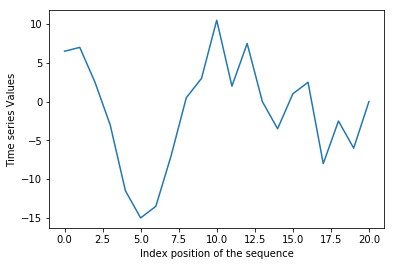

In [97]:

plt.plot(pad_arr2_Order1_TS1[0][1:])
plt.xlabel('Index position of the sequence')
plt.ylabel('Time series Values')

Text(0,0.5,'Numeric converted Values')

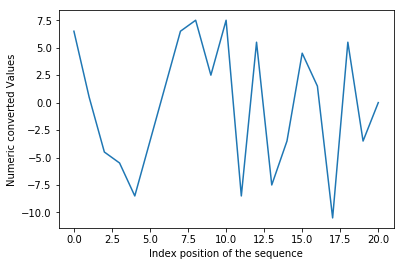

In [98]:

plt.plot(pad_arr2_Order1_TS2[0])
plt.xlabel('Index position of the sequence')
plt.ylabel('Numeric converted Values')

## Distance

### Euclidean

In [113]:
%%time
#DATA1 order1 TS 1  FAST DTW

current_row= 0
compare_row= 0
eucl1_order1_ts1 = []
for current_row in range(0,21):
    dist_values = []
    for comapre_row in range(0,21):
        #print ("current",current_row)
        #print ("comapre",compare_row)
        distance,path = fastdtw(pad_arr1_Order1_TS1[current_row],pad_arr1_Order1_TS1[compare_row],dist=euclidean) 
        #print(distance)
        dist_values.append(distance)
        compare_row=compare_row+1
    eucl1_order1_ts1.append(dist_values)
    current_row=current_row+1
    compare_row=0
    

df_eucl1_order1_ts1 =  pd.DataFrame(eucl1_order1_ts1)
print(df_eucl1_order1_ts1)

         0      1      2      3      4      5      6      7      8      9  \
0    0.0    230.5  190.0  80.5   74.0   226.5  24.5   236.5  24.5   278.0   
1    230.5  0.0    25.0   196.5  181.0  416.5  218.5  426.5  228.5  66.0    
2    190.0  25.0   0.0    160.5  159.5  376.5  194.5  386.5  204.5  104.0   
3    80.5   196.5  160.5  0.0    3.5    248.5  73.5   258.5  59.5   276.0   
4    74.0   181.0  159.5  3.5    0.0    241.0  65.5   251.0  55.5   260.5   
5    226.5  416.5  376.5  248.5  241.0  0.0    233.0  7.5    230.0  517.5   
6    24.5   218.5  194.5  73.5   65.5   233.0  0.0    243.0  10.0   297.5   
7    236.5  426.5  386.5  258.5  251.0  7.5    243.0  0.0    240.0  527.5   
8    24.5   228.5  204.5  59.5   55.5   230.0  10.0   240.0  0.0    307.5   
9    278.0  66.0   104.0  276.0  260.5  517.5  297.5  527.5  307.5  0.0     
10   293.0  137.0  147.5  285.5  270.0  520.0  312.5  530.0  322.5  88.0    
11   101.5  239.0  214.0  120.0  122.5  194.0  121.0  204.0  104.5  335.5   

In [115]:
%%time
#DATA1 order2 TS 1  FAST DTW

current_row= 0
compare_row= 0
eucl1_order2_ts1 = []
for current_row in range(0,21): #only considering 21 sequences, since it takes time to compute
    dist_values = []
    for comapre_row in range(0,21):
        #print ("current",current_row)
        #print ("comapre",compare_row)
        distance,path = fastdtw(pad_arr1_Order2_TS1[current_row],pad_arr1_Order2_TS1[compare_row],dist=euclidean) 
        #print(distance)
        dist_values.append(distance)
        compare_row=compare_row+1
    eucl1_order2_ts1.append(dist_values)
    current_row=current_row+1
    compare_row=0
    

df_eucl1_order2_ts1 =  pd.DataFrame(eucl1_order2_ts1)
print(df_eucl1_order2_ts1)

        0      1      2      3      4      5      6      7      8      9  \
0   0.0    199.0  173.5  59.0   53.5   273.0  39.5   285.0  27.0   275.0   
1   199.0  0.0    25.5   135.5  135.0  549.0  232.0  561.0  220.0  91.0    
2   173.5  25.5   0.0    116.5  122.0  497.5  200.5  509.5  188.5  106.5   
3   59.0   135.5  116.5  0.0    5.5    335.0  98.5   347.0  86.0   231.0   
4   53.5   135.0  122.0  5.5    0.0    329.5  93.0   341.5  80.5   229.0   
5   273.0  549.0  497.5  335.0  329.5  0.0    209.5  11.0   235.5  789.5   
6   39.5   232.0  200.5  98.5   93.0   209.5  0.0    221.5  11.0   325.0   
7   285.0  561.0  509.5  347.0  341.5  11.0   221.5  0.0    247.5  801.5   
8   27.0   220.0  188.5  86.0   80.5   235.5  11.0   247.5  0.0    313.0   
9   275.0  91.0   106.5  231.0  229.0  789.5  325.0  801.5  313.0  0.0     
10  386.0  193.0  201.0  328.5  323.0  975.5  446.5  987.5  434.5  99.5    
11  117.0  80.5   89.5   106.0  107.0  461.5  155.0  473.5  143.0  143.0   
12  93.0   2

In [137]:
%%time
#DATA1 order3 TS 1  FAST DTW

current_row= 0
compare_row= 0
eucl1_order3_ts1 = []
for current_row in range(0,21):
    dist_values = []
    for comapre_row in range(0,21):
        #print ("current",current_row)
        #print ("comapre",compare_row)
        distance,path = fastdtw(pad_arr1_Order3_TS1[current_row],pad_arr1_Order3_TS1[compare_row],dist=euclidean) 
        #print(distance)
        dist_values.append(distance)
        compare_row=compare_row+1
    eucl1_order3_ts1.append(dist_values)
    current_row=current_row+1
    compare_row=0
    

df_eucl1_order3_ts1 =  pd.DataFrame(eucl1_order3_ts1)
print(df_eucl1_order3_ts1)


        0      1      2      3      4      5      6      7      8      9  \
0   0.0    151.5  97.0   50.0   50.5   108.0  68.5   100.5  60.5   152.0   
1   151.5  0.0    68.0   153.0  144.5  223.0  89.5   197.5  100.0  85.5    
2   97.0   68.0   0.0    94.5   87.5   139.0  98.5   126.0  89.5   98.5    
3   50.0   153.0  94.5   0.0    3.5    111.5  95.0   99.5   87.0   139.0   
4   50.5   144.5  87.5   3.5    0.0    113.5  88.0   103.0  80.0   130.5   
5   108.0  223.0  139.0  111.5  113.5  0.0    164.0  7.0    156.0  193.0   
6   68.5   89.5   98.5   95.0   88.0   164.0  0.0    141.0  7.0    95.5    
7   100.5  197.5  126.0  99.5   103.0  7.0    141.0  0.0    133.0  170.0   
8   60.5   100.0  89.5   87.0   80.0   156.0  7.0    133.0  0.0    95.5    
9   152.0  85.5   98.5   139.0  130.5  193.0  95.5   170.0  95.5   0.0     
10  43.5   121.0  81.0   56.5   49.0   136.5  62.5   126.0  54.5   118.0   
11  144.0  268.0  173.0  192.5  184.5  117.0  238.0  125.0  230.0  238.0   
12  126.0  2

In [117]:
%%time
#DATA1 order1 TS 2  FAST DTW

current_row= 0
compare_row= 0
eucl1_order1_ts2 = []
for current_row in range(0,21):
    dist_values = []
    for comapre_row in range(0,21):
        #print ("current",current_row)
        #print ("comapre",compare_row)
        distance,path = fastdtw(pad_arr1_Order1_TS2[current_row],pad_arr1_Order1_TS2[compare_row],dist=euclidean) 
        #print(distance)
        dist_values.append(distance)
        compare_row=compare_row+1
    eucl1_order1_ts2.append(dist_values)
    current_row=current_row+1
    compare_row=0
    

df_eucl1_order1_ts2 =  pd.DataFrame(eucl1_order1_ts2)
print(df_eucl1_order1_ts2)

       0     1     2     3     4     5     6     7     8     9     10     11  \
0   0.0   14.0  14.0  3.0   3.0   16.0  8.0   21.0  3.0   19.0  25.0   78.5    
1   14.0  0.0   4.0   11.0  11.0  28.0  20.0  33.0  15.0  5.0   17.0   92.5    
2   14.0  4.0   0.0   11.0  11.0  24.0  16.0  29.0  11.0  9.0   13.0   88.5    
3   3.0   11.0  11.0  0.0   0.0   19.0  11.0  24.0  6.0   16.0  22.0   79.0    
4   3.0   11.0  11.0  0.0   0.0   19.0  11.0  24.0  6.0   16.0  22.0   75.5    
5   16.0  28.0  24.0  19.0  19.0  0.0   18.0  5.0   13.0  33.0  37.0   90.5    
6   8.0   20.0  16.0  11.0  11.0  18.0  0.0   13.0  5.0   25.0  19.0   81.5    
7   21.0  33.0  29.0  24.0  24.0  5.0   13.0  0.0   18.0  38.0  32.0   94.5    
8   3.0   15.0  11.0  6.0   6.0   13.0  5.0   18.0  0.0   20.0  24.0   77.5    
9   19.0  5.0   9.0   16.0  16.0  33.0  25.0  38.0  20.0  0.0   22.0   97.5    
10  25.0  17.0  13.0  22.0  22.0  37.0  19.0  32.0  24.0  22.0  0.0    104.5   
11  78.5  92.5  88.5  79.0  75.5  90.5  

In [118]:
%%time
#DATA1 order2 TS 2  FAST DTW

current_row= 0
compare_row= 0
eucl1_order2_ts2 = []
for current_row in range(0,21):
    dist_values = []
    for comapre_row in range(0,21):
        #print ("current",current_row)
        #print ("comapre",compare_row)
        distance,path = fastdtw(pad_arr1_Order2_TS2[current_row],pad_arr1_Order2_TS2[compare_row],dist=euclidean) 
        #print(distance)
        dist_values.append(distance)
        compare_row=compare_row+1
    eucl1_order2_ts2.append(dist_values)
    current_row=current_row+1
    compare_row=0
    

df_eucl1_order2_ts2 =  pd.DataFrame(eucl1_order2_ts2)
print(df_eucl1_order2_ts2)

       0     1     2     3     4     5     6     7     8     9    10    11  \
0   0.0   23.0  24.0  2.0   2.0   26.0  18.0  32.0  12.0  29.0  26.0  56.0   
1   23.0  0.0   3.0   21.0  21.0  29.0  21.0  35.0  15.0  6.0   23.0  80.5   
2   24.0  3.0   0.0   22.0  22.0  26.0  18.0  32.0  12.0  9.0   20.0  77.5   
3   2.0   21.0  22.0  0.0   0.0   28.0  20.0  34.0  14.0  27.0  24.0  71.0   
4   2.0   21.0  22.0  0.0   0.0   28.0  20.0  34.0  14.0  27.0  24.0  54.0   
5   26.0  29.0  26.0  28.0  28.0  0.0   20.0  6.0   14.0  35.0  46.0  83.5   
6   18.0  21.0  18.0  20.0  20.0  20.0  0.0   14.0  6.0   27.0  26.0  72.5   
7   32.0  35.0  32.0  34.0  34.0  6.0   14.0  0.0   20.0  41.0  40.0  86.5   
8   12.0  15.0  12.0  14.0  14.0  14.0  6.0   20.0  0.0   21.0  32.0  69.5   
9   29.0  6.0   9.0   27.0  27.0  35.0  27.0  41.0  21.0  0.0   29.0  86.5   
10  26.0  23.0  20.0  24.0  24.0  46.0  26.0  40.0  32.0  29.0  0.0   82.5   
11  56.0  80.5  77.5  71.0  54.0  83.5  72.5  86.5  69.5  86.5  

In [119]:
%%time
#DATA1 order3 TS 2  FAST DTW

current_row= 0
compare_row= 0
eucl1_order3_ts2 = []
for current_row in range(0,21):
    dist_values = []
    for comapre_row in range(0,21):
        #print ("current",current_row)
        #print ("comapre",compare_row)
        distance,path = fastdtw(pad_arr1_Order3_TS2[current_row],pad_arr1_Order3_TS2[compare_row],dist=euclidean) 
        #print(distance)
        dist_values.append(distance)
        compare_row=compare_row+1
    eucl1_order3_ts2.append(dist_values)
    current_row=current_row+1
    compare_row=0
    

df_eucl1_order3_ts2 =  pd.DataFrame(eucl1_order3_ts2)
print(df_eucl1_order3_ts2)

       0     1     2     3     4     5     6     7     8     9    10    11  \
0   0.0   19.0  11.0  2.0   2.0   18.0  7.0   22.0  3.0   23.0  21.0  45.0   
1   19.0  0.0   7.0   17.0  17.0  30.0  19.0  34.0  15.0  4.0   20.0  51.0   
2   11.0  7.0   0.0   9.0   9.0   23.0  12.0  27.0  8.0   11.0  12.0  78.5   
3   2.0   17.0  9.0   0.0   0.0   20.0  9.0   24.0  5.0   21.0  19.0  78.0   
4   2.0   17.0  9.0   0.0   0.0   20.0  9.0   24.0  5.0   21.0  19.0  43.0   
5   18.0  30.0  23.0  20.0  20.0  0.0   19.0  4.0   15.0  34.0  35.0  89.5   
6   7.0   19.0  12.0  9.0   9.0   19.0  0.0   15.0  4.0   23.0  16.0  75.5   
7   22.0  34.0  27.0  24.0  24.0  4.0   15.0  0.0   19.0  38.0  31.0  90.5   
8   3.0   15.0  8.0   5.0   5.0   15.0  4.0   19.0  0.0   19.0  20.0  74.5   
9   23.0  4.0   11.0  21.0  21.0  34.0  23.0  38.0  19.0  0.0   24.0  72.5   
10  21.0  20.0  12.0  19.0  19.0  35.0  16.0  31.0  20.0  24.0  0.0   46.0   
11  45.0  51.0  78.5  78.0  43.0  89.5  75.5  90.5  74.5  72.5  

In [120]:
%%time
#DATA2 order1 TS 1  FAST DTW

current_row= 0
compare_row= 0
eucl2_order1_ts1 = []
for current_row in range(0,len(pad_arr2_Order1_TS1)):
    dist_values = []
    for comapre_row in range(0,len(pad_arr2_Order1_TS1)):
        #print ("current",current_row)
        #print ("comapre",compare_row)
        distance,path = fastdtw(pad_arr2_Order1_TS1[current_row],pad_arr2_Order1_TS1[compare_row],dist=euclidean) 
        #print(distance)
        dist_values.append(distance)
        compare_row=compare_row+1
    eucl2_order1_ts1.append(dist_values)
    current_row=current_row+1
    compare_row=0
    

df_eucl2_order1_ts1 =  pd.DataFrame(eucl2_order1_ts1)
print(df_eucl2_order1_ts1)

        0      1      2      3      4      5      6      7      8      9  \
0   0.0    160.0  189.5  351.0  124.5  110.5  339.5  123.5  186.0  182.5   
1   160.0  0.0    269.5  566.0  244.0  151.0  551.0  17.0   130.0  105.5   
2   189.5  269.5  0.0    175.0  60.5   88.5   161.0  252.5  133.5  157.5   
3   351.0  566.0  175.0  0.0    190.5  263.5  14.0   526.0  277.0  338.5   
4   124.5  244.0  60.5   190.5  0.0    70.5   179.5  232.0  74.0   134.0   
5   110.5  151.0  88.5   263.5  70.5   0.0    256.5  139.0  95.0   66.0    
6   339.5  551.0  161.0  14.0   179.5  256.5  0.0    511.0  273.0  331.5   
7   123.5  17.0   252.5  526.0  232.0  139.0  511.0  0.0    121.5  109.0   
8   186.0  130.0  133.5  277.0  74.0   95.0   273.0  121.5  0.0    77.0    
9   182.5  105.5  157.5  338.5  134.0  66.0   331.5  109.0  77.0   0.0     
10  171.0  139.5  118.5  262.0  59.0   86.0   258.0  136.5  15.0   82.5    
11  113.5  235.5  79.5   176.5  51.0   68.0   164.5  220.0  112.0  133.5   
12  166.5  3

In [114]:
%%time
#DATA2 order2 TS 1  FAST DTW

current_row= 0
compare_row= 0
eucl2_order2_ts1 = []
for current_row in range(0,len(pad_arr2_Order2_TS1)):
    dist_values = []
    for comapre_row in range(0,len(pad_arr2_Order2_TS1)):
        #print ("current",current_row)
        #print ("comapre",compare_row)
        distance,path = fastdtw(pad_arr2_Order2_TS1[current_row],pad_arr2_Order2_TS1[compare_row],dist=euclidean) 
        #print(distance)
        dist_values.append(distance)
        compare_row=compare_row+1
    eucl2_order2_ts1.append(dist_values)
    current_row=current_row+1
    compare_row=0
    

df_eucl2_order2_ts1 =  pd.DataFrame(eucl2_order2_ts1)
print(df_eucl2_order2_ts1)

        0      1      2      3      4      5      6      7      8      9  \
0   0.0    133.0  142.5  124.0  275.0  74.5   92.5   174.0  183.5  93.0    
1   133.0  0.0    222.5  60.0   102.0  94.0   72.0   16.0   78.0   116.5   
2   142.5  222.5  0.0    230.0  367.5  179.0  185.5  262.5  300.5  115.0   
3   124.0  60.0   230.0  0.0    116.0  87.5   38.0   52.0   86.5   119.0   
4   275.0  102.0  367.5  116.0  0.0    193.5  144.0  73.5   42.5   208.5   
5   74.5   94.0   179.0  87.5   193.5  0.0    76.0   115.0  107.0  55.0    
6   92.5   72.0   185.5  38.0   144.0  76.0   0.0    82.5   100.0  82.0    
7   174.0  16.0   262.5  52.0   73.5   115.0  82.5   0.0    54.0   136.0   
8   183.5  78.0   300.5  86.5   42.5   107.0  100.0  54.0   0.0    144.5   
9   93.0   116.5  115.0  119.0  208.5  55.0   82.0   136.0  144.5  0.0     
10  187.5  70.5   300.0  82.5   44.5   116.5  94.0   53.0   10.0   148.0   
11  40.0   141.0  139.5  125.0  274.5  56.5   93.0   181.0  185.0  76.0    
12  76.5   1

In [101]:
%%time
#DATA2 order3 TS 1  FAST DTW

current_row= 0
compare_row= 0
eucl2_order3_ts1 = []
for current_row in range(0,len(pad_arr2_Order3_TS1)):
    dist_values = []
    for comapre_row in range(0,len(pad_arr2_Order3_TS1)):
        #print ("current",current_row)
        #print ("comapre",compare_row)
        distance,path = fastdtw(pad_arr2_Order3_TS1[current_row],pad_arr2_Order3_TS1[compare_row],dist=euclidean) 
        #print(distance)
        dist_values.append(distance)
        compare_row=compare_row+1
    eucl2_order3_ts1.append(dist_values)
    current_row=current_row+1
    compare_row=0
    

df_eucl2_order3_ts1 =  pd.DataFrame(eucl2_order3_ts1)
print(df_eucl2_order3_ts1)

        0      1      2      3      4      5      6      7      8      9  \
0   0.0    64.5   143.5  70.5   102.0  49.5   88.5   57.5   69.5   66.5    
1   64.5   0.0    136.5  45.0   103.0  57.5   99.5   10.0   76.5   58.5    
2   143.5  136.5  0.0    130.0  78.0   126.5  126.0  134.5  78.0   124.0   
3   70.5   45.0   130.0  0.0    112.5  60.0   58.0   39.5   83.5   70.0    
4   102.0  103.0  78.0   112.5  0.0    104.5  61.0   105.5  34.0   127.5   
5   49.5   57.5   126.5  60.0   104.5  0.0    76.5   58.5   67.5   26.5    
6   88.5   99.5   126.0  58.0   61.0   76.5   0.0    100.0  72.5   107.5   
7   57.5   10.0   134.5  39.5   105.5  58.5   100.0  0.0    75.5   58.5    
8   69.5   76.5   78.0   83.5   34.0   67.5   72.5   75.5   0.0    86.5    
9   66.5   58.5   124.0  70.0   127.5  26.5   107.5  58.5   86.5   0.0     
10  69.0   87.5   83.5   90.5   28.5   78.5   72.5   78.0   10.0   90.5    
11  63.5   14.5   139.5  43.0   117.0  47.0   97.5   24.5   90.5   48.0    
12  245.5  2

In [102]:
%%time
#DATA2 order1 TS 2  FAST DTW

current_row= 0
compare_row= 0
eucl2_order1_ts2 = []
for current_row in range(0,len(pad_arr2_Order1_TS2)):
    dist_values = []
    for comapre_row in range(0,len(pad_arr2_Order1_TS2)):
        #print ("current",current_row)
        #print ("comapre",compare_row)
        distance,path = fastdtw(pad_arr2_Order1_TS2[current_row],pad_arr2_Order1_TS2[compare_row],dist=euclidean) 
        #print(distance)
        dist_values.append(distance)
        compare_row=compare_row+1
    eucl2_order1_ts2.append(dist_values)
    current_row=current_row+1
    compare_row=0
    

df_eucl2_order1_ts2 =  pd.DataFrame(eucl2_order1_ts2)
print(df_eucl2_order1_ts2)

       0     1     2     3     4     5     6     7     8     9    10    11  \
0   0.0   29.0  54.5  43.0  40.0  53.0  67.0  28.0  51.0  63.0  48.0  55.0   
1   29.0  0.0   43.5  54.0  37.0  24.0  64.0  25.0  22.0  34.0  19.0  32.0   
2   54.5  43.5  0.0   49.5  38.5  57.5  61.5  30.5  41.5  47.5  44.5  61.5   
3   43.0  54.0  49.5  0.0   28.0  50.0  25.0  37.0  35.0  40.0  38.0  54.0   
4   40.0  37.0  38.5  28.0  0.0   41.0  53.0  12.0  15.0  31.0  18.0  47.0   
5   53.0  24.0  57.5  50.0  41.0  0.0   60.0  49.0  26.0  10.0  23.0  6.0    
6   67.0  64.0  61.5  25.0  53.0  60.0  0.0   62.0  43.0  48.0  46.0  64.0   
7   28.0  25.0  30.5  37.0  12.0  49.0  62.0  0.0   27.0  39.0  30.0  57.0   
8   51.0  22.0  41.5  35.0  15.0  26.0  43.0  27.0  0.0   16.0  3.0   32.0   
9   63.0  34.0  47.5  40.0  31.0  10.0  48.0  39.0  16.0  0.0   19.0  16.0   
10  48.0  19.0  44.5  38.0  18.0  23.0  46.0  30.0  3.0   19.0  0.0   29.0   
11  55.0  32.0  61.5  54.0  47.0  6.0   64.0  57.0  32.0  16.0  

In [104]:
%%time
#DATA2 order2 TS 2  FAST DTW

current_row= 0
compare_row= 0
eucl2_order2_ts2 = []
for current_row in range(0,len(pad_arr2_Order2_TS2)):
    dist_values = []
    for comapre_row in range(0,len(pad_arr2_Order2_TS2)):
        #print ("current",current_row)
        #print ("comapre",compare_row)
        distance,path = fastdtw(pad_arr2_Order2_TS2[current_row],pad_arr2_Order2_TS2[compare_row],dist=euclidean) 
        #print(distance)
        dist_values.append(distance)
        compare_row=compare_row+1
    eucl2_order2_ts2.append(dist_values)
    current_row=current_row+1
    compare_row=0
    

df_eucl2_order2_ts2 =  pd.DataFrame(eucl2_order2_ts2)
print(df_eucl2_order2_ts2)

       0     1     2     3     4     5     6     7     8     9    10    11  \
0   0.0   40.0  78.0  50.0  52.0  51.0  65.0  46.0  56.0  61.0  54.0  52.0   
1   40.0  0.0   52.5  51.0  31.0  14.0  57.0  25.0  16.0  24.0  14.0  24.0   
2   78.0  52.5  0.0   72.5  58.5  60.5  57.5  54.5  46.5  50.5  48.5  58.5   
3   50.0  51.0  72.5  0.0   29.0  41.0  16.0  31.0  44.0  36.0  46.0  40.0   
4   52.0  31.0  58.5  29.0  0.0   41.0  45.0  6.0   15.0  31.0  17.0  46.0   
5   51.0  14.0  60.5  41.0  41.0  0.0   47.0  39.0  26.0  10.0  24.0  5.0    
6   65.0  57.0  57.5  16.0  45.0  47.0  0.0   47.0  44.0  36.0  46.0  46.0   
7   46.0  25.0  54.5  31.0  6.0   39.0  47.0  0.0   21.0  29.0  23.0  49.0   
8   56.0  16.0  46.5  44.0  15.0  26.0  44.0  21.0  0.0   16.0  2.0   31.0   
9   61.0  24.0  50.5  36.0  31.0  10.0  36.0  29.0  16.0  0.0   18.0  15.0   
10  54.0  14.0  48.5  46.0  17.0  24.0  46.0  23.0  2.0   18.0  0.0   29.0   
11  52.0  24.0  58.5  40.0  46.0  5.0   46.0  49.0  31.0  15.0  

In [105]:
%%time
#DATA2 order3 TS 2  FAST DTW

current_row= 0
compare_row= 0
eucl2_order3_ts2 = []
for current_row in range(0,len(pad_arr2_Order3_TS2)):
    dist_values = []
    for comapre_row in range(0,len(pad_arr2_Order3_TS2)):
        #print ("current",current_row)
        #print ("comapre",compare_row)
        distance,path = fastdtw(pad_arr2_Order3_TS2[current_row],pad_arr2_Order3_TS2[compare_row],dist=euclidean) 
        #print(distance)
        dist_values.append(distance)
        compare_row=compare_row+1
    eucl2_order3_ts2.append(dist_values)
    current_row=current_row+1
    compare_row=0
    

df_eucl2_order3_ts2 =  pd.DataFrame(eucl2_order3_ts2)
print(df_eucl2_order3_ts2)

       0     1     2     3     4     5     6     7     8     9    10    11  \
0   0.0   40.0  78.0  50.0  52.0  51.0  65.0  46.0  56.0  61.0  54.0  52.0   
1   40.0  0.0   52.5  51.0  31.0  14.0  57.0  25.0  16.0  24.0  14.0  24.0   
2   78.0  52.5  0.0   72.5  58.5  60.5  57.5  54.5  46.5  50.5  48.5  58.5   
3   50.0  51.0  72.5  0.0   29.0  41.0  16.0  31.0  44.0  36.0  46.0  40.0   
4   52.0  31.0  58.5  29.0  0.0   41.0  45.0  6.0   15.0  31.0  17.0  46.0   
5   51.0  14.0  60.5  41.0  41.0  0.0   47.0  39.0  26.0  10.0  24.0  5.0    
6   65.0  57.0  57.5  16.0  45.0  47.0  0.0   47.0  44.0  36.0  46.0  46.0   
7   46.0  25.0  54.5  31.0  6.0   39.0  47.0  0.0   21.0  29.0  23.0  49.0   
8   56.0  16.0  46.5  44.0  15.0  26.0  44.0  21.0  0.0   16.0  2.0   31.0   
9   61.0  24.0  50.5  36.0  31.0  10.0  36.0  29.0  16.0  0.0   18.0  15.0   
10  54.0  14.0  48.5  46.0  17.0  24.0  46.0  23.0  2.0   18.0  0.0   29.0   
11  52.0  24.0  58.5  40.0  46.0  5.0   46.0  49.0  31.0  15.0  

### EDIT DISTANCE

In [106]:
data1csv = pd.read_csv('data1.csv',header=None,usecols=[1])
data2csv = pd.read_csv('data2.csv',header=None,usecols=[1])


In [136]:
%%time
#DATA1
current_row= 1
compare_row= 1
leven1_order1_ts1 = []
for current_row in range(1,len(pad_arr1_Order1_TS1)+1):
    dist_values = []
    for comapre_row in range(1,len(pad_arr1_Order1_TS1)+1):
        #print ("current",current_row)
        #print ("comapre",compare_row)
        levin_distance = distance.levenshtein(data1csv[1].iloc[current_row],data1csv[1].iloc[compare_row]) 
        #print(levin_distance)
        dist_values.append(levin_distance)
        compare_row=compare_row+1
    leven1_order1_ts1.append(dist_values)
    current_row=current_row+1
    compare_row=1
    
df_leven1 =  pd.DataFrame(leven1_order1_ts1)
print (df_leven1)

      0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  \
0    0   4   4   2   1   3   3   4   2   5   6   10  7   2   4   5   5   2    
1    4   0   1   4   3   3   4   4   3   1   5   9   5   3   3   2   2   2    
2    4   1   0   4   3   2   3   3   2   2   4   8   4   4   2   1   3   2    
3    2   4   4   0   1   4   5   5   4   5   6   10  8   3   4   5   5   2    
4    1   3   3   1   0   3   4   4   3   4   5   9   7   2   3   4   4   1    
5    3   3   2   4   3   0   2   1   1   4   6   8   4   2   2   3   5   4    
6    3   4   3   5   4   2   0   1   1   5   5   9   6   4   3   3   6   5    
7    4   4   3   5   4   1   1   0   2   5   5   9   5   3   3   3   6   5    
8    2   3   2   4   3   1   1   2   0   4   6   8   5   3   2   3   5   4    
9    5   1   2   5   4   4   5   5   4   0   6   10  6   4   4   3   3   3    
10   6   5   4   6   5   6   5   5   6   6   0   11  6   6   6   4   6   4    
11   10  9   8   10  9   8   9   9   8   10  11  0  

In [110]:
#DATA2
current_row= 1
compare_row= 1
leven2_order1_ts1 = []
for current_row in range(1,len(pad_arr2_Order1_TS1)+1):
    dist_values = []
    for comapre_row in range(1,len(pad_arr2_Order1_TS1)+1):
        #print ("current",current_row)
        #print ("comapre",compare_row)
        levin_distance = distance.levenshtein(data2csv[1].iloc[current_row],data2csv[1].iloc[compare_row]) 
        #print(levin_distance)
        dist_values.append(levin_distance)
        compare_row=compare_row+1
    leven2_order1_ts1.append(dist_values)
    current_row=current_row+1
    compare_row=1

    
df_leven2_order1_ts1 =  pd.DataFrame(leven2_order1_ts1)
df_leven2_order1_ts1

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20
0,0,7,15,11,8,8,14,8,8,9,8,9,14,13,1,8,9,8,9,9,15
1,7,0,12,9,3,3,13,2,2,4,2,4,11,12,8,1,6,4,3,4,12
2,15,12,0,11,12,11,12,12,11,10,12,11,3,15,15,11,11,11,11,12,1
3,11,9,11,0,7,7,5,7,8,6,9,7,13,8,12,8,5,7,8,7,11
4,8,3,12,7,0,5,12,1,1,4,2,6,13,13,9,2,4,2,2,1,12
5,8,3,11,7,5,0,11,5,4,1,4,1,10,12,9,4,3,6,4,5,11
6,14,13,12,5,12,11,0,12,12,10,13,11,14,3,14,12,10,11,12,12,12
7,8,2,12,7,1,5,12,0,2,4,3,6,13,13,9,1,4,3,3,2,12
8,8,2,11,8,1,4,12,2,0,3,1,5,12,13,9,1,5,2,1,2,11
9,9,4,10,6,4,1,10,4,3,0,4,2,11,13,10,3,2,5,3,4,10


## Sequence matcher

In [121]:
from difflib import SequenceMatcher

In [128]:
print(pad_arr1_Order1_TS1[0][1:])
print(pad_arr1_Order1_TS1[1][1:])
sm_data1_test1 = SequenceMatcher(None,pad_arr1_Order1_TS1[0][1:],pad_arr1_Order1_TS1[1][1:])
sm_data1_test1.ratio()*100

[ -7.5 -15.  -10.5  -6.   -1.5 -12.   -7.5 -11.  -15.5 -20.  -24.5 -30.
 -25.5 -21.  -12.5  -8.   -3.5  -8.   -3.5  -9.  -19.5 -15.   -9.5  -5.
  -0.5  -5.   -5.5  -9.    0.    0.    0. ]
[-10.5 -18.  -13.5  -9.   -4.5 -15.  -18.5 -22.  -26.5 -31.  -35.5 -41.
 -36.5 -32.  -23.5 -19.  -14.5 -19.  -14.5 -22.  -26.5 -37.  -32.5 -27.
 -22.5 -18.  -22.5 -23.  -26.5   0.    0. ]


9.67741935483871

In [129]:
print(pad_arr1_Order2_TS1[0][1:])
print(pad_arr1_Order2_TS1[1][1:])
sm_data1_test1 = SequenceMatcher(None,pad_arr1_Order2_TS1[0][1:],pad_arr1_Order2_TS1[1][1:])
sm_data1_test1.ratio()*100

[ -8.5 -17.  -12.5  -8.   -3.5 -14.   -9.5 -15.  -12.5 -10.   -7.5 -15.
 -10.5  -6.    0.5   5.    9.5  12.   16.5   9.   -1.5   3.    8.5  13.
  17.5  20.   18.5  13.    0.    0.    0. ]
[-10.5 -19.  -14.5 -10.   -5.5 -16.  -21.5 -27.  -24.5 -22.  -19.5 -27.
 -22.5 -18.  -11.5  -7.   -2.5   0.    4.5  -4.   -1.5 -12.   -7.5  -2.
   2.5   7.    9.5   8.    2.5   0.    0. ]


16.129032258064516

In [130]:
print(pad_arr1_Order3_TS1[0][1:])
print(pad_arr1_Order3_TS1[1][1:])
sm_data1_test1 = SequenceMatcher(None,pad_arr1_Order3_TS1[0][1:],pad_arr1_Order3_TS1[1][1:])
sm_data1_test1.ratio()*100

[ 6.5 13.  15.5 18.  20.5 29.  31.5 28.  35.5 43.  50.5 45.  47.5 50.
 39.5 42.  44.5 52.  54.5 49.  57.5 60.  51.5 54.  56.5 64.  62.5 59.
  0.   0.   0. ]
[ 8.5 15.  17.5 20.  22.5 31.  27.5 24.  31.5 39.  46.5 41.  43.5 46.
 35.5 38.  40.5 48.  50.5 57.  64.5 73.  75.5 67.  69.5 72.  79.5 78.
 74.5  0.   0. ]


16.129032258064516

# Plots for distance comaprision

In [140]:
# plot for comapring Seq 0 distance values of order 3 with Edit distance values of the same sequence 
'''
fig, ax = plt.subplots()
x = df_eucl1_order3_ts1[0]
ax.plot(x, 'b')
ax.set_xlabel('Sequence 0')
ax.set_ylabel('Euclidean Distance')
plt.legend('Eucl')
ax2 = ax.twinx()

ax2.plot(df_leven1[0], 'g')
plt.legend('Leven')
ax2.set_ylabel('Levenshtein Distance')

fig.tight_layout()  # otherwise the right y-label is slightly clipped

plt.show()
'''

"\nfig, ax = plt.subplots()\nx = df_eucl1_order3_ts1[0]\nax.plot(x, 'b')\nax.set_xlabel('Sequence 0')\nax.set_ylabel('Euclidean Distance')\nplt.legend('Eucl')\nax2 = ax.twinx()\n\nax2.plot(df_leven1[0], 'g')\nplt.legend('Leven')\nax2.set_ylabel('Levenshtein Distance')\n\nfig.tight_layout()  # otherwise the right y-label is slightly clipped\n\nplt.show()\n"

In [139]:
# plot for comapring Seq 1 distance values of order 3 with Edit distance values of the same sequence  
'''
fig, ax = plt.subplots()
x = df_eucl1_order3_ts1[1]
ax.plot(x, 'b')
ax.set_xlabel('Sequence 0')
ax.set_ylabel('Euclidean Distance')
plt.legend('Eucl')
ax2 = ax.twinx()

ax2.plot(df_leven1[1], 'g')
plt.legend('Leven')
ax2.set_ylabel('Levenshtein Distance')

fig.tight_layout()  # otherwise the right y-label is slightly clipped

plt.show()
'''

"\nfig, ax = plt.subplots()\nx = df_eucl1_order3_ts1[1]\nax.plot(x, 'b')\nax.set_xlabel('Sequence 0')\nax.set_ylabel('Euclidean Distance')\nplt.legend('Eucl')\nax2 = ax.twinx()\n\nax2.plot(df_leven1[1], 'g')\nplt.legend('Leven')\nax2.set_ylabel('Levenshtein Distance')\n\nfig.tight_layout()  # otherwise the right y-label is slightly clipped\n\nplt.show()\n"